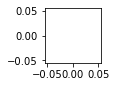

In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
# force plt on windows 10
import matplotlib.pyplot as plt
plt.figure(figsize=(1,1))
plt.plot()

import sys
sys.path.append("..")

import torch
import torch.nn as nn
import numpy as np
import aggets.ds.window as window
import aggets.ds.hyper_f_load as hfl
import aggets.ds.window as window

## DISABLE THIS
import warnings
warnings.filterwarnings("ignore")

In [2]:
def plot(set_type, model, wg, axs, ylim=None):
    rolling = 300 if set_type == 'train' else 100
    aucs = wg.plot(model=model, model_data_fn=None, last_train=False, lr0=False, lr_t0=True,  # set_type=='train',
                   set_type=set_type, no_lr=False, model_resid=False, rolling=rolling, axs=axs,
                   plot_box_auc=False, lr_tn=10, train=0.5)

    vals = {}
    for key in aucs:
        if '=' in key:
            into = key[key.index('=') - 1:]
        else:
            into = key
        arr = vals.get(into, [])
        arr.append(np.mean(aucs[key].to_numpy()))
        vals[into] = arr
    if ylim is not None:
        plt.ylim(*ylim)
    plt.sca(axs[-1])
    plt.boxplot(list(vals.values()), showfliers=True)
    plt.xticks(range(1, len(vals.keys()) + 1), vals.keys(), rotation=90)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.ylabel('AUC')

In [3]:
# import torch.nn.functional as F
# import math

# def d(yhat, lr):
#     return F.mse_loss(yhat, lr)

# def d_sqrt(yhat, lr):
#     return math.sqrt(d(yhat, lr))
# alpha = 0.1
# # custom_criterion = \
# # lambda yhat, y: d(yhat, y[1]) + max(0., (1./d(yhat, y[0]) - 1./d(y[1], y[0])))
# # custom_criterion = \
# # lambda yhat, y: d(yhat, y[1])
# custom_criterion = \
# lambda yhat, y: d(yhat, y[1]) + F.sigmoid(d_sqrt(yhat, y[1]) - d_sqrt(y[0], y[1]))
# # custom_criterion = \
# # lambda yhat, y: d(yhat, y[1]) + 0 if d(yhat, y[0]) > d(y[1], y[0]) and d(yhat, y[1]) < d(yhat, y[0]) else alpha*d_sqrt(yhat, y[1]) 

# def criterion(hat, y):
#     yhat, delta = hat
#     return d(yhat, y) / (delta  ** 2).sum(dim=1)
# custom_criterion = criterion
# custom_criterion = \
# lambda yhat, y: d(yhat, y[1]) + F.sigmoid(d_sqrt(yhat, y[1]) - d_sqrt(y[0], y[1]))
# custom_criterion = criterion

In [4]:
import aggets.ds.moving as moving
data = hfl.load_df()
wg = moving.WindowGenerator(data['df'], 10000, label_columns=['class'], sampling=0.01)

In [5]:
import aggets.ds.aggregate3 as aggregate
import aggets.ds.hyper_f_load as hyper_f_load

CONV_WIDTH = 8
LABEL_WIDTH = 57
INPUT_WIDTH = LABEL_WIDTH + (CONV_WIDTH - 1) 

data = hyper_f_load.load()

wg = aggregate.WindowGenerator(chunk_size=500, samples=5, sample_frac=0.8, 
                               input_sequence_length=10,
                               df =  data['df'], # full columns information
                               train_df = data['train'],
                               val_df = data['val'],
                               test_df = data['test'],
                               label_columns=['class'],
                               bin_count=1, discretization=20)

wg_tmp = aggregate.WindowGenerator(chunk_size=500, samples=5, sample_frac=0.8, 
                               input_sequence_length=10,
                               df =  data['df'], # full columns information
                               train_df = data['train'],
                               val_df = data['val'],
                               test_df = data['test'],
                               label_columns=['class'],
                               bin_count=1, discretization=20)

In [6]:
%timeit
# wg.init_structures()


In [7]:
import aggets.util as util
# util.save(wg, path='window_01.bin') # chunk_size=50, samples=10, sample_frac=0.3
# util.save(wg, path='window_02.bin') # chunk_size=100, samples=5, sample_frac=0.8,
# util.save(wg, path='window_03.bin') # chunk_size=500, samples=5, sample_frac=0.8,
# util.save(wg, path='window_04.bin') # chunk_size=500, samples=5, sample_frac=0.8, bin_count=1, discretization=10 (lr trains on data without bins)
# util.save(wg, path='window_05.bin') # chunk_size=500, samples=5, sample_frac=0.8, bin_count=1, discretization=20 (lr trains on data without bins)
# util.save(wg, path='window_06.bin') # chunk_size=500, samples=5, sample_frac=0.8, bin_count=1, discretization=50 (lr trains on data without bins)
# util.save(wg, path='window_07.bin') # chunk_size=500, samples=5, sample_frac=0.8, bin_count=1, discretization=20 (lr trains on data without bins), no normalization of aggregates
# util.save(wg, path='window_08.bin') # chunk_size=500, samples=5, sample_frac=0.8, bin_count=1, discretization=20 (lr trains on data without bins), no normalization of aggregates, density included
wg_tmp.load_data(util.load(path='window_08.bin'))

In [36]:
# print(wg_tmp.train_agges.shape)
# print(wg_tmp.train_lr.shape)
# train_agges = torch.Tensor(np.linspace(0, 203, 204) * -1).repeat(1400, 5, 2, 1)
# wg_tmp.train_agges = train_agges
# train_lr = torch.Tensor(np.linspace(0, 10, 11) * -1).repeat(1400, 5, 1)
# wg_tmp.train_lr = train_lr

In [39]:
wg_tmp.reverse_train = False
wg_tmp.debug_output = False
wg_tmp.mark_type = False
print(wg_tmp.density)
tmp = next(wg_tmp.train)
print(wg_tmp.train_agges.shape, wg_tmp.train_lr.shape)
print(tmp[0][0].shape, tmp[0][1].shape, tmp[1].shape)

True
torch.Size([1400, 5, 2, 204]) torch.Size([1400, 5, 11])
torch.Size([32, 10, 408]) torch.Size([32, 10, 11]) torch.Size([32, 5, 11])


In [10]:
# print(wg_tmp.reverse_train)
# print(tmp[0][0].shape, tmp[0][1].shape, tmp[1].shape)
# # print(tmp[0][0][0, :, 0:3].int())
# # print(tmp[0][0][0, :, 207:210].int())

# # print(tmp[0][0][10, :, 0:3].int())
# # print(tmp[0][0][10, :, 207:210].int())

# print(tmp[0][1][0, 0, :])
# # print(tmp[0][0][10, :, 0:3].int())
# # print(tmp[0][0][10, :, 207:210].int())
# # print(tmp[0][0][0, :, 205])

# # print(tmp[0][1][0, :, 0])
# # print(tmp[1][0, :, 0])

In [11]:
# agg = train_lr

# ids_0 = torch.Tensor(np.linspace(0, train_lr.shape[0] - 1, train_lr.shape[0]))
# ids_1 = torch.Tensor(np.linspace(0, train_lr.shape[1] - 1, train_lr.shape[1]))

# ids_0 = ids_0.repeat(1, train_lr.shape[1], 1).permute(2, 1, 0)
# ids_1 = ids_1.repeat(1, train_lr.shape[0], 1).permute(1, 2, 0)
# torch.cat([ids_0, ids_1, train_lr], dim=-1)
# print(ids_0.shape)
# print(ids_1.shape)



# # ids_0.repeat(5, 2, 1).permute(2, 0)
# # torch.randn(2, 4).permute(1, 0)
# # print(ids_0.repeat(5, 2, 1).shape)
# # print(ids_0.repeat(5, 2, 1).permute(2, 0, 1).shape)

In [12]:
# print(tmp[0][0].shape, tmp[0][1].shape, tmp[1].shape)
# print(tmp[0][0][0, :, 0])
# print(tmp[0][0][0, :, 205])

# print(tmp[0][1][0, :, 0])
# print(tmp[1][0, :, 0])

torch.Size([1400, 5, 2, 204])

In [25]:
# bins=1
# agg_dim = 504
# agg_dim = 204
# agg_dim = wg_tmp.train_agges.shape[2]
# agg_dim = 408
# density = True
# density_encoded = True
# one_row_ts = True
# feat_agg_dim = agg_dim

# wg_tmp.aggregate_slice = slice(0, agg_dim)

# if not density and density_encoded:
#     feat_agg_dim = agg_dim // 2
    
# wg_tmp.source_slice = slice(agg_dim, agg_dim+11)
# wg_tmp.target_slice = slice(agg_dim+11, agg_dim+11+11)
# wg_tmp.density = density
# wg_tmp.one_row_ts = one_row_ts
# wg_tmp.density_encoded = density_encoded
# wg_tmp.label_stride = 55
wg_tmp.density = True
wg_tmp.density_encoded = True
wg_tmp.one_row_ts = True

wg_tmp.reverse_train = False
wg_tmp.shuffle_input = False
wg_tmp.shuffle_output = False
wg_tmp.double_target = False
wg_tmp.train_histograms = False

dim_p = wg_tmp.test_agges.shape[-1]
dim_d = wg_tmp.test_agges.shape[-1]
dim_lr = wg_tmp.test_lr.shape[-1]

In [85]:
import aggets.model.aggregate as m_agg
import aggets.train as train
print(wg_tmp.train_agges.shape)
next(wg_tmp.train)[0][0].shape

torch.Size([1400, 5, 2, 204])


torch.Size([32, 10, 408])

config in=10, out=5
training model lstm[x] h=64,a=5,l=2
using train data set to validate
epoch 0 batch 200 loss=0.0184, MTL=0.0193, MVL=0.0611				
epoch 0 batch 400 loss=0.0175, MTL=0.0188, MVL=0.0611				
saving model MTL=0.018715767353325738, MVL=0.018258840252169974
*epoch 1 batch 600 loss=0.0182, MTL=0.0183, MVL=0.0183				
*epoch 1 batch 800 loss=0.0165, MTL=0.0182, MVL=0.0183				
saving model MTL=0.01824943132818984, MVL=0.018217806119308323
*epoch 2 batch 1000 loss=0.0171, MTL=0.0183, MVL=0.0182				
*epoch 2 batch 1200 loss=0.0171, MTL=0.0177, MVL=0.0182				
saving model MTL=0.017400568753360462, MVL=0.016128361909101798
*epoch 3 batch 1400 loss=0.018, MTL=0.0162, MVL=0.0161				
*epoch 3 batch 1600 loss=0.0154, MTL=0.0161, MVL=0.0161				
saving model MTL=0.01602125733307892, MVL=0.01568134144103417
*epoch 4 batch 1800 loss=0.0133, MTL=0.0155, MVL=0.0157				
*epoch 4 batch 2000 loss=0.0158, MTL=0.0155, MVL=0.0157				
saving model MTL=0.015415618751051794, MVL=0.015221573476944179
*

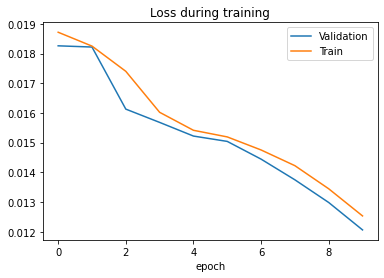

using train data set to validate
epoch 0 batch 200 loss=0.0118, MTL=0.0115, MVL=0.0121				
epoch 0 batch 400 loss=0.0112, MTL=0.0114, MVL=0.0121				
saving model MTL=0.011367426251704367, MVL=0.011213430216402573
*epoch 1 batch 600 loss=0.0106, MTL=0.0112, MVL=0.0112				
*epoch 1 batch 800 loss=0.0107, MTL=0.0112, MVL=0.0112				
saving model MTL=0.011157792104584516, MVL=0.01108423718111482
*epoch 2 batch 1000 loss=0.0115, MTL=0.011, MVL=0.0111				
*epoch 2 batch 1200 loss=0.011, MTL=0.011, MVL=0.0111				
saving model MTL=0.01101588426205151, MVL=0.010923020769659146
*epoch 3 batch 1400 loss=0.0116, MTL=0.011, MVL=0.0109				
*epoch 3 batch 1600 loss=0.0103, MTL=0.0109, MVL=0.0109				
saving model MTL=0.010882848200515154, MVL=0.0107795051030178
*epoch 4 batch 1800 loss=0.0103, MTL=0.0109, MVL=0.0108				
*epoch 4 batch 2000 loss=0.0103, MTL=0.0108, MVL=0.0108				
saving model MTL=0.010755509783365435, MVL=0.010663812952094624
*epoch 5 batch 2200 loss=0.0103, MTL=0.0107, MVL=0.0107				
*

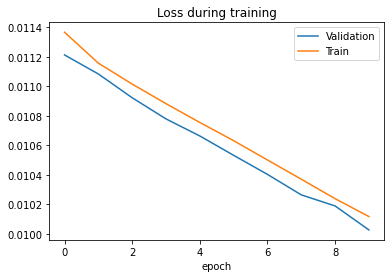

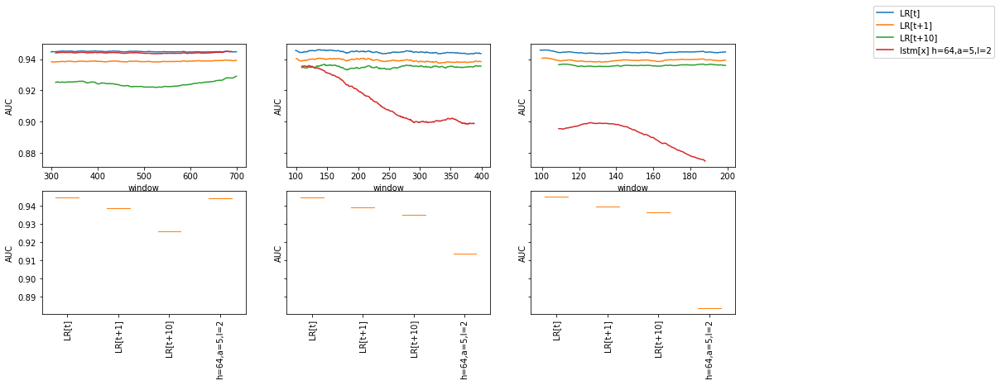

In [91]:
# lambda yhat, y: d(yhat, y[1]) + 0 if d(yhat, y[0]) > d(y[1], y[0]) and d(yhat, y[1]) < d(yhat, y[0]) else alpha*d_sqrt(yhat, y[1]) 
wg_tmp.input_sequence_length = 10

alpha = 10

def criterion(hat, y1):
    yhat, delta = hat
    y0 = yhat - delta
    
    d1 = ((y1 - yhat) ** 2).sum(dim=1)
    d0 = (delta ** 2).sum(dim=1)
    d_ = ((y1 - y0) ** 2).sum(dim=1)
    
    b = alpha * d1
    b[(d0 > d_) & (d1 < d0)] = 0
    
    return d1.sum() + b.sum()
# (d1 + F.sigmoid(torch.sqrt(d1) - torch.sqrt(d_))).sum()
custom_criterion = criterion

model = m_agg.AutoregLstmLr(dim_p + dim_d, dim_lr, num_layers=2, hidden=128,
                            output_sequence_length=5, return_deltas=False)
model.name=f'lstm[x] h=64,a=5,l=2'
wg_tmp.reverse_train = True
train.train_window_models([model], wg_tmp, patience=5, validate=False, weight_decay=0, max_epochs=10,
#                           criterion=custom_criterion, 
                          lrs=[0.001, 0.0001])
model.window_config.output_sequence_length = 1
model.return_deltas = False
def plot_only(models, wg, ylim=None):
    _, axs = plt.subplots(ncols=3, nrows=2, sharey='row', figsize=(15,6))
    plot('train', models, wg, axs=[axs[0][0], axs[1][0]], ylim=ylim)
    plot('val',   models, wg, axs=[axs[0][1], axs[1][1]], ylim=ylim)
    plot('test',  models, wg, axs=[axs[0][2], axs[1][2]], ylim=ylim)
plot_only([model], wg_tmp)

config in=10, out=5
training model lstm
epoch 0 batch 200 loss=0.0274, MTL=0.0498, MVL=0.279				
saving model MTL=0.04800440436272028, MVL=0.03911392659437461
*epoch 1 batch 400 loss=0.0276, MTL=0.0273, MVL=0.0391				
epoch 2 batch 600 loss=0.0267, MTL=0.0273, MVL=0.0404				
epoch 3 batch 800 loss=0.0283, MTL=0.0274, MVL=0.0401				
saving model MTL=0.02734808814347065, MVL=0.03796782955283024
*epoch 4 batch 1000 loss=0.0265, MTL=0.0274, MVL=0.038				
epoch 5 batch 1200 loss=0.0269, MTL=0.0273, MVL=0.0394				
epoch 6 batch 1400 loss=0.027, MTL=0.0273, MVL=0.0394				
saving model MTL=0.027322547501682684, MVL=0.03722439449830133
*epoch 7 batch 1600 loss=0.0273, MTL=0.0273, MVL=0.0372				
epoch 8 batch 1800 loss=0.0265, MTL=0.0274, MVL=0.0392				
epoch 9 batch 2000 loss=0.0276, MTL=0.0276, MVL=0.0384				


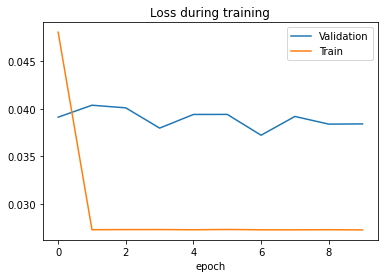

epoch 0 batch 200 loss=0.0276, MTL=0.0272, MVL=0.0372				
epoch 1 batch 400 loss=0.0272, MTL=0.0272, MVL=0.0387				
epoch 2 batch 600 loss=0.0282, MTL=0.0272, MVL=0.0385				
epoch 3 batch 800 loss=0.0275, MTL=0.0273, MVL=0.0389				
epoch 4 batch 1000 loss=0.0285, MTL=0.0272, MVL=0.0392				
epoch 5 batch 1200 loss=0.0287, MTL=0.0272, MVL=0.0383				


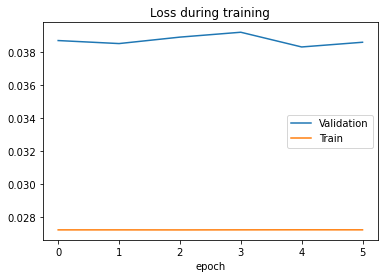

Exception: illegal state

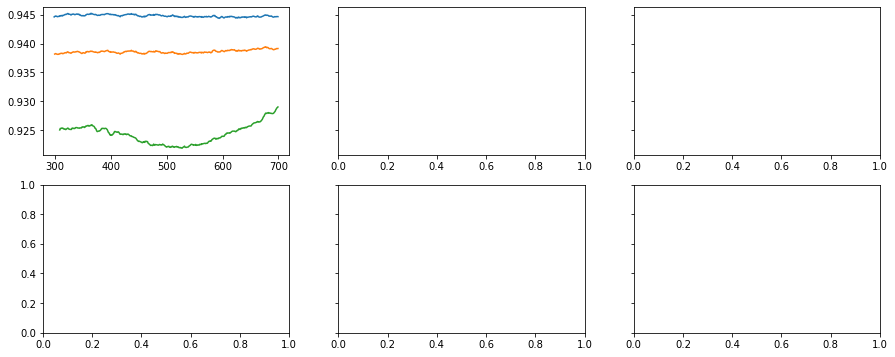

In [101]:
# lambda yhat, y: d(yhat, y[1]) + 0 if d(yhat, y[0]) > d(y[1], y[0]) and d(yhat, y[1]) < d(yhat, y[0]) else alpha*d_sqrt(yhat, y[1]) 
wg_tmp.input_sequence_length = 10

model = m_agg.AutoregLstm(dim_p, num_layers=2, hidden=128, output_sequence_length=5)
model.name=f'lstm'

wg_tmp.reverse_train = False
wg_tmp.train_histograms = True
wg_tmp.density = False

train.train_window_models([model], wg_tmp, patience=5, validate=True, weight_decay=0, 
                          max_epochs=10, lrs=[0.001, 0.0001])

model.window_config.output_sequence_length = 1
model.return_deltas = False
wg_tmp.plot_hist_dist(model)

# def plot_only(models, wg, ylim=None):
#     _, axs = plt.subplots(ncols=3, nrows=2, sharey='row', figsize=(15,6))
#     plot('train', models, wg, axs=[axs[0][0], axs[1][0]], ylim=ylim)
#     plot('val',   models, wg, axs=[axs[0][1], axs[1][1]], ylim=ylim)
#     plot('test',  models, wg, axs=[axs[0][2], axs[1][2]], ylim=ylim)
# plot_only([model], wg_tmp)

In [113]:
model.window_config.output_sequence_length = 1
model.return_deltas = False
wg_tmp.plot_hist_dist(model)

torch.Size([1, 10, 419, 2])


RuntimeError: input.size(-1) must be equal to input_size. Expected 204, got 102

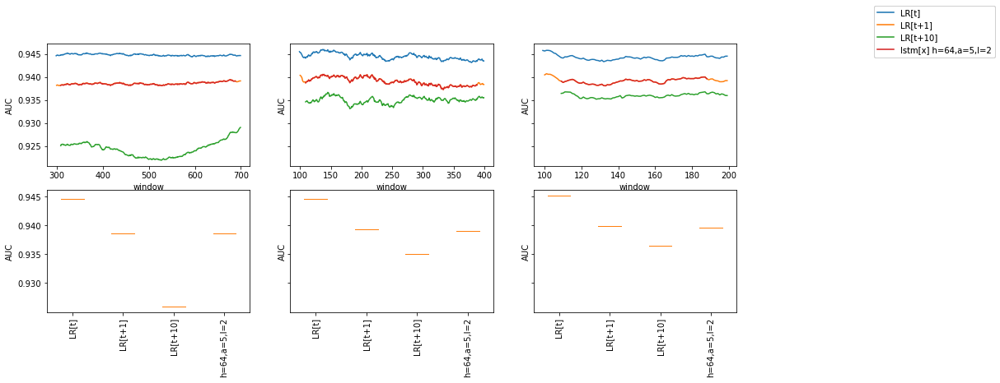

In [90]:
model.window_config.output_sequence_length = 1
model.return_deltas = False
def plot_only(models, wg, ylim=None):
    _, axs = plt.subplots(ncols=3, nrows=2, sharey='row', figsize=(15,6))
    plot('train', models, wg, axs=[axs[0][0], axs[1][0]], ylim=ylim)
    plot('val',   models, wg, axs=[axs[0][1], axs[1][1]], ylim=ylim)
    plot('test',  models, wg, axs=[axs[0][2], axs[1][2]], ylim=ylim)
plot_only([model], wg_tmp)

In [ ]:
wg_tmp.input_sequence_length = 10

alpha = 10

def criterion(hat, y1):
    yhat, delta = hat
    y0 = yhat - delta
    
    d1 = ((y1 - yhat) ** 2).sum(dim=1)
    d0 = (delta ** 2).sum(dim=1)
    d_ = ((y1 - y0) ** 2).sum(dim=1)
    
    b = alpha * d1
    b[(d0 > d_) & (d1 < d0)] = 0
    
    return d1.sum() + b.sum()
# (d1 + F.sigmoid(torch.sqrt(d1) - torch.sqrt(d_))).sum()
custom_criterion = criterion

model = m_agg.AutoregLstmLr(dim_p + dim_d, dim_lr, num_layers=2, hidden=128,
                            output_sequence_length=5, return_deltas=False)
model.name=f'lstm[x] h=64,a=5,l=2'
wg_tmp.reverse_train = True
train.train_window_models([model], wg_tmp, patience=5, validate=False, weight_decay=0, max_epochs=10,
#                           criterion=custom_criterion, 
                          lrs=[0.001, 0.0001])
model.window_config.output_sequence_length = 1
model.return_deltas = False
def plot_only(models, wg, ylim=None):
    _, axs = plt.subplots(ncols=3, nrows=2, sharey='row', figsize=(15,6))
    plot('train', models, wg, axs=[axs[0][0], axs[1][0]], ylim=ylim)
    plot('val',   models, wg, axs=[axs[0][1], axs[1][1]], ylim=ylim)
    plot('test',  models, wg, axs=[axs[0][2], axs[1][2]], ylim=ylim)
plot_only([model], wg_tmp)

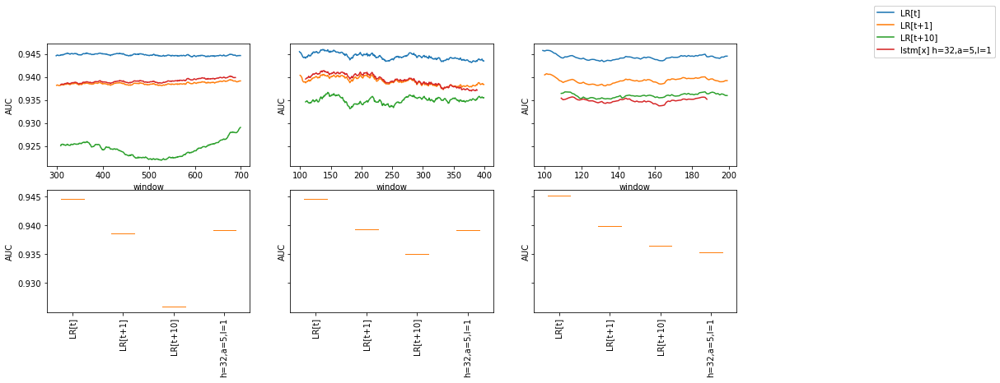

In [88]:
model.window_config.output_sequence_length = 1
model.return_deltas = False
def plot_only(models, wg, ylim=None):
    _, axs = plt.subplots(ncols=3, nrows=2, sharey='row', figsize=(15,6))
    plot('train', models, wg, axs=[axs[0][0], axs[1][0]], ylim=ylim)
    plot('val',   models, wg, axs=[axs[0][1], axs[1][1]], ylim=ylim)
    plot('test',  models, wg, axs=[axs[0][2], axs[1][2]], ylim=ylim)
plot_only([model], wg_tmp)

In [414]:
# +1 is for BIAS
models_a = []
models_b = []
print(agg_dim*bins*(1+density))
for k in range(5):
    autoregs=5
    for props, model_type in [                                 
#                                 ((1,128,autoregs) ,'lstm'),
#                                 ((2,128,autoregs),'lstm'),
#                                 ((3,128,autoregs),'lstm'),
        
                                ((1,256,autoregs),'lstm'),
                                ((2,256,autoregs),'lstm'),            
                                ((3,256,autoregs),'lstm'),
        
                                ((1,512,autoregs),'lstm'),
                                ((2,512,autoregs),'lstm'),
                                ((3,512,autoregs),'lstm'),
    ]:
        if model_type == 'lstm':
            layers, hidden, autoregs = props
            def make_model():
                model = m_agg.AutoregLstmLr(feat_agg_dim*bins, 10+1, num_layers=layers, hidden=hidden,
                                            output_sequence_length=autoregs)
                model.name=f'lstm[{k}] h={hidden},a={autoregs},l={layers}'
                return model
            models_a.append(make_model())
            models_b.append(make_model())
            
wg_tmp.input_sequence_length = 10

816


training model lstm[0] h=32,a=5,l=1
epoch 0 batch 200 loss=0.0172, MTL=0.0237, MVL=0.17				
saving model MTL=0.023151845473813295, MVL=0.06709861321771732
*epoch 1 batch 400 loss=0.0174, MTL=0.0167, MVL=0.0671				
saving model MTL=0.01668814293319179, MVL=0.06667808895228339
*epoch 2 batch 600 loss=0.0157, MTL=0.0166, MVL=0.0667				
saving model MTL=0.01650286789485661, MVL=0.06657649503379572
*epoch 3 batch 800 loss=0.0154, MTL=0.0162, MVL=0.0666				
saving model MTL=0.016079152547990395, MVL=0.0645518967362701
*epoch 4 batch 1000 loss=0.0149, MTL=0.0157, MVL=0.0646				
epoch 5 batch 1200 loss=0.0148, MTL=0.0152, MVL=0.0648				
saving model MTL=0.015063033516471562, MVL=0.06010050576974134
*epoch 6 batch 1400 loss=0.0141, MTL=0.0147, MVL=0.0601				
saving model MTL=0.014610541928645377, MVL=0.05960860201081292
*epoch 7 batch 1600 loss=0.0143, MTL=0.0143, MVL=0.0596				
epoch 8 batch 1800 loss=0.0137, MTL=0.0142, MVL=0.0602				
saving model MTL=0.014036531723211712, MVL=0.0590296696688

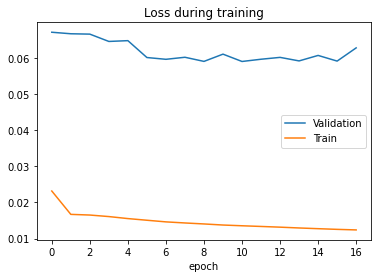

epoch 0 batch 200 loss=0.013, MTL=0.0131, MVL=0.0592				
epoch 1 batch 400 loss=0.0125, MTL=0.0131, MVL=0.0599				
epoch 2 batch 600 loss=0.0129, MTL=0.013, MVL=0.0599				
epoch 3 batch 800 loss=0.0129, MTL=0.013, MVL=0.0605				
epoch 4 batch 1000 loss=0.0122, MTL=0.013, MVL=0.0599				
epoch 5 batch 1200 loss=0.0113, MTL=0.0129, MVL=0.0606				


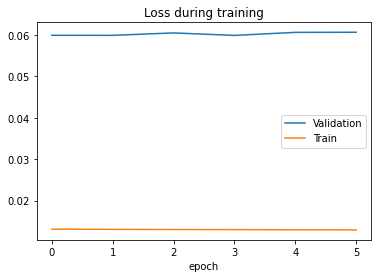

epoch 0 batch 200 loss=0.0125, MTL=0.0131, MVL=0.0591				
epoch 1 batch 400 loss=0.0135, MTL=0.0131, MVL=0.0596				
epoch 2 batch 600 loss=0.0134, MTL=0.0131, MVL=0.0597				
epoch 3 batch 800 loss=0.0128, MTL=0.0131, MVL=0.0596				
epoch 4 batch 1000 loss=0.013, MTL=0.0131, MVL=0.0598				
epoch 5 batch 1200 loss=0.0143, MTL=0.013, MVL=0.0595				


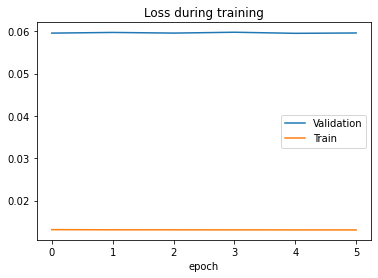

training model lstm[0] h=32,a=5,l=2
epoch 0 batch 200 loss=0.0154, MTL=0.0276, MVL=0.192				
saving model MTL=0.026793107145770628, MVL=0.06803809808658771
*epoch 1 batch 400 loss=0.0163, MTL=0.0167, MVL=0.068				
saving model MTL=0.01676152062426377, MVL=0.0669304576442867
*epoch 2 batch 600 loss=0.0171, MTL=0.0167, MVL=0.0669				
epoch 3 batch 800 loss=0.0166, MTL=0.0168, MVL=0.068				
saving model MTL=0.01675908725863228, MVL=0.06692192672950323
*epoch 4 batch 1000 loss=0.0207, MTL=0.0168, MVL=0.0669				
epoch 5 batch 1200 loss=0.0183, MTL=0.0164, MVL=0.0673				
saving model MTL=0.016148322957142983, MVL=0.0652807953416324
*epoch 6 batch 1400 loss=0.0163, MTL=0.0155, MVL=0.0653				
saving model MTL=0.015456274795573427, MVL=0.06518661169732204
*epoch 7 batch 1600 loss=0.0143, MTL=0.0152, MVL=0.0652				
epoch 8 batch 1800 loss=0.0137, MTL=0.0152, MVL=0.0663				
epoch 9 batch 2000 loss=0.0142, MTL=0.0151, MVL=0.0653				
epoch 10 batch 2200 loss=0.0155, MTL=0.015, MVL=0.0674				
epoch 

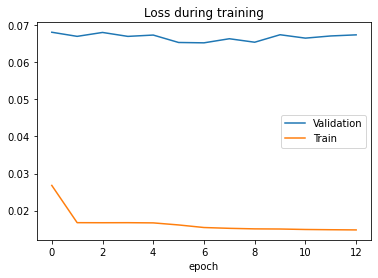

epoch 0 batch 200 loss=0.0143, MTL=0.0152, MVL=0.0653				
epoch 1 batch 400 loss=0.0156, MTL=0.0151, MVL=0.0653				
epoch 2 batch 600 loss=0.0148, MTL=0.0151, MVL=0.0658				
epoch 3 batch 800 loss=0.0143, MTL=0.015, MVL=0.0658				
epoch 4 batch 1000 loss=0.0154, MTL=0.0151, MVL=0.0655				
epoch 5 batch 1200 loss=0.0158, MTL=0.0151, MVL=0.0656				


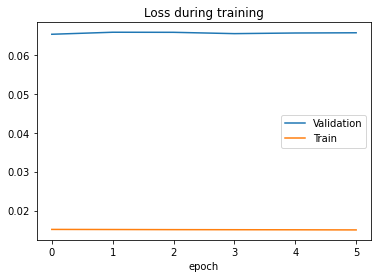

epoch 0 batch 200 loss=0.0149, MTL=0.0152, MVL=0.0649				
epoch 1 batch 400 loss=0.0138, MTL=0.0151, MVL=0.0657				
epoch 2 batch 600 loss=0.0147, MTL=0.0152, MVL=0.0653				
epoch 3 batch 800 loss=0.0161, MTL=0.0151, MVL=0.0654				
epoch 4 batch 1000 loss=0.0154, MTL=0.0151, MVL=0.0653				
epoch 5 batch 1200 loss=0.0147, MTL=0.0151, MVL=0.0656				


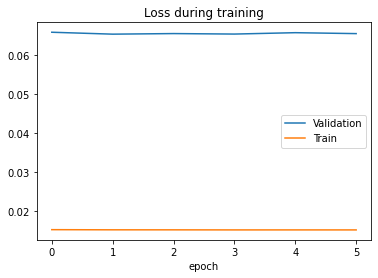

training model lstm[0] h=32,a=5,l=3
epoch 0 batch 200 loss=0.0157, MTL=0.0224, MVL=0.166				
saving model MTL=0.021990883503160717, MVL=0.06766672542349236
*epoch 1 batch 400 loss=0.0197, MTL=0.0167, MVL=0.0677				
saving model MTL=0.01673790563138262, MVL=0.06676165478639916
*epoch 2 batch 600 loss=0.0176, MTL=0.0168, MVL=0.0668				
epoch 3 batch 800 loss=0.0165, MTL=0.0167, MVL=0.0674				
epoch 4 batch 1000 loss=0.0191, MTL=0.0168, MVL=0.0679				
epoch 5 batch 1200 loss=0.0186, MTL=0.0168, MVL=0.0683				
epoch 6 batch 1400 loss=0.0158, MTL=0.0168, MVL=0.0685				
epoch 7 batch 1600 loss=0.0175, MTL=0.0167, MVL=0.0672				


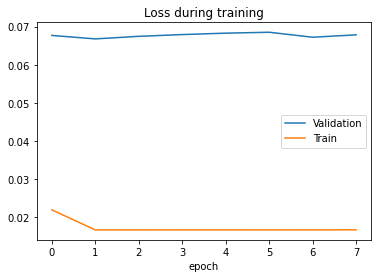

epoch 0 batch 200 loss=0.017, MTL=0.0167, MVL=0.0667				
epoch 1 batch 400 loss=0.0183, MTL=0.0167, MVL=0.0678				
epoch 2 batch 600 loss=0.0168, MTL=0.0167, MVL=0.068				
epoch 3 batch 800 loss=0.0157, MTL=0.0167, MVL=0.0672				
epoch 4 batch 1000 loss=0.0166, MTL=0.0168, MVL=0.0674				
epoch 5 batch 1200 loss=0.0175, MTL=0.0167, MVL=0.0674				


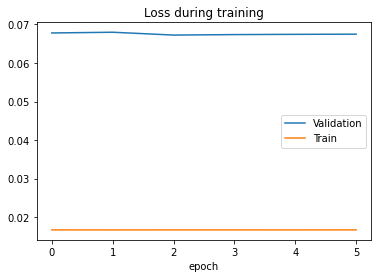

epoch 0 batch 200 loss=0.0167, MTL=0.0167, MVL=0.0671				
epoch 1 batch 400 loss=0.016, MTL=0.0167, MVL=0.0673				
epoch 2 batch 600 loss=0.0155, MTL=0.0166, MVL=0.0676				
epoch 3 batch 800 loss=0.0167, MTL=0.0166, MVL=0.0674				
epoch 4 batch 1000 loss=0.0161, MTL=0.0167, MVL=0.0676				
epoch 5 batch 1200 loss=0.017, MTL=0.0166, MVL=0.0676				


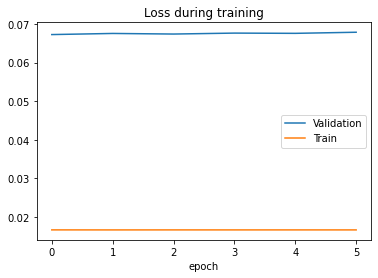

training model lstm[0] h=64,a=5,l=1
epoch 0 batch 200 loss=0.017, MTL=0.0196, MVL=0.132				
saving model MTL=0.019371340626395794, MVL=0.06746230842392953
*epoch 1 batch 400 loss=0.0183, MTL=0.0167, MVL=0.0675				
saving model MTL=0.016611478561835903, MVL=0.06718092020906385
*epoch 2 batch 600 loss=0.0166, MTL=0.0164, MVL=0.0672				
saving model MTL=0.016225228249202677, MVL=0.06410743827458287
*epoch 3 batch 800 loss=0.0151, MTL=0.0157, MVL=0.0641				
saving model MTL=0.015510852925033064, MVL=0.06407683898435264
*epoch 4 batch 1000 loss=0.0139, MTL=0.0147, MVL=0.0641				
saving model MTL=0.014643981546369566, MVL=0.06211933285975065
*epoch 5 batch 1200 loss=0.0142, MTL=0.0141, MVL=0.0621				
saving model MTL=0.013982371143859378, MVL=0.06098084957873235
*epoch 6 batch 1400 loss=0.0145, MTL=0.0137, MVL=0.061				
saving model MTL=0.013565112321641863, MVL=0.06016613933883729
*epoch 7 batch 1600 loss=0.0139, MTL=0.0133, MVL=0.0602				
saving model MTL=0.013271779954982793, MVL=0.058102

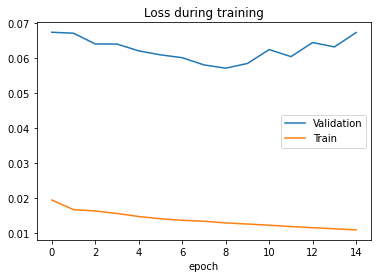

epoch 0 batch 200 loss=0.0111, MTL=0.0122, MVL=0.0572				
epoch 1 batch 400 loss=0.0119, MTL=0.0121, MVL=0.0582				
epoch 2 batch 600 loss=0.0113, MTL=0.012, MVL=0.0596				
epoch 3 batch 800 loss=0.012, MTL=0.0119, MVL=0.06				
epoch 4 batch 1000 loss=0.0123, MTL=0.0118, MVL=0.0604				
epoch 5 batch 1200 loss=0.0121, MTL=0.0118, MVL=0.0614				


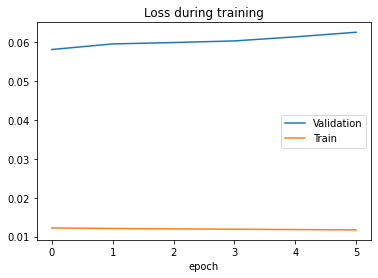

epoch 0 batch 200 loss=0.013, MTL=0.0123, MVL=0.0572				
epoch 1 batch 400 loss=0.0129, MTL=0.0122, MVL=0.0577				
epoch 2 batch 600 loss=0.0128, MTL=0.0123, MVL=0.0581				
epoch 3 batch 800 loss=0.0104, MTL=0.0121, MVL=0.0581				
epoch 4 batch 1000 loss=0.0117, MTL=0.0121, MVL=0.0581				
epoch 5 batch 1200 loss=0.0119, MTL=0.0121, MVL=0.0584				


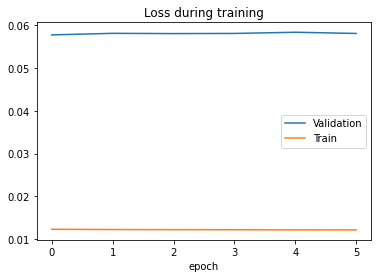

training model lstm[0] h=64,a=5,l=2
epoch 0 batch 200 loss=0.0164, MTL=0.0192, MVL=0.118				
saving model MTL=0.019030661485265204, MVL=0.06779594181991014
*epoch 1 batch 400 loss=0.0162, MTL=0.0168, MVL=0.0678				
epoch 2 batch 600 loss=0.0156, MTL=0.0167, MVL=0.0683				
epoch 3 batch 800 loss=0.0167, MTL=0.0168, MVL=0.069				
saving model MTL=0.016741649839975593, MVL=0.06698876234595894
*epoch 4 batch 1000 loss=0.0157, MTL=0.0164, MVL=0.067				
saving model MTL=0.016290046566505036, MVL=0.06696110731754147
*epoch 5 batch 1200 loss=0.0167, MTL=0.0155, MVL=0.067				
saving model MTL=0.015460047312939222, MVL=0.06529662239014125
*epoch 6 batch 1400 loss=0.0144, MTL=0.0153, MVL=0.0653				
epoch 7 batch 1600 loss=0.0162, MTL=0.0151, MVL=0.0658				
epoch 8 batch 1800 loss=0.0156, MTL=0.0151, MVL=0.0662				
epoch 9 batch 2000 loss=0.0147, MTL=0.0151, MVL=0.0654				
epoch 10 batch 2200 loss=0.0139, MTL=0.0148, MVL=0.0675				
epoch 11 batch 2400 loss=0.0145, MTL=0.0149, MVL=0.0666				
epoch 

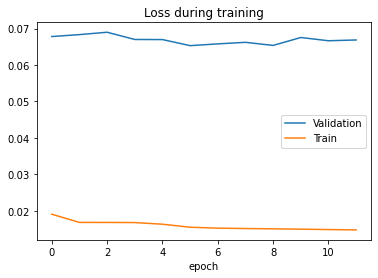

epoch 0 batch 200 loss=0.0146, MTL=0.0151, MVL=0.0652				
epoch 1 batch 400 loss=0.015, MTL=0.015, MVL=0.0658				
epoch 2 batch 600 loss=0.0148, MTL=0.015, MVL=0.0655				
saving model MTL=0.015044896185295099, MVL=0.06507241927453729
*epoch 3 batch 800 loss=0.0142, MTL=0.015, MVL=0.0651				
epoch 4 batch 1000 loss=0.0163, MTL=0.015, MVL=0.0658				
epoch 5 batch 1200 loss=0.0151, MTL=0.015, MVL=0.0651				
epoch 6 batch 1400 loss=0.014, MTL=0.0149, MVL=0.0655				
epoch 7 batch 1600 loss=0.0154, MTL=0.015, MVL=0.0661				
epoch 8 batch 1800 loss=0.0151, MTL=0.015, MVL=0.0651				


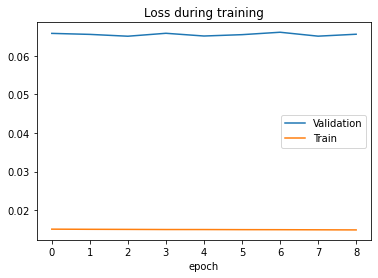

epoch 0 batch 200 loss=0.0162, MTL=0.015, MVL=0.065				
epoch 1 batch 400 loss=0.0162, MTL=0.015, MVL=0.0655				
epoch 2 batch 600 loss=0.0151, MTL=0.015, MVL=0.0653				
epoch 3 batch 800 loss=0.0142, MTL=0.015, MVL=0.0656				
epoch 4 batch 1000 loss=0.016, MTL=0.015, MVL=0.0653				
epoch 5 batch 1200 loss=0.0138, MTL=0.015, MVL=0.0657				


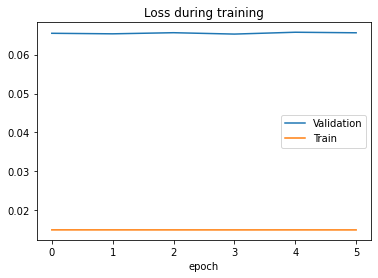

training model lstm[0] h=64,a=5,l=3
epoch 0 batch 200 loss=0.0169, MTL=0.0189, MVL=0.104				
saving model MTL=0.018739988593908224, MVL=0.0682747441603512
*epoch 1 batch 400 loss=0.0171, MTL=0.0168, MVL=0.0683				
saving model MTL=0.016761655747581462, MVL=0.06812792741617218
*epoch 2 batch 600 loss=0.0163, MTL=0.0168, MVL=0.0681				
saving model MTL=0.016757332749905124, MVL=0.06785791153546239
*epoch 3 batch 800 loss=0.0155, MTL=0.0168, MVL=0.0679				
saving model MTL=0.016747867967504236, MVL=0.06710424689484425
*epoch 4 batch 1000 loss=0.0152, MTL=0.0167, MVL=0.0671				
epoch 5 batch 1200 loss=0.0199, MTL=0.0168, MVL=0.068				
epoch 6 batch 1400 loss=0.0171, MTL=0.0167, MVL=0.068				
epoch 7 batch 1600 loss=0.0183, MTL=0.0169, MVL=0.0679				
epoch 8 batch 1800 loss=0.0161, MTL=0.017, MVL=0.0674				
epoch 9 batch 2000 loss=0.017, MTL=0.017, MVL=0.0678				


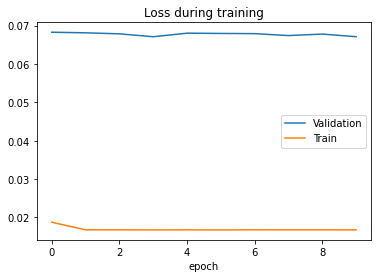

epoch 0 batch 200 loss=0.0172, MTL=0.0167, MVL=0.0672				
saving model MTL=0.016704203440777717, MVL=0.06680617359329442
*epoch 1 batch 400 loss=0.0187, MTL=0.0168, MVL=0.0668				
epoch 2 batch 600 loss=0.0174, MTL=0.0167, MVL=0.0674				
epoch 3 batch 800 loss=0.016, MTL=0.0167, MVL=0.0675				
epoch 4 batch 1000 loss=0.0174, MTL=0.0167, MVL=0.0674				
epoch 5 batch 1200 loss=0.0157, MTL=0.0168, MVL=0.0669				
epoch 6 batch 1400 loss=0.014, MTL=0.0167, MVL=0.0675				


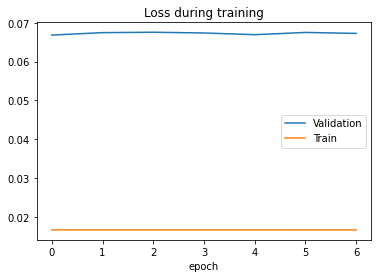

epoch 0 batch 200 loss=0.0155, MTL=0.0167, MVL=0.0668				
epoch 1 batch 400 loss=0.0155, MTL=0.0167, MVL=0.0675				
epoch 2 batch 600 loss=0.0169, MTL=0.0167, MVL=0.0675				
epoch 3 batch 800 loss=0.0154, MTL=0.0167, MVL=0.0675				
epoch 4 batch 1000 loss=0.0172, MTL=0.0166, MVL=0.0676				
epoch 5 batch 1200 loss=0.0165, MTL=0.0166, MVL=0.0675				


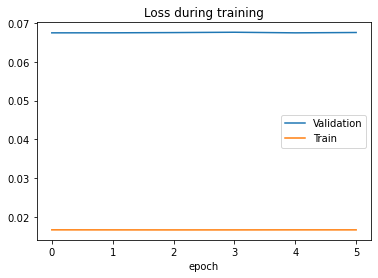

training model lstm[0] h=128,a=5,l=1
epoch 0 batch 200 loss=0.0174, MTL=0.0174, MVL=0.0877				
saving model MTL=0.01731955687931743, MVL=0.06731660315980677
*epoch 1 batch 400 loss=0.0149, MTL=0.0164, MVL=0.0673				
saving model MTL=0.01628093116740752, MVL=0.06297226567737392
*epoch 2 batch 600 loss=0.013, MTL=0.0151, MVL=0.063				
saving model MTL=0.014905996504776213, MVL=0.06024532978896235
*epoch 3 batch 800 loss=0.0138, MTL=0.014, MVL=0.0602				
epoch 4 batch 1000 loss=0.014, MTL=0.0132, MVL=0.0608				
saving model MTL=0.013064611376979934, MVL=0.05665472217026304
*epoch 5 batch 1200 loss=0.0116, MTL=0.0124, MVL=0.0567				
epoch 6 batch 1400 loss=0.0122, MTL=0.0115, MVL=0.0577				
epoch 7 batch 1600 loss=0.0116, MTL=0.0109, MVL=0.058				
epoch 8 batch 1800 loss=0.0104, MTL=0.0104, MVL=0.0601				
epoch 9 batch 2000 loss=0.00873, MTL=0.00973, MVL=0.057				
saving model MTL=0.009779455839797923, MVL=0.051175432920944494
*epoch 10 batch 2200 loss=0.00891, MTL=0.00958, MVL=0.0512				


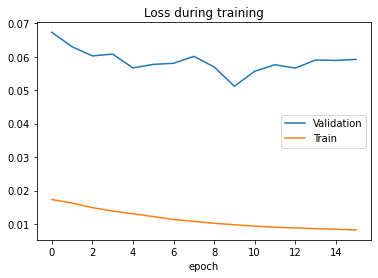

epoch 0 batch 200 loss=0.00897, MTL=0.00891, MVL=0.0513				
epoch 1 batch 400 loss=0.00856, MTL=0.00873, MVL=0.057				
epoch 2 batch 600 loss=0.00935, MTL=0.00866, MVL=0.0568				
epoch 3 batch 800 loss=0.00865, MTL=0.00854, MVL=0.0574				
epoch 4 batch 1000 loss=0.00889, MTL=0.00852, MVL=0.059				
epoch 5 batch 1200 loss=0.00864, MTL=0.00844, MVL=0.0589				


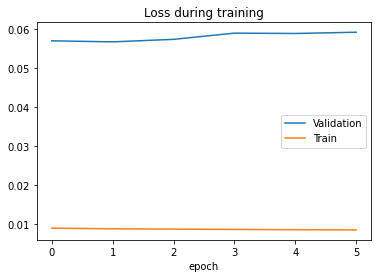

epoch 0 batch 200 loss=0.0082, MTL=0.00911, MVL=0.0512				
epoch 1 batch 400 loss=0.0094, MTL=0.00894, MVL=0.0541				
epoch 2 batch 600 loss=0.0089, MTL=0.00885, MVL=0.0549				
epoch 3 batch 800 loss=0.00804, MTL=0.00882, MVL=0.0553				
epoch 4 batch 1000 loss=0.00884, MTL=0.00877, MVL=0.0557				
epoch 5 batch 1200 loss=0.00834, MTL=0.00876, MVL=0.0562				


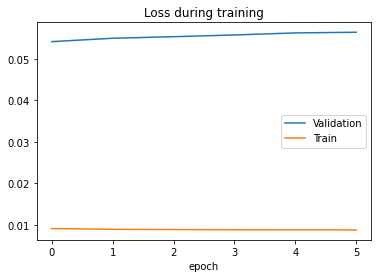

training model lstm[0] h=128,a=5,l=2
epoch 0 batch 200 loss=0.017, MTL=0.018, MVL=0.0968				
saving model MTL=0.017869303784062786, MVL=0.067964712432662
*epoch 1 batch 400 loss=0.0178, MTL=0.0167, MVL=0.068				
saving model MTL=0.016770343699659896, MVL=0.0670587670241223
*epoch 2 batch 600 loss=0.0156, MTL=0.0168, MVL=0.0671				
epoch 3 batch 800 loss=0.0163, MTL=0.0168, MVL=0.0673				
saving model MTL=0.016704366070299927, MVL=0.06543845280272062
*epoch 4 batch 1000 loss=0.0174, MTL=0.016, MVL=0.0654				
epoch 5 batch 1200 loss=0.0145, MTL=0.0152, MVL=0.0658				
epoch 6 batch 1400 loss=0.0143, MTL=0.0151, MVL=0.066				
saving model MTL=0.015121186323772927, MVL=0.06441569285558872
*epoch 7 batch 1600 loss=0.0163, MTL=0.0151, MVL=0.0644				
epoch 8 batch 1800 loss=0.0144, MTL=0.015, MVL=0.0657				
epoch 9 batch 2000 loss=0.015, MTL=0.0148, MVL=0.0657				
epoch 10 batch 2200 loss=0.0135, MTL=0.0146, MVL=0.0661				
saving model MTL=0.014357563258419115, MVL=0.06268515853119679
*epoch 1

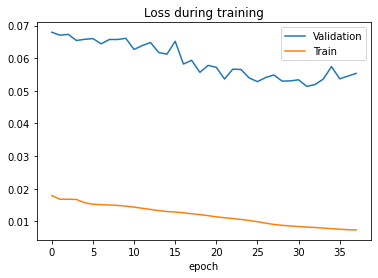

epoch 0 batch 200 loss=0.00786, MTL=0.00771, MVL=0.0512				
epoch 1 batch 400 loss=0.00778, MTL=0.00764, MVL=0.0529				
epoch 2 batch 600 loss=0.00706, MTL=0.00755, MVL=0.0524				
epoch 3 batch 800 loss=0.00745, MTL=0.00754, MVL=0.0525				
epoch 4 batch 1000 loss=0.00706, MTL=0.00752, MVL=0.0525				
epoch 5 batch 1200 loss=0.00728, MTL=0.00749, MVL=0.0531				


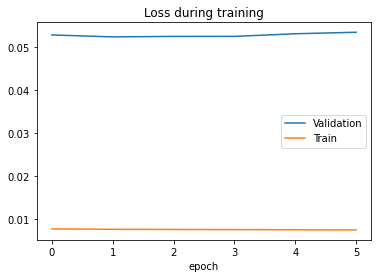

epoch 0 batch 200 loss=0.00755, MTL=0.00782, MVL=0.0513				
epoch 1 batch 400 loss=0.00837, MTL=0.00771, MVL=0.0517				
epoch 2 batch 600 loss=0.00743, MTL=0.00768, MVL=0.0516				
epoch 3 batch 800 loss=0.00783, MTL=0.00768, MVL=0.0518				
epoch 4 batch 1000 loss=0.00736, MTL=0.00762, MVL=0.052				
epoch 5 batch 1200 loss=0.0078, MTL=0.00766, MVL=0.0519				


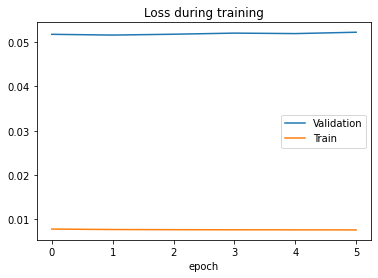

training model lstm[0] h=128,a=5,l=3
epoch 0 batch 200 loss=0.0172, MTL=0.0172, MVL=0.0927				
saving model MTL=0.017178170893701813, MVL=0.06711469169278614
*epoch 1 batch 400 loss=0.0154, MTL=0.0168, MVL=0.0671				
epoch 2 batch 600 loss=0.0153, MTL=0.0167, MVL=0.0674				
epoch 3 batch 800 loss=0.0176, MTL=0.0167, MVL=0.0686				
epoch 4 batch 1000 loss=0.0161, MTL=0.0167, MVL=0.0687				
epoch 5 batch 1200 loss=0.0171, MTL=0.0167, MVL=0.0677				
saving model MTL=0.016741072544441793, MVL=0.06710675322130079
*epoch 6 batch 1400 loss=0.0174, MTL=0.0168, MVL=0.0671				
epoch 7 batch 1600 loss=0.0193, MTL=0.0168, MVL=0.0681				
epoch 8 batch 1800 loss=0.0177, MTL=0.0169, MVL=0.0675				
epoch 9 batch 2000 loss=0.018, MTL=0.0166, MVL=0.0674				
epoch 10 batch 2200 loss=0.0177, MTL=0.0166, MVL=0.0684				
epoch 11 batch 2400 loss=0.015, MTL=0.0165, MVL=0.0683				
epoch 11 batch 2600 loss=0.0178, MTL=0.0167, MVL=0.0683				


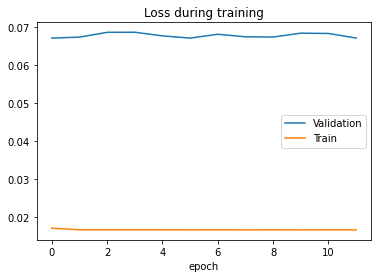

epoch 0 batch 200 loss=0.0163, MTL=0.0167, MVL=0.0671				
epoch 1 batch 400 loss=0.0171, MTL=0.0168, MVL=0.068				
epoch 2 batch 600 loss=0.0205, MTL=0.0166, MVL=0.0675				
epoch 3 batch 800 loss=0.0168, MTL=0.0167, MVL=0.0675				
epoch 4 batch 1000 loss=0.0175, MTL=0.0167, MVL=0.0672				
epoch 5 batch 1200 loss=0.0165, MTL=0.0168, MVL=0.0679				


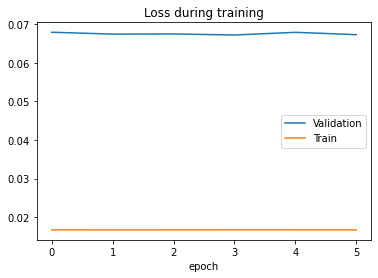

epoch 0 batch 200 loss=0.0165, MTL=0.0167, MVL=0.067				
epoch 1 batch 400 loss=0.0165, MTL=0.0167, MVL=0.0676				
epoch 2 batch 600 loss=0.0162, MTL=0.0167, MVL=0.0675				
epoch 3 batch 800 loss=0.0176, MTL=0.0168, MVL=0.0676				
epoch 4 batch 1000 loss=0.0175, MTL=0.0167, MVL=0.0676				
epoch 5 batch 1200 loss=0.017, MTL=0.0166, MVL=0.0673				


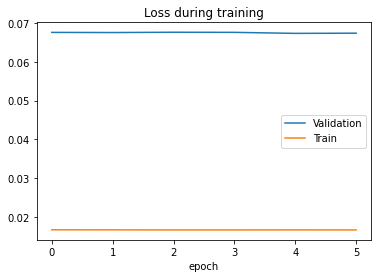

training model lstm[1] h=32,a=5,l=1
epoch 0 batch 200 loss=0.0157, MTL=0.0318, MVL=0.255				
saving model MTL=0.03063763469491961, MVL=0.06872597813117699
*epoch 1 batch 400 loss=0.018, MTL=0.0167, MVL=0.0687				
saving model MTL=0.01672553212686618, MVL=0.0680685966107689
*epoch 2 batch 600 loss=0.0148, MTL=0.0167, MVL=0.0681				
saving model MTL=0.016689212391934088, MVL=0.0661515553222328
*epoch 3 batch 800 loss=0.0149, MTL=0.0165, MVL=0.0662				
epoch 4 batch 1000 loss=0.0154, MTL=0.0162, MVL=0.0677				
saving model MTL=0.01602937659669307, MVL=0.06606283961016624
*epoch 5 batch 1200 loss=0.0162, MTL=0.0156, MVL=0.0661				
saving model MTL=0.015617130427247918, MVL=0.0643048076966747
*epoch 6 batch 1400 loss=0.0153, MTL=0.0153, MVL=0.0643				
epoch 7 batch 1600 loss=0.0148, MTL=0.0151, MVL=0.0663				
saving model MTL=0.015025173704470358, MVL=0.06409098507195223
*epoch 8 batch 1800 loss=0.0145, MTL=0.0147, MVL=0.0641				
saving model MTL=0.014600345637426123, MVL=0.0639929274310831

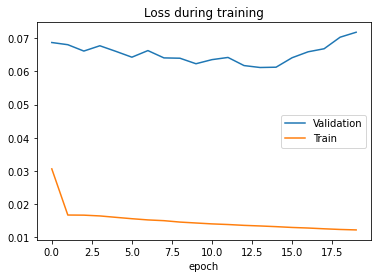

epoch 0 batch 200 loss=0.0138, MTL=0.0131, MVL=0.0614				
epoch 1 batch 400 loss=0.0133, MTL=0.013, MVL=0.0627				
epoch 2 batch 600 loss=0.0142, MTL=0.013, MVL=0.0619				
epoch 3 batch 800 loss=0.0129, MTL=0.0129, MVL=0.0634				
epoch 4 batch 1000 loss=0.0128, MTL=0.0128, MVL=0.0633				
epoch 5 batch 1200 loss=0.013, MTL=0.0128, MVL=0.0639				


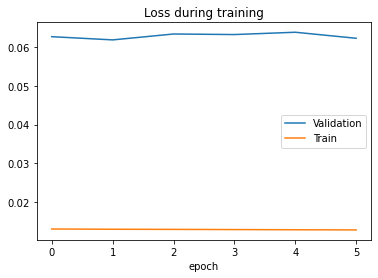

epoch 0 batch 200 loss=0.0142, MTL=0.0131, MVL=0.0613				
epoch 1 batch 400 loss=0.0118, MTL=0.0131, MVL=0.0627				
epoch 2 batch 600 loss=0.0145, MTL=0.013, MVL=0.0629				
epoch 3 batch 800 loss=0.0129, MTL=0.013, MVL=0.0627				
epoch 4 batch 1000 loss=0.0138, MTL=0.013, MVL=0.0625				
epoch 5 batch 1200 loss=0.0134, MTL=0.013, MVL=0.0624				


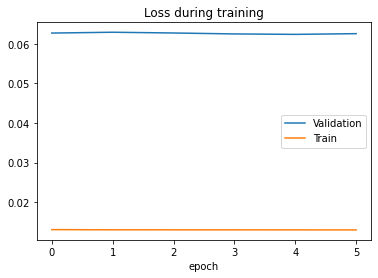

training model lstm[1] h=32,a=5,l=2
epoch 0 batch 200 loss=0.0162, MTL=0.0226, MVL=0.169				
saving model MTL=0.022165203831815226, MVL=0.06784779670052841
*epoch 1 batch 400 loss=0.0152, MTL=0.0167, MVL=0.0678				
saving model MTL=0.016748589304735034, MVL=0.06693118810653687
*epoch 2 batch 600 loss=0.017, MTL=0.0167, MVL=0.0669				
epoch 3 batch 800 loss=0.0168, MTL=0.0168, MVL=0.0678				
epoch 4 batch 1000 loss=0.016, MTL=0.0167, MVL=0.067				
saving model MTL=0.01664495183163524, MVL=0.0667335863118289
*epoch 5 batch 1200 loss=0.0162, MTL=0.0159, MVL=0.0667				
epoch 6 batch 1400 loss=0.015, MTL=0.0154, MVL=0.0675				
saving model MTL=0.015329694856078394, MVL=0.06420897246628511
*epoch 7 batch 1600 loss=0.0146, MTL=0.0153, MVL=0.0642				
epoch 8 batch 1800 loss=0.015, MTL=0.0151, MVL=0.0658				
epoch 9 batch 2000 loss=0.0177, MTL=0.015, MVL=0.0648				
epoch 10 batch 2200 loss=0.0141, MTL=0.015, MVL=0.0651				
epoch 11 batch 2400 loss=0.0143, MTL=0.0145, MVL=0.0642				
epoch 11 bat

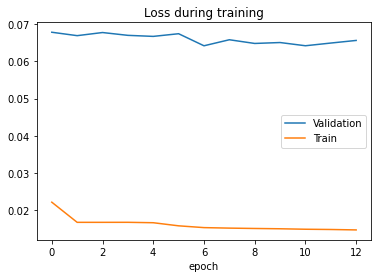

epoch 0 batch 200 loss=0.0144, MTL=0.0151, MVL=0.0642				
epoch 1 batch 400 loss=0.0157, MTL=0.0151, MVL=0.065				
epoch 2 batch 600 loss=0.0153, MTL=0.015, MVL=0.0652				
epoch 3 batch 800 loss=0.0149, MTL=0.015, MVL=0.0651				
epoch 4 batch 1000 loss=0.0141, MTL=0.015, MVL=0.0652				
epoch 5 batch 1200 loss=0.0151, MTL=0.0151, MVL=0.0649				


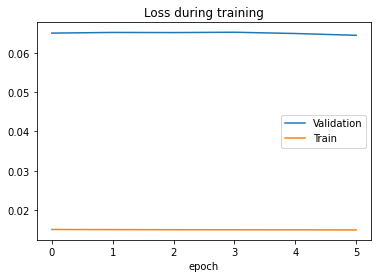

epoch 0 batch 200 loss=0.0172, MTL=0.0152, MVL=0.0642				
epoch 1 batch 400 loss=0.0161, MTL=0.0151, MVL=0.065				
epoch 2 batch 600 loss=0.016, MTL=0.0151, MVL=0.0649				
epoch 3 batch 800 loss=0.0151, MTL=0.0151, MVL=0.0651				
epoch 4 batch 1000 loss=0.0142, MTL=0.0151, MVL=0.0653				
epoch 5 batch 1200 loss=0.0159, MTL=0.015, MVL=0.0653				


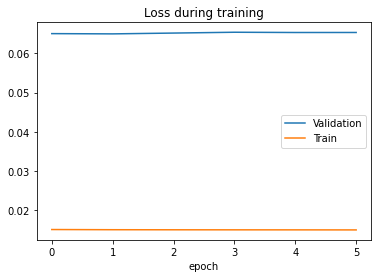

training model lstm[1] h=32,a=5,l=3
epoch 0 batch 200 loss=0.0172, MTL=0.0283, MVL=0.201				
saving model MTL=0.027401668195556936, MVL=0.0669875010603764
*epoch 1 batch 400 loss=0.0194, MTL=0.0168, MVL=0.067				
epoch 2 batch 600 loss=0.0159, MTL=0.0167, MVL=0.0677				
epoch 3 batch 800 loss=0.0166, MTL=0.0168, MVL=0.0676				
epoch 4 batch 1000 loss=0.0163, MTL=0.0168, MVL=0.0672				
epoch 5 batch 1200 loss=0.0165, MTL=0.0168, MVL=0.0676				
saving model MTL=0.016762974354425607, MVL=0.06687710861690709
*epoch 6 batch 1400 loss=0.0153, MTL=0.0167, MVL=0.0669				
epoch 7 batch 1600 loss=0.0155, MTL=0.0168, MVL=0.0679				
epoch 8 batch 1800 loss=0.0186, MTL=0.0166, MVL=0.0682				
epoch 9 batch 2000 loss=0.0166, MTL=0.0169, MVL=0.0678				
epoch 10 batch 2200 loss=0.0161, MTL=0.0168, MVL=0.0675				
epoch 11 batch 2400 loss=0.0148, MTL=0.0166, MVL=0.0678				
epoch 11 batch 2600 loss=0.0152, MTL=0.0168, MVL=0.0678				
saving model MTL=0.01675174635950871, MVL=0.06670673460256858
*epoch 12 b

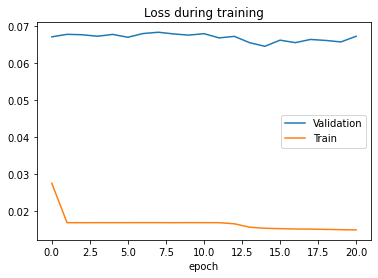

epoch 0 batch 200 loss=0.0146, MTL=0.015, MVL=0.0648				
epoch 1 batch 400 loss=0.0155, MTL=0.015, MVL=0.0644				
epoch 2 batch 600 loss=0.0146, MTL=0.015, MVL=0.0646				
saving model MTL=0.014977476126106653, MVL=0.06432993410796416
*epoch 3 batch 800 loss=0.014, MTL=0.015, MVL=0.0643				
epoch 4 batch 1000 loss=0.0148, MTL=0.0149, MVL=0.0652				
epoch 5 batch 1200 loss=0.0139, MTL=0.0149, MVL=0.065				
epoch 6 batch 1400 loss=0.0156, MTL=0.0149, MVL=0.0654				
epoch 7 batch 1600 loss=0.0147, MTL=0.0148, MVL=0.0655				
epoch 8 batch 1800 loss=0.015, MTL=0.0149, MVL=0.0654				


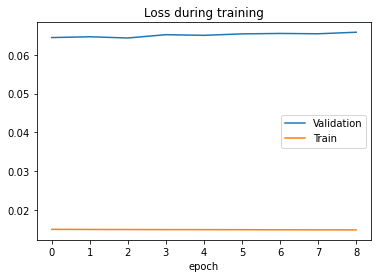

epoch 0 batch 200 loss=0.015, MTL=0.0149, MVL=0.0647				
epoch 1 batch 400 loss=0.0137, MTL=0.015, MVL=0.0648				
epoch 2 batch 600 loss=0.0158, MTL=0.015, MVL=0.0647				
epoch 3 batch 800 loss=0.016, MTL=0.015, MVL=0.0647				
epoch 4 batch 1000 loss=0.0156, MTL=0.0149, MVL=0.0648				
epoch 5 batch 1200 loss=0.0148, MTL=0.015, MVL=0.065				


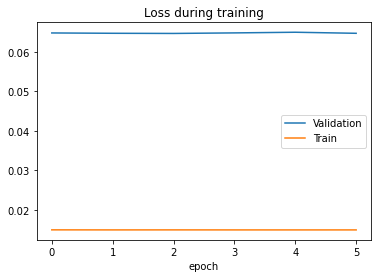

training model lstm[1] h=64,a=5,l=1
epoch 0 batch 200 loss=0.0176, MTL=0.0195, MVL=0.14				
saving model MTL=0.01928544472817177, MVL=0.06771022423368986
*epoch 1 batch 400 loss=0.0157, MTL=0.0166, MVL=0.0677				
saving model MTL=0.016547845612164193, MVL=0.06549918254623648
*epoch 2 batch 600 loss=0.0143, MTL=0.0162, MVL=0.0655				
saving model MTL=0.016057509564137953, MVL=0.06404190889147461
*epoch 3 batch 800 loss=0.0153, MTL=0.0154, MVL=0.064				
saving model MTL=0.01527693703736303, MVL=0.06363501711214176
*epoch 4 batch 1000 loss=0.0135, MTL=0.0146, MVL=0.0636				
saving model MTL=0.01446847184582652, MVL=0.05913392729202255
*epoch 5 batch 1200 loss=0.0152, MTL=0.0141, MVL=0.0591				
epoch 6 batch 1400 loss=0.0138, MTL=0.0136, MVL=0.0606				
saving model MTL=0.013459767197786663, MVL=0.0584827866099897
*epoch 7 batch 1600 loss=0.0137, MTL=0.0131, MVL=0.0585				
epoch 8 batch 1800 loss=0.0125, MTL=0.0129, MVL=0.0618				
epoch 9 batch 2000 loss=0.0119, MTL=0.0125, MVL=0.0614				
e

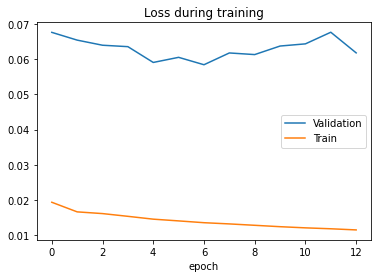

epoch 0 batch 200 loss=0.0116, MTL=0.0128, MVL=0.0587				
saving model MTL=0.012818433601872712, MVL=0.058308610906366444
*epoch 1 batch 400 loss=0.0131, MTL=0.0127, MVL=0.0583				
epoch 2 batch 600 loss=0.0123, MTL=0.0127, MVL=0.0583				
epoch 3 batch 800 loss=0.0133, MTL=0.0126, MVL=0.0594				
epoch 4 batch 1000 loss=0.0127, MTL=0.0125, MVL=0.0599				
epoch 5 batch 1200 loss=0.0123, MTL=0.0124, MVL=0.0613				
epoch 6 batch 1400 loss=0.0125, MTL=0.0123, MVL=0.0617				


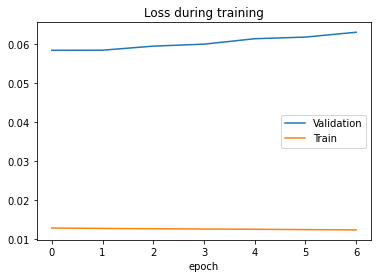

epoch 0 batch 200 loss=0.0127, MTL=0.0127, MVL=0.0581				
saving model MTL=0.012699311822309472, MVL=0.05768826616103532
*epoch 1 batch 400 loss=0.0126, MTL=0.0127, MVL=0.0577				
epoch 2 batch 600 loss=0.0128, MTL=0.0127, MVL=0.0578				
epoch 3 batch 800 loss=0.0127, MTL=0.0127, MVL=0.0581				
epoch 4 batch 1000 loss=0.0135, MTL=0.0127, MVL=0.0585				
epoch 5 batch 1200 loss=0.0136, MTL=0.0127, MVL=0.058				
epoch 6 batch 1400 loss=0.0119, MTL=0.0126, MVL=0.0587				


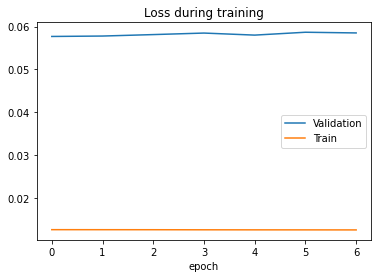

training model lstm[1] h=64,a=5,l=2
epoch 0 batch 200 loss=0.0169, MTL=0.0223, MVL=0.212				
saving model MTL=0.021820231413786313, MVL=0.06720377077333263
*epoch 1 batch 400 loss=0.0181, MTL=0.0167, MVL=0.0672				
epoch 2 batch 600 loss=0.0158, MTL=0.0168, MVL=0.0681				
epoch 3 batch 800 loss=0.0162, MTL=0.0167, MVL=0.0673				
epoch 4 batch 1000 loss=0.0178, MTL=0.0168, MVL=0.0676				
epoch 5 batch 1200 loss=0.0162, MTL=0.0168, MVL=0.0688				
saving model MTL=0.01668869701003836, MVL=0.06626320355495469
*epoch 6 batch 1400 loss=0.0159, MTL=0.0162, MVL=0.0663				
saving model MTL=0.015876439481561633, MVL=0.06376113565485986
*epoch 7 batch 1600 loss=0.016, MTL=0.0152, MVL=0.0638				
epoch 8 batch 1800 loss=0.0148, MTL=0.0149, MVL=0.0662				
epoch 9 batch 2000 loss=0.0139, MTL=0.0148, MVL=0.0644				
saving model MTL=0.014677358396385672, MVL=0.06350755117467193
*epoch 10 batch 2200 loss=0.0149, MTL=0.0147, MVL=0.0635				
epoch 11 batch 2400 loss=0.0141, MTL=0.0142, MVL=0.0645				
epoch

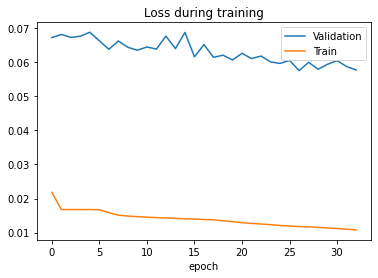

epoch 0 batch 200 loss=0.0104, MTL=0.0114, MVL=0.0577				
epoch 1 batch 400 loss=0.0132, MTL=0.0114, MVL=0.0601				
epoch 2 batch 600 loss=0.0112, MTL=0.0113, MVL=0.0611				
epoch 3 batch 800 loss=0.0108, MTL=0.0113, MVL=0.0609				
epoch 4 batch 1000 loss=0.0114, MTL=0.0113, MVL=0.0598				
epoch 5 batch 1200 loss=0.0114, MTL=0.0113, MVL=0.06				


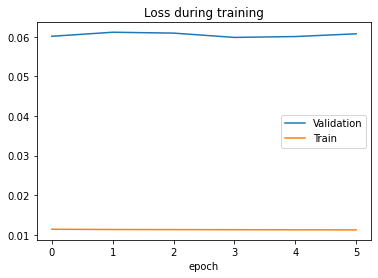

epoch 0 batch 200 loss=0.0122, MTL=0.0115, MVL=0.0578				
epoch 1 batch 400 loss=0.0116, MTL=0.0114, MVL=0.0593				
epoch 2 batch 600 loss=0.0108, MTL=0.0114, MVL=0.0595				
epoch 3 batch 800 loss=0.0111, MTL=0.0114, MVL=0.0597				
epoch 4 batch 1000 loss=0.0122, MTL=0.0114, MVL=0.0597				
epoch 5 batch 1200 loss=0.0119, MTL=0.0113, MVL=0.0601				


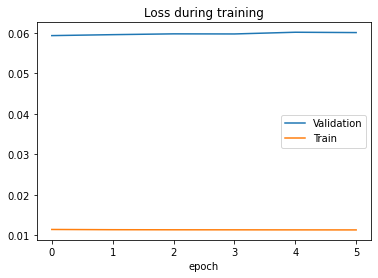

training model lstm[1] h=64,a=5,l=3
epoch 0 batch 200 loss=0.0168, MTL=0.0187, MVL=0.0964				
saving model MTL=0.01852109468615, MVL=0.06738670066487594
*epoch 1 batch 400 loss=0.0178, MTL=0.0167, MVL=0.0674				
epoch 2 batch 600 loss=0.0165, MTL=0.0168, MVL=0.0679				
saving model MTL=0.016763476667762626, MVL=0.06712762333574843
*epoch 3 batch 800 loss=0.0172, MTL=0.0168, MVL=0.0671				
saving model MTL=0.01674250392715365, MVL=0.06665767094150918
*epoch 4 batch 1000 loss=0.0179, MTL=0.0167, MVL=0.0667				
epoch 5 batch 1200 loss=0.0176, MTL=0.0168, MVL=0.0679				
epoch 6 batch 1400 loss=0.0178, MTL=0.0167, MVL=0.0678				
epoch 7 batch 1600 loss=0.0176, MTL=0.0167, MVL=0.068				
epoch 8 batch 1800 loss=0.0154, MTL=0.0168, MVL=0.0673				
epoch 9 batch 2000 loss=0.017, MTL=0.0166, MVL=0.0686				


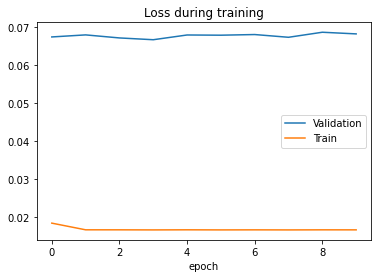

epoch 0 batch 200 loss=0.0159, MTL=0.0167, MVL=0.0666				
epoch 1 batch 400 loss=0.0168, MTL=0.0167, MVL=0.0672				
epoch 2 batch 600 loss=0.0148, MTL=0.0166, MVL=0.0676				
epoch 3 batch 800 loss=0.0153, MTL=0.0166, MVL=0.0675				
epoch 4 batch 1000 loss=0.0174, MTL=0.0167, MVL=0.0676				
epoch 5 batch 1200 loss=0.0165, MTL=0.0167, MVL=0.0672				


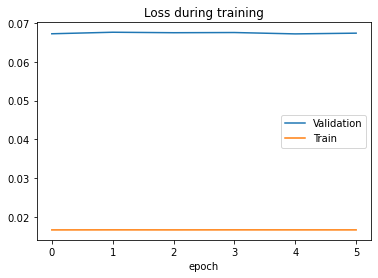

epoch 0 batch 200 loss=0.0174, MTL=0.0167, MVL=0.0669				
epoch 1 batch 400 loss=0.0159, MTL=0.0167, MVL=0.0672				
epoch 2 batch 600 loss=0.017, MTL=0.0166, MVL=0.0675				
epoch 3 batch 800 loss=0.0172, MTL=0.0167, MVL=0.0675				
epoch 4 batch 1000 loss=0.0163, MTL=0.0167, MVL=0.0675				
epoch 5 batch 1200 loss=0.0165, MTL=0.0168, MVL=0.0674				


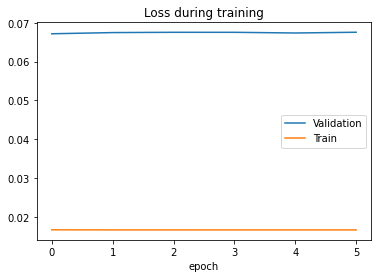

training model lstm[1] h=128,a=5,l=1
epoch 0 batch 200 loss=0.0155, MTL=0.0173, MVL=0.102				
saving model MTL=0.017265687555006022, MVL=0.06756763917500855
*epoch 1 batch 400 loss=0.0146, MTL=0.0163, MVL=0.0676				
saving model MTL=0.016130956108703316, MVL=0.0633741772321404
*epoch 2 batch 600 loss=0.0142, MTL=0.0148, MVL=0.0634				
epoch 3 batch 800 loss=0.0136, MTL=0.0138, MVL=0.0656				
saving model MTL=0.013630411325855189, MVL=0.060127250789130324
*epoch 4 batch 1000 loss=0.0122, MTL=0.0128, MVL=0.0601				
saving model MTL=0.012673662370285405, MVL=0.059219605182526544
*epoch 5 batch 1200 loss=0.0122, MTL=0.0119, MVL=0.0592				
epoch 6 batch 1400 loss=0.0108, MTL=0.0112, MVL=0.0599				
epoch 7 batch 1600 loss=0.0107, MTL=0.0106, MVL=0.0596				
saving model MTL=0.010542114767404746, MVL=0.05890651810608926
*epoch 8 batch 1800 loss=0.0103, MTL=0.01, MVL=0.0589				
saving model MTL=0.010074335450847302, MVL=0.05791484338582539
*epoch 9 batch 2000 loss=0.0108, MTL=0.00978, MVL=0.057

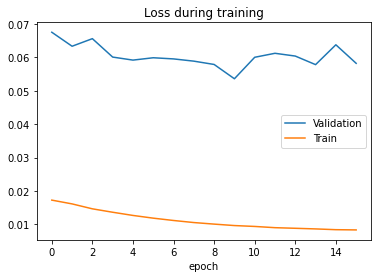

epoch 0 batch 200 loss=0.00877, MTL=0.0088, MVL=0.0537				
epoch 1 batch 400 loss=0.00741, MTL=0.00864, MVL=0.0602				
epoch 2 batch 600 loss=0.00887, MTL=0.00858, MVL=0.0616				
epoch 3 batch 800 loss=0.00841, MTL=0.00849, MVL=0.0629				
epoch 4 batch 1000 loss=0.00832, MTL=0.00847, MVL=0.0607				
epoch 5 batch 1200 loss=0.0081, MTL=0.00839, MVL=0.0636				


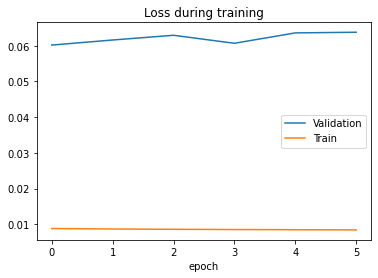

epoch 0 batch 200 loss=0.00884, MTL=0.00895, MVL=0.0536				
epoch 1 batch 400 loss=0.00861, MTL=0.0088, MVL=0.0597				
epoch 2 batch 600 loss=0.00904, MTL=0.00875, MVL=0.0603				
epoch 3 batch 800 loss=0.0088, MTL=0.00874, MVL=0.0608				
epoch 4 batch 1000 loss=0.00882, MTL=0.00872, MVL=0.0612				
epoch 5 batch 1200 loss=0.00845, MTL=0.00869, MVL=0.0612				


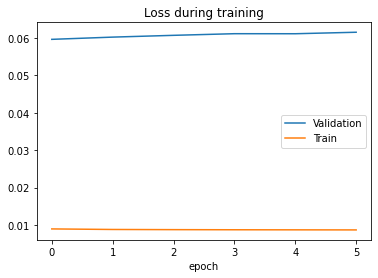

training model lstm[1] h=128,a=5,l=2
epoch 0 batch 200 loss=0.0168, MTL=0.0174, MVL=0.0981				
saving model MTL=0.017323625535802908, MVL=0.0670737245532333
*epoch 1 batch 400 loss=0.0151, MTL=0.0167, MVL=0.0671				
saving model MTL=0.016766782510974167, MVL=0.06674749630152202
*epoch 2 batch 600 loss=0.0179, MTL=0.0168, MVL=0.0667				
epoch 3 batch 800 loss=0.0177, MTL=0.0168, MVL=0.0677				
epoch 4 batch 1000 loss=0.0151, MTL=0.0156, MVL=0.0674				
saving model MTL=0.015499373498771871, MVL=0.06617344903652786
*epoch 5 batch 1200 loss=0.0157, MTL=0.0153, MVL=0.0662				
saving model MTL=0.015209681478925565, MVL=0.06587193655918856
*epoch 6 batch 1400 loss=0.0148, MTL=0.0152, MVL=0.0659				
saving model MTL=0.015095573021656906, MVL=0.06473701612138358
*epoch 7 batch 1600 loss=0.0145, MTL=0.015, MVL=0.0647				
epoch 8 batch 1800 loss=0.015, MTL=0.0149, MVL=0.066				
epoch 9 batch 2000 loss=0.0142, MTL=0.0147, MVL=0.0655				
epoch 10 batch 2200 loss=0.0153, MTL=0.0144, MVL=0.0655				
e

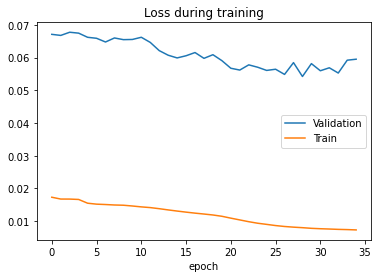

epoch 0 batch 200 loss=0.00818, MTL=0.00747, MVL=0.0541				
epoch 1 batch 400 loss=0.00688, MTL=0.00739, MVL=0.057				
epoch 2 batch 600 loss=0.00743, MTL=0.00734, MVL=0.0576				
epoch 3 batch 800 loss=0.00759, MTL=0.00729, MVL=0.0598				
epoch 4 batch 1000 loss=0.00699, MTL=0.00729, MVL=0.0598				
epoch 5 batch 1200 loss=0.00724, MTL=0.00724, MVL=0.0604				


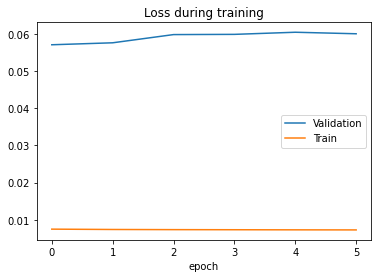

epoch 0 batch 200 loss=0.00737, MTL=0.00757, MVL=0.054				
epoch 1 batch 400 loss=0.00726, MTL=0.00746, MVL=0.0545				
epoch 2 batch 600 loss=0.00736, MTL=0.00742, MVL=0.0549				
epoch 3 batch 800 loss=0.00716, MTL=0.00741, MVL=0.0553				
epoch 4 batch 1000 loss=0.00698, MTL=0.00738, MVL=0.0555				
epoch 5 batch 1200 loss=0.00777, MTL=0.00736, MVL=0.0565				


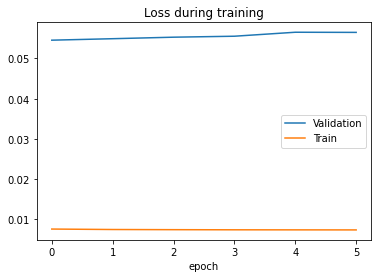

training model lstm[1] h=128,a=5,l=3
epoch 0 batch 200 loss=0.0173, MTL=0.0178, MVL=0.12				
saving model MTL=0.017712466843632233, MVL=0.06666816447357662
*epoch 1 batch 400 loss=0.0181, MTL=0.0167, MVL=0.0667				
epoch 2 batch 600 loss=0.0173, MTL=0.0167, MVL=0.0682				
epoch 3 batch 800 loss=0.0181, MTL=0.0168, MVL=0.0686				
epoch 4 batch 1000 loss=0.016, MTL=0.0167, MVL=0.0668				
epoch 5 batch 1200 loss=0.0163, MTL=0.0168, MVL=0.0683				
epoch 6 batch 1400 loss=0.0183, MTL=0.0168, MVL=0.0675				
saving model MTL=0.016762840827660903, MVL=0.0664529267271034
*epoch 7 batch 1600 loss=0.0175, MTL=0.0168, MVL=0.0665				
epoch 8 batch 1800 loss=0.0169, MTL=0.0169, MVL=0.0674				
epoch 9 batch 2000 loss=0.016, MTL=0.0168, MVL=0.0679				
epoch 10 batch 2200 loss=0.0166, MTL=0.0166, MVL=0.0675				
epoch 11 batch 2400 loss=0.0171, MTL=0.0165, MVL=0.0676				
epoch 11 batch 2600 loss=0.0161, MTL=0.0167, MVL=0.0676				
epoch 12 batch 2800 loss=0.0154, MTL=0.0167, MVL=0.0669				


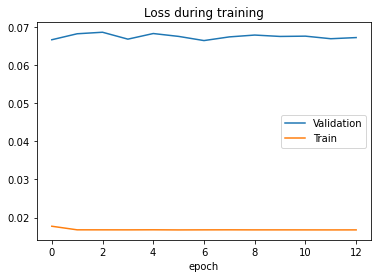

epoch 0 batch 200 loss=0.0182, MTL=0.0167, MVL=0.0665				
epoch 1 batch 400 loss=0.0172, MTL=0.0167, MVL=0.068				
epoch 2 batch 600 loss=0.0172, MTL=0.0167, MVL=0.0674				
epoch 3 batch 800 loss=0.0171, MTL=0.0166, MVL=0.0674				
epoch 4 batch 1000 loss=0.017, MTL=0.0167, MVL=0.0673				
epoch 5 batch 1200 loss=0.0162, MTL=0.0167, MVL=0.0674				


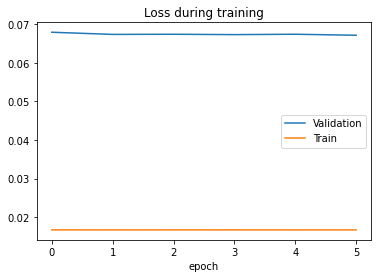

epoch 0 batch 200 loss=0.0186, MTL=0.0167, MVL=0.0666				
epoch 1 batch 400 loss=0.0158, MTL=0.0167, MVL=0.0672				
epoch 2 batch 600 loss=0.0176, MTL=0.0167, MVL=0.0677				
epoch 3 batch 800 loss=0.0161, MTL=0.0167, MVL=0.0675				
epoch 4 batch 1000 loss=0.0191, MTL=0.0167, MVL=0.0675				
epoch 5 batch 1200 loss=0.0159, MTL=0.0166, MVL=0.0674				


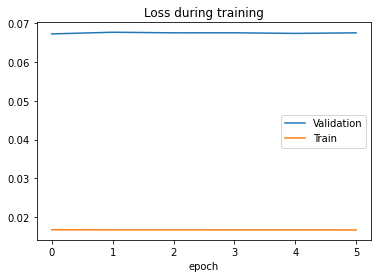

training model lstm[2] h=32,a=5,l=1
epoch 0 batch 200 loss=0.0167, MTL=0.0253, MVL=0.166				
saving model MTL=0.024585249537627817, MVL=0.06769966639456201
*epoch 1 batch 400 loss=0.0166, MTL=0.0167, MVL=0.0677				
epoch 2 batch 600 loss=0.0149, MTL=0.0166, MVL=0.0688				
saving model MTL=0.016563020054302456, MVL=0.06576776449553302
*epoch 3 batch 800 loss=0.0152, MTL=0.0163, MVL=0.0658				
epoch 4 batch 1000 loss=0.0167, MTL=0.016, MVL=0.0675				
saving model MTL=0.01585041461641201, MVL=0.06448318974160758
*epoch 5 batch 1200 loss=0.0157, MTL=0.0155, MVL=0.0645				
saving model MTL=0.015373034625902154, MVL=0.06325352918662008
*epoch 6 batch 1400 loss=0.0137, MTL=0.015, MVL=0.0633				
saving model MTL=0.01497032674038053, MVL=0.061338720934801416
*epoch 7 batch 1600 loss=0.0146, MTL=0.0146, MVL=0.0613				
saving model MTL=0.014612056885755832, MVL=0.061033674317305206
*epoch 8 batch 1800 loss=0.0139, MTL=0.0144, MVL=0.061				
saving model MTL=0.014314800663958497, MVL=0.060110948430

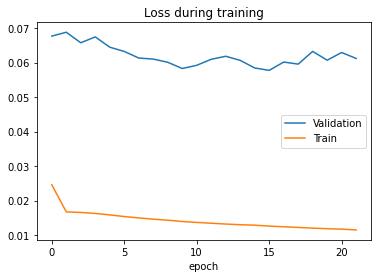

epoch 0 batch 200 loss=0.0124, MTL=0.0122, MVL=0.0577				
epoch 1 batch 400 loss=0.0127, MTL=0.0121, MVL=0.0599				
epoch 2 batch 600 loss=0.0114, MTL=0.012, MVL=0.0586				
epoch 3 batch 800 loss=0.0113, MTL=0.012, MVL=0.0585				
epoch 4 batch 1000 loss=0.0119, MTL=0.012, MVL=0.0595				
epoch 5 batch 1200 loss=0.0121, MTL=0.0119, MVL=0.0583				


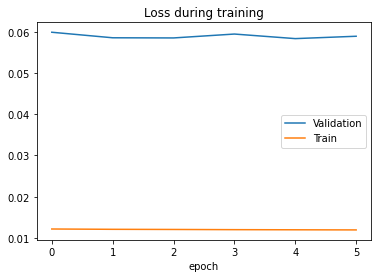

epoch 0 batch 200 loss=0.0122, MTL=0.0122, MVL=0.0579				
epoch 1 batch 400 loss=0.0132, MTL=0.0122, MVL=0.0583				
epoch 2 batch 600 loss=0.0115, MTL=0.0121, MVL=0.0584				
epoch 3 batch 800 loss=0.0134, MTL=0.0121, MVL=0.0582				
epoch 4 batch 1000 loss=0.012, MTL=0.0121, MVL=0.0581				
epoch 5 batch 1200 loss=0.0125, MTL=0.0121, MVL=0.0584				


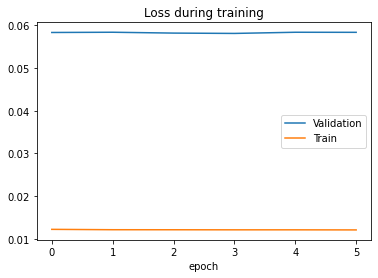

training model lstm[2] h=32,a=5,l=2
epoch 0 batch 200 loss=0.0168, MTL=0.0283, MVL=0.239				
saving model MTL=0.027415071725673666, MVL=0.06697273852883792
*epoch 1 batch 400 loss=0.0159, MTL=0.0168, MVL=0.067				
epoch 2 batch 600 loss=0.016, MTL=0.0168, MVL=0.0679				
epoch 3 batch 800 loss=0.0162, MTL=0.0168, MVL=0.0684				
epoch 4 batch 1000 loss=0.0176, MTL=0.0167, MVL=0.067				
epoch 5 batch 1200 loss=0.018, MTL=0.0167, MVL=0.0681				
epoch 6 batch 1400 loss=0.0157, MTL=0.0167, MVL=0.0677				


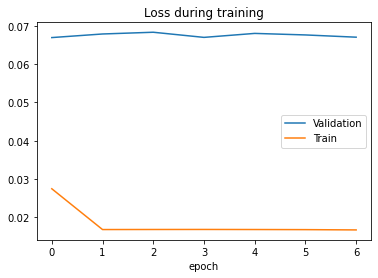

epoch 0 batch 200 loss=0.0153, MTL=0.0167, MVL=0.0672				
epoch 1 batch 400 loss=0.0173, MTL=0.0167, MVL=0.0674				
epoch 2 batch 600 loss=0.0188, MTL=0.0167, MVL=0.0675				
epoch 3 batch 800 loss=0.0159, MTL=0.0167, MVL=0.0674				
epoch 4 batch 1000 loss=0.0176, MTL=0.0167, MVL=0.0677				
epoch 5 batch 1200 loss=0.0176, MTL=0.0167, MVL=0.0676				


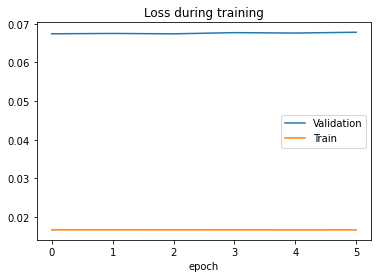

epoch 0 batch 200 loss=0.0159, MTL=0.0167, MVL=0.0674				
epoch 1 batch 400 loss=0.0162, MTL=0.0168, MVL=0.0675				
epoch 2 batch 600 loss=0.0168, MTL=0.0167, MVL=0.0675				
epoch 3 batch 800 loss=0.0166, MTL=0.0167, MVL=0.0675				
epoch 4 batch 1000 loss=0.0183, MTL=0.0167, MVL=0.0676				
epoch 5 batch 1200 loss=0.016, MTL=0.0167, MVL=0.0677				


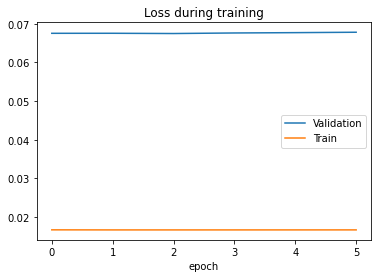

training model lstm[2] h=32,a=5,l=3
epoch 0 batch 200 loss=0.0157, MTL=0.0236, MVL=0.15				
saving model MTL=0.02301943412024854, MVL=0.06721924856060842
*epoch 1 batch 400 loss=0.0167, MTL=0.0168, MVL=0.0672				
epoch 2 batch 600 loss=0.0185, MTL=0.0167, MVL=0.0678				
epoch 3 batch 800 loss=0.0156, MTL=0.0167, MVL=0.0674				
epoch 4 batch 1000 loss=0.0177, MTL=0.0167, MVL=0.0679				
saving model MTL=0.01675751023767044, MVL=0.06715080154235245
*epoch 5 batch 1200 loss=0.016, MTL=0.0169, MVL=0.0672				
epoch 6 batch 1400 loss=0.0165, MTL=0.0167, MVL=0.0677				
epoch 7 batch 1600 loss=0.0164, MTL=0.0167, MVL=0.0684				
epoch 8 batch 1800 loss=0.0175, MTL=0.0168, MVL=0.0677				
epoch 9 batch 2000 loss=0.0163, MTL=0.0168, MVL=0.068				
saving model MTL=0.016752234947640224, MVL=0.06669684004832487
*epoch 10 batch 2200 loss=0.0159, MTL=0.0165, MVL=0.0667				
saving model MTL=0.016761106194301684, MVL=0.06627454291113087
*epoch 11 batch 2400 loss=0.016, MTL=0.0165, MVL=0.0663				
*epoch 11

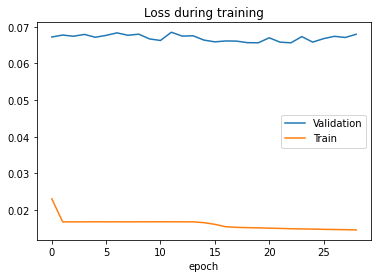

epoch 0 batch 200 loss=0.0137, MTL=0.0147, MVL=0.0659				
saving model MTL=0.014687539554686041, MVL=0.06524303335635388
*epoch 1 batch 400 loss=0.014, MTL=0.0146, MVL=0.0652				
epoch 2 batch 600 loss=0.014, MTL=0.0147, MVL=0.0661				
epoch 3 batch 800 loss=0.0169, MTL=0.0146, MVL=0.0661				
epoch 4 batch 1000 loss=0.0157, MTL=0.0146, MVL=0.0664				
epoch 5 batch 1200 loss=0.0153, MTL=0.0147, MVL=0.0658				
epoch 6 batch 1400 loss=0.0141, MTL=0.0146, MVL=0.0663				


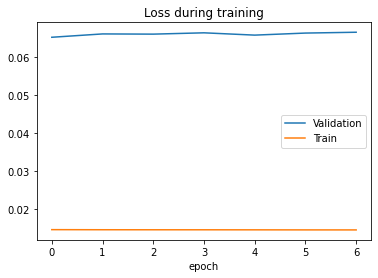

epoch 0 batch 200 loss=0.0147, MTL=0.0147, MVL=0.0656				
epoch 1 batch 400 loss=0.0161, MTL=0.0147, MVL=0.0658				
epoch 2 batch 600 loss=0.0145, MTL=0.0146, MVL=0.066				
epoch 3 batch 800 loss=0.0135, MTL=0.0146, MVL=0.0661				
epoch 4 batch 1000 loss=0.0148, MTL=0.0146, MVL=0.0662				
epoch 5 batch 1200 loss=0.0153, MTL=0.0146, MVL=0.066				


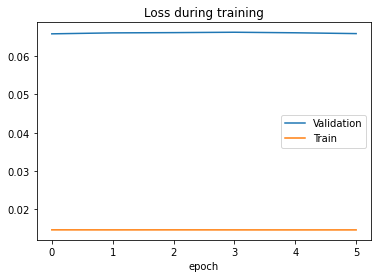

training model lstm[2] h=64,a=5,l=1
epoch 0 batch 200 loss=0.0166, MTL=0.0185, MVL=0.117				
saving model MTL=0.018343428042524146, MVL=0.06707657000324765
*epoch 1 batch 400 loss=0.0146, MTL=0.0167, MVL=0.0671				
saving model MTL=0.016589612438244753, MVL=0.06545495058669419
*epoch 2 batch 600 loss=0.0153, MTL=0.0159, MVL=0.0655				
epoch 3 batch 800 loss=0.0154, MTL=0.0151, MVL=0.0658				
saving model MTL=0.01496672638464496, MVL=0.061375580422702386
*epoch 4 batch 1000 loss=0.0148, MTL=0.0143, MVL=0.0614				
saving model MTL=0.014197756471927813, MVL=0.058732230460546056
*epoch 5 batch 1200 loss=0.0129, MTL=0.0136, MVL=0.0587				
epoch 6 batch 1400 loss=0.0127, MTL=0.0133, MVL=0.0589				
saving model MTL=0.01321665112203854, MVL=0.05712391069678009
*epoch 7 batch 1600 loss=0.0129, MTL=0.0128, MVL=0.0571				
epoch 8 batch 1800 loss=0.0119, MTL=0.0127, MVL=0.0577				
saving model MTL=0.012407059124606545, MVL=0.05676111352981114
*epoch 9 batch 2000 loss=0.0118, MTL=0.0121, MVL=0.0568

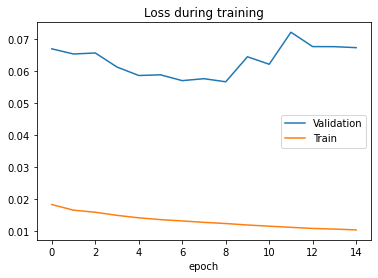

epoch 0 batch 200 loss=0.0112, MTL=0.0116, MVL=0.0566				
epoch 1 batch 400 loss=0.0115, MTL=0.0115, MVL=0.062				
epoch 2 batch 600 loss=0.0108, MTL=0.0114, MVL=0.065				
epoch 3 batch 800 loss=0.0105, MTL=0.0113, MVL=0.0666				
epoch 4 batch 1000 loss=0.011, MTL=0.0112, MVL=0.0685				
epoch 5 batch 1200 loss=0.0109, MTL=0.0111, MVL=0.0674				


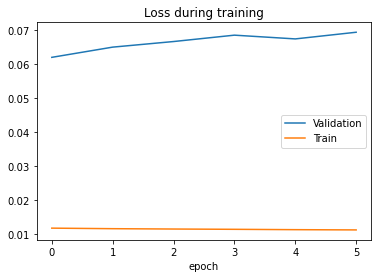

epoch 0 batch 200 loss=0.0119, MTL=0.0117, MVL=0.0567				
epoch 1 batch 400 loss=0.0116, MTL=0.0116, MVL=0.0601				
epoch 2 batch 600 loss=0.0119, MTL=0.0116, MVL=0.06				
epoch 3 batch 800 loss=0.0115, MTL=0.0116, MVL=0.0604				
epoch 4 batch 1000 loss=0.0113, MTL=0.0116, MVL=0.0608				
epoch 5 batch 1200 loss=0.0112, MTL=0.0115, MVL=0.0612				


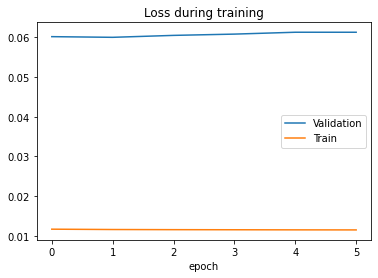

training model lstm[2] h=64,a=5,l=2
epoch 0 batch 200 loss=0.0164, MTL=0.019, MVL=0.117				
saving model MTL=0.018880129572913944, MVL=0.066582839203174
*epoch 1 batch 400 loss=0.0169, MTL=0.0168, MVL=0.0666				
epoch 2 batch 600 loss=0.0183, MTL=0.0168, MVL=0.0674				
epoch 3 batch 800 loss=0.0169, MTL=0.0167, MVL=0.0681				
epoch 4 batch 1000 loss=0.0162, MTL=0.0166, MVL=0.0682				
saving model MTL=0.016380545322693164, MVL=0.06541309224777535
*epoch 5 batch 1200 loss=0.0155, MTL=0.0156, MVL=0.0654				
epoch 6 batch 1400 loss=0.0148, MTL=0.0151, MVL=0.0663				
epoch 7 batch 1600 loss=0.0147, MTL=0.0152, MVL=0.0661				
saving model MTL=0.01509600428409428, MVL=0.06426543003467262
*epoch 8 batch 1800 loss=0.0156, MTL=0.015, MVL=0.0643				
epoch 9 batch 2000 loss=0.0152, MTL=0.015, MVL=0.067				
epoch 10 batch 2200 loss=0.0142, MTL=0.0149, MVL=0.0647				
epoch 11 batch 2400 loss=0.0163, MTL=0.0152, MVL=0.0649				
epoch 11 batch 2600 loss=0.0137, MTL=0.0147, MVL=0.0649				
saving model M

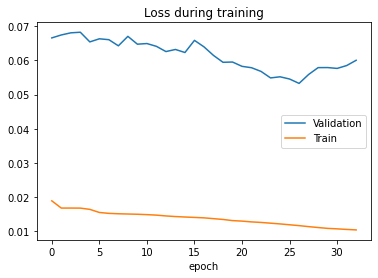

epoch 0 batch 200 loss=0.0111, MTL=0.0111, MVL=0.0532				
epoch 1 batch 400 loss=0.0109, MTL=0.011, MVL=0.0547				
epoch 2 batch 600 loss=0.011, MTL=0.0109, MVL=0.0557				
epoch 3 batch 800 loss=0.011, MTL=0.0108, MVL=0.0559				
epoch 4 batch 1000 loss=0.0104, MTL=0.0108, MVL=0.0561				
epoch 5 batch 1200 loss=0.0101, MTL=0.0108, MVL=0.0563				


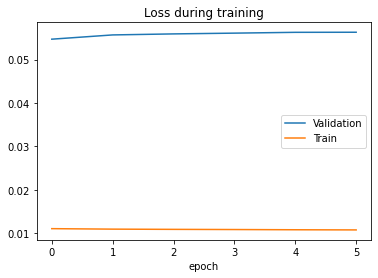

epoch 0 batch 200 loss=0.0106, MTL=0.0112, MVL=0.0531				
epoch 1 batch 400 loss=0.011, MTL=0.0111, MVL=0.0536				
epoch 2 batch 600 loss=0.0107, MTL=0.0111, MVL=0.0537				
epoch 3 batch 800 loss=0.00997, MTL=0.0111, MVL=0.0538				
epoch 4 batch 1000 loss=0.011, MTL=0.011, MVL=0.0537				
epoch 5 batch 1200 loss=0.0119, MTL=0.0111, MVL=0.0542				


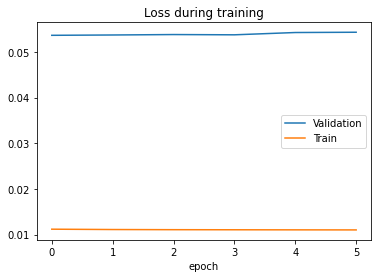

training model lstm[2] h=64,a=5,l=3
epoch 0 batch 200 loss=0.015, MTL=0.019, MVL=0.147				
saving model MTL=0.018836042006856287, MVL=0.0680040312839336
*epoch 1 batch 400 loss=0.0155, MTL=0.0167, MVL=0.068				
saving model MTL=0.016755541370245992, MVL=0.06795882152729348
*epoch 2 batch 600 loss=0.0169, MTL=0.0168, MVL=0.068				
epoch 3 batch 800 loss=0.0168, MTL=0.0168, MVL=0.068				
epoch 4 batch 1000 loss=0.0157, MTL=0.0167, MVL=0.068				
saving model MTL=0.016756419766230792, MVL=0.06736241079500464
*epoch 5 batch 1200 loss=0.0175, MTL=0.0167, MVL=0.0674				
saving model MTL=0.01675367707275026, MVL=0.06674113570422423
*epoch 6 batch 1400 loss=0.0142, MTL=0.0167, MVL=0.0667				
epoch 7 batch 1600 loss=0.0149, MTL=0.0169, MVL=0.0685				
epoch 8 batch 1800 loss=0.0154, MTL=0.0168, MVL=0.0669				
epoch 9 batch 2000 loss=0.0169, MTL=0.0167, MVL=0.0675				
epoch 10 batch 2200 loss=0.0184, MTL=0.017, MVL=0.067				
epoch 11 batch 2400 loss=0.0171, MTL=0.0168, MVL=0.067				
epoch 11 batch

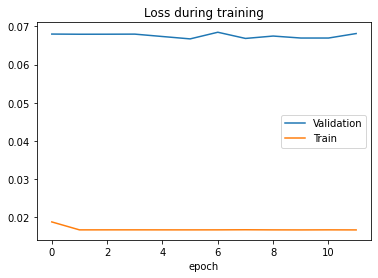

epoch 0 batch 200 loss=0.0152, MTL=0.0167, MVL=0.067				
epoch 1 batch 400 loss=0.0156, MTL=0.0167, MVL=0.0679				
epoch 2 batch 600 loss=0.0158, MTL=0.0167, MVL=0.0673				
epoch 3 batch 800 loss=0.0182, MTL=0.0167, MVL=0.0678				
epoch 4 batch 1000 loss=0.0174, MTL=0.0167, MVL=0.0673				
epoch 5 batch 1200 loss=0.0166, MTL=0.0165, MVL=0.0678				


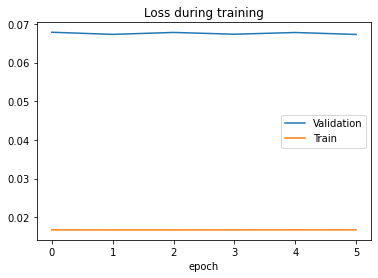

epoch 0 batch 200 loss=0.0167, MTL=0.0167, MVL=0.0668				
epoch 1 batch 400 loss=0.0176, MTL=0.0167, MVL=0.0674				
epoch 2 batch 600 loss=0.0171, MTL=0.0167, MVL=0.0675				
epoch 3 batch 800 loss=0.0172, MTL=0.0167, MVL=0.0676				
epoch 4 batch 1000 loss=0.0169, MTL=0.0167, MVL=0.0678				
epoch 5 batch 1200 loss=0.0163, MTL=0.0167, MVL=0.0678				


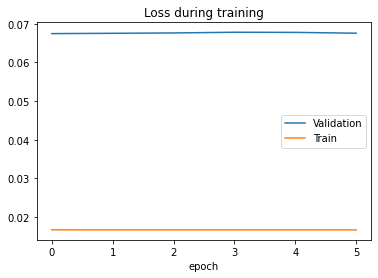

training model lstm[2] h=128,a=5,l=1
epoch 0 batch 200 loss=0.0148, MTL=0.017, MVL=0.0873				
saving model MTL=0.01696326775467753, MVL=0.06731063848147627
*epoch 1 batch 400 loss=0.0146, MTL=0.0159, MVL=0.0673				
saving model MTL=0.015786278894179703, MVL=0.06448182591893634
*epoch 2 batch 600 loss=0.0145, MTL=0.0143, MVL=0.0645				
saving model MTL=0.014223109613159835, MVL=0.057773027996547884
*epoch 3 batch 800 loss=0.0138, MTL=0.0132, MVL=0.0578				
saving model MTL=0.013087564268179478, MVL=0.053233153263076406
*epoch 4 batch 1000 loss=0.0132, MTL=0.0122, MVL=0.0532				
epoch 5 batch 1200 loss=0.0117, MTL=0.0114, MVL=0.0552				
saving model MTL=0.011301709781078974, MVL=0.0510840077014243
*epoch 6 batch 1400 loss=0.0107, MTL=0.0107, MVL=0.0511				
epoch 7 batch 1600 loss=0.0102, MTL=0.0102, MVL=0.053				
epoch 8 batch 1800 loss=0.0101, MTL=0.00965, MVL=0.0538				
epoch 9 batch 2000 loss=0.00853, MTL=0.00927, MVL=0.0539				
saving model MTL=0.009333088247251401, MVL=0.04973480429

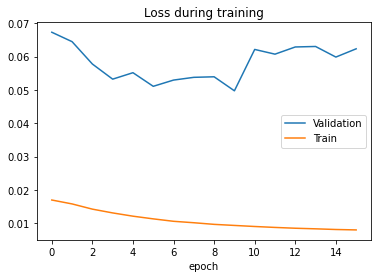

epoch 0 batch 200 loss=0.00892, MTL=0.00852, MVL=0.05				
epoch 1 batch 400 loss=0.00829, MTL=0.00833, MVL=0.0572				
epoch 2 batch 600 loss=0.00822, MTL=0.00827, MVL=0.0601				
epoch 3 batch 800 loss=0.00819, MTL=0.00814, MVL=0.0598				
epoch 4 batch 1000 loss=0.00801, MTL=0.00813, MVL=0.0637				
epoch 5 batch 1200 loss=0.00797, MTL=0.00807, MVL=0.0641				


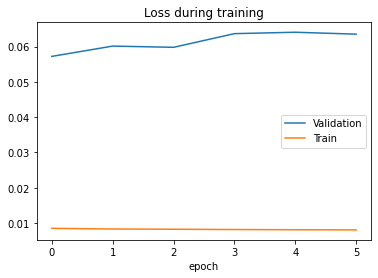

epoch 0 batch 200 loss=0.00828, MTL=0.00872, MVL=0.0499				
epoch 1 batch 400 loss=0.00908, MTL=0.00855, MVL=0.0529				
epoch 2 batch 600 loss=0.00909, MTL=0.00847, MVL=0.0535				
epoch 3 batch 800 loss=0.00866, MTL=0.00844, MVL=0.0542				
epoch 4 batch 1000 loss=0.00805, MTL=0.00841, MVL=0.0551				
epoch 5 batch 1200 loss=0.00821, MTL=0.00838, MVL=0.0555				


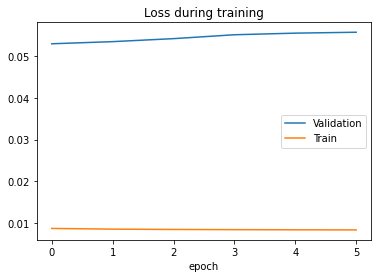

training model lstm[2] h=128,a=5,l=2
epoch 0 batch 200 loss=0.0169, MTL=0.0175, MVL=0.116				
saving model MTL=0.017494427851371227, MVL=0.06864258268328964
*epoch 1 batch 400 loss=0.0171, MTL=0.0168, MVL=0.0686				
saving model MTL=0.016778962523569158, MVL=0.06691612034547524
*epoch 2 batch 600 loss=0.0157, MTL=0.0168, MVL=0.0669				
epoch 3 batch 800 loss=0.0193, MTL=0.0168, MVL=0.0672				
saving model MTL=0.01668643462578959, MVL=0.06455677399625544
*epoch 4 batch 1000 loss=0.0146, MTL=0.0158, MVL=0.0646				
epoch 5 batch 1200 loss=0.0145, MTL=0.0152, MVL=0.0676				
epoch 6 batch 1400 loss=0.0151, MTL=0.0151, MVL=0.0671				
epoch 7 batch 1600 loss=0.0158, MTL=0.0151, MVL=0.0648				
epoch 8 batch 1800 loss=0.0149, MTL=0.0148, MVL=0.0649				
epoch 9 batch 2000 loss=0.0143, MTL=0.0146, MVL=0.0648				


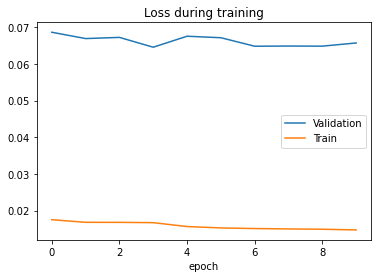

epoch 0 batch 200 loss=0.0167, MTL=0.0159, MVL=0.0649				
epoch 1 batch 400 loss=0.016, MTL=0.0156, MVL=0.0662				
epoch 2 batch 600 loss=0.0156, MTL=0.0155, MVL=0.0655				
epoch 3 batch 800 loss=0.0146, MTL=0.0154, MVL=0.0655				
epoch 4 batch 1000 loss=0.0155, MTL=0.0153, MVL=0.0655				
epoch 5 batch 1200 loss=0.0168, MTL=0.0151, MVL=0.0647				


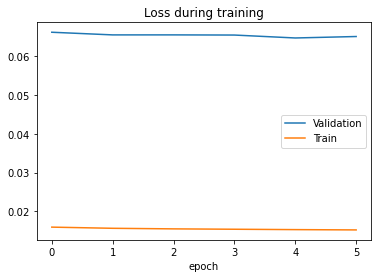

epoch 0 batch 200 loss=0.0164, MTL=0.0161, MVL=0.0645				
epoch 1 batch 400 loss=0.0141, MTL=0.016, MVL=0.0648				
epoch 2 batch 600 loss=0.015, MTL=0.0159, MVL=0.0653				
epoch 3 batch 800 loss=0.0155, MTL=0.016, MVL=0.0655				
epoch 4 batch 1000 loss=0.015, MTL=0.0158, MVL=0.0656				
epoch 5 batch 1200 loss=0.0171, MTL=0.0158, MVL=0.0654				


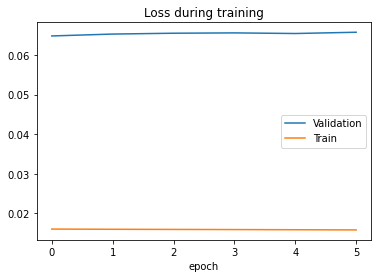

training model lstm[2] h=128,a=5,l=3
epoch 0 batch 200 loss=0.0155, MTL=0.0174, MVL=0.0924				
saving model MTL=0.017392540959993267, MVL=0.06810735856167606
*epoch 1 batch 400 loss=0.0162, MTL=0.0167, MVL=0.0681				
saving model MTL=0.016756825389400605, MVL=0.06763717568800097
*epoch 2 batch 600 loss=0.0166, MTL=0.0168, MVL=0.0676				
epoch 3 batch 800 loss=0.0165, MTL=0.0167, MVL=0.0681				
epoch 4 batch 1000 loss=0.0169, MTL=0.0168, MVL=0.068				
saving model MTL=0.016757999319360003, MVL=0.06699703010867854
*epoch 5 batch 1200 loss=0.016, MTL=0.0168, MVL=0.067				
epoch 6 batch 1400 loss=0.0195, MTL=0.0168, MVL=0.0675				
saving model MTL=0.01674315844091677, MVL=0.06671612373873835
*epoch 7 batch 1600 loss=0.018, MTL=0.0167, MVL=0.0667				
epoch 8 batch 1800 loss=0.0162, MTL=0.0168, MVL=0.0673				
epoch 9 batch 2000 loss=0.0154, MTL=0.0166, MVL=0.0675				
epoch 10 batch 2200 loss=0.0179, MTL=0.017, MVL=0.068				
epoch 11 batch 2400 loss=0.0161, MTL=0.0166, MVL=0.0677				
epoch 11

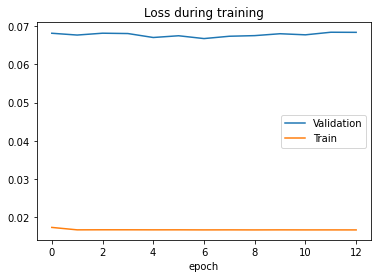

epoch 0 batch 200 loss=0.0163, MTL=0.0167, MVL=0.0668				
epoch 1 batch 400 loss=0.0174, MTL=0.0167, MVL=0.0675				
epoch 2 batch 600 loss=0.0185, MTL=0.0167, MVL=0.0676				
epoch 3 batch 800 loss=0.0158, MTL=0.0167, MVL=0.0674				
epoch 4 batch 1000 loss=0.0178, MTL=0.0167, MVL=0.0678				
epoch 5 batch 1200 loss=0.0168, MTL=0.0166, MVL=0.0679				


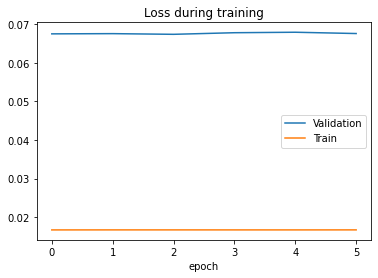

epoch 0 batch 200 loss=0.0168, MTL=0.0167, MVL=0.0665				
epoch 1 batch 400 loss=0.0158, MTL=0.0167, MVL=0.0674				
epoch 2 batch 600 loss=0.0178, MTL=0.0167, MVL=0.0675				
epoch 3 batch 800 loss=0.0171, MTL=0.0167, MVL=0.0675				
epoch 4 batch 1000 loss=0.0163, MTL=0.0167, MVL=0.0677				
epoch 5 batch 1200 loss=0.0162, MTL=0.0167, MVL=0.0678				


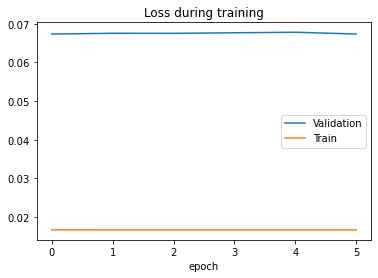

training model lstm[3] h=32,a=5,l=1
epoch 0 batch 200 loss=0.0176, MTL=0.0194, MVL=0.138				
saving model MTL=0.019147411576785525, MVL=0.06696875020861626
*epoch 1 batch 400 loss=0.0156, MTL=0.0166, MVL=0.067				
saving model MTL=0.01660422441734147, MVL=0.0657130013845983
*epoch 2 batch 600 loss=0.0162, MTL=0.0162, MVL=0.0657				
saving model MTL=0.016250958421572287, MVL=0.06403386366904759
*epoch 3 batch 800 loss=0.0142, MTL=0.0156, MVL=0.064				
epoch 4 batch 1000 loss=0.0146, MTL=0.0151, MVL=0.0675				
epoch 5 batch 1200 loss=0.0129, MTL=0.0145, MVL=0.0648				
saving model MTL=0.014495232009461947, MVL=0.06378343359368746
*epoch 6 batch 1400 loss=0.0131, MTL=0.014, MVL=0.0638				
saving model MTL=0.014083685070138923, MVL=0.060867608204239705
*epoch 7 batch 1600 loss=0.0136, MTL=0.0139, MVL=0.0609				
saving model MTL=0.013795865137421865, MVL=0.059928228070989985
*epoch 8 batch 1800 loss=0.013, MTL=0.0136, MVL=0.0599				
epoch 9 batch 2000 loss=0.0123, MTL=0.0133, MVL=0.0651				

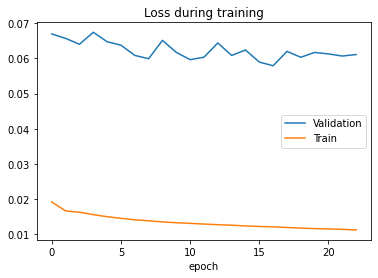

epoch 0 batch 200 loss=0.0114, MTL=0.0116, MVL=0.0578				
epoch 1 batch 400 loss=0.0118, MTL=0.0116, MVL=0.0612				
epoch 2 batch 600 loss=0.0122, MTL=0.0115, MVL=0.0622				
epoch 3 batch 800 loss=0.0112, MTL=0.0115, MVL=0.0642				
epoch 4 batch 1000 loss=0.0105, MTL=0.0115, MVL=0.065				
epoch 5 batch 1200 loss=0.0112, MTL=0.0115, MVL=0.0643				


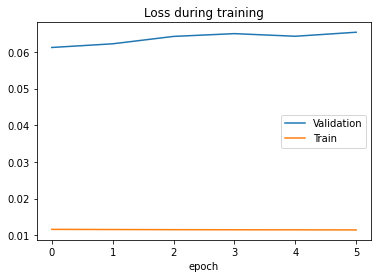

epoch 0 batch 200 loss=0.012, MTL=0.0117, MVL=0.0578				
epoch 1 batch 400 loss=0.0118, MTL=0.0116, MVL=0.06				
epoch 2 batch 600 loss=0.0109, MTL=0.0116, MVL=0.0605				
epoch 3 batch 800 loss=0.0114, MTL=0.0115, MVL=0.0601				
epoch 4 batch 1000 loss=0.0107, MTL=0.0115, MVL=0.0605				
epoch 5 batch 1200 loss=0.012, MTL=0.0115, MVL=0.0609				


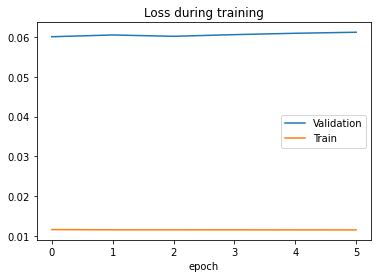

training model lstm[3] h=32,a=5,l=2
epoch 0 batch 200 loss=0.0167, MTL=0.0216, MVL=0.156				
saving model MTL=0.021215476267348786, MVL=0.06790481837557964
*epoch 1 batch 400 loss=0.0166, MTL=0.0167, MVL=0.0679				
saving model MTL=0.016739887915002312, MVL=0.06789771143774517
*epoch 2 batch 600 loss=0.0147, MTL=0.0167, MVL=0.0679				
epoch 3 batch 800 loss=0.0165, MTL=0.0167, MVL=0.069				
saving model MTL=0.016737516694766585, MVL=0.06710270407502769
*epoch 4 batch 1000 loss=0.0156, MTL=0.0167, MVL=0.0671				
epoch 5 batch 1200 loss=0.0154, MTL=0.016, MVL=0.0675				
saving model MTL=0.01581703033727435, MVL=0.06502670171808024
*epoch 6 batch 1400 loss=0.0155, MTL=0.0154, MVL=0.065				
epoch 7 batch 1600 loss=0.0161, MTL=0.0152, MVL=0.0652				
epoch 8 batch 1800 loss=0.0154, MTL=0.015, MVL=0.0652				
epoch 9 batch 2000 loss=0.0148, MTL=0.0151, MVL=0.0652				
epoch 10 batch 2200 loss=0.0152, MTL=0.0149, MVL=0.0657				
epoch 11 batch 2400 loss=0.0144, MTL=0.0154, MVL=0.0662				
epoch 11

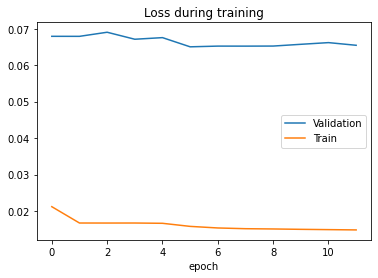

epoch 0 batch 200 loss=0.0148, MTL=0.0153, MVL=0.0646				
epoch 1 batch 400 loss=0.0156, MTL=0.0153, MVL=0.0658				
epoch 2 batch 600 loss=0.0148, MTL=0.0152, MVL=0.0655				
epoch 3 batch 800 loss=0.0157, MTL=0.0152, MVL=0.0659				
epoch 4 batch 1000 loss=0.015, MTL=0.0152, MVL=0.0657				
saving model MTL=0.015134970859242475, MVL=0.06497954314605134
*epoch 5 batch 1200 loss=0.0143, MTL=0.0152, MVL=0.065				
saving model MTL=0.015100719754837351, MVL=0.064710049111335
*epoch 6 batch 1400 loss=0.0153, MTL=0.0151, MVL=0.0647				
epoch 7 batch 1600 loss=0.0146, MTL=0.0151, MVL=0.0654				
epoch 8 batch 1800 loss=0.0163, MTL=0.015, MVL=0.0649				
epoch 9 batch 2000 loss=0.0152, MTL=0.0152, MVL=0.0651				
epoch 10 batch 2200 loss=0.0152, MTL=0.015, MVL=0.0653				
epoch 11 batch 2400 loss=0.0156, MTL=0.0152, MVL=0.0658				
epoch 11 batch 2600 loss=0.0147, MTL=0.0149, MVL=0.0658				


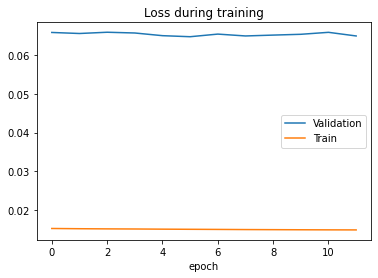

epoch 0 batch 200 loss=0.0146, MTL=0.0151, MVL=0.0648				
epoch 1 batch 400 loss=0.0154, MTL=0.0151, MVL=0.0655				
epoch 2 batch 600 loss=0.015, MTL=0.0151, MVL=0.0654				
epoch 3 batch 800 loss=0.0141, MTL=0.015, MVL=0.065				
epoch 4 batch 1000 loss=0.0134, MTL=0.015, MVL=0.0653				
epoch 5 batch 1200 loss=0.0146, MTL=0.015, MVL=0.0653				


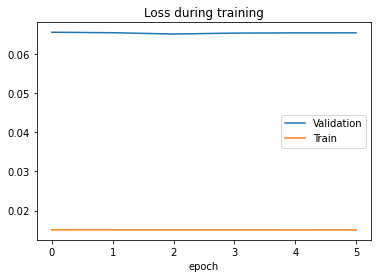

training model lstm[3] h=32,a=5,l=3
epoch 0 batch 200 loss=0.0179, MTL=0.0264, MVL=0.168				
saving model MTL=0.025615073920738314, MVL=0.06741450018570071
*epoch 1 batch 400 loss=0.0173, MTL=0.0168, MVL=0.0674				
epoch 2 batch 600 loss=0.0179, MTL=0.0168, MVL=0.0679				
epoch 3 batch 800 loss=0.0169, MTL=0.0168, MVL=0.0676				
epoch 4 batch 1000 loss=0.0152, MTL=0.0167, MVL=0.0676				
epoch 5 batch 1200 loss=0.0168, MTL=0.0168, MVL=0.0677				
epoch 6 batch 1400 loss=0.0173, MTL=0.0167, MVL=0.0683				
saving model MTL=0.01675324434680598, MVL=0.06741176337980834
*epoch 7 batch 1600 loss=0.0163, MTL=0.0168, MVL=0.0674				
saving model MTL=0.01676899296433283, MVL=0.06730228302175881
*epoch 8 batch 1800 loss=0.0159, MTL=0.0167, MVL=0.0673				
epoch 9 batch 2000 loss=0.0166, MTL=0.0167, MVL=0.0681				
epoch 10 batch 2200 loss=0.0161, MTL=0.0169, MVL=0.0681				
saving model MTL=0.016749022670158868, MVL=0.06686679365449265
*epoch 11 batch 2400 loss=0.0169, MTL=0.0165, MVL=0.0669				
*epoc

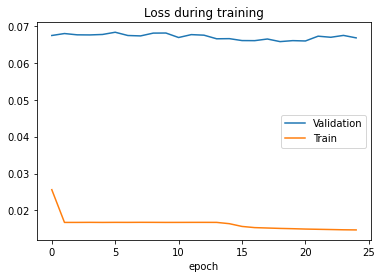

epoch 0 batch 200 loss=0.0146, MTL=0.015, MVL=0.0656				
epoch 1 batch 400 loss=0.0142, MTL=0.0149, MVL=0.0661				
epoch 2 batch 600 loss=0.0159, MTL=0.0149, MVL=0.0662				
epoch 3 batch 800 loss=0.0143, MTL=0.0148, MVL=0.0658				
epoch 4 batch 1000 loss=0.0149, MTL=0.0149, MVL=0.0658				
epoch 5 batch 1200 loss=0.0139, MTL=0.0149, MVL=0.0661				


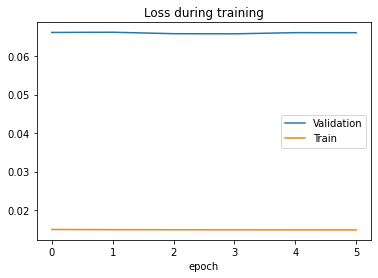

epoch 0 batch 200 loss=0.0146, MTL=0.015, MVL=0.0659				
epoch 1 batch 400 loss=0.0152, MTL=0.0149, MVL=0.0662				
epoch 2 batch 600 loss=0.0138, MTL=0.0149, MVL=0.066				
epoch 3 batch 800 loss=0.0155, MTL=0.0149, MVL=0.0658				
epoch 4 batch 1000 loss=0.0157, MTL=0.0149, MVL=0.0658				
epoch 5 batch 1200 loss=0.0162, MTL=0.0149, MVL=0.0661				


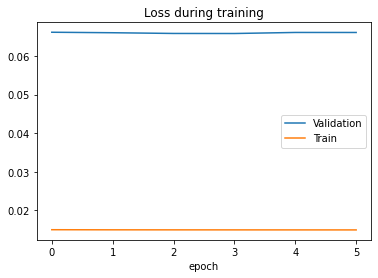

training model lstm[3] h=64,a=5,l=1
epoch 0 batch 200 loss=0.0177, MTL=0.02, MVL=0.141				
saving model MTL=0.01968246085938358, MVL=0.06729717320594632
*epoch 1 batch 400 loss=0.0174, MTL=0.0166, MVL=0.0673				
saving model MTL=0.01660060446091374, MVL=0.06546276044405874
*epoch 2 batch 600 loss=0.0155, MTL=0.0162, MVL=0.0655				
epoch 3 batch 800 loss=0.0163, MTL=0.0155, MVL=0.0656				
saving model MTL=0.015419668805558012, MVL=0.06336242302519376
*epoch 4 batch 1000 loss=0.0145, MTL=0.0148, MVL=0.0634				
epoch 5 batch 1200 loss=0.0129, MTL=0.0141, MVL=0.064				
saving model MTL=0.014004336601372139, MVL=0.06118317113303747
*epoch 6 batch 1400 loss=0.013, MTL=0.0136, MVL=0.0612				
saving model MTL=0.013614610039247072, MVL=0.05955408110481794
*epoch 7 batch 1600 loss=0.0136, MTL=0.0133, MVL=0.0596				
saving model MTL=0.013176542414944568, MVL=0.058114229106023665
*epoch 8 batch 1800 loss=0.0131, MTL=0.0127, MVL=0.0581				
saving model MTL=0.012723399570838373, MVL=0.05654078703679

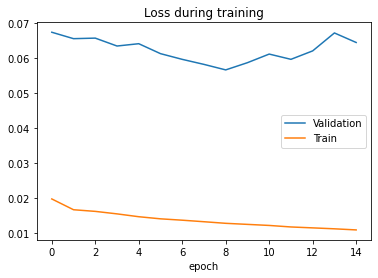

epoch 0 batch 200 loss=0.0122, MTL=0.0121, MVL=0.0566				
epoch 1 batch 400 loss=0.0123, MTL=0.012, MVL=0.06				
epoch 2 batch 600 loss=0.0117, MTL=0.0119, MVL=0.0599				
epoch 3 batch 800 loss=0.0112, MTL=0.0118, MVL=0.0611				
epoch 4 batch 1000 loss=0.0126, MTL=0.0117, MVL=0.0595				
epoch 5 batch 1200 loss=0.0112, MTL=0.0117, MVL=0.0611				


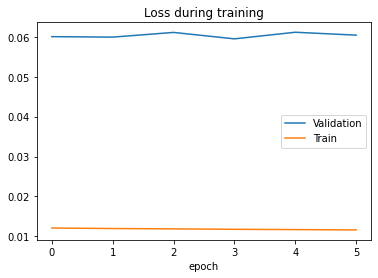

epoch 0 batch 200 loss=0.0113, MTL=0.0122, MVL=0.0568				
epoch 1 batch 400 loss=0.0127, MTL=0.0121, MVL=0.059				
epoch 2 batch 600 loss=0.0119, MTL=0.012, MVL=0.0588				
epoch 3 batch 800 loss=0.0127, MTL=0.0121, MVL=0.0593				
epoch 4 batch 1000 loss=0.0121, MTL=0.012, MVL=0.0592				
epoch 5 batch 1200 loss=0.0128, MTL=0.012, MVL=0.0595				


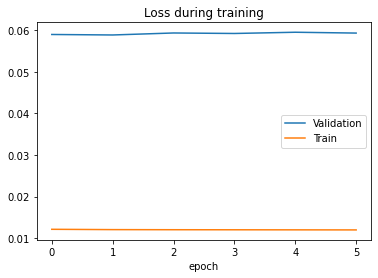

training model lstm[3] h=64,a=5,l=2
epoch 0 batch 200 loss=0.0172, MTL=0.0183, MVL=0.131				
saving model MTL=0.018146785495433665, MVL=0.06797251264091397
*epoch 1 batch 400 loss=0.0175, MTL=0.0168, MVL=0.068				
saving model MTL=0.016768315875653847, MVL=0.0679653210595983
*epoch 2 batch 600 loss=0.0178, MTL=0.0168, MVL=0.068				
saving model MTL=0.0167607459098032, MVL=0.06776074900246057
*epoch 3 batch 800 loss=0.0159, MTL=0.0167, MVL=0.0678				
saving model MTL=0.016705128411474864, MVL=0.06571837221501303
*epoch 4 batch 1000 loss=0.0166, MTL=0.0159, MVL=0.0657				
saving model MTL=0.01573911875331869, MVL=0.06551933032078822
*epoch 5 batch 1200 loss=0.0151, MTL=0.0153, MVL=0.0655				
saving model MTL=0.015245645521594907, MVL=0.06502451283521339
*epoch 6 batch 1400 loss=0.0156, MTL=0.0152, MVL=0.065				
epoch 7 batch 1600 loss=0.0139, MTL=0.015, MVL=0.0653				
epoch 8 batch 1800 loss=0.0147, MTL=0.015, MVL=0.0655				
epoch 9 batch 2000 loss=0.0144, MTL=0.0148, MVL=0.0659				
epoc

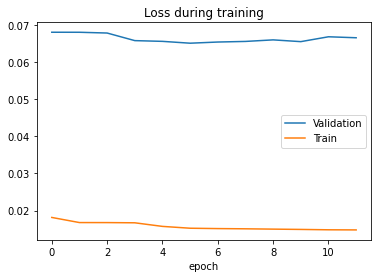

epoch 0 batch 200 loss=0.0163, MTL=0.015, MVL=0.0646				
epoch 1 batch 400 loss=0.0165, MTL=0.015, MVL=0.066				
epoch 2 batch 600 loss=0.0148, MTL=0.015, MVL=0.0658				
epoch 3 batch 800 loss=0.0153, MTL=0.015, MVL=0.0655				
epoch 4 batch 1000 loss=0.0155, MTL=0.015, MVL=0.0652				
epoch 5 batch 1200 loss=0.0152, MTL=0.015, MVL=0.0656				


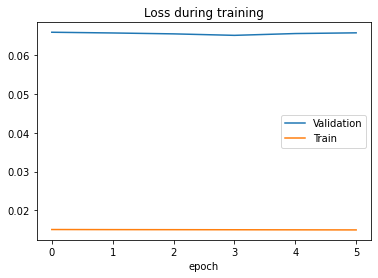

epoch 0 batch 200 loss=0.0155, MTL=0.0151, MVL=0.0647				
epoch 1 batch 400 loss=0.0151, MTL=0.015, MVL=0.0655				
epoch 2 batch 600 loss=0.016, MTL=0.015, MVL=0.0654				
epoch 3 batch 800 loss=0.0177, MTL=0.015, MVL=0.0656				
epoch 4 batch 1000 loss=0.017, MTL=0.0151, MVL=0.0652				
epoch 5 batch 1200 loss=0.0155, MTL=0.015, MVL=0.0654				


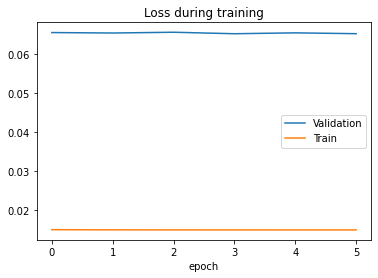

training model lstm[3] h=64,a=5,l=3
epoch 0 batch 200 loss=0.0178, MTL=0.0204, MVL=0.175				
saving model MTL=0.02006894874940133, MVL=0.06798552587384084
*epoch 1 batch 400 loss=0.0168, MTL=0.0168, MVL=0.068				
saving model MTL=0.016745360598208442, MVL=0.06706082820892334
*epoch 2 batch 600 loss=0.0164, MTL=0.0168, MVL=0.0671				
saving model MTL=0.016766767811528, MVL=0.06650663747406396
*epoch 3 batch 800 loss=0.0155, MTL=0.0168, MVL=0.0665				
epoch 4 batch 1000 loss=0.016, MTL=0.0167, MVL=0.0679				
epoch 5 batch 1200 loss=0.0162, MTL=0.0168, MVL=0.0668				
epoch 6 batch 1400 loss=0.0175, MTL=0.0169, MVL=0.0671				
epoch 7 batch 1600 loss=0.0172, MTL=0.0167, MVL=0.069				
epoch 8 batch 1800 loss=0.0169, MTL=0.0167, MVL=0.0674				


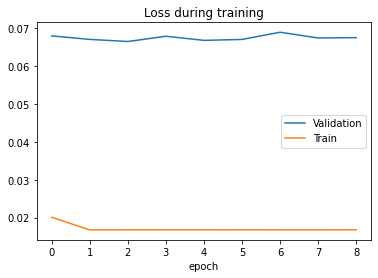

epoch 0 batch 200 loss=0.0163, MTL=0.0167, MVL=0.0666				
epoch 1 batch 400 loss=0.0161, MTL=0.0167, MVL=0.0676				
epoch 2 batch 600 loss=0.0148, MTL=0.0167, MVL=0.0676				
epoch 3 batch 800 loss=0.0198, MTL=0.0167, MVL=0.0677				
epoch 4 batch 1000 loss=0.0165, MTL=0.0168, MVL=0.0681				
epoch 5 batch 1200 loss=0.0177, MTL=0.0167, MVL=0.0675				


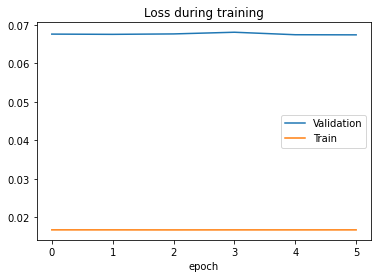

epoch 0 batch 200 loss=0.0167, MTL=0.0168, MVL=0.0665				
epoch 1 batch 400 loss=0.0166, MTL=0.0167, MVL=0.0674				
epoch 2 batch 600 loss=0.0173, MTL=0.0167, MVL=0.0676				
epoch 3 batch 800 loss=0.0183, MTL=0.0166, MVL=0.0674				
epoch 4 batch 1000 loss=0.0155, MTL=0.0167, MVL=0.0677				
epoch 5 batch 1200 loss=0.0162, MTL=0.0167, MVL=0.0674				


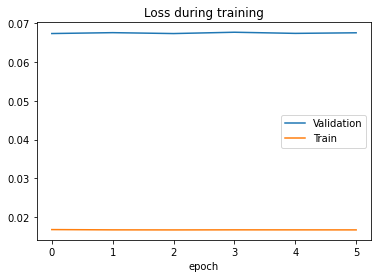

training model lstm[3] h=128,a=5,l=1
epoch 0 batch 200 loss=0.0175, MTL=0.0174, MVL=0.114				
saving model MTL=0.01732229739685075, MVL=0.06733972945662796
*epoch 1 batch 400 loss=0.0161, MTL=0.0162, MVL=0.0673				
saving model MTL=0.016090354976600493, MVL=0.06309864248652927
*epoch 2 batch 600 loss=0.0144, MTL=0.0148, MVL=0.0631				
saving model MTL=0.014664207829789083, MVL=0.059178943577848496
*epoch 3 batch 800 loss=0.0126, MTL=0.0137, MVL=0.0592				
saving model MTL=0.013581690198231128, MVL=0.057442047495822435
*epoch 4 batch 1000 loss=0.0132, MTL=0.0129, MVL=0.0574				
saving model MTL=0.012738229869972176, MVL=0.053526716031989115
*epoch 5 batch 1200 loss=0.0119, MTL=0.0119, MVL=0.0535				
epoch 6 batch 1400 loss=0.011, MTL=0.0111, MVL=0.061				
epoch 7 batch 1600 loss=0.0107, MTL=0.0104, MVL=0.0586				
epoch 8 batch 1800 loss=0.00988, MTL=0.00996, MVL=0.0568				
epoch 9 batch 2000 loss=0.00942, MTL=0.00969, MVL=0.0552				
epoch 10 batch 2200 loss=0.009, MTL=0.00922, MVL=0.057

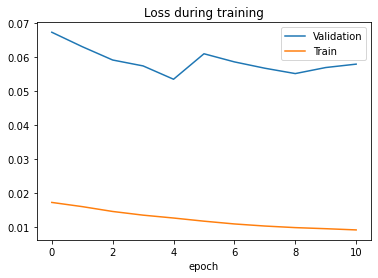

epoch 0 batch 200 loss=0.0106, MTL=0.0115, MVL=0.0535				
epoch 1 batch 400 loss=0.0123, MTL=0.0112, MVL=0.0569				
epoch 2 batch 600 loss=0.0109, MTL=0.0109, MVL=0.0591				
epoch 3 batch 800 loss=0.0106, MTL=0.0108, MVL=0.0601				
epoch 4 batch 1000 loss=0.0104, MTL=0.0105, MVL=0.0607				
epoch 5 batch 1200 loss=0.0103, MTL=0.0104, MVL=0.0604				


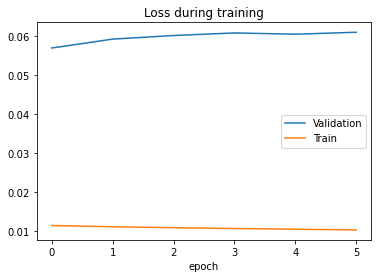

epoch 0 batch 200 loss=0.0109, MTL=0.0118, MVL=0.0535				
epoch 1 batch 400 loss=0.0113, MTL=0.0116, MVL=0.0547				
epoch 2 batch 600 loss=0.0114, MTL=0.0115, MVL=0.0551				
epoch 3 batch 800 loss=0.0105, MTL=0.0114, MVL=0.0552				
epoch 4 batch 1000 loss=0.0129, MTL=0.0114, MVL=0.0558				
epoch 5 batch 1200 loss=0.0118, MTL=0.0114, MVL=0.0556				


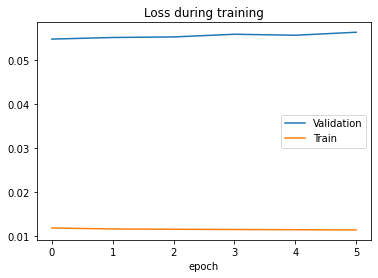

training model lstm[3] h=128,a=5,l=2
epoch 0 batch 200 loss=0.0163, MTL=0.017, MVL=0.0869				
saving model MTL=0.016936628323923883, MVL=0.06755866201930359
*epoch 1 batch 400 loss=0.0139, MTL=0.0167, MVL=0.0676				
saving model MTL=0.01677283851541407, MVL=0.06673207640892169
*epoch 2 batch 600 loss=0.0176, MTL=0.0167, MVL=0.0667				
saving model MTL=0.016536983777232433, MVL=0.06479455958135792
*epoch 3 batch 800 loss=0.0164, MTL=0.0154, MVL=0.0648				
epoch 4 batch 1000 loss=0.0154, MTL=0.0152, MVL=0.067				
epoch 5 batch 1200 loss=0.0151, MTL=0.0151, MVL=0.0659				
epoch 6 batch 1400 loss=0.0149, MTL=0.0149, MVL=0.0659				
saving model MTL=0.014906359038182668, MVL=0.0631025643622289
*epoch 7 batch 1600 loss=0.0155, MTL=0.0147, MVL=0.0631				
epoch 8 batch 1800 loss=0.0137, MTL=0.0143, MVL=0.0645				
epoch 9 batch 2000 loss=0.0132, MTL=0.0138, MVL=0.0644				
epoch 10 batch 2200 loss=0.0135, MTL=0.0135, MVL=0.0636				
epoch 11 batch 2400 loss=0.0125, MTL=0.0132, MVL=0.0649				
epoch

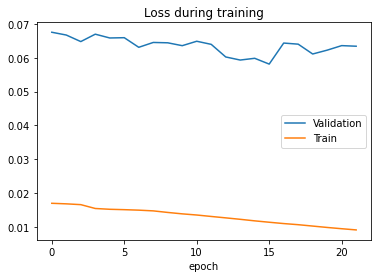

epoch 0 batch 200 loss=0.00958, MTL=0.0107, MVL=0.0582				
epoch 1 batch 400 loss=0.0109, MTL=0.0105, MVL=0.0594				
epoch 2 batch 600 loss=0.0103, MTL=0.0104, MVL=0.0611				
epoch 3 batch 800 loss=0.00987, MTL=0.0104, MVL=0.0617				
epoch 4 batch 1000 loss=0.011, MTL=0.0103, MVL=0.062				
epoch 5 batch 1200 loss=0.00981, MTL=0.0102, MVL=0.0622				


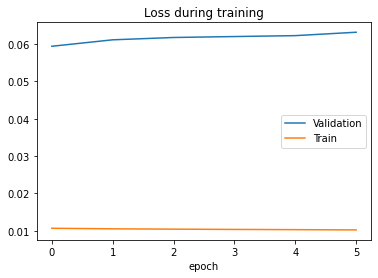

epoch 0 batch 200 loss=0.0101, MTL=0.0108, MVL=0.0583				
epoch 1 batch 400 loss=0.0107, MTL=0.0107, MVL=0.059				
epoch 2 batch 600 loss=0.0104, MTL=0.0106, MVL=0.0589				
epoch 3 batch 800 loss=0.0107, MTL=0.0106, MVL=0.059				
epoch 4 batch 1000 loss=0.0111, MTL=0.0106, MVL=0.0593				
epoch 5 batch 1200 loss=0.00954, MTL=0.0106, MVL=0.0594				


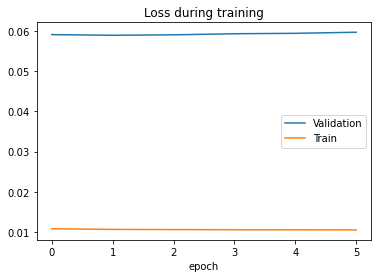

training model lstm[3] h=128,a=5,l=3
epoch 0 batch 200 loss=0.0159, MTL=0.0177, MVL=0.105				
saving model MTL=0.017603199791661056, MVL=0.0681120976805687
*epoch 1 batch 400 loss=0.0172, MTL=0.0168, MVL=0.0681				
epoch 2 batch 600 loss=0.0151, MTL=0.0168, MVL=0.0684				
saving model MTL=0.016774130298451345, MVL=0.06693058534235251
*epoch 3 batch 800 loss=0.0167, MTL=0.0167, MVL=0.0669				
epoch 4 batch 1000 loss=0.0159, MTL=0.0166, MVL=0.0675				
saving model MTL=0.016761538199222034, MVL=0.06621610263331992
*epoch 5 batch 1200 loss=0.0166, MTL=0.0168, MVL=0.0662				
epoch 6 batch 1400 loss=0.0162, MTL=0.0168, MVL=0.0672				
epoch 7 batch 1600 loss=0.017, MTL=0.0166, MVL=0.0674				
epoch 8 batch 1800 loss=0.015, MTL=0.0166, MVL=0.068				
epoch 9 batch 2000 loss=0.0166, MTL=0.0168, MVL=0.067				
epoch 10 batch 2200 loss=0.0168, MTL=0.0169, MVL=0.0668				


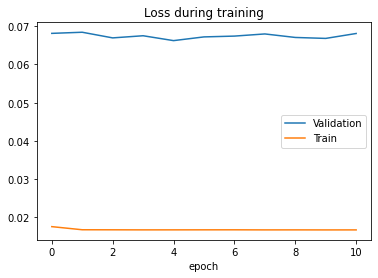

epoch 0 batch 200 loss=0.0161, MTL=0.0167, MVL=0.0667				
epoch 1 batch 400 loss=0.0162, MTL=0.0167, MVL=0.068				
epoch 2 batch 600 loss=0.0153, MTL=0.0166, MVL=0.0676				
epoch 3 batch 800 loss=0.0163, MTL=0.0166, MVL=0.0672				
epoch 4 batch 1000 loss=0.0164, MTL=0.0166, MVL=0.0675				
epoch 5 batch 1200 loss=0.0163, MTL=0.0167, MVL=0.0674				


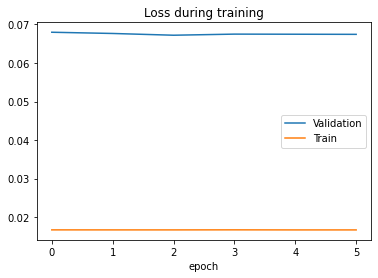

epoch 0 batch 200 loss=0.0188, MTL=0.0167, MVL=0.0664				
epoch 1 batch 400 loss=0.0162, MTL=0.0167, MVL=0.067				
epoch 2 batch 600 loss=0.0172, MTL=0.0166, MVL=0.0676				
epoch 3 batch 800 loss=0.0166, MTL=0.0167, MVL=0.0674				
epoch 4 batch 1000 loss=0.0163, MTL=0.0168, MVL=0.0674				
epoch 5 batch 1200 loss=0.016, MTL=0.0167, MVL=0.0676				


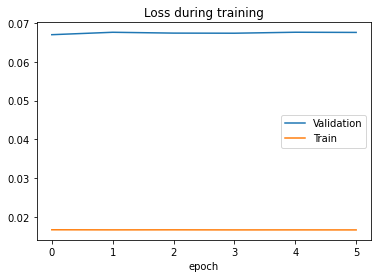

training model lstm[4] h=32,a=5,l=1
epoch 0 batch 200 loss=0.0163, MTL=0.0222, MVL=0.154				
saving model MTL=0.021708417456373915, MVL=0.06756032270486237
*epoch 1 batch 400 loss=0.0176, MTL=0.0168, MVL=0.0676				
saving model MTL=0.016725023835039085, MVL=0.06706105007744226
*epoch 2 batch 600 loss=0.0151, MTL=0.0166, MVL=0.0671				
saving model MTL=0.01653026109604242, MVL=0.06638009485895516
*epoch 3 batch 800 loss=0.0149, MTL=0.0161, MVL=0.0664				
epoch 4 batch 1000 loss=0.0136, MTL=0.0155, MVL=0.0668				
saving model MTL=0.015368671049170779, MVL=0.063043903681587
*epoch 5 batch 1200 loss=0.0149, MTL=0.0149, MVL=0.063				
saving model MTL=0.014855903251448534, MVL=0.06166758944020897
*epoch 6 batch 1400 loss=0.0137, MTL=0.0145, MVL=0.0617				
saving model MTL=0.0144950112087592, MVL=0.06151461430260392
*epoch 7 batch 1600 loss=0.0133, MTL=0.0143, MVL=0.0615				
saving model MTL=0.014213208289396378, MVL=0.059132575011644206
*epoch 8 batch 1800 loss=0.0133, MTL=0.0142, MVL=0.0591

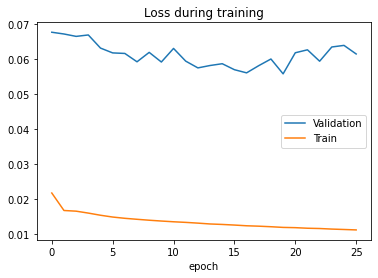

epoch 0 batch 200 loss=0.0118, MTL=0.0115, MVL=0.0555				
epoch 1 batch 400 loss=0.0119, MTL=0.0115, MVL=0.0585				
epoch 2 batch 600 loss=0.0122, MTL=0.0115, MVL=0.0599				
epoch 3 batch 800 loss=0.0106, MTL=0.0114, MVL=0.0593				
epoch 4 batch 1000 loss=0.0112, MTL=0.0114, MVL=0.06				
epoch 5 batch 1200 loss=0.0118, MTL=0.0114, MVL=0.06				


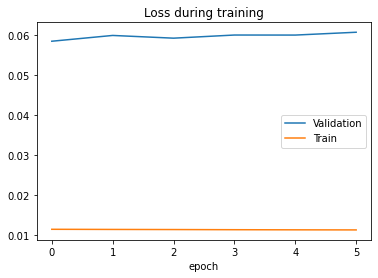

epoch 0 batch 200 loss=0.0112, MTL=0.0115, MVL=0.0557				
epoch 1 batch 400 loss=0.011, MTL=0.0115, MVL=0.0584				
epoch 2 batch 600 loss=0.0115, MTL=0.0115, MVL=0.0583				
epoch 3 batch 800 loss=0.0113, MTL=0.0115, MVL=0.0584				
epoch 4 batch 1000 loss=0.0114, MTL=0.0115, MVL=0.0589				
epoch 5 batch 1200 loss=0.0118, MTL=0.0115, MVL=0.0588				


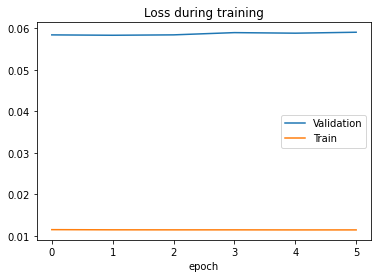

training model lstm[4] h=32,a=5,l=2
epoch 0 batch 200 loss=0.0156, MTL=0.0226, MVL=0.133				
saving model MTL=0.02209263382488132, MVL=0.06840922695691468
*epoch 1 batch 400 loss=0.0183, MTL=0.0168, MVL=0.0684				
saving model MTL=0.01675310785010938, MVL=0.06824594387998346
*epoch 2 batch 600 loss=0.0175, MTL=0.0168, MVL=0.0682				
saving model MTL=0.016739001579170677, MVL=0.0676446693231825
*epoch 3 batch 800 loss=0.0191, MTL=0.0167, MVL=0.0676				
epoch 4 batch 1000 loss=0.0178, MTL=0.0167, MVL=0.0682				
epoch 5 batch 1200 loss=0.0159, MTL=0.0163, MVL=0.0681				
epoch 6 batch 1400 loss=0.0166, MTL=0.0156, MVL=0.0695				
saving model MTL=0.015463674119094275, MVL=0.06695809178665037
*epoch 7 batch 1600 loss=0.0145, MTL=0.0152, MVL=0.067				
saving model MTL=0.0152439789048263, MVL=0.0656192238580008
*epoch 8 batch 1800 loss=0.0162, MTL=0.0151, MVL=0.0656				
epoch 9 batch 2000 loss=0.0155, MTL=0.0149, MVL=0.0658				
epoch 10 batch 2200 loss=0.016, MTL=0.015, MVL=0.0672				
epoch 11

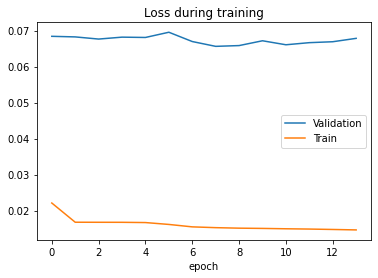

epoch 0 batch 200 loss=0.0137, MTL=0.015, MVL=0.0657				
epoch 1 batch 400 loss=0.0146, MTL=0.0149, MVL=0.0662				
epoch 2 batch 600 loss=0.0156, MTL=0.0149, MVL=0.0664				
epoch 3 batch 800 loss=0.0148, MTL=0.0149, MVL=0.0666				
epoch 4 batch 1000 loss=0.0155, MTL=0.0149, MVL=0.067				
epoch 5 batch 1200 loss=0.0153, MTL=0.0149, MVL=0.0666				


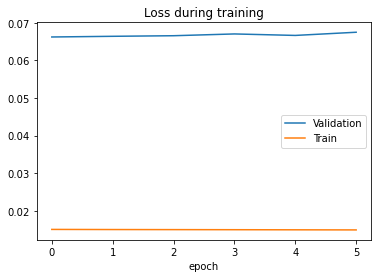

epoch 0 batch 200 loss=0.0138, MTL=0.015, MVL=0.0653				
epoch 1 batch 400 loss=0.0145, MTL=0.015, MVL=0.0663				
epoch 2 batch 600 loss=0.015, MTL=0.015, MVL=0.0664				
epoch 3 batch 800 loss=0.0144, MTL=0.015, MVL=0.0666				
epoch 4 batch 1000 loss=0.0153, MTL=0.015, MVL=0.0667				
epoch 5 batch 1200 loss=0.0157, MTL=0.015, MVL=0.0666				


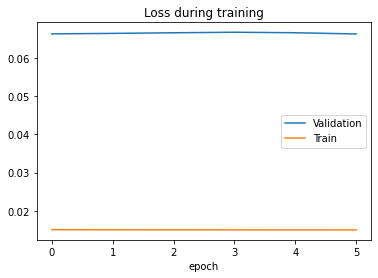

training model lstm[4] h=32,a=5,l=3
epoch 0 batch 200 loss=0.0182, MTL=0.0261, MVL=0.214				
saving model MTL=0.025355740652037655, MVL=0.06752906935136826
*epoch 1 batch 400 loss=0.015, MTL=0.0167, MVL=0.0675				
saving model MTL=0.016738902446964094, MVL=0.06749555834981262
*epoch 2 batch 600 loss=0.0161, MTL=0.0169, MVL=0.0675				
saving model MTL=0.016754946529796595, MVL=0.06723997412157841
*epoch 3 batch 800 loss=0.0166, MTL=0.0168, MVL=0.0672				
epoch 4 batch 1000 loss=0.0194, MTL=0.0169, MVL=0.0679				
epoch 5 batch 1200 loss=0.0168, MTL=0.0167, MVL=0.0675				
epoch 6 batch 1400 loss=0.0145, MTL=0.0169, MVL=0.0672				
epoch 7 batch 1600 loss=0.0196, MTL=0.0168, MVL=0.0682				
saving model MTL=0.016766919754445553, MVL=0.06709908883346886
*epoch 8 batch 1800 loss=0.0175, MTL=0.0168, MVL=0.0671				
epoch 9 batch 2000 loss=0.0168, MTL=0.0168, MVL=0.0676				
epoch 10 batch 2200 loss=0.0169, MTL=0.017, MVL=0.0675				
epoch 11 batch 2400 loss=0.0162, MTL=0.0166, MVL=0.0683				
epoch

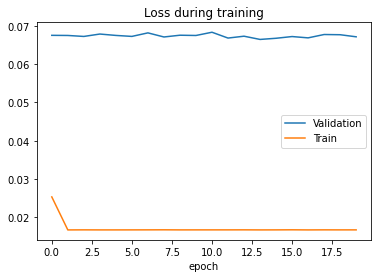

epoch 0 batch 200 loss=0.0172, MTL=0.0167, MVL=0.0664				
epoch 1 batch 400 loss=0.0176, MTL=0.0167, MVL=0.0673				
epoch 2 batch 600 loss=0.0144, MTL=0.0167, MVL=0.0676				
epoch 3 batch 800 loss=0.0168, MTL=0.0167, MVL=0.0674				
epoch 4 batch 1000 loss=0.0184, MTL=0.0167, MVL=0.0674				
epoch 5 batch 1200 loss=0.0161, MTL=0.0168, MVL=0.0676				


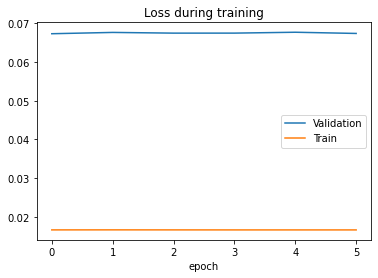

epoch 0 batch 200 loss=0.0167, MTL=0.0167, MVL=0.0662				
epoch 1 batch 400 loss=0.016, MTL=0.0167, MVL=0.0671				
epoch 2 batch 600 loss=0.0152, MTL=0.0167, MVL=0.0675				
epoch 3 batch 800 loss=0.0164, MTL=0.0167, MVL=0.068				
epoch 4 batch 1000 loss=0.0193, MTL=0.0166, MVL=0.0677				
epoch 5 batch 1200 loss=0.0164, MTL=0.0167, MVL=0.0675				


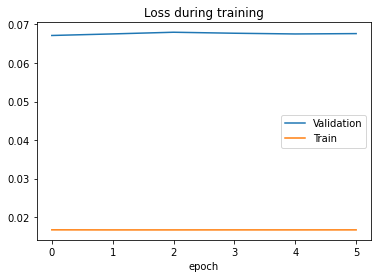

training model lstm[4] h=64,a=5,l=1
epoch 0 batch 200 loss=0.0175, MTL=0.0187, MVL=0.125				
saving model MTL=0.01854071088890601, MVL=0.06772855376122427
*epoch 1 batch 400 loss=0.0171, MTL=0.0166, MVL=0.0677				
saving model MTL=0.016633813205059224, MVL=0.06654645514781357
*epoch 2 batch 600 loss=0.0154, MTL=0.0162, MVL=0.0665				
saving model MTL=0.016189029959592677, MVL=0.06279082242094103
*epoch 3 batch 800 loss=0.0171, MTL=0.0155, MVL=0.0628				
epoch 4 batch 1000 loss=0.0147, MTL=0.0146, MVL=0.0638				
saving model MTL=0.014525298372529069, MVL=0.060694560958225216
*epoch 5 batch 1200 loss=0.0142, MTL=0.014, MVL=0.0607				
saving model MTL=0.013830708717489572, MVL=0.05893840280468347
*epoch 6 batch 1400 loss=0.0126, MTL=0.0134, MVL=0.0589				
saving model MTL=0.013360182673151042, MVL=0.05756830112611661
*epoch 7 batch 1600 loss=0.0132, MTL=0.0131, MVL=0.0576				
saving model MTL=0.012977398129411831, MVL=0.056401064588886794
*epoch 8 batch 1800 loss=0.014, MTL=0.0129, MVL=0.

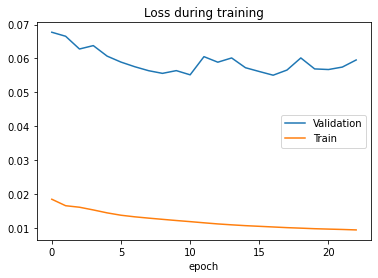

epoch 0 batch 200 loss=0.00993, MTL=0.00972, MVL=0.0554				
epoch 1 batch 400 loss=0.01, MTL=0.00966, MVL=0.058				
epoch 2 batch 600 loss=0.00895, MTL=0.0096, MVL=0.057				
epoch 3 batch 800 loss=0.00962, MTL=0.00961, MVL=0.058				
epoch 4 batch 1000 loss=0.00973, MTL=0.00955, MVL=0.0578				
epoch 5 batch 1200 loss=0.0101, MTL=0.00952, MVL=0.0573				


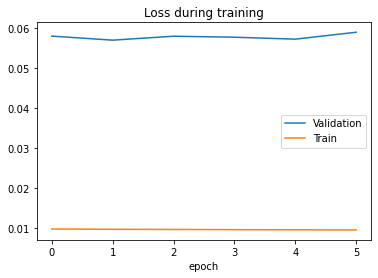

epoch 0 batch 200 loss=0.0102, MTL=0.00978, MVL=0.0551				
epoch 1 batch 400 loss=0.00953, MTL=0.00971, MVL=0.0568				
epoch 2 batch 600 loss=0.0106, MTL=0.0097, MVL=0.0574				
epoch 3 batch 800 loss=0.0101, MTL=0.00966, MVL=0.057				
epoch 4 batch 1000 loss=0.00978, MTL=0.00968, MVL=0.0574				
epoch 5 batch 1200 loss=0.0108, MTL=0.0097, MVL=0.0579				


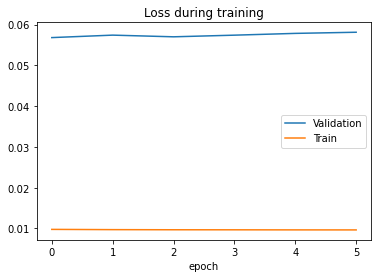

training model lstm[4] h=64,a=5,l=2
epoch 0 batch 200 loss=0.0167, MTL=0.0195, MVL=0.127				
saving model MTL=0.019338988540222018, MVL=0.06781586882520894
*epoch 1 batch 400 loss=0.0162, MTL=0.0168, MVL=0.0678				
epoch 2 batch 600 loss=0.0172, MTL=0.0168, MVL=0.0685				
saving model MTL=0.016755110305231836, MVL=0.06720556642432682
*epoch 3 batch 800 loss=0.0157, MTL=0.0168, MVL=0.0672				
epoch 4 batch 1000 loss=0.0178, MTL=0.0168, MVL=0.0677				
saving model MTL=0.0167540566746815, MVL=0.06681690676534763
*epoch 5 batch 1200 loss=0.0155, MTL=0.0166, MVL=0.0668				
saving model MTL=0.016245164706753697, MVL=0.06567399631269642
*epoch 6 batch 1400 loss=0.0156, MTL=0.0155, MVL=0.0657				
saving model MTL=0.015430923182225447, MVL=0.06533440568896591
*epoch 7 batch 1600 loss=0.0157, MTL=0.0153, MVL=0.0653				
saving model MTL=0.015219880061970878, MVL=0.06486178238372334
*epoch 8 batch 1800 loss=0.015, MTL=0.0151, MVL=0.0649				
epoch 9 batch 2000 loss=0.0135, MTL=0.0149, MVL=0.0658			

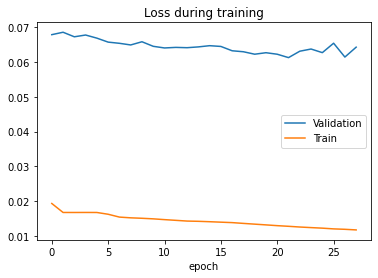

epoch 0 batch 200 loss=0.0125, MTL=0.0124, MVL=0.0612				
epoch 1 batch 400 loss=0.0124, MTL=0.0123, MVL=0.0622				
epoch 2 batch 600 loss=0.0122, MTL=0.0123, MVL=0.0624				
epoch 3 batch 800 loss=0.0128, MTL=0.0123, MVL=0.0623				
epoch 4 batch 1000 loss=0.0128, MTL=0.0122, MVL=0.0613				
epoch 5 batch 1200 loss=0.0132, MTL=0.0122, MVL=0.0619				


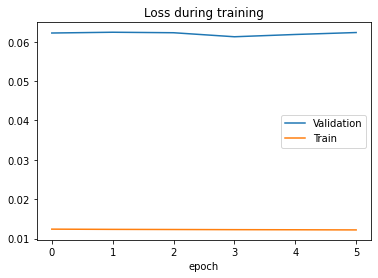

epoch 0 batch 200 loss=0.012, MTL=0.0124, MVL=0.0616				
epoch 1 batch 400 loss=0.0117, MTL=0.0124, MVL=0.062				
epoch 2 batch 600 loss=0.0127, MTL=0.0123, MVL=0.0618				
epoch 3 batch 800 loss=0.0125, MTL=0.0124, MVL=0.0618				
epoch 4 batch 1000 loss=0.0126, MTL=0.0124, MVL=0.0619				
epoch 5 batch 1200 loss=0.0125, MTL=0.0123, MVL=0.0624				


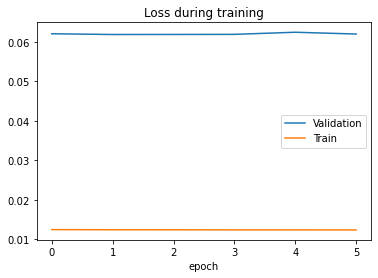

training model lstm[4] h=64,a=5,l=3
epoch 0 batch 200 loss=0.0177, MTL=0.0188, MVL=0.134				
saving model MTL=0.018619664000510346, MVL=0.06681822539597261
*epoch 1 batch 400 loss=0.0176, MTL=0.0167, MVL=0.0668				
epoch 2 batch 600 loss=0.0155, MTL=0.0167, MVL=0.0672				
epoch 3 batch 800 loss=0.0179, MTL=0.0168, MVL=0.0679				
epoch 4 batch 1000 loss=0.0168, MTL=0.0167, MVL=0.0678				
epoch 5 batch 1200 loss=0.018, MTL=0.0168, MVL=0.0686				
epoch 6 batch 1400 loss=0.0162, MTL=0.0169, MVL=0.0671				


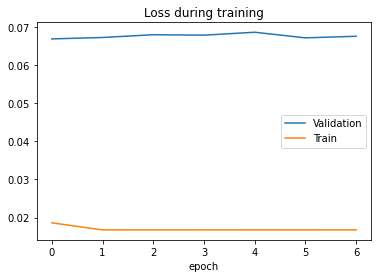

epoch 0 batch 200 loss=0.0164, MTL=0.0167, MVL=0.0667				
epoch 1 batch 400 loss=0.0171, MTL=0.0168, MVL=0.068				
epoch 2 batch 600 loss=0.0154, MTL=0.0167, MVL=0.0674				
epoch 3 batch 800 loss=0.0154, MTL=0.0167, MVL=0.0678				
epoch 4 batch 1000 loss=0.0154, MTL=0.0167, MVL=0.0673				
epoch 5 batch 1200 loss=0.0147, MTL=0.0167, MVL=0.0677				


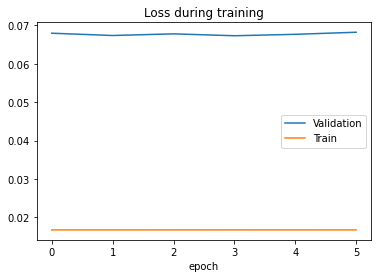

epoch 0 batch 200 loss=0.0167, MTL=0.0167, MVL=0.0671				
epoch 1 batch 400 loss=0.0167, MTL=0.0167, MVL=0.0674				
epoch 2 batch 600 loss=0.0166, MTL=0.0166, MVL=0.0675				
epoch 3 batch 800 loss=0.0176, MTL=0.0167, MVL=0.0679				
epoch 4 batch 1000 loss=0.018, MTL=0.0167, MVL=0.0674				
epoch 5 batch 1200 loss=0.0171, MTL=0.0167, MVL=0.0675				


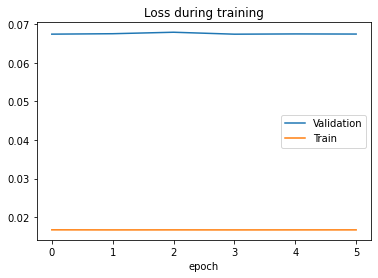

training model lstm[4] h=128,a=5,l=1
epoch 0 batch 200 loss=0.0178, MTL=0.0172, MVL=0.0846				
saving model MTL=0.017144470355443416, MVL=0.06601656075628078
*epoch 1 batch 400 loss=0.0148, MTL=0.0162, MVL=0.066				
saving model MTL=0.016131100317780873, MVL=0.06376567879905466
*epoch 2 batch 600 loss=0.0134, MTL=0.0148, MVL=0.0638				
saving model MTL=0.014698748051914201, MVL=0.06352200701099928
*epoch 3 batch 800 loss=0.0124, MTL=0.0139, MVL=0.0635				
saving model MTL=0.013802319048358823, MVL=0.060155276086975316
*epoch 4 batch 1000 loss=0.0121, MTL=0.0131, MVL=0.0602				
saving model MTL=0.012923251764531234, MVL=0.053974089075307374
*epoch 5 batch 1200 loss=0.0133, MTL=0.0122, MVL=0.054				
saving model MTL=0.012113559042631481, MVL=0.05350914536440959
*epoch 6 batch 1400 loss=0.0116, MTL=0.0115, MVL=0.0535				
epoch 7 batch 1600 loss=0.0105, MTL=0.0107, MVL=0.0543				
saving model MTL=0.010612286009272123, MVL=0.0510749132296101
*epoch 8 batch 1800 loss=0.00969, MTL=0.0101, MVL

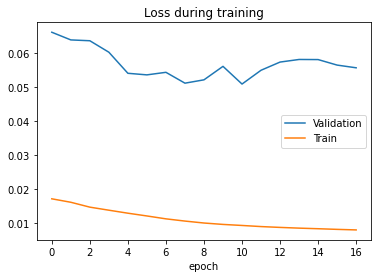

epoch 0 batch 200 loss=0.00819, MTL=0.00848, MVL=0.0509				
epoch 1 batch 400 loss=0.00808, MTL=0.00834, MVL=0.0546				
epoch 2 batch 600 loss=0.00803, MTL=0.00823, MVL=0.0552				
epoch 3 batch 800 loss=0.00858, MTL=0.0082, MVL=0.0556				
epoch 4 batch 1000 loss=0.00829, MTL=0.00815, MVL=0.0575				
epoch 5 batch 1200 loss=0.00742, MTL=0.0081, MVL=0.0584				


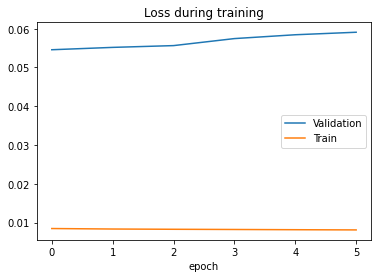

epoch 0 batch 200 loss=0.0082, MTL=0.00859, MVL=0.051				
epoch 1 batch 400 loss=0.00835, MTL=0.00847, MVL=0.0518				
epoch 2 batch 600 loss=0.0078, MTL=0.00841, MVL=0.0526				
epoch 3 batch 800 loss=0.0083, MTL=0.00837, MVL=0.0533				
epoch 4 batch 1000 loss=0.00827, MTL=0.00835, MVL=0.0536				
epoch 5 batch 1200 loss=0.00844, MTL=0.0083, MVL=0.0537				


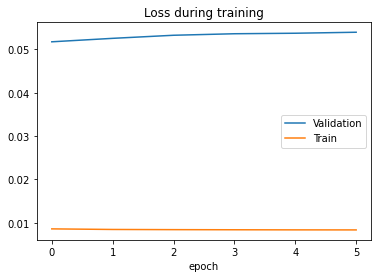

training model lstm[4] h=128,a=5,l=2
epoch 0 batch 200 loss=0.0155, MTL=0.0172, MVL=0.091				
saving model MTL=0.017174844527059162, MVL=0.06675273918958961
*epoch 1 batch 400 loss=0.016, MTL=0.0167, MVL=0.0668				
epoch 2 batch 600 loss=0.0157, MTL=0.0168, MVL=0.0668				
epoch 3 batch 800 loss=0.017, MTL=0.0168, MVL=0.0685				
saving model MTL=0.016465227887858442, MVL=0.06669906184810107
*epoch 4 batch 1000 loss=0.0159, MTL=0.0154, MVL=0.0667				
saving model MTL=0.015390917654514037, MVL=0.0654195450612756
*epoch 5 batch 1200 loss=0.0149, MTL=0.0152, MVL=0.0654				
epoch 6 batch 1400 loss=0.0128, MTL=0.0152, MVL=0.0655				
epoch 7 batch 1600 loss=0.0151, MTL=0.0149, MVL=0.0665				
epoch 8 batch 1800 loss=0.0141, MTL=0.0148, MVL=0.0665				
saving model MTL=0.01470600055693756, MVL=0.0647038915118233
*epoch 9 batch 2000 loss=0.0143, MTL=0.0145, MVL=0.0647				
saving model MTL=0.014400376208675897, MVL=0.06441460110124994
*epoch 10 batch 2200 loss=0.0146, MTL=0.0142, MVL=0.0644				
sav

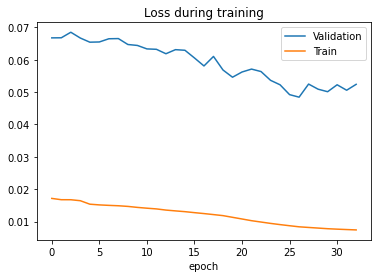

epoch 0 batch 200 loss=0.00734, MTL=0.0078, MVL=0.0486				
epoch 1 batch 400 loss=0.00816, MTL=0.00768, MVL=0.051				
epoch 2 batch 600 loss=0.00732, MTL=0.00762, MVL=0.052				
epoch 3 batch 800 loss=0.00755, MTL=0.00759, MVL=0.0516				
epoch 4 batch 1000 loss=0.00731, MTL=0.00757, MVL=0.0517				
epoch 5 batch 1200 loss=0.00806, MTL=0.00755, MVL=0.0519				


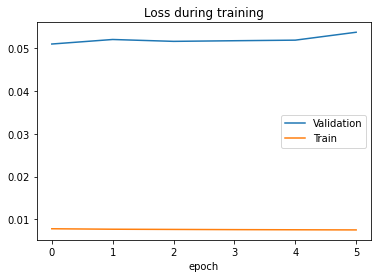

epoch 0 batch 200 loss=0.00764, MTL=0.00791, MVL=0.0485				
epoch 1 batch 400 loss=0.00785, MTL=0.0078, MVL=0.0499				
epoch 2 batch 600 loss=0.00785, MTL=0.00776, MVL=0.0502				
epoch 3 batch 800 loss=0.00767, MTL=0.0077, MVL=0.0504				
epoch 4 batch 1000 loss=0.007, MTL=0.00771, MVL=0.0506				
epoch 5 batch 1200 loss=0.00766, MTL=0.00773, MVL=0.0507				


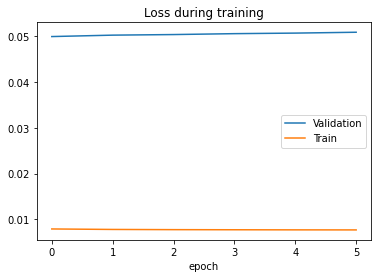

training model lstm[4] h=128,a=5,l=3
epoch 0 batch 200 loss=0.0154, MTL=0.0175, MVL=0.0954				
saving model MTL=0.017413398289563745, MVL=0.06768143573989634
*epoch 1 batch 400 loss=0.0155, MTL=0.0167, MVL=0.0677				
epoch 2 batch 600 loss=0.0136, MTL=0.0167, MVL=0.0681				
saving model MTL=0.016765010856469656, MVL=0.06729157079682975
*epoch 3 batch 800 loss=0.0158, MTL=0.0167, MVL=0.0673				
epoch 4 batch 1000 loss=0.0173, MTL=0.0169, MVL=0.068				
saving model MTL=0.01678293230106479, MVL=0.06641874273048072
*epoch 5 batch 1200 loss=0.0163, MTL=0.0167, MVL=0.0664				
epoch 6 batch 1400 loss=0.0197, MTL=0.0168, MVL=0.0685				
epoch 7 batch 1600 loss=0.0183, MTL=0.0168, MVL=0.0676				
epoch 8 batch 1800 loss=0.0162, MTL=0.0169, MVL=0.0687				
epoch 9 batch 2000 loss=0.017, MTL=0.0169, MVL=0.0679				
epoch 10 batch 2200 loss=0.0155, MTL=0.017, MVL=0.0665				


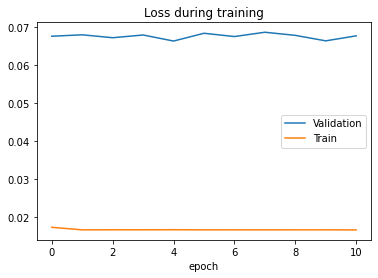

epoch 0 batch 200 loss=0.0154, MTL=0.0167, MVL=0.0667				
epoch 1 batch 400 loss=0.0162, MTL=0.0168, MVL=0.0676				
epoch 2 batch 600 loss=0.0156, MTL=0.0167, MVL=0.0678				
epoch 3 batch 800 loss=0.018, MTL=0.0167, MVL=0.0677				
epoch 4 batch 1000 loss=0.0162, MTL=0.0167, MVL=0.0677				
epoch 5 batch 1200 loss=0.0176, MTL=0.0167, MVL=0.0677				


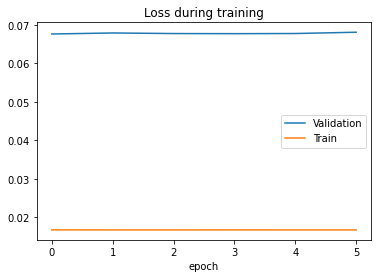

epoch 0 batch 200 loss=0.0181, MTL=0.0167, MVL=0.0667				
epoch 1 batch 400 loss=0.0151, MTL=0.0167, MVL=0.0675				
epoch 2 batch 600 loss=0.0168, MTL=0.0167, MVL=0.0676				
epoch 3 batch 800 loss=0.0158, MTL=0.0166, MVL=0.0675				
epoch 4 batch 1000 loss=0.0178, MTL=0.0167, MVL=0.068				
epoch 5 batch 1200 loss=0.0168, MTL=0.0166, MVL=0.0677				


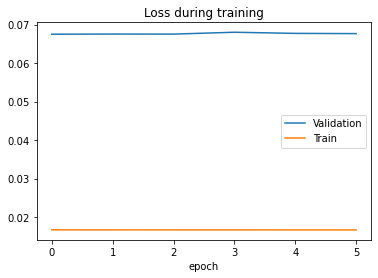

In [415]:
wg_tmp.reverse_train = False
train.train_window_models(models_a, wg_tmp, patience=5, validate=True, criterion=custom_criterion)

training model lstm[0] h=32,a=5,l=1
epoch 0 batch 200 loss=0.0168, MTL=0.0272, MVL=0.173				
epoch 0 batch 400 loss=0.0183, MTL=0.0227, MVL=0.173				
saving model MTL=0.02234524117425669, MVL=0.0681705548137915
*epoch 1 batch 600 loss=0.0168, MTL=0.0179, MVL=0.0682				
*epoch 1 batch 800 loss=0.0162, MTL=0.0178, MVL=0.0682				
saving model MTL=0.01771896398103609, MVL=0.06716148866737476
*epoch 2 batch 1000 loss=0.0169, MTL=0.0173, MVL=0.0672				
*epoch 2 batch 1200 loss=0.0162, MTL=0.017, MVL=0.0672				
saving model MTL=0.016873648588053073, MVL=0.0626634163323973
*epoch 3 batch 1400 loss=0.0166, MTL=0.016, MVL=0.0627				
*epoch 3 batch 1600 loss=0.0153, MTL=0.0159, MVL=0.0627				
saving model MTL=0.015741597028668567, MVL=0.06252215222501364
*epoch 4 batch 1800 loss=0.0148, MTL=0.0152, MVL=0.0625				
*epoch 4 batch 2000 loss=0.0158, MTL=0.0152, MVL=0.0625				
epoch 5 batch 2200 loss=0.0164, MTL=0.0148, MVL=0.0627				
epoch 5 batch 2400 loss=0.0139, MTL=0.0146, MVL=0.0627				
saving m

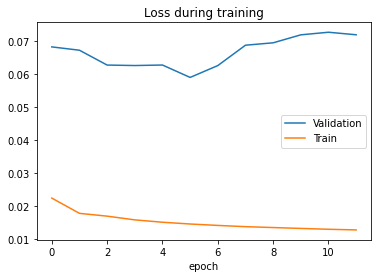

epoch 0 batch 200 loss=0.014, MTL=0.014, MVL=0.059				
epoch 0 batch 400 loss=0.014, MTL=0.0139, MVL=0.059				
epoch 1 batch 600 loss=0.0145, MTL=0.0139, MVL=0.0659				
epoch 1 batch 800 loss=0.0133, MTL=0.0138, MVL=0.0659				
epoch 2 batch 1000 loss=0.0132, MTL=0.0137, MVL=0.0651				
epoch 2 batch 1200 loss=0.0135, MTL=0.0138, MVL=0.0651				
epoch 3 batch 1400 loss=0.0143, MTL=0.0137, MVL=0.0659				
epoch 3 batch 1600 loss=0.0135, MTL=0.0137, MVL=0.0659				
epoch 4 batch 1800 loss=0.0147, MTL=0.0135, MVL=0.0644				
epoch 4 batch 2000 loss=0.0133, MTL=0.0136, MVL=0.0644				
epoch 5 batch 2200 loss=0.0131, MTL=0.0136, MVL=0.0657				
epoch 5 batch 2400 loss=0.0136, MTL=0.0135, MVL=0.0657				


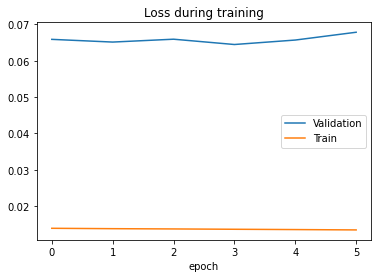

epoch 0 batch 200 loss=0.0153, MTL=0.0141, MVL=0.0589				
epoch 0 batch 400 loss=0.0142, MTL=0.014, MVL=0.0589				
epoch 1 batch 600 loss=0.0135, MTL=0.0139, MVL=0.0638				
epoch 1 batch 800 loss=0.0137, MTL=0.0139, MVL=0.0638				
epoch 2 batch 1000 loss=0.0148, MTL=0.0139, MVL=0.064				
epoch 2 batch 1200 loss=0.0141, MTL=0.0139, MVL=0.064				
epoch 3 batch 1400 loss=0.0134, MTL=0.014, MVL=0.0641				
epoch 3 batch 1600 loss=0.0139, MTL=0.0139, MVL=0.0641				
epoch 4 batch 1800 loss=0.015, MTL=0.0139, MVL=0.064				
epoch 4 batch 2000 loss=0.0125, MTL=0.0139, MVL=0.064				
epoch 5 batch 2200 loss=0.0142, MTL=0.0138, MVL=0.0637				
epoch 5 batch 2400 loss=0.0142, MTL=0.0138, MVL=0.0637				


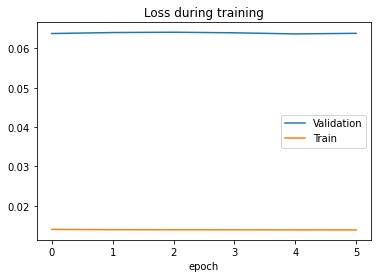

training model lstm[0] h=32,a=5,l=2
epoch 0 batch 200 loss=0.0166, MTL=0.0214, MVL=0.108				
epoch 0 batch 400 loss=0.0188, MTL=0.0198, MVL=0.108				
saving model MTL=0.01967447358409403, MVL=0.06786329989306263
*epoch 1 batch 600 loss=0.0186, MTL=0.0183, MVL=0.0679				
*epoch 1 batch 800 loss=0.0156, MTL=0.0182, MVL=0.0679				
epoch 2 batch 1000 loss=0.0205, MTL=0.0184, MVL=0.0683				
epoch 2 batch 1200 loss=0.0182, MTL=0.0182, MVL=0.0683				
saving model MTL=0.018065179371238443, MVL=0.06625082435422257
*epoch 3 batch 1400 loss=0.0159, MTL=0.0165, MVL=0.0663				
*epoch 3 batch 1600 loss=0.0164, MTL=0.0164, MVL=0.0663				
saving model MTL=0.016345118757500797, MVL=0.06512124592163523
*epoch 4 batch 1800 loss=0.0158, MTL=0.0161, MVL=0.0651				
*epoch 4 batch 2000 loss=0.0159, MTL=0.016, MVL=0.0651				
saving model MTL=0.015960910144599702, MVL=0.06441618538782244
*epoch 5 batch 2200 loss=0.0154, MTL=0.0161, MVL=0.0644				
*epoch 5 batch 2400 loss=0.015, MTL=0.0159, MVL=0.0644				
savin

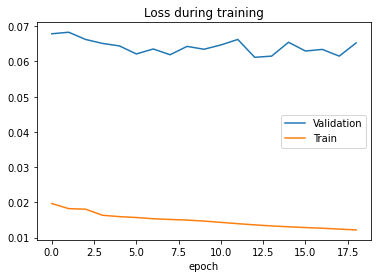

epoch 0 batch 200 loss=0.0134, MTL=0.0132, MVL=0.0611				
epoch 0 batch 400 loss=0.0129, MTL=0.0132, MVL=0.0611				
epoch 1 batch 600 loss=0.0124, MTL=0.0131, MVL=0.067				
epoch 1 batch 800 loss=0.0124, MTL=0.0131, MVL=0.067				
epoch 2 batch 1000 loss=0.0135, MTL=0.0131, MVL=0.0666				
epoch 2 batch 1200 loss=0.0151, MTL=0.0131, MVL=0.0666				
epoch 3 batch 1400 loss=0.0128, MTL=0.0131, MVL=0.0667				
epoch 3 batch 1600 loss=0.0135, MTL=0.013, MVL=0.0667				
epoch 4 batch 1800 loss=0.0124, MTL=0.013, MVL=0.0666				
epoch 4 batch 2000 loss=0.0128, MTL=0.013, MVL=0.0666				
epoch 5 batch 2200 loss=0.0133, MTL=0.0132, MVL=0.0683				
epoch 5 batch 2400 loss=0.0131, MTL=0.013, MVL=0.0683				


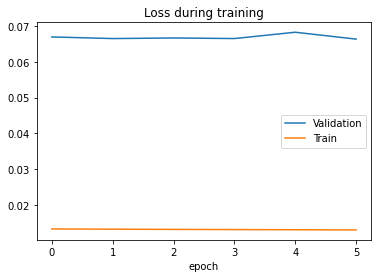

epoch 0 batch 200 loss=0.0137, MTL=0.0133, MVL=0.0615				
epoch 0 batch 400 loss=0.0137, MTL=0.0133, MVL=0.0615				
epoch 1 batch 600 loss=0.0146, MTL=0.0132, MVL=0.0648				
epoch 1 batch 800 loss=0.0131, MTL=0.0132, MVL=0.0648				
epoch 2 batch 1000 loss=0.0127, MTL=0.0132, MVL=0.0658				
epoch 2 batch 1200 loss=0.0127, MTL=0.0132, MVL=0.0658				
epoch 3 batch 1400 loss=0.0137, MTL=0.0132, MVL=0.0661				
epoch 3 batch 1600 loss=0.0134, MTL=0.0132, MVL=0.0661				
epoch 4 batch 1800 loss=0.0129, MTL=0.0133, MVL=0.0658				
epoch 4 batch 2000 loss=0.0143, MTL=0.0132, MVL=0.0658				
epoch 5 batch 2200 loss=0.0119, MTL=0.0132, MVL=0.0661				
epoch 5 batch 2400 loss=0.0143, MTL=0.0132, MVL=0.0661				


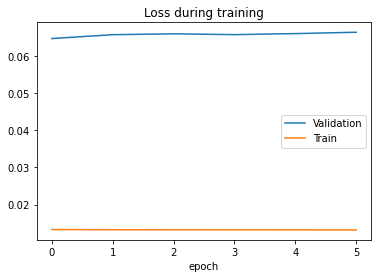

training model lstm[0] h=32,a=5,l=3
epoch 0 batch 200 loss=0.0196, MTL=0.0307, MVL=0.239				
epoch 0 batch 400 loss=0.02, MTL=0.0245, MVL=0.239				
saving model MTL=0.023986166272114525, MVL=0.06750592369525159
*epoch 1 batch 600 loss=0.0182, MTL=0.0181, MVL=0.0675				
*epoch 1 batch 800 loss=0.0161, MTL=0.0182, MVL=0.0675				
epoch 2 batch 1000 loss=0.0175, MTL=0.0183, MVL=0.0678				
epoch 2 batch 1200 loss=0.019, MTL=0.0183, MVL=0.0678				
epoch 3 batch 1400 loss=0.0184, MTL=0.0183, MVL=0.0685				
epoch 3 batch 1600 loss=0.0192, MTL=0.0182, MVL=0.0685				
epoch 4 batch 1800 loss=0.0182, MTL=0.0184, MVL=0.0685				
epoch 4 batch 2000 loss=0.0185, MTL=0.0182, MVL=0.0685				
epoch 5 batch 2200 loss=0.0174, MTL=0.0181, MVL=0.0687				
epoch 5 batch 2400 loss=0.0193, MTL=0.0181, MVL=0.0687				
saving model MTL=0.01823853538317851, MVL=0.06745397159066356
*epoch 6 batch 2600 loss=0.0182, MTL=0.0182, MVL=0.0675				
*epoch 6 batch 2800 loss=0.0185, MTL=0.0182, MVL=0.0675				
*epoch 6 batch 300

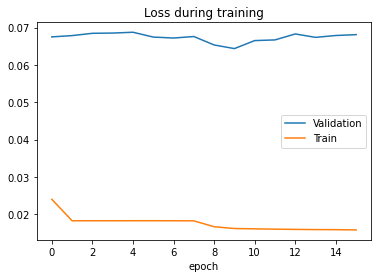

epoch 0 batch 200 loss=0.0169, MTL=0.016, MVL=0.0644				
epoch 0 batch 400 loss=0.0155, MTL=0.0159, MVL=0.0644				
epoch 1 batch 600 loss=0.0168, MTL=0.0159, MVL=0.0658				
epoch 1 batch 800 loss=0.0169, MTL=0.0159, MVL=0.0658				
epoch 2 batch 1000 loss=0.0161, MTL=0.016, MVL=0.0656				
epoch 2 batch 1200 loss=0.0161, MTL=0.0159, MVL=0.0656				
epoch 3 batch 1400 loss=0.0154, MTL=0.0158, MVL=0.0659				
epoch 3 batch 1600 loss=0.0148, MTL=0.0159, MVL=0.0659				
epoch 4 batch 1800 loss=0.0168, MTL=0.0158, MVL=0.0659				
epoch 4 batch 2000 loss=0.0161, MTL=0.0159, MVL=0.0659				
epoch 5 batch 2200 loss=0.0141, MTL=0.0158, MVL=0.0662				
epoch 5 batch 2400 loss=0.0161, MTL=0.0158, MVL=0.0662				


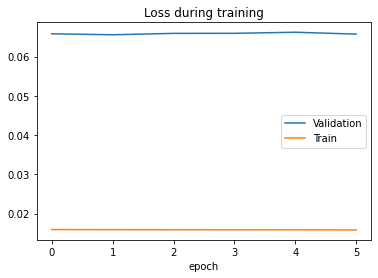

epoch 0 batch 200 loss=0.0157, MTL=0.016, MVL=0.0645				
epoch 0 batch 400 loss=0.0168, MTL=0.016, MVL=0.0645				
epoch 1 batch 600 loss=0.0161, MTL=0.016, MVL=0.0654				
epoch 1 batch 800 loss=0.0167, MTL=0.016, MVL=0.0654				
epoch 2 batch 1000 loss=0.0158, MTL=0.0159, MVL=0.0659				
epoch 2 batch 1200 loss=0.0162, MTL=0.0159, MVL=0.0659				
epoch 3 batch 1400 loss=0.0168, MTL=0.0158, MVL=0.0656				
epoch 3 batch 1600 loss=0.0156, MTL=0.0159, MVL=0.0656				
epoch 4 batch 1800 loss=0.0166, MTL=0.0162, MVL=0.066				
epoch 4 batch 2000 loss=0.0174, MTL=0.0159, MVL=0.066				
epoch 5 batch 2200 loss=0.0149, MTL=0.0159, MVL=0.0657				
epoch 5 batch 2400 loss=0.0155, MTL=0.0159, MVL=0.0657				


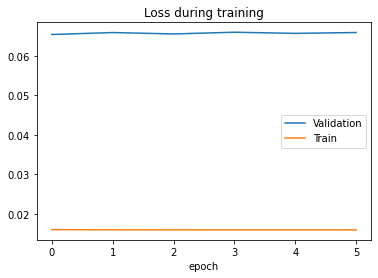

training model lstm[0] h=64,a=5,l=1
epoch 0 batch 200 loss=0.0183, MTL=0.022, MVL=0.159				
epoch 0 batch 400 loss=0.0169, MTL=0.02, MVL=0.159				
saving model MTL=0.019839325409993426, MVL=0.06628722068471987
*epoch 1 batch 600 loss=0.0179, MTL=0.0173, MVL=0.0663				
*epoch 1 batch 800 loss=0.0174, MTL=0.0167, MVL=0.0663				
saving model MTL=0.016576256841748058, MVL=0.061481576718267844
*epoch 2 batch 1000 loss=0.0149, MTL=0.0153, MVL=0.0615				
*epoch 2 batch 1200 loss=0.0139, MTL=0.015, MVL=0.0615				
saving model MTL=0.014860555120930936, MVL=0.05867156160415196
*epoch 3 batch 1400 loss=0.0142, MTL=0.0141, MVL=0.0587				
*epoch 3 batch 1600 loss=0.0136, MTL=0.0139, MVL=0.0587				
epoch 4 batch 1800 loss=0.0128, MTL=0.0134, MVL=0.0655				
epoch 4 batch 2000 loss=0.0132, MTL=0.0131, MVL=0.0655				
epoch 5 batch 2200 loss=0.0136, MTL=0.0124, MVL=0.0637				
epoch 5 batch 2400 loss=0.0131, MTL=0.0124, MVL=0.0637				
epoch 6 batch 2600 loss=0.0119, MTL=0.0112, MVL=0.0617				
epoch 6 bat

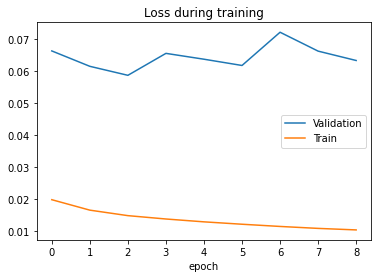

epoch 0 batch 200 loss=0.014, MTL=0.0138, MVL=0.0586				
epoch 0 batch 400 loss=0.0129, MTL=0.0137, MVL=0.0586				
epoch 1 batch 600 loss=0.0134, MTL=0.0135, MVL=0.059				
epoch 1 batch 800 loss=0.0128, MTL=0.0135, MVL=0.059				
epoch 2 batch 1000 loss=0.0128, MTL=0.0132, MVL=0.0598				
epoch 2 batch 1200 loss=0.0135, MTL=0.0133, MVL=0.0598				
epoch 3 batch 1400 loss=0.0131, MTL=0.0133, MVL=0.0616				
epoch 3 batch 1600 loss=0.0125, MTL=0.0131, MVL=0.0616				
epoch 4 batch 1800 loss=0.0132, MTL=0.0128, MVL=0.0628				
epoch 4 batch 2000 loss=0.0123, MTL=0.0128, MVL=0.0628				
epoch 5 batch 2200 loss=0.0121, MTL=0.0126, MVL=0.0657				
epoch 5 batch 2400 loss=0.0123, MTL=0.0125, MVL=0.0657				


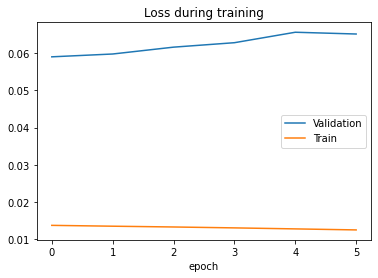

epoch 0 batch 200 loss=0.0149, MTL=0.0138, MVL=0.0587				
epoch 0 batch 400 loss=0.014, MTL=0.0138, MVL=0.0587				
epoch 1 batch 600 loss=0.0132, MTL=0.0137, MVL=0.0592				
epoch 1 batch 800 loss=0.0128, MTL=0.0137, MVL=0.0592				
epoch 2 batch 1000 loss=0.0147, MTL=0.0137, MVL=0.0589				
epoch 2 batch 1200 loss=0.0141, MTL=0.0137, MVL=0.0589				
epoch 3 batch 1400 loss=0.014, MTL=0.0137, MVL=0.0591				
epoch 3 batch 1600 loss=0.0139, MTL=0.0136, MVL=0.0591				
epoch 4 batch 1800 loss=0.0134, MTL=0.0135, MVL=0.0587				
epoch 4 batch 2000 loss=0.0137, MTL=0.0136, MVL=0.0587				
epoch 5 batch 2200 loss=0.0137, MTL=0.0136, MVL=0.0588				
epoch 5 batch 2400 loss=0.0134, MTL=0.0136, MVL=0.0588				


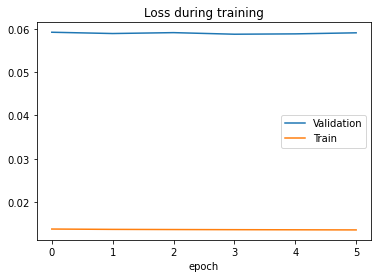

training model lstm[0] h=64,a=5,l=2
epoch 0 batch 200 loss=0.0175, MTL=0.0194, MVL=0.0917				
epoch 0 batch 400 loss=0.0173, MTL=0.0189, MVL=0.0917				
saving model MTL=0.018819516288077858, MVL=0.06796069253907829
*epoch 1 batch 600 loss=0.0189, MTL=0.0183, MVL=0.068				
*epoch 1 batch 800 loss=0.0169, MTL=0.0182, MVL=0.068				
saving model MTL=0.018082427396492788, MVL=0.06728311774672055
*epoch 2 batch 1000 loss=0.016, MTL=0.0166, MVL=0.0673				
*epoch 2 batch 1200 loss=0.0156, MTL=0.0164, MVL=0.0673				
saving model MTL=0.016336729760791497, MVL=0.06643313059552772
*epoch 3 batch 1400 loss=0.0157, MTL=0.0162, MVL=0.0664				
*epoch 3 batch 1600 loss=0.016, MTL=0.0161, MVL=0.0664				
saving model MTL=0.016039252199456268, MVL=0.06402378633129792
*epoch 4 batch 1800 loss=0.0166, MTL=0.0159, MVL=0.064				
*epoch 4 batch 2000 loss=0.0153, MTL=0.016, MVL=0.064				
saving model MTL=0.015876725858064503, MVL=0.06396690591192636
*epoch 5 batch 2200 loss=0.0164, MTL=0.0157, MVL=0.064				
*ep

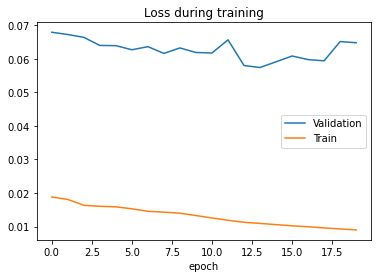

epoch 0 batch 200 loss=0.0096, MTL=0.0104, MVL=0.0577				
epoch 0 batch 400 loss=0.0102, MTL=0.0104, MVL=0.0577				
epoch 1 batch 600 loss=0.0117, MTL=0.0102, MVL=0.0623				
epoch 1 batch 800 loss=0.011, MTL=0.0102, MVL=0.0623				
epoch 2 batch 1000 loss=0.01, MTL=0.0102, MVL=0.0629				
epoch 2 batch 1200 loss=0.0107, MTL=0.0102, MVL=0.0629				
epoch 3 batch 1400 loss=0.0108, MTL=0.0102, MVL=0.0627				
epoch 3 batch 1600 loss=0.0103, MTL=0.0101, MVL=0.0627				
epoch 4 batch 1800 loss=0.01, MTL=0.00999, MVL=0.0629				
epoch 4 batch 2000 loss=0.0094, MTL=0.0101, MVL=0.0629				
epoch 5 batch 2200 loss=0.0112, MTL=0.01, MVL=0.0637				
epoch 5 batch 2400 loss=0.00967, MTL=0.01, MVL=0.0637				


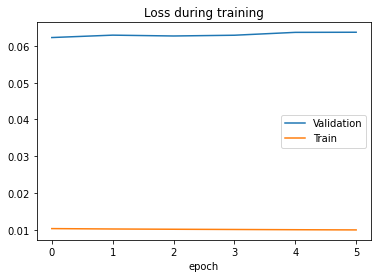

epoch 0 batch 200 loss=0.01, MTL=0.0105, MVL=0.0574				
epoch 0 batch 400 loss=0.0107, MTL=0.0105, MVL=0.0574				
epoch 1 batch 600 loss=0.0103, MTL=0.0104, MVL=0.0603				
epoch 1 batch 800 loss=0.00992, MTL=0.0104, MVL=0.0603				
epoch 2 batch 1000 loss=0.0112, MTL=0.0103, MVL=0.0611				
epoch 2 batch 1200 loss=0.01, MTL=0.0103, MVL=0.0611				
epoch 3 batch 1400 loss=0.00985, MTL=0.0104, MVL=0.0615				
epoch 3 batch 1600 loss=0.0102, MTL=0.0103, MVL=0.0615				
epoch 4 batch 1800 loss=0.00987, MTL=0.0103, MVL=0.0617				
epoch 4 batch 2000 loss=0.0101, MTL=0.0103, MVL=0.0617				
epoch 5 batch 2200 loss=0.0105, MTL=0.0102, MVL=0.0616				
epoch 5 batch 2400 loss=0.0107, MTL=0.0103, MVL=0.0616				


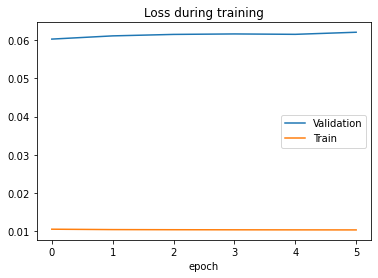

training model lstm[0] h=64,a=5,l=3
epoch 0 batch 200 loss=0.0179, MTL=0.0201, MVL=0.12				
epoch 0 batch 400 loss=0.0172, MTL=0.0191, MVL=0.12				
saving model MTL=0.01905292943851295, MVL=0.06623372063040733
*epoch 1 batch 600 loss=0.0189, MTL=0.0183, MVL=0.0662				
*epoch 1 batch 800 loss=0.0166, MTL=0.0183, MVL=0.0662				
epoch 2 batch 1000 loss=0.017, MTL=0.0183, MVL=0.0675				
epoch 2 batch 1200 loss=0.0187, MTL=0.0182, MVL=0.0675				
epoch 3 batch 1400 loss=0.0202, MTL=0.0183, MVL=0.0672				
epoch 3 batch 1600 loss=0.0176, MTL=0.0182, MVL=0.0672				
epoch 4 batch 1800 loss=0.0182, MTL=0.0183, MVL=0.0679				
epoch 4 batch 2000 loss=0.0172, MTL=0.0183, MVL=0.0679				
epoch 5 batch 2200 loss=0.0154, MTL=0.0179, MVL=0.0675				
epoch 5 batch 2400 loss=0.0193, MTL=0.0182, MVL=0.0675				
epoch 6 batch 2600 loss=0.0185, MTL=0.019, MVL=0.0679				
epoch 6 batch 2800 loss=0.0178, MTL=0.0182, MVL=0.0679				
epoch 6 batch 3000 loss=0.0179, MTL=0.0182, MVL=0.0679				


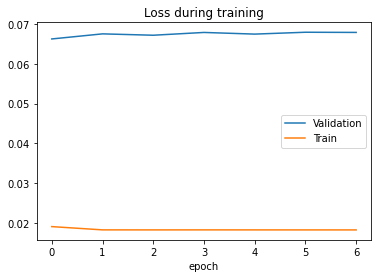

epoch 0 batch 200 loss=0.0191, MTL=0.0182, MVL=0.0665				
epoch 0 batch 400 loss=0.0167, MTL=0.0182, MVL=0.0665				
epoch 1 batch 600 loss=0.0204, MTL=0.0182, MVL=0.0676				
epoch 1 batch 800 loss=0.0207, MTL=0.0182, MVL=0.0676				
epoch 2 batch 1000 loss=0.0175, MTL=0.0182, MVL=0.0678				
epoch 2 batch 1200 loss=0.0214, MTL=0.0182, MVL=0.0678				
epoch 3 batch 1400 loss=0.0179, MTL=0.0183, MVL=0.0677				
epoch 3 batch 1600 loss=0.0152, MTL=0.0182, MVL=0.0677				
epoch 4 batch 1800 loss=0.0183, MTL=0.0181, MVL=0.0675				
epoch 4 batch 2000 loss=0.019, MTL=0.0181, MVL=0.0675				
epoch 5 batch 2200 loss=0.0179, MTL=0.0183, MVL=0.0678				
epoch 5 batch 2400 loss=0.018, MTL=0.0182, MVL=0.0678				


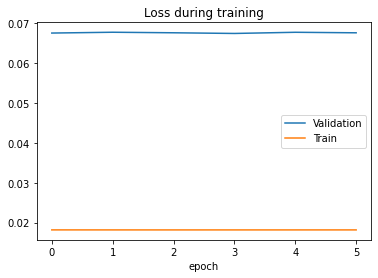

epoch 0 batch 200 loss=0.0188, MTL=0.0182, MVL=0.0664				
epoch 0 batch 400 loss=0.0173, MTL=0.0182, MVL=0.0664				
epoch 1 batch 600 loss=0.0178, MTL=0.0182, MVL=0.0674				
epoch 1 batch 800 loss=0.0191, MTL=0.0182, MVL=0.0674				
epoch 2 batch 1000 loss=0.0176, MTL=0.0181, MVL=0.0679				
epoch 2 batch 1200 loss=0.0184, MTL=0.0181, MVL=0.0679				
epoch 3 batch 1400 loss=0.0164, MTL=0.018, MVL=0.0674				
epoch 3 batch 1600 loss=0.0181, MTL=0.0181, MVL=0.0674				
epoch 4 batch 1800 loss=0.0173, MTL=0.0182, MVL=0.0676				
epoch 4 batch 2000 loss=0.0176, MTL=0.0182, MVL=0.0676				
epoch 5 batch 2200 loss=0.0174, MTL=0.0181, MVL=0.0675				
epoch 5 batch 2400 loss=0.0181, MTL=0.0182, MVL=0.0675				


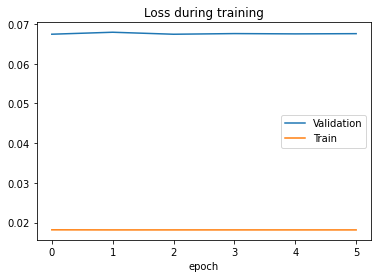

training model lstm[0] h=128,a=5,l=1
epoch 0 batch 200 loss=0.0178, MTL=0.0188, MVL=0.101				
epoch 0 batch 400 loss=0.016, MTL=0.0181, MVL=0.101				
saving model MTL=0.01792625641970794, MVL=0.06178210278759237
*epoch 1 batch 600 loss=0.0156, MTL=0.0157, MVL=0.0618				
*epoch 1 batch 800 loss=0.0141, MTL=0.0151, MVL=0.0618				
saving model MTL=0.014876184064473346, MVL=0.06115726479252831
*epoch 2 batch 1000 loss=0.0141, MTL=0.0134, MVL=0.0612				
*epoch 2 batch 1200 loss=0.0125, MTL=0.0129, MVL=0.0612				
saving model MTL=0.012652330945824504, MVL=0.05743878609577163
*epoch 3 batch 1400 loss=0.0125, MTL=0.0112, MVL=0.0574				
*epoch 3 batch 1600 loss=0.00982, MTL=0.0109, MVL=0.0574				
saving model MTL=0.010689497338156226, MVL=0.05378212407231331
*epoch 4 batch 1800 loss=0.00977, MTL=0.00995, MVL=0.0538				
*epoch 4 batch 2000 loss=0.00915, MTL=0.00973, MVL=0.0538				
saving model MTL=0.009659838832605105, MVL=0.049107137701061905
*epoch 5 batch 2200 loss=0.00984, MTL=0.00931, MVL=0

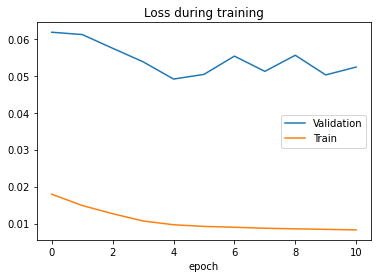

epoch 0 batch 200 loss=0.00944, MTL=0.0088, MVL=0.049				
epoch 0 batch 400 loss=0.00881, MTL=0.00874, MVL=0.049				
epoch 1 batch 600 loss=0.00846, MTL=0.00866, MVL=0.053				
epoch 1 batch 800 loss=0.00849, MTL=0.00861, MVL=0.053				
epoch 2 batch 1000 loss=0.00868, MTL=0.00851, MVL=0.0512				
epoch 2 batch 1200 loss=0.00848, MTL=0.00856, MVL=0.0512				
epoch 3 batch 1400 loss=0.00839, MTL=0.00856, MVL=0.0538				
epoch 3 batch 1600 loss=0.00842, MTL=0.00849, MVL=0.0538				
epoch 4 batch 1800 loss=0.00832, MTL=0.00839, MVL=0.0545				
epoch 4 batch 2000 loss=0.0078, MTL=0.00843, MVL=0.0545				
epoch 5 batch 2200 loss=0.00863, MTL=0.00834, MVL=0.0535				
epoch 5 batch 2400 loss=0.00793, MTL=0.00839, MVL=0.0535				


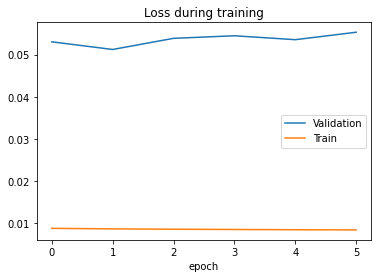

epoch 0 batch 200 loss=0.00961, MTL=0.00885, MVL=0.049				
epoch 0 batch 400 loss=0.0089, MTL=0.00883, MVL=0.049				
epoch 1 batch 600 loss=0.00879, MTL=0.00872, MVL=0.0499				
epoch 1 batch 800 loss=0.00856, MTL=0.00871, MVL=0.0499				
epoch 2 batch 1000 loss=0.00854, MTL=0.00872, MVL=0.0506				
epoch 2 batch 1200 loss=0.00791, MTL=0.00869, MVL=0.0506				
epoch 3 batch 1400 loss=0.00877, MTL=0.00862, MVL=0.0506				
epoch 3 batch 1600 loss=0.00856, MTL=0.00866, MVL=0.0506				
epoch 4 batch 1800 loss=0.00828, MTL=0.00862, MVL=0.0513				
epoch 4 batch 2000 loss=0.00891, MTL=0.00865, MVL=0.0513				
epoch 5 batch 2200 loss=0.00862, MTL=0.00867, MVL=0.0513				
epoch 5 batch 2400 loss=0.00822, MTL=0.00866, MVL=0.0513				


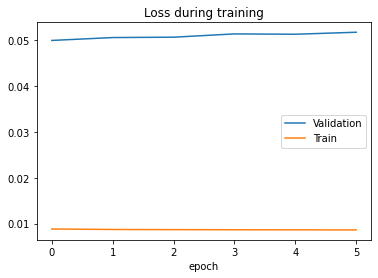

training model lstm[0] h=128,a=5,l=2
epoch 0 batch 200 loss=0.0183, MTL=0.0187, MVL=0.0809				
epoch 0 batch 400 loss=0.0169, MTL=0.0185, MVL=0.0809				
saving model MTL=0.018462460556908512, MVL=0.06674476871724988
*epoch 1 batch 600 loss=0.0211, MTL=0.0181, MVL=0.0667				
*epoch 1 batch 800 loss=0.0171, MTL=0.0181, MVL=0.0667				
saving model MTL=0.017908727369479852, MVL=0.0660288646572926
*epoch 2 batch 1000 loss=0.0159, MTL=0.0164, MVL=0.066				
*epoch 2 batch 1200 loss=0.0158, MTL=0.0163, MVL=0.066				
epoch 3 batch 1400 loss=0.0153, MTL=0.0162, MVL=0.0675				
epoch 3 batch 1600 loss=0.0162, MTL=0.0159, MVL=0.0675				
saving model MTL=0.01574802280384316, MVL=0.06336706870647728
*epoch 4 batch 1800 loss=0.0149, MTL=0.0153, MVL=0.0634				
*epoch 4 batch 2000 loss=0.0145, MTL=0.0153, MVL=0.0634				
saving model MTL=0.01516996752943921, MVL=0.06325149994160308
*epoch 5 batch 2200 loss=0.0145, MTL=0.0149, MVL=0.0633				
*epoch 5 batch 2400 loss=0.0134, MTL=0.0145, MVL=0.0633				
savi

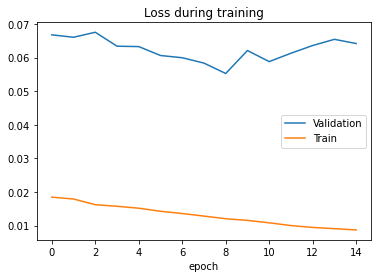

epoch 0 batch 200 loss=0.0117, MTL=0.0114, MVL=0.0553				
epoch 0 batch 400 loss=0.0114, MTL=0.0114, MVL=0.0553				
epoch 1 batch 600 loss=0.0118, MTL=0.0113, MVL=0.0605				
epoch 1 batch 800 loss=0.0103, MTL=0.0112, MVL=0.0605				
epoch 2 batch 1000 loss=0.0109, MTL=0.0111, MVL=0.0648				
epoch 2 batch 1200 loss=0.01, MTL=0.0111, MVL=0.0648				
epoch 3 batch 1400 loss=0.0115, MTL=0.011, MVL=0.0644				
epoch 3 batch 1600 loss=0.0114, MTL=0.011, MVL=0.0644				
epoch 4 batch 1800 loss=0.0106, MTL=0.0108, MVL=0.0651				
epoch 4 batch 2000 loss=0.0114, MTL=0.0109, MVL=0.0651				
epoch 5 batch 2200 loss=0.0106, MTL=0.0108, MVL=0.0661				
epoch 5 batch 2400 loss=0.011, MTL=0.0107, MVL=0.0661				


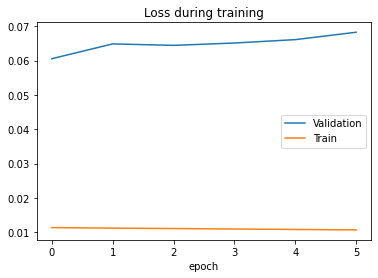

epoch 0 batch 200 loss=0.0114, MTL=0.0116, MVL=0.0555				
epoch 0 batch 400 loss=0.0102, MTL=0.0115, MVL=0.0555				
epoch 1 batch 600 loss=0.0115, MTL=0.0114, MVL=0.0568				
epoch 1 batch 800 loss=0.0108, MTL=0.0114, MVL=0.0568				
epoch 2 batch 1000 loss=0.0115, MTL=0.0113, MVL=0.058				
epoch 2 batch 1200 loss=0.0111, MTL=0.0114, MVL=0.058				
epoch 3 batch 1400 loss=0.0117, MTL=0.0113, MVL=0.0589				
epoch 3 batch 1600 loss=0.0112, MTL=0.0113, MVL=0.0589				
epoch 4 batch 1800 loss=0.0113, MTL=0.0113, MVL=0.0593				
epoch 4 batch 2000 loss=0.0111, MTL=0.0113, MVL=0.0593				
epoch 5 batch 2200 loss=0.0117, MTL=0.0111, MVL=0.06				
epoch 5 batch 2400 loss=0.0108, MTL=0.0112, MVL=0.06				


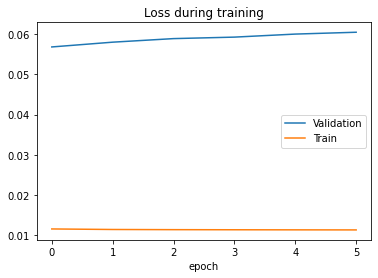

training model lstm[0] h=128,a=5,l=3
epoch 0 batch 200 loss=0.0201, MTL=0.019, MVL=0.105				
epoch 0 batch 400 loss=0.017, MTL=0.0186, MVL=0.105				
saving model MTL=0.018578968402299403, MVL=0.06705889631001676
*epoch 1 batch 600 loss=0.0164, MTL=0.0182, MVL=0.0671				
*epoch 1 batch 800 loss=0.0155, MTL=0.0182, MVL=0.0671				
epoch 2 batch 1000 loss=0.0187, MTL=0.0183, MVL=0.068				
epoch 2 batch 1200 loss=0.018, MTL=0.0183, MVL=0.068				
epoch 3 batch 1400 loss=0.0198, MTL=0.0182, MVL=0.068				
epoch 3 batch 1600 loss=0.0184, MTL=0.0182, MVL=0.068				
epoch 4 batch 1800 loss=0.0157, MTL=0.0181, MVL=0.0677				
epoch 4 batch 2000 loss=0.0167, MTL=0.0182, MVL=0.0677				
epoch 5 batch 2200 loss=0.0197, MTL=0.0182, MVL=0.0672				
epoch 5 batch 2400 loss=0.0176, MTL=0.0183, MVL=0.0672				
epoch 6 batch 2600 loss=0.0187, MTL=0.0182, MVL=0.0685				
epoch 6 batch 2800 loss=0.0185, MTL=0.0182, MVL=0.0685				
epoch 6 batch 3000 loss=0.02, MTL=0.0182, MVL=0.0685				


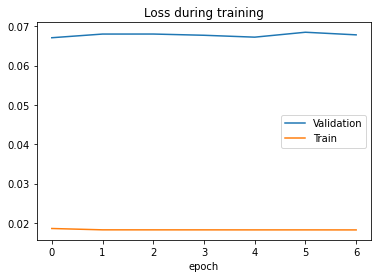

epoch 0 batch 200 loss=0.0199, MTL=0.0182, MVL=0.067				
epoch 0 batch 400 loss=0.0191, MTL=0.0182, MVL=0.067				
epoch 1 batch 600 loss=0.0187, MTL=0.0182, MVL=0.0675				
epoch 1 batch 800 loss=0.0195, MTL=0.0182, MVL=0.0675				
epoch 2 batch 1000 loss=0.017, MTL=0.0181, MVL=0.0678				
epoch 2 batch 1200 loss=0.0171, MTL=0.0181, MVL=0.0678				
epoch 3 batch 1400 loss=0.0195, MTL=0.0183, MVL=0.0683				
epoch 3 batch 1600 loss=0.0154, MTL=0.0182, MVL=0.0683				
epoch 4 batch 1800 loss=0.0169, MTL=0.0182, MVL=0.0677				
epoch 4 batch 2000 loss=0.0188, MTL=0.0182, MVL=0.0677				
epoch 5 batch 2200 loss=0.0186, MTL=0.018, MVL=0.0673				
epoch 5 batch 2400 loss=0.0205, MTL=0.0181, MVL=0.0673				


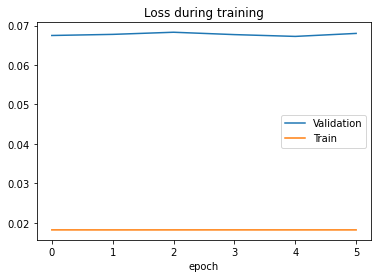

epoch 0 batch 200 loss=0.0181, MTL=0.0183, MVL=0.0671				
epoch 0 batch 400 loss=0.0183, MTL=0.0182, MVL=0.0671				
epoch 1 batch 600 loss=0.0181, MTL=0.0182, MVL=0.0674				
epoch 1 batch 800 loss=0.018, MTL=0.0182, MVL=0.0674				
epoch 2 batch 1000 loss=0.0189, MTL=0.0181, MVL=0.0676				
epoch 2 batch 1200 loss=0.0182, MTL=0.0182, MVL=0.0676				
epoch 3 batch 1400 loss=0.0179, MTL=0.0181, MVL=0.0676				
epoch 3 batch 1600 loss=0.019, MTL=0.0181, MVL=0.0676				
epoch 4 batch 1800 loss=0.0193, MTL=0.0181, MVL=0.0677				
epoch 4 batch 2000 loss=0.0183, MTL=0.0181, MVL=0.0677				
epoch 5 batch 2200 loss=0.0182, MTL=0.018, MVL=0.0676				
epoch 5 batch 2400 loss=0.0172, MTL=0.0183, MVL=0.0676				


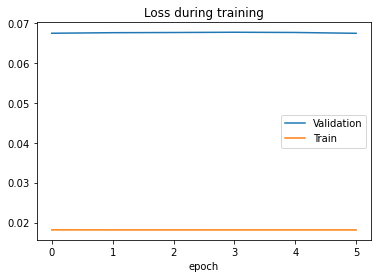

training model lstm[1] h=32,a=5,l=1
epoch 0 batch 200 loss=0.0215, MTL=0.0245, MVL=0.187				
epoch 0 batch 400 loss=0.0174, MTL=0.0214, MVL=0.187				
saving model MTL=0.021123260767231363, MVL=0.06711766276447499
*epoch 1 batch 600 loss=0.0183, MTL=0.018, MVL=0.0671				
*epoch 1 batch 800 loss=0.0173, MTL=0.0179, MVL=0.0671				
saving model MTL=0.017838542919614574, MVL=0.06572485476976535
*epoch 2 batch 1000 loss=0.0154, MTL=0.0172, MVL=0.0657				
*epoch 2 batch 1200 loss=0.0168, MTL=0.0169, MVL=0.0657				
saving model MTL=0.01662535465367603, MVL=0.0632083362853918
*epoch 3 batch 1400 loss=0.0154, MTL=0.0158, MVL=0.0632				
*epoch 3 batch 1600 loss=0.0156, MTL=0.0156, MVL=0.0632				
epoch 4 batch 1800 loss=0.0147, MTL=0.015, MVL=0.0635				
epoch 4 batch 2000 loss=0.0141, MTL=0.0147, MVL=0.0635				
saving model MTL=0.014603201405297939, MVL=0.0613696635013721
*epoch 5 batch 2200 loss=0.0142, MTL=0.0142, MVL=0.0614				
*epoch 5 batch 2400 loss=0.0151, MTL=0.0141, MVL=0.0614				
epoch 6

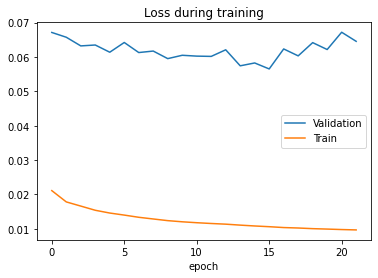

epoch 0 batch 200 loss=0.00965, MTL=0.0101, MVL=0.0565				
epoch 0 batch 400 loss=0.0105, MTL=0.0101, MVL=0.0565				
epoch 1 batch 600 loss=0.0104, MTL=0.0101, MVL=0.0607				
epoch 1 batch 800 loss=0.0104, MTL=0.0101, MVL=0.0607				
epoch 2 batch 1000 loss=0.0102, MTL=0.00999, MVL=0.0615				
epoch 2 batch 1200 loss=0.0105, MTL=0.01, MVL=0.0615				
epoch 3 batch 1400 loss=0.0102, MTL=0.00997, MVL=0.0593				
epoch 3 batch 1600 loss=0.00998, MTL=0.00999, MVL=0.0593				
epoch 4 batch 1800 loss=0.0101, MTL=0.01, MVL=0.0574				
epoch 4 batch 2000 loss=0.0102, MTL=0.00995, MVL=0.0574				
saving model MTL=0.009948811880968873, MVL=0.05595411439655257
*epoch 5 batch 2200 loss=0.00975, MTL=0.00996, MVL=0.056				
*epoch 5 batch 2400 loss=0.0099, MTL=0.00997, MVL=0.056				
saving model MTL=0.009922808857836845, MVL=0.05326028320877278
*epoch 6 batch 2600 loss=0.0103, MTL=0.0102, MVL=0.0533				
*epoch 6 batch 2800 loss=0.00988, MTL=0.00993, MVL=0.0533				
*epoch 6 batch 3000 loss=0.00997, MTL=0.009

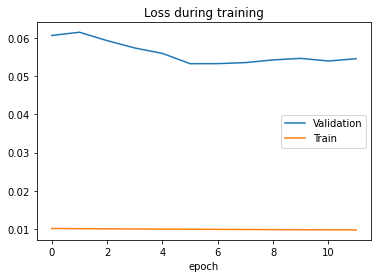

epoch 0 batch 200 loss=0.00962, MTL=0.00987, MVL=0.0534				
epoch 0 batch 400 loss=0.0097, MTL=0.00986, MVL=0.0534				
saving model MTL=0.009853145585117934, MVL=0.05294499515754278
*epoch 1 batch 600 loss=0.00985, MTL=0.00984, MVL=0.0529				
*epoch 1 batch 800 loss=0.00966, MTL=0.00984, MVL=0.0529				
epoch 2 batch 1000 loss=0.0103, MTL=0.00986, MVL=0.0532				
epoch 2 batch 1200 loss=0.0101, MTL=0.00985, MVL=0.0532				
epoch 3 batch 1400 loss=0.0101, MTL=0.00976, MVL=0.0534				
epoch 3 batch 1600 loss=0.0101, MTL=0.00985, MVL=0.0534				
epoch 4 batch 1800 loss=0.00975, MTL=0.00985, MVL=0.0533				
epoch 4 batch 2000 loss=0.0107, MTL=0.00983, MVL=0.0533				
epoch 5 batch 2200 loss=0.0105, MTL=0.00971, MVL=0.0533				
epoch 5 batch 2400 loss=0.0104, MTL=0.00983, MVL=0.0533				
epoch 6 batch 2600 loss=0.00986, MTL=0.00974, MVL=0.0537				
epoch 6 batch 2800 loss=0.00951, MTL=0.00984, MVL=0.0537				
epoch 6 batch 3000 loss=0.01, MTL=0.00983, MVL=0.0537				


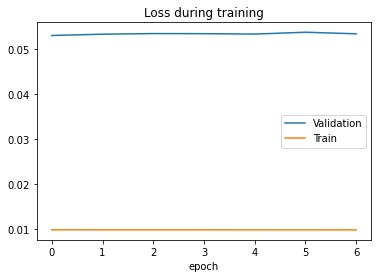

training model lstm[1] h=32,a=5,l=2
epoch 0 batch 200 loss=0.0175, MTL=0.0319, MVL=0.241				
epoch 0 batch 400 loss=0.0179, MTL=0.025, MVL=0.241				
saving model MTL=0.02450381929601175, MVL=0.06749117777484362
*epoch 1 batch 600 loss=0.0164, MTL=0.0182, MVL=0.0675				
*epoch 1 batch 800 loss=0.0187, MTL=0.0182, MVL=0.0675				
epoch 2 batch 1000 loss=0.0184, MTL=0.0182, MVL=0.068				
epoch 2 batch 1200 loss=0.0192, MTL=0.0182, MVL=0.068				
saving model MTL=0.01810132845479126, MVL=0.06524174513875461
*epoch 3 batch 1400 loss=0.0169, MTL=0.0175, MVL=0.0652				
*epoch 3 batch 1600 loss=0.0159, MTL=0.0169, MVL=0.0652				
epoch 4 batch 1800 loss=0.0164, MTL=0.0162, MVL=0.0655				
epoch 4 batch 2000 loss=0.0169, MTL=0.0162, MVL=0.0655				
epoch 5 batch 2200 loss=0.0172, MTL=0.0162, MVL=0.0666				
epoch 5 batch 2400 loss=0.0157, MTL=0.016, MVL=0.0666				
epoch 6 batch 2600 loss=0.0162, MTL=0.016, MVL=0.066				
epoch 6 batch 2800 loss=0.0156, MTL=0.016, MVL=0.066				
epoch 6 batch 3000 loss=

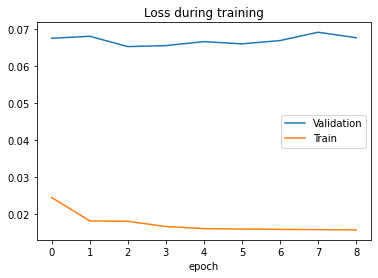

epoch 0 batch 200 loss=0.0158, MTL=0.0174, MVL=0.0655				
epoch 0 batch 400 loss=0.0168, MTL=0.0174, MVL=0.0655				
epoch 1 batch 600 loss=0.0157, MTL=0.017, MVL=0.0669				
epoch 1 batch 800 loss=0.0154, MTL=0.0169, MVL=0.0669				
epoch 2 batch 1000 loss=0.0171, MTL=0.0167, MVL=0.0661				
epoch 2 batch 1200 loss=0.0159, MTL=0.0167, MVL=0.0661				
epoch 3 batch 1400 loss=0.0162, MTL=0.0165, MVL=0.0656				
epoch 3 batch 1600 loss=0.016, MTL=0.0165, MVL=0.0656				
saving model MTL=0.01647086330532477, MVL=0.06463430669219768
*epoch 4 batch 1800 loss=0.0159, MTL=0.0165, MVL=0.0646				
*epoch 4 batch 2000 loss=0.0157, MTL=0.0163, MVL=0.0646				
saving model MTL=0.016320228088414834, MVL=0.06454003889296876
*epoch 5 batch 2200 loss=0.0162, MTL=0.0162, MVL=0.0645				
*epoch 5 batch 2400 loss=0.0146, MTL=0.0162, MVL=0.0645				
epoch 6 batch 2600 loss=0.0149, MTL=0.0162, MVL=0.0654				
epoch 6 batch 2800 loss=0.0164, MTL=0.0162, MVL=0.0654				
epoch 6 batch 3000 loss=0.0161, MTL=0.0161, MVL=0.0

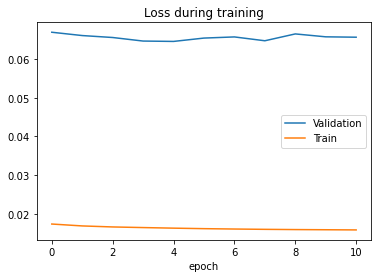

epoch 0 batch 200 loss=0.0167, MTL=0.0162, MVL=0.0646				
epoch 0 batch 400 loss=0.0163, MTL=0.0162, MVL=0.0646				
epoch 1 batch 600 loss=0.0163, MTL=0.0162, MVL=0.0649				
epoch 1 batch 800 loss=0.0177, MTL=0.0162, MVL=0.0649				
epoch 2 batch 1000 loss=0.0171, MTL=0.0162, MVL=0.065				
epoch 2 batch 1200 loss=0.0157, MTL=0.0162, MVL=0.065				
epoch 3 batch 1400 loss=0.0153, MTL=0.0163, MVL=0.0653				
epoch 3 batch 1600 loss=0.0173, MTL=0.0162, MVL=0.0653				
epoch 4 batch 1800 loss=0.0174, MTL=0.0161, MVL=0.0653				
epoch 4 batch 2000 loss=0.0162, MTL=0.0162, MVL=0.0653				
epoch 5 batch 2200 loss=0.0155, MTL=0.0163, MVL=0.0651				
epoch 5 batch 2400 loss=0.0156, MTL=0.0162, MVL=0.0651				


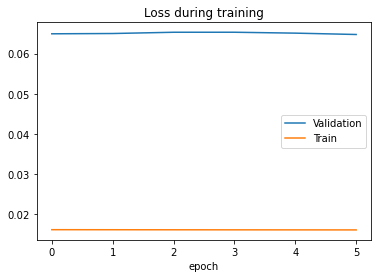

training model lstm[1] h=32,a=5,l=3
epoch 0 batch 200 loss=0.0181, MTL=0.0227, MVL=0.165				
epoch 0 batch 400 loss=0.0175, MTL=0.0204, MVL=0.165				
saving model MTL=0.020240038153704676, MVL=0.06801605597138405
*epoch 1 batch 600 loss=0.0184, MTL=0.0182, MVL=0.068				
*epoch 1 batch 800 loss=0.0199, MTL=0.0182, MVL=0.068				
saving model MTL=0.018222046820296288, MVL=0.06752083902476264
*epoch 2 batch 1000 loss=0.0175, MTL=0.0182, MVL=0.0675				
*epoch 2 batch 1200 loss=0.0195, MTL=0.0182, MVL=0.0675				
saving model MTL=0.01823105677256821, MVL=0.06707554109028128
*epoch 3 batch 1400 loss=0.0193, MTL=0.0183, MVL=0.0671				
*epoch 3 batch 1600 loss=0.0178, MTL=0.0183, MVL=0.0671				
epoch 4 batch 1800 loss=0.0188, MTL=0.0182, MVL=0.0674				
epoch 4 batch 2000 loss=0.0176, MTL=0.0182, MVL=0.0674				
epoch 5 batch 2200 loss=0.0194, MTL=0.0181, MVL=0.0681				
epoch 5 batch 2400 loss=0.0214, MTL=0.0183, MVL=0.0681				
epoch 6 batch 2600 loss=0.0182, MTL=0.0184, MVL=0.0683				
epoch 6 bat

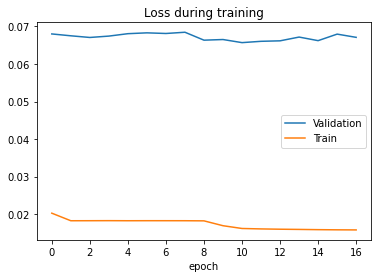

epoch 0 batch 200 loss=0.0147, MTL=0.0159, MVL=0.0661				
epoch 0 batch 400 loss=0.015, MTL=0.0159, MVL=0.0661				
saving model MTL=0.015936257694062816, MVL=0.0652799512885633
*epoch 1 batch 600 loss=0.0166, MTL=0.0159, MVL=0.0653				
*epoch 1 batch 800 loss=0.0155, MTL=0.0159, MVL=0.0653				
epoch 2 batch 1000 loss=0.0167, MTL=0.016, MVL=0.0653				
epoch 2 batch 1200 loss=0.0175, MTL=0.0159, MVL=0.0653				
saving model MTL=0.01588066969299151, MVL=0.06513926417368357
*epoch 3 batch 1400 loss=0.0171, MTL=0.0159, MVL=0.0651				
*epoch 3 batch 1600 loss=0.0145, MTL=0.0159, MVL=0.0651				
epoch 4 batch 1800 loss=0.0157, MTL=0.0158, MVL=0.0657				
epoch 4 batch 2000 loss=0.0173, MTL=0.0158, MVL=0.0657				
epoch 5 batch 2200 loss=0.016, MTL=0.0161, MVL=0.0655				
epoch 5 batch 2400 loss=0.0158, MTL=0.0159, MVL=0.0655				
epoch 6 batch 2600 loss=0.0167, MTL=0.016, MVL=0.0659				
epoch 6 batch 2800 loss=0.0161, MTL=0.0158, MVL=0.0659				
epoch 6 batch 3000 loss=0.0156, MTL=0.0158, MVL=0.0659

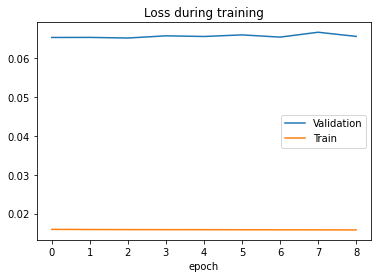

epoch 0 batch 200 loss=0.0165, MTL=0.0159, MVL=0.0655				
epoch 0 batch 400 loss=0.0156, MTL=0.0159, MVL=0.0655				
epoch 1 batch 600 loss=0.0152, MTL=0.0159, MVL=0.0654				
epoch 1 batch 800 loss=0.0152, MTL=0.0158, MVL=0.0654				
epoch 2 batch 1000 loss=0.0152, MTL=0.0158, MVL=0.0654				
epoch 2 batch 1200 loss=0.016, MTL=0.0158, MVL=0.0654				
epoch 3 batch 1400 loss=0.0168, MTL=0.0158, MVL=0.0654				
epoch 3 batch 1600 loss=0.0167, MTL=0.0158, MVL=0.0654				
epoch 4 batch 1800 loss=0.0161, MTL=0.0159, MVL=0.0658				
epoch 4 batch 2000 loss=0.0148, MTL=0.0159, MVL=0.0658				
epoch 5 batch 2200 loss=0.0154, MTL=0.016, MVL=0.0653				
epoch 5 batch 2400 loss=0.0167, MTL=0.0158, MVL=0.0653				


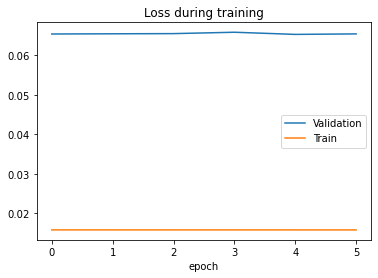

training model lstm[1] h=64,a=5,l=1
epoch 0 batch 200 loss=0.0178, MTL=0.0189, MVL=0.113				
epoch 0 batch 400 loss=0.0176, MTL=0.0185, MVL=0.113				
saving model MTL=0.018380053823181444, MVL=0.06449988594309228
*epoch 1 batch 600 loss=0.0151, MTL=0.0169, MVL=0.0645				
*epoch 1 batch 800 loss=0.0153, MTL=0.0163, MVL=0.0645				
epoch 2 batch 1000 loss=0.0159, MTL=0.0148, MVL=0.0657				
epoch 2 batch 1200 loss=0.0147, MTL=0.0145, MVL=0.0657				
epoch 3 batch 1400 loss=0.015, MTL=0.0138, MVL=0.0659				
epoch 3 batch 1600 loss=0.0134, MTL=0.0135, MVL=0.0659				
saving model MTL=0.01330079544146328, MVL=0.06170971013727735
*epoch 4 batch 1800 loss=0.0121, MTL=0.0124, MVL=0.0617				
*epoch 4 batch 2000 loss=0.0114, MTL=0.0122, MVL=0.0617				
epoch 5 batch 2200 loss=0.0107, MTL=0.0112, MVL=0.0637				
epoch 5 batch 2400 loss=0.0103, MTL=0.0111, MVL=0.0637				
epoch 6 batch 2600 loss=0.0107, MTL=0.011, MVL=0.0666				
epoch 6 batch 2800 loss=0.0117, MTL=0.0104, MVL=0.0666				
epoch 6 batch 300

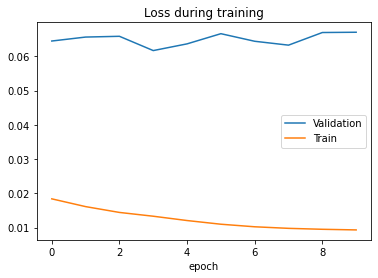

epoch 0 batch 200 loss=0.0111, MTL=0.012, MVL=0.0616				
epoch 0 batch 400 loss=0.0114, MTL=0.0119, MVL=0.0616				
epoch 1 batch 600 loss=0.0119, MTL=0.0117, MVL=0.0654				
epoch 1 batch 800 loss=0.0111, MTL=0.0116, MVL=0.0654				
epoch 2 batch 1000 loss=0.0106, MTL=0.0114, MVL=0.0685				
epoch 2 batch 1200 loss=0.0112, MTL=0.0114, MVL=0.0685				
epoch 3 batch 1400 loss=0.0112, MTL=0.0112, MVL=0.0691				
epoch 3 batch 1600 loss=0.0112, MTL=0.0112, MVL=0.0691				
epoch 4 batch 1800 loss=0.0111, MTL=0.011, MVL=0.0671				
epoch 4 batch 2000 loss=0.0108, MTL=0.011, MVL=0.0671				
epoch 5 batch 2200 loss=0.0102, MTL=0.0108, MVL=0.0693				
epoch 5 batch 2400 loss=0.00984, MTL=0.0108, MVL=0.0693				


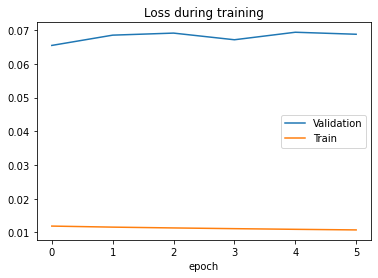

epoch 0 batch 200 loss=0.0111, MTL=0.0122, MVL=0.0619				
epoch 0 batch 400 loss=0.0122, MTL=0.0121, MVL=0.0619				
epoch 1 batch 600 loss=0.0115, MTL=0.012, MVL=0.0636				
epoch 1 batch 800 loss=0.0116, MTL=0.012, MVL=0.0636				
epoch 2 batch 1000 loss=0.0127, MTL=0.0119, MVL=0.0643				
epoch 2 batch 1200 loss=0.012, MTL=0.0119, MVL=0.0643				
epoch 3 batch 1400 loss=0.0113, MTL=0.0118, MVL=0.0648				
epoch 3 batch 1600 loss=0.0114, MTL=0.0118, MVL=0.0648				
epoch 4 batch 1800 loss=0.012, MTL=0.0119, MVL=0.0653				
epoch 4 batch 2000 loss=0.0111, MTL=0.0118, MVL=0.0653				
epoch 5 batch 2200 loss=0.0126, MTL=0.0118, MVL=0.0652				
epoch 5 batch 2400 loss=0.0115, MTL=0.0118, MVL=0.0652				


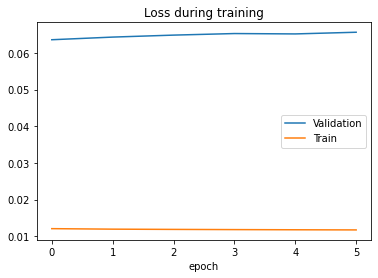

training model lstm[1] h=64,a=5,l=2
epoch 0 batch 200 loss=0.0229, MTL=0.0204, MVL=0.106				
epoch 0 batch 400 loss=0.02, MTL=0.0193, MVL=0.106				
saving model MTL=0.019253997897888443, MVL=0.06875905760976135
*epoch 1 batch 600 loss=0.0164, MTL=0.0182, MVL=0.0688				
*epoch 1 batch 800 loss=0.0179, MTL=0.0182, MVL=0.0688				
epoch 2 batch 1000 loss=0.0168, MTL=0.0166, MVL=0.0691				
epoch 2 batch 1200 loss=0.015, MTL=0.0163, MVL=0.0691				
saving model MTL=0.01628972589754549, MVL=0.06617858645613076
*epoch 3 batch 1400 loss=0.0155, MTL=0.0162, MVL=0.0662				
*epoch 3 batch 1600 loss=0.0159, MTL=0.0161, MVL=0.0662				
epoch 4 batch 1800 loss=0.0158, MTL=0.0159, MVL=0.0674				
epoch 4 batch 2000 loss=0.0168, MTL=0.016, MVL=0.0674				
saving model MTL=0.01593888590787699, MVL=0.06616064283202906
*epoch 5 batch 2200 loss=0.0157, MTL=0.016, MVL=0.0662				
*epoch 5 batch 2400 loss=0.0156, MTL=0.0159, MVL=0.0662				
saving model MTL=0.015885331758295828, MVL=0.0657611111881303
*epoch 6 bat

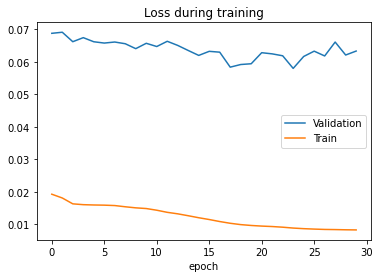

epoch 0 batch 200 loss=0.00822, MTL=0.00835, MVL=0.0581				
epoch 0 batch 400 loss=0.00869, MTL=0.00835, MVL=0.0581				
epoch 1 batch 600 loss=0.0082, MTL=0.00828, MVL=0.0628				
epoch 1 batch 800 loss=0.00829, MTL=0.0083, MVL=0.0628				
epoch 2 batch 1000 loss=0.00814, MTL=0.00827, MVL=0.064				
epoch 2 batch 1200 loss=0.0085, MTL=0.00826, MVL=0.064				
epoch 3 batch 1400 loss=0.00831, MTL=0.00822, MVL=0.0653				
epoch 3 batch 1600 loss=0.00778, MTL=0.00822, MVL=0.0653				
epoch 4 batch 1800 loss=0.00869, MTL=0.00822, MVL=0.0636				
epoch 4 batch 2000 loss=0.00821, MTL=0.00821, MVL=0.0636				
epoch 5 batch 2200 loss=0.00849, MTL=0.00816, MVL=0.066				
epoch 5 batch 2400 loss=0.00826, MTL=0.00817, MVL=0.066				


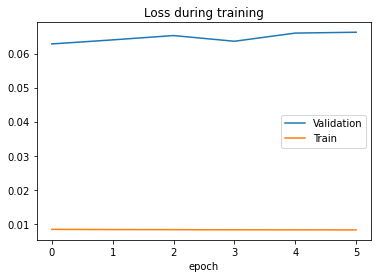

epoch 0 batch 200 loss=0.00885, MTL=0.00846, MVL=0.058				
epoch 0 batch 400 loss=0.00861, MTL=0.00841, MVL=0.058				
epoch 1 batch 600 loss=0.00836, MTL=0.00836, MVL=0.06				
epoch 1 batch 800 loss=0.00815, MTL=0.00833, MVL=0.06				
epoch 2 batch 1000 loss=0.00795, MTL=0.00832, MVL=0.0606				
epoch 2 batch 1200 loss=0.00777, MTL=0.00831, MVL=0.0606				
epoch 3 batch 1400 loss=0.00791, MTL=0.00825, MVL=0.0612				
epoch 3 batch 1600 loss=0.00813, MTL=0.00828, MVL=0.0612				
epoch 4 batch 1800 loss=0.00817, MTL=0.00836, MVL=0.0614				
epoch 4 batch 2000 loss=0.00826, MTL=0.00829, MVL=0.0614				
epoch 5 batch 2200 loss=0.00889, MTL=0.00831, MVL=0.0617				
epoch 5 batch 2400 loss=0.0084, MTL=0.00827, MVL=0.0617				


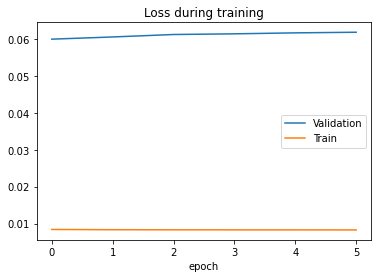

training model lstm[1] h=64,a=5,l=3
epoch 0 batch 200 loss=0.0179, MTL=0.0222, MVL=0.146				
epoch 0 batch 400 loss=0.017, MTL=0.0202, MVL=0.146				
saving model MTL=0.02001822181046009, MVL=0.0664452114676843
*epoch 1 batch 600 loss=0.0181, MTL=0.0184, MVL=0.0664				
*epoch 1 batch 800 loss=0.0217, MTL=0.0182, MVL=0.0664				
epoch 2 batch 1000 loss=0.0181, MTL=0.0182, MVL=0.0681				
epoch 2 batch 1200 loss=0.018, MTL=0.0182, MVL=0.0681				
epoch 3 batch 1400 loss=0.0193, MTL=0.0183, MVL=0.0675				
epoch 3 batch 1600 loss=0.0177, MTL=0.0182, MVL=0.0675				
epoch 4 batch 1800 loss=0.018, MTL=0.0182, MVL=0.0689				
epoch 4 batch 2000 loss=0.0167, MTL=0.0182, MVL=0.0689				
epoch 5 batch 2200 loss=0.0188, MTL=0.0181, MVL=0.0673				
epoch 5 batch 2400 loss=0.0175, MTL=0.0182, MVL=0.0673				
epoch 6 batch 2600 loss=0.0176, MTL=0.0179, MVL=0.0668				
epoch 6 batch 2800 loss=0.0186, MTL=0.0183, MVL=0.0668				
epoch 6 batch 3000 loss=0.0174, MTL=0.0182, MVL=0.0668				


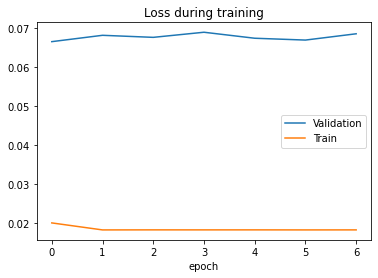

epoch 0 batch 200 loss=0.0165, MTL=0.0182, MVL=0.0668				
epoch 0 batch 400 loss=0.019, MTL=0.0182, MVL=0.0668				
epoch 1 batch 600 loss=0.0181, MTL=0.0182, MVL=0.0679				
epoch 1 batch 800 loss=0.0181, MTL=0.0182, MVL=0.0679				
epoch 2 batch 1000 loss=0.0174, MTL=0.0181, MVL=0.0672				
epoch 2 batch 1200 loss=0.0183, MTL=0.0182, MVL=0.0672				
epoch 3 batch 1400 loss=0.0201, MTL=0.018, MVL=0.068				
epoch 3 batch 1600 loss=0.018, MTL=0.0182, MVL=0.068				
epoch 4 batch 1800 loss=0.0181, MTL=0.0181, MVL=0.0671				
epoch 4 batch 2000 loss=0.0179, MTL=0.0181, MVL=0.0671				
epoch 5 batch 2200 loss=0.0168, MTL=0.018, MVL=0.0678				
epoch 5 batch 2400 loss=0.0172, MTL=0.0183, MVL=0.0678				


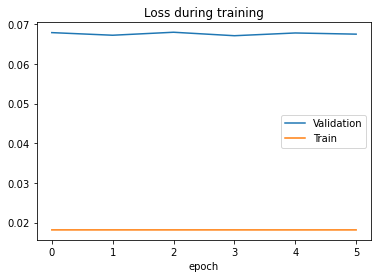

epoch 0 batch 200 loss=0.0163, MTL=0.0182, MVL=0.0666				
epoch 0 batch 400 loss=0.0192, MTL=0.0182, MVL=0.0666				
epoch 1 batch 600 loss=0.0193, MTL=0.0183, MVL=0.0677				
epoch 1 batch 800 loss=0.0179, MTL=0.0181, MVL=0.0677				
epoch 2 batch 1000 loss=0.0183, MTL=0.0181, MVL=0.0679				
epoch 2 batch 1200 loss=0.0194, MTL=0.0182, MVL=0.0679				
epoch 3 batch 1400 loss=0.0174, MTL=0.0181, MVL=0.0678				
epoch 3 batch 1600 loss=0.0183, MTL=0.0181, MVL=0.0678				
epoch 4 batch 1800 loss=0.0191, MTL=0.0181, MVL=0.0675				
epoch 4 batch 2000 loss=0.0179, MTL=0.0182, MVL=0.0675				
epoch 5 batch 2200 loss=0.0186, MTL=0.0178, MVL=0.0673				
epoch 5 batch 2400 loss=0.0172, MTL=0.0181, MVL=0.0673				


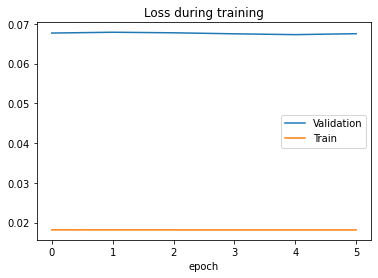

training model lstm[1] h=128,a=5,l=1
epoch 0 batch 200 loss=0.0167, MTL=0.0189, MVL=0.0946				
epoch 0 batch 400 loss=0.0175, MTL=0.0183, MVL=0.0946				
saving model MTL=0.018141763097677576, MVL=0.06294011452891787
*epoch 1 batch 600 loss=0.0145, MTL=0.0158, MVL=0.0629				
*epoch 1 batch 800 loss=0.0134, MTL=0.0153, MVL=0.0629				
saving model MTL=0.015140907232397974, MVL=0.05598740450671462
*epoch 2 batch 1000 loss=0.0134, MTL=0.0137, MVL=0.056				
*epoch 2 batch 1200 loss=0.0117, MTL=0.0132, MVL=0.056				
saving model MTL=0.012970136046220332, MVL=0.05010001575116251
*epoch 3 batch 1400 loss=0.0115, MTL=0.0117, MVL=0.0501				
*epoch 3 batch 1600 loss=0.0115, MTL=0.0113, MVL=0.0501				
saving model MTL=0.011042404152005567, MVL=0.04856707357236596
*epoch 4 batch 1800 loss=0.00985, MTL=0.0101, MVL=0.0486				
*epoch 4 batch 2000 loss=0.00929, MTL=0.00995, MVL=0.0486				
saving model MTL=0.009861962523474842, MVL=0.04660340306944535
*epoch 5 batch 2200 loss=0.0092, MTL=0.00939, MVL=0.0

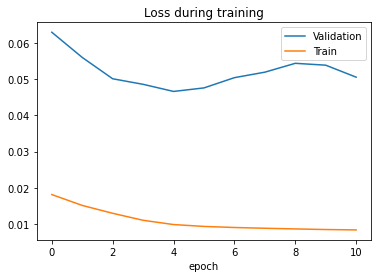

epoch 0 batch 200 loss=0.00922, MTL=0.00892, MVL=0.0466				
epoch 0 batch 400 loss=0.00963, MTL=0.0089, MVL=0.0466				
epoch 1 batch 600 loss=0.0084, MTL=0.00873, MVL=0.0472				
epoch 1 batch 800 loss=0.00843, MTL=0.00876, MVL=0.0472				
epoch 2 batch 1000 loss=0.00867, MTL=0.00867, MVL=0.0475				
epoch 2 batch 1200 loss=0.00885, MTL=0.00868, MVL=0.0475				
epoch 3 batch 1400 loss=0.00907, MTL=0.00859, MVL=0.0481				
epoch 3 batch 1600 loss=0.00896, MTL=0.0086, MVL=0.0481				
epoch 4 batch 1800 loss=0.00846, MTL=0.00854, MVL=0.0482				
epoch 4 batch 2000 loss=0.00838, MTL=0.00855, MVL=0.0482				
epoch 5 batch 2200 loss=0.00769, MTL=0.00858, MVL=0.0485				
epoch 5 batch 2400 loss=0.00885, MTL=0.00851, MVL=0.0485				


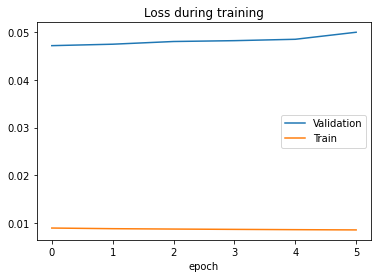

epoch 0 batch 200 loss=0.00943, MTL=0.00911, MVL=0.0465				
epoch 0 batch 400 loss=0.00902, MTL=0.00903, MVL=0.0465				
epoch 1 batch 600 loss=0.00971, MTL=0.00888, MVL=0.0468				
epoch 1 batch 800 loss=0.00954, MTL=0.00888, MVL=0.0468				
epoch 2 batch 1000 loss=0.00828, MTL=0.00889, MVL=0.0475				
epoch 2 batch 1200 loss=0.0092, MTL=0.00885, MVL=0.0475				
epoch 3 batch 1400 loss=0.0081, MTL=0.00879, MVL=0.0475				
epoch 3 batch 1600 loss=0.00915, MTL=0.0088, MVL=0.0475				
epoch 4 batch 1800 loss=0.00903, MTL=0.0088, MVL=0.0475				
epoch 4 batch 2000 loss=0.00882, MTL=0.00879, MVL=0.0475				
epoch 5 batch 2200 loss=0.00906, MTL=0.00879, MVL=0.0475				
epoch 5 batch 2400 loss=0.00866, MTL=0.00877, MVL=0.0475				


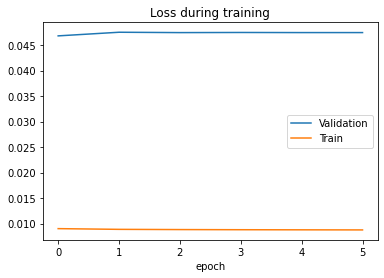

training model lstm[1] h=128,a=5,l=2
epoch 0 batch 200 loss=0.0202, MTL=0.0188, MVL=0.0912				
epoch 0 batch 400 loss=0.0176, MTL=0.0186, MVL=0.0912				
saving model MTL=0.018540187661404837, MVL=0.06808414804886599
*epoch 1 batch 600 loss=0.0179, MTL=0.0181, MVL=0.0681				
*epoch 1 batch 800 loss=0.0182, MTL=0.0182, MVL=0.0681				
saving model MTL=0.018050297290327644, MVL=0.06517763270950708
*epoch 2 batch 1000 loss=0.0148, MTL=0.0163, MVL=0.0652				
*epoch 2 batch 1200 loss=0.0152, MTL=0.0162, MVL=0.0652				
saving model MTL=0.016251465092750814, MVL=0.06479844621947554
*epoch 3 batch 1400 loss=0.0159, MTL=0.016, MVL=0.0648				
*epoch 3 batch 1600 loss=0.0157, MTL=0.016, MVL=0.0648				
epoch 4 batch 1800 loss=0.0159, MTL=0.016, MVL=0.0659				
epoch 4 batch 2000 loss=0.0172, MTL=0.0158, MVL=0.0659				
saving model MTL=0.015770193056029204, MVL=0.06390340766701542
*epoch 5 batch 2200 loss=0.0152, MTL=0.0155, MVL=0.0639				
*epoch 5 batch 2400 loss=0.015, MTL=0.0154, MVL=0.0639				
sav

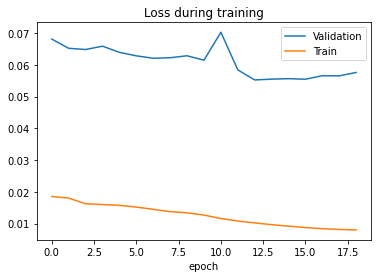

epoch 0 batch 200 loss=0.0091, MTL=0.00948, MVL=0.0552				
epoch 0 batch 400 loss=0.00931, MTL=0.00944, MVL=0.0552				
epoch 1 batch 600 loss=0.00967, MTL=0.00936, MVL=0.0604				
epoch 1 batch 800 loss=0.00925, MTL=0.00931, MVL=0.0604				
epoch 2 batch 1000 loss=0.00927, MTL=0.00925, MVL=0.0603				
epoch 2 batch 1200 loss=0.00987, MTL=0.00921, MVL=0.0603				
epoch 3 batch 1400 loss=0.00926, MTL=0.0091, MVL=0.0618				
epoch 3 batch 1600 loss=0.00827, MTL=0.00912, MVL=0.0618				
epoch 4 batch 1800 loss=0.00925, MTL=0.00907, MVL=0.0613				
epoch 4 batch 2000 loss=0.00903, MTL=0.00905, MVL=0.0613				
epoch 5 batch 2200 loss=0.00869, MTL=0.00898, MVL=0.0617				
epoch 5 batch 2400 loss=0.00858, MTL=0.00893, MVL=0.0617				


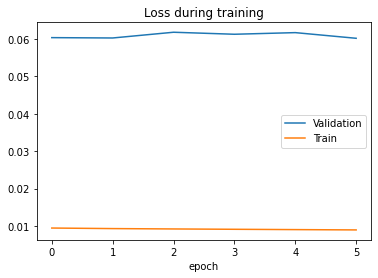

epoch 0 batch 200 loss=0.00916, MTL=0.00969, MVL=0.0552				
epoch 0 batch 400 loss=0.00945, MTL=0.0096, MVL=0.0552				
epoch 1 batch 600 loss=0.0101, MTL=0.00953, MVL=0.0589				
epoch 1 batch 800 loss=0.00888, MTL=0.00946, MVL=0.0589				
epoch 2 batch 1000 loss=0.00938, MTL=0.00947, MVL=0.0598				
epoch 2 batch 1200 loss=0.00897, MTL=0.00944, MVL=0.0598				
epoch 3 batch 1400 loss=0.00958, MTL=0.00936, MVL=0.0607				
epoch 3 batch 1600 loss=0.00947, MTL=0.00938, MVL=0.0607				
epoch 4 batch 1800 loss=0.0087, MTL=0.00933, MVL=0.06				
epoch 4 batch 2000 loss=0.00969, MTL=0.00933, MVL=0.06				
epoch 5 batch 2200 loss=0.00976, MTL=0.00922, MVL=0.0605				
epoch 5 batch 2400 loss=0.00916, MTL=0.00933, MVL=0.0605				


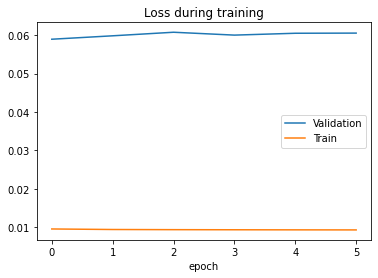

training model lstm[1] h=128,a=5,l=3
epoch 0 batch 200 loss=0.0172, MTL=0.0187, MVL=0.0889				
epoch 0 batch 400 loss=0.0196, MTL=0.0185, MVL=0.0889				
saving model MTL=0.018511118932990636, MVL=0.06778110905748899
*epoch 1 batch 600 loss=0.0191, MTL=0.0182, MVL=0.0678				
*epoch 1 batch 800 loss=0.0187, MTL=0.0183, MVL=0.0678				
saving model MTL=0.018245394294328695, MVL=0.06674244334218932
*epoch 2 batch 1000 loss=0.0179, MTL=0.0182, MVL=0.0667				
*epoch 2 batch 1200 loss=0.0169, MTL=0.0183, MVL=0.0667				
epoch 3 batch 1400 loss=0.0179, MTL=0.0182, MVL=0.0681				
epoch 3 batch 1600 loss=0.0187, MTL=0.0182, MVL=0.0681				
epoch 4 batch 1800 loss=0.0183, MTL=0.0182, MVL=0.0676				
epoch 4 batch 2000 loss=0.0206, MTL=0.0182, MVL=0.0676				
epoch 5 batch 2200 loss=0.0179, MTL=0.0179, MVL=0.0673				
epoch 5 batch 2400 loss=0.0168, MTL=0.0177, MVL=0.0673				
saving model MTL=0.017130758365999057, MVL=0.06522335490730942
*epoch 6 batch 2600 loss=0.0163, MTL=0.0168, MVL=0.0652				
*epoch

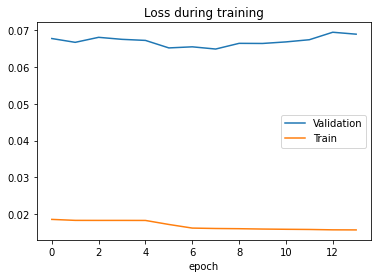

epoch 0 batch 200 loss=0.0154, MTL=0.0158, MVL=0.0647				
epoch 0 batch 400 loss=0.0153, MTL=0.0158, MVL=0.0647				
epoch 1 batch 600 loss=0.0162, MTL=0.0157, MVL=0.066				
epoch 1 batch 800 loss=0.0159, MTL=0.0158, MVL=0.066				
epoch 2 batch 1000 loss=0.016, MTL=0.0158, MVL=0.0662				
epoch 2 batch 1200 loss=0.0158, MTL=0.0158, MVL=0.0662				
epoch 3 batch 1400 loss=0.0167, MTL=0.0157, MVL=0.0665				
epoch 3 batch 1600 loss=0.016, MTL=0.0158, MVL=0.0665				
epoch 4 batch 1800 loss=0.0157, MTL=0.0158, MVL=0.0669				
epoch 4 batch 2000 loss=0.0154, MTL=0.0157, MVL=0.0669				
epoch 5 batch 2200 loss=0.0149, MTL=0.0154, MVL=0.0665				
epoch 5 batch 2400 loss=0.0157, MTL=0.0157, MVL=0.0665				


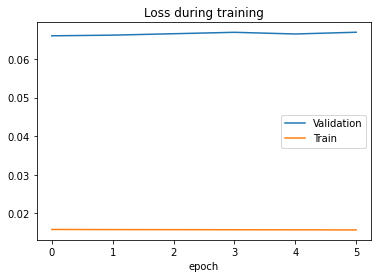

epoch 0 batch 200 loss=0.0151, MTL=0.0158, MVL=0.0645				
epoch 0 batch 400 loss=0.0171, MTL=0.0159, MVL=0.0645				
epoch 1 batch 600 loss=0.0185, MTL=0.0159, MVL=0.0658				
epoch 1 batch 800 loss=0.0143, MTL=0.0159, MVL=0.0658				
epoch 2 batch 1000 loss=0.0153, MTL=0.0158, MVL=0.0657				
epoch 2 batch 1200 loss=0.0159, MTL=0.0158, MVL=0.0657				
epoch 3 batch 1400 loss=0.0158, MTL=0.0158, MVL=0.0655				
epoch 3 batch 1600 loss=0.0155, MTL=0.0158, MVL=0.0655				
epoch 4 batch 1800 loss=0.016, MTL=0.0156, MVL=0.0657				
epoch 4 batch 2000 loss=0.0156, MTL=0.0158, MVL=0.0657				
epoch 5 batch 2200 loss=0.0164, MTL=0.0159, MVL=0.0653				
epoch 5 batch 2400 loss=0.015, MTL=0.0159, MVL=0.0653				


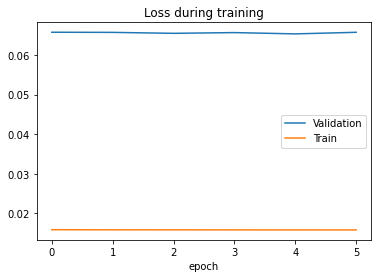

training model lstm[2] h=32,a=5,l=1
epoch 0 batch 200 loss=0.0177, MTL=0.0218, MVL=0.157				
epoch 0 batch 400 loss=0.0202, MTL=0.02, MVL=0.157				
saving model MTL=0.019803496507828835, MVL=0.06541380896920064
*epoch 1 batch 600 loss=0.0178, MTL=0.0178, MVL=0.0654				
*epoch 1 batch 800 loss=0.0168, MTL=0.0175, MVL=0.0654				
saving model MTL=0.01739748126416366, MVL=0.0645082815870887
*epoch 2 batch 1000 loss=0.0168, MTL=0.0165, MVL=0.0645				
*epoch 2 batch 1200 loss=0.0157, MTL=0.0161, MVL=0.0645				
saving model MTL=0.015961045595036506, MVL=0.05897552984171226
*epoch 3 batch 1400 loss=0.0165, MTL=0.0153, MVL=0.059				
*epoch 3 batch 1600 loss=0.014, MTL=0.0151, MVL=0.059				
saving model MTL=0.014977744948247976, MVL=0.057371568972947165
*epoch 4 batch 1800 loss=0.0138, MTL=0.0146, MVL=0.0574				
*epoch 4 batch 2000 loss=0.0136, MTL=0.0144, MVL=0.0574				
saving model MTL=0.014219045389538275, MVL=0.05691182631693902
*epoch 5 batch 2200 loss=0.0125, MTL=0.0137, MVL=0.0569				
*ep

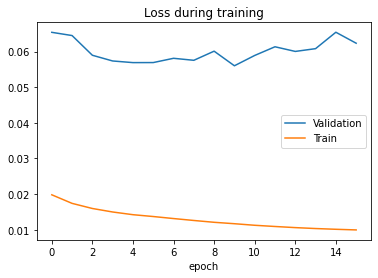

epoch 0 batch 200 loss=0.0121, MTL=0.0111, MVL=0.0561				
epoch 0 batch 400 loss=0.0113, MTL=0.011, MVL=0.0561				
epoch 1 batch 600 loss=0.011, MTL=0.011, MVL=0.0596				
epoch 1 batch 800 loss=0.0112, MTL=0.0109, MVL=0.0596				
epoch 2 batch 1000 loss=0.0107, MTL=0.0109, MVL=0.0594				
epoch 2 batch 1200 loss=0.0103, MTL=0.0109, MVL=0.0594				
epoch 3 batch 1400 loss=0.0113, MTL=0.0108, MVL=0.06				
epoch 3 batch 1600 loss=0.0111, MTL=0.0108, MVL=0.06				
epoch 4 batch 1800 loss=0.0118, MTL=0.0107, MVL=0.0598				
epoch 4 batch 2000 loss=0.0111, MTL=0.0108, MVL=0.0598				
epoch 5 batch 2200 loss=0.00992, MTL=0.0105, MVL=0.0609				
epoch 5 batch 2400 loss=0.0106, MTL=0.0107, MVL=0.0609				


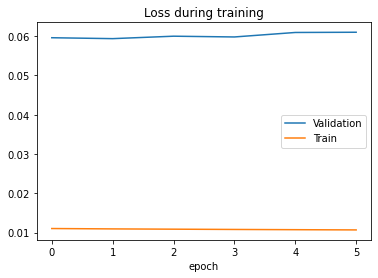

epoch 0 batch 200 loss=0.0104, MTL=0.0111, MVL=0.0561				
epoch 0 batch 400 loss=0.011, MTL=0.0111, MVL=0.0561				
epoch 1 batch 600 loss=0.0105, MTL=0.011, MVL=0.059				
epoch 1 batch 800 loss=0.011, MTL=0.011, MVL=0.059				
epoch 2 batch 1000 loss=0.0107, MTL=0.011, MVL=0.0596				
epoch 2 batch 1200 loss=0.0107, MTL=0.011, MVL=0.0596				
epoch 3 batch 1400 loss=0.00978, MTL=0.011, MVL=0.0597				
epoch 3 batch 1600 loss=0.0116, MTL=0.011, MVL=0.0597				
epoch 4 batch 1800 loss=0.0117, MTL=0.011, MVL=0.0596				
epoch 4 batch 2000 loss=0.0118, MTL=0.011, MVL=0.0596				
epoch 5 batch 2200 loss=0.0122, MTL=0.0111, MVL=0.0596				
epoch 5 batch 2400 loss=0.0109, MTL=0.011, MVL=0.0596				


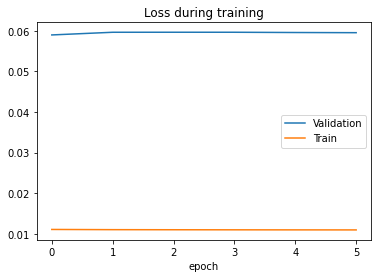

training model lstm[2] h=32,a=5,l=2
epoch 0 batch 200 loss=0.0186, MTL=0.0316, MVL=0.248				
epoch 0 batch 400 loss=0.0198, MTL=0.0249, MVL=0.248				
saving model MTL=0.02434511427223407, MVL=0.06770281774587318
*epoch 1 batch 600 loss=0.0183, MTL=0.0183, MVL=0.0677				
*epoch 1 batch 800 loss=0.0199, MTL=0.0182, MVL=0.0677				
epoch 2 batch 1000 loss=0.0198, MTL=0.0183, MVL=0.0681				
epoch 2 batch 1200 loss=0.0172, MTL=0.0182, MVL=0.0681				
saving model MTL=0.01817290724296011, MVL=0.06744519346317307
*epoch 3 batch 1400 loss=0.0227, MTL=0.018, MVL=0.0674				
*epoch 3 batch 1600 loss=0.0165, MTL=0.0174, MVL=0.0674				
saving model MTL=0.017149013893003415, MVL=0.06572488854165937
*epoch 4 batch 1800 loss=0.0186, MTL=0.0166, MVL=0.0657				
*epoch 4 batch 2000 loss=0.0154, MTL=0.0163, MVL=0.0657				
saving model MTL=0.016194536907740333, MVL=0.0652910442259468
*epoch 5 batch 2200 loss=0.0161, MTL=0.016, MVL=0.0653				
*epoch 5 batch 2400 loss=0.016, MTL=0.016, MVL=0.0653				
saving mo

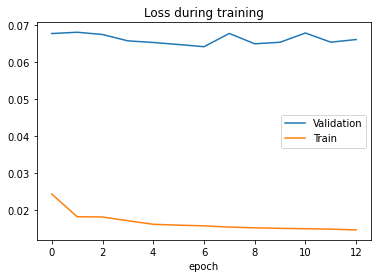

epoch 0 batch 200 loss=0.0164, MTL=0.0153, MVL=0.0641				
epoch 0 batch 400 loss=0.0155, MTL=0.0154, MVL=0.0641				
epoch 1 batch 600 loss=0.0158, MTL=0.0154, MVL=0.0644				
epoch 1 batch 800 loss=0.0162, MTL=0.0154, MVL=0.0644				
epoch 2 batch 1000 loss=0.0156, MTL=0.0153, MVL=0.0656				
epoch 2 batch 1200 loss=0.0147, MTL=0.0152, MVL=0.0656				
epoch 3 batch 1400 loss=0.0148, MTL=0.0152, MVL=0.0655				
epoch 3 batch 1600 loss=0.015, MTL=0.0152, MVL=0.0655				
epoch 4 batch 1800 loss=0.0131, MTL=0.015, MVL=0.0662				
epoch 4 batch 2000 loss=0.0146, MTL=0.0152, MVL=0.0662				
epoch 5 batch 2200 loss=0.0161, MTL=0.0151, MVL=0.0673				
epoch 5 batch 2400 loss=0.0152, MTL=0.0151, MVL=0.0673				


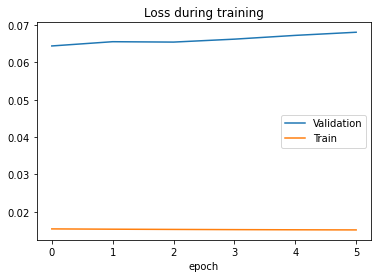

epoch 0 batch 200 loss=0.0148, MTL=0.0155, MVL=0.0646				
epoch 0 batch 400 loss=0.0168, MTL=0.0155, MVL=0.0646				
epoch 1 batch 600 loss=0.0152, MTL=0.0154, MVL=0.065				
epoch 1 batch 800 loss=0.0149, MTL=0.0154, MVL=0.065				
epoch 2 batch 1000 loss=0.0154, MTL=0.0155, MVL=0.0647				
epoch 2 batch 1200 loss=0.0151, MTL=0.0154, MVL=0.0647				
epoch 3 batch 1400 loss=0.0147, MTL=0.0154, MVL=0.0649				
epoch 3 batch 1600 loss=0.0156, MTL=0.0154, MVL=0.0649				
epoch 4 batch 1800 loss=0.0158, MTL=0.0153, MVL=0.0644				
epoch 4 batch 2000 loss=0.015, MTL=0.0154, MVL=0.0644				
epoch 5 batch 2200 loss=0.015, MTL=0.0154, MVL=0.0649				
epoch 5 batch 2400 loss=0.0148, MTL=0.0154, MVL=0.0649				


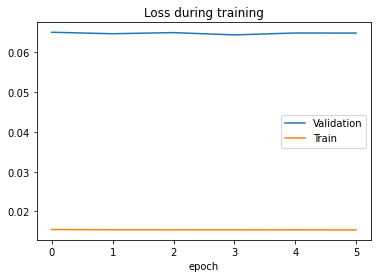

training model lstm[2] h=32,a=5,l=3
epoch 0 batch 200 loss=0.0193, MTL=0.0292, MVL=0.194				
epoch 0 batch 400 loss=0.0169, MTL=0.0237, MVL=0.194				
saving model MTL=0.023314385730816227, MVL=0.06824080621609922
*epoch 1 batch 600 loss=0.0184, MTL=0.0182, MVL=0.0682				
*epoch 1 batch 800 loss=0.018, MTL=0.0182, MVL=0.0682				
saving model MTL=0.018223426749985706, MVL=0.06801408651422282
*epoch 2 batch 1000 loss=0.0197, MTL=0.0184, MVL=0.068				
*epoch 2 batch 1200 loss=0.0182, MTL=0.0183, MVL=0.068				
epoch 3 batch 1400 loss=0.0185, MTL=0.0183, MVL=0.0682				
epoch 3 batch 1600 loss=0.0181, MTL=0.0183, MVL=0.0682				
epoch 4 batch 1800 loss=0.0171, MTL=0.0182, MVL=0.0681				
epoch 4 batch 2000 loss=0.0195, MTL=0.0182, MVL=0.0681				
saving model MTL=0.01823334248766613, MVL=0.06753308771819365
*epoch 5 batch 2200 loss=0.0159, MTL=0.0182, MVL=0.0675				
*epoch 5 batch 2400 loss=0.0176, MTL=0.0182, MVL=0.0675				
epoch 6 batch 2600 loss=0.0154, MTL=0.0165, MVL=0.0683				
epoch 6 batc

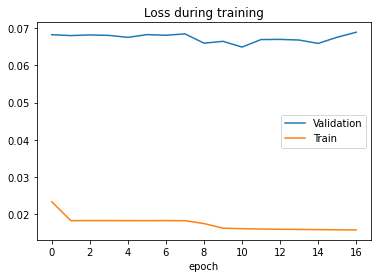

epoch 0 batch 200 loss=0.0149, MTL=0.0159, MVL=0.0649				
epoch 0 batch 400 loss=0.0161, MTL=0.0159, MVL=0.0649				
epoch 1 batch 600 loss=0.0164, MTL=0.0158, MVL=0.0653				
epoch 1 batch 800 loss=0.0157, MTL=0.0158, MVL=0.0653				
epoch 2 batch 1000 loss=0.0175, MTL=0.0158, MVL=0.0663				
epoch 2 batch 1200 loss=0.0171, MTL=0.0158, MVL=0.0663				
epoch 3 batch 1400 loss=0.0158, MTL=0.0159, MVL=0.0665				
epoch 3 batch 1600 loss=0.0161, MTL=0.0158, MVL=0.0665				
epoch 4 batch 1800 loss=0.0152, MTL=0.0158, MVL=0.0662				
epoch 4 batch 2000 loss=0.0188, MTL=0.0158, MVL=0.0662				
epoch 5 batch 2200 loss=0.0152, MTL=0.0159, MVL=0.0666				
epoch 5 batch 2400 loss=0.0167, MTL=0.0158, MVL=0.0666				


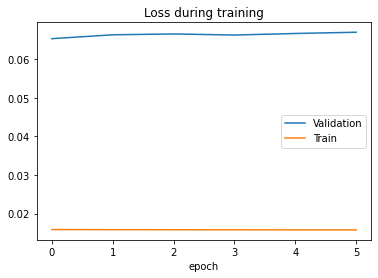

epoch 0 batch 200 loss=0.0173, MTL=0.016, MVL=0.0648				
epoch 0 batch 400 loss=0.0155, MTL=0.0159, MVL=0.0648				
epoch 1 batch 600 loss=0.0161, MTL=0.0158, MVL=0.0658				
epoch 1 batch 800 loss=0.0164, MTL=0.0158, MVL=0.0658				
epoch 2 batch 1000 loss=0.0153, MTL=0.0159, MVL=0.0655				
epoch 2 batch 1200 loss=0.0173, MTL=0.0158, MVL=0.0655				
epoch 3 batch 1400 loss=0.0168, MTL=0.0158, MVL=0.0656				
epoch 3 batch 1600 loss=0.0164, MTL=0.0158, MVL=0.0656				
epoch 4 batch 1800 loss=0.0158, MTL=0.0159, MVL=0.0658				
epoch 4 batch 2000 loss=0.0149, MTL=0.0159, MVL=0.0658				
epoch 5 batch 2200 loss=0.0152, MTL=0.0158, MVL=0.0657				
epoch 5 batch 2400 loss=0.0168, MTL=0.0159, MVL=0.0657				


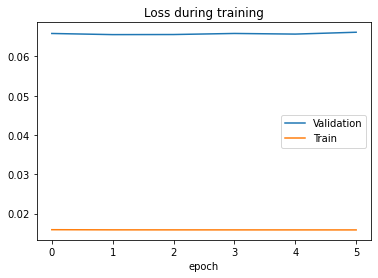

training model lstm[2] h=64,a=5,l=1
epoch 0 batch 200 loss=0.0171, MTL=0.0196, MVL=0.102				
epoch 0 batch 400 loss=0.0156, MTL=0.0187, MVL=0.102				
saving model MTL=0.018544626785721843, MVL=0.06260062357197042
*epoch 1 batch 600 loss=0.0153, MTL=0.0167, MVL=0.0626				
*epoch 1 batch 800 loss=0.0149, MTL=0.0161, MVL=0.0626				
saving model MTL=0.015979046789245298, MVL=0.05641980243266606
*epoch 2 batch 1000 loss=0.0151, MTL=0.0147, MVL=0.0564				
*epoch 2 batch 1200 loss=0.0143, MTL=0.0145, MVL=0.0564				
epoch 3 batch 1400 loss=0.0121, MTL=0.0135, MVL=0.0579				
epoch 3 batch 1600 loss=0.0112, MTL=0.0132, MVL=0.0579				
epoch 4 batch 1800 loss=0.012, MTL=0.0121, MVL=0.0573				
epoch 4 batch 2000 loss=0.0112, MTL=0.0119, MVL=0.0573				
epoch 5 batch 2200 loss=0.0108, MTL=0.0109, MVL=0.0635				
epoch 5 batch 2400 loss=0.0113, MTL=0.0108, MVL=0.0635				
epoch 6 batch 2600 loss=0.0102, MTL=0.00992, MVL=0.0649				
epoch 6 batch 2800 loss=0.00994, MTL=0.0102, MVL=0.0649				
epoch 6 batch

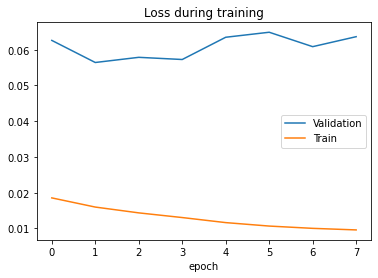

epoch 0 batch 200 loss=0.0141, MTL=0.0145, MVL=0.0561				
epoch 0 batch 400 loss=0.0149, MTL=0.0144, MVL=0.0561				
saving model MTL=0.0144222665268403, MVL=0.0552168146508639
*epoch 1 batch 600 loss=0.0147, MTL=0.0142, MVL=0.0552				
*epoch 1 batch 800 loss=0.0144, MTL=0.0142, MVL=0.0552				
epoch 2 batch 1000 loss=0.0137, MTL=0.0139, MVL=0.0555				
epoch 2 batch 1200 loss=0.0141, MTL=0.0139, MVL=0.0555				
epoch 3 batch 1400 loss=0.0141, MTL=0.0137, MVL=0.0553				
epoch 3 batch 1600 loss=0.0135, MTL=0.0136, MVL=0.0553				
epoch 4 batch 1800 loss=0.0133, MTL=0.0134, MVL=0.056				
epoch 4 batch 2000 loss=0.0129, MTL=0.0133, MVL=0.056				
epoch 5 batch 2200 loss=0.0127, MTL=0.0132, MVL=0.0561				
epoch 5 batch 2400 loss=0.0138, MTL=0.013, MVL=0.0561				
epoch 6 batch 2600 loss=0.0122, MTL=0.0127, MVL=0.0582				
epoch 6 batch 2800 loss=0.0127, MTL=0.0126, MVL=0.0582				
epoch 6 batch 3000 loss=0.0118, MTL=0.0126, MVL=0.0582				


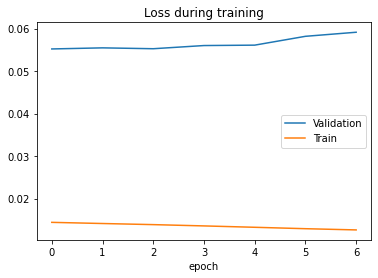

epoch 0 batch 200 loss=0.016, MTL=0.0142, MVL=0.0552				
epoch 0 batch 400 loss=0.014, MTL=0.0142, MVL=0.0552				
epoch 1 batch 600 loss=0.0135, MTL=0.0142, MVL=0.0553				
epoch 1 batch 800 loss=0.0141, MTL=0.0142, MVL=0.0553				
epoch 2 batch 1000 loss=0.0143, MTL=0.0142, MVL=0.0556				
epoch 2 batch 1200 loss=0.0146, MTL=0.0141, MVL=0.0556				
epoch 3 batch 1400 loss=0.0143, MTL=0.0142, MVL=0.0553				
epoch 3 batch 1600 loss=0.0143, MTL=0.0142, MVL=0.0553				
epoch 4 batch 1800 loss=0.0141, MTL=0.0141, MVL=0.0553				
epoch 4 batch 2000 loss=0.014, MTL=0.0141, MVL=0.0553				
epoch 5 batch 2200 loss=0.0147, MTL=0.0141, MVL=0.0555				
epoch 5 batch 2400 loss=0.014, MTL=0.0141, MVL=0.0555				


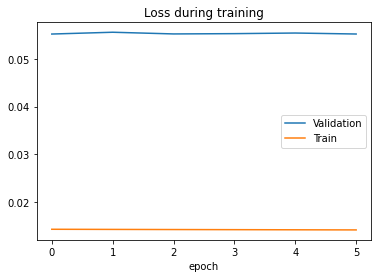

training model lstm[2] h=64,a=5,l=2
epoch 0 batch 200 loss=0.0167, MTL=0.0194, MVL=0.101				
epoch 0 batch 400 loss=0.0193, MTL=0.0189, MVL=0.101				
saving model MTL=0.018815904707318778, MVL=0.0687751590472753
*epoch 1 batch 600 loss=0.0188, MTL=0.0183, MVL=0.0688				
*epoch 1 batch 800 loss=0.0183, MTL=0.0182, MVL=0.0688				
saving model MTL=0.01812888166972589, MVL=0.06797305024305328
*epoch 2 batch 1000 loss=0.0167, MTL=0.0167, MVL=0.068				
*epoch 2 batch 1200 loss=0.0158, MTL=0.0164, MVL=0.068				
saving model MTL=0.016326822826582897, MVL=0.06541411651939642
*epoch 3 batch 1400 loss=0.0164, MTL=0.0161, MVL=0.0654				
*epoch 3 batch 1600 loss=0.0168, MTL=0.016, MVL=0.0654				
saving model MTL=0.0160313175999781, MVL=0.0651277979133559
*epoch 4 batch 1800 loss=0.0161, MTL=0.016, MVL=0.0651				
*epoch 4 batch 2000 loss=0.016, MTL=0.016, MVL=0.0651				
saving model MTL=0.015880512071485196, MVL=0.06271877939828106
*epoch 5 batch 2200 loss=0.0155, MTL=0.0157, MVL=0.0627				
*epoch 5

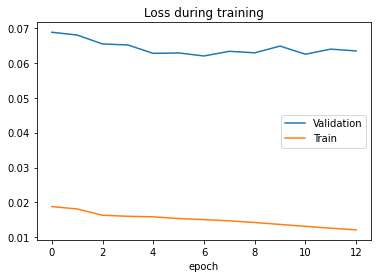

epoch 0 batch 200 loss=0.0155, MTL=0.0147, MVL=0.0621				
epoch 0 batch 400 loss=0.0146, MTL=0.0147, MVL=0.0621				
epoch 1 batch 600 loss=0.0144, MTL=0.0146, MVL=0.0629				
epoch 1 batch 800 loss=0.0156, MTL=0.0147, MVL=0.0629				
epoch 2 batch 1000 loss=0.0135, MTL=0.0145, MVL=0.0629				
epoch 2 batch 1200 loss=0.0145, MTL=0.0145, MVL=0.0629				
epoch 3 batch 1400 loss=0.0156, MTL=0.0144, MVL=0.0626				
epoch 3 batch 1600 loss=0.0135, MTL=0.0145, MVL=0.0626				
saving model MTL=0.014473104825798276, MVL=0.06188043310749726
*epoch 4 batch 1800 loss=0.014, MTL=0.0143, MVL=0.0619				
*epoch 4 batch 2000 loss=0.0138, MTL=0.0143, MVL=0.0619				
saving model MTL=0.014356519923680925, MVL=0.06137984997180641
*epoch 5 batch 2200 loss=0.0149, MTL=0.0144, MVL=0.0614				
*epoch 5 batch 2400 loss=0.0142, MTL=0.0143, MVL=0.0614				
epoch 6 batch 2600 loss=0.0141, MTL=0.0139, MVL=0.0615				
epoch 6 batch 2800 loss=0.0135, MTL=0.0142, MVL=0.0615				
epoch 6 batch 3000 loss=0.0154, MTL=0.0142, MVL=0

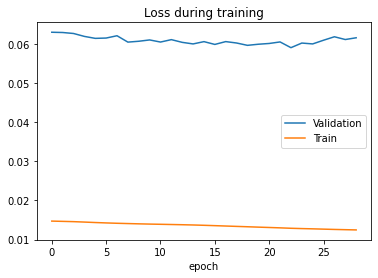

epoch 0 batch 200 loss=0.0126, MTL=0.0128, MVL=0.0593				
epoch 0 batch 400 loss=0.013, MTL=0.0128, MVL=0.0593				
epoch 1 batch 600 loss=0.0132, MTL=0.0127, MVL=0.0606				
epoch 1 batch 800 loss=0.0127, MTL=0.0127, MVL=0.0606				
epoch 2 batch 1000 loss=0.0127, MTL=0.0128, MVL=0.0601				
epoch 2 batch 1200 loss=0.0137, MTL=0.0128, MVL=0.0601				
epoch 3 batch 1400 loss=0.0127, MTL=0.0128, MVL=0.0607				
epoch 3 batch 1600 loss=0.0141, MTL=0.0128, MVL=0.0607				
epoch 4 batch 1800 loss=0.0117, MTL=0.0127, MVL=0.0601				
epoch 4 batch 2000 loss=0.0118, MTL=0.0128, MVL=0.0601				
epoch 5 batch 2200 loss=0.0127, MTL=0.0128, MVL=0.0601				
epoch 5 batch 2400 loss=0.0122, MTL=0.0127, MVL=0.0601				


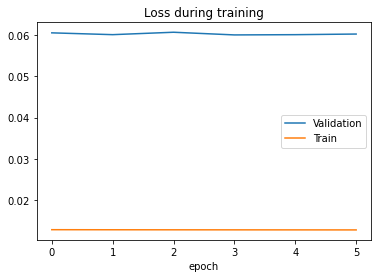

training model lstm[2] h=64,a=5,l=3
epoch 0 batch 200 loss=0.0188, MTL=0.0209, MVL=0.135				
epoch 0 batch 400 loss=0.0191, MTL=0.0195, MVL=0.135				
saving model MTL=0.01945310455959884, MVL=0.06782703455842909
*epoch 1 batch 600 loss=0.0169, MTL=0.0183, MVL=0.0678				
*epoch 1 batch 800 loss=0.016, MTL=0.0182, MVL=0.0678				
saving model MTL=0.018260268515995413, MVL=0.0665637448918624
*epoch 2 batch 1000 loss=0.017, MTL=0.0182, MVL=0.0666				
*epoch 2 batch 1200 loss=0.017, MTL=0.0182, MVL=0.0666				
epoch 3 batch 1400 loss=0.0181, MTL=0.0183, MVL=0.0667				
epoch 3 batch 1600 loss=0.0208, MTL=0.0183, MVL=0.0667				
epoch 4 batch 1800 loss=0.0187, MTL=0.0182, MVL=0.0673				
epoch 4 batch 2000 loss=0.018, MTL=0.0181, MVL=0.0673				
epoch 5 batch 2200 loss=0.018, MTL=0.018, MVL=0.0671				
epoch 5 batch 2400 loss=0.0182, MTL=0.0182, MVL=0.0671				
epoch 6 batch 2600 loss=0.0189, MTL=0.0185, MVL=0.0676				
epoch 6 batch 2800 loss=0.0182, MTL=0.0182, MVL=0.0676				
epoch 6 batch 3000 los

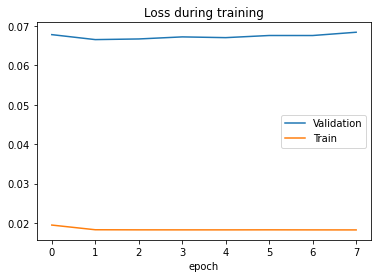

epoch 0 batch 200 loss=0.0165, MTL=0.0181, MVL=0.0669				
epoch 0 batch 400 loss=0.0184, MTL=0.0181, MVL=0.0669				
epoch 1 batch 600 loss=0.0196, MTL=0.0181, MVL=0.0673				
epoch 1 batch 800 loss=0.0198, MTL=0.0182, MVL=0.0673				
epoch 2 batch 1000 loss=0.018, MTL=0.0181, MVL=0.0679				
epoch 2 batch 1200 loss=0.0181, MTL=0.0181, MVL=0.0679				
epoch 3 batch 1400 loss=0.0186, MTL=0.0182, MVL=0.0676				
epoch 3 batch 1600 loss=0.0193, MTL=0.0182, MVL=0.0676				
epoch 4 batch 1800 loss=0.0194, MTL=0.0183, MVL=0.0673				
epoch 4 batch 2000 loss=0.0181, MTL=0.0182, MVL=0.0673				
epoch 5 batch 2200 loss=0.0194, MTL=0.0184, MVL=0.0683				
epoch 5 batch 2400 loss=0.019, MTL=0.0183, MVL=0.0683				


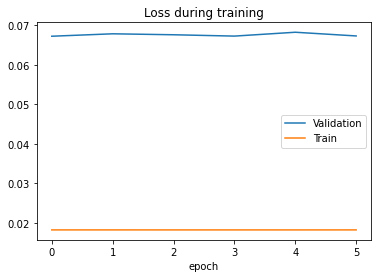

epoch 0 batch 200 loss=0.0179, MTL=0.0181, MVL=0.0667				
epoch 0 batch 400 loss=0.0181, MTL=0.0181, MVL=0.0667				
epoch 1 batch 600 loss=0.0204, MTL=0.0181, MVL=0.0674				
epoch 1 batch 800 loss=0.0191, MTL=0.0181, MVL=0.0674				
epoch 2 batch 1000 loss=0.0162, MTL=0.0182, MVL=0.0676				
epoch 2 batch 1200 loss=0.0179, MTL=0.0182, MVL=0.0676				
epoch 3 batch 1400 loss=0.0177, MTL=0.0182, MVL=0.0676				
epoch 3 batch 1600 loss=0.0179, MTL=0.0181, MVL=0.0676				
epoch 4 batch 1800 loss=0.0164, MTL=0.0182, MVL=0.0676				
epoch 4 batch 2000 loss=0.0174, MTL=0.0181, MVL=0.0676				
epoch 5 batch 2200 loss=0.0164, MTL=0.0181, MVL=0.0673				
epoch 5 batch 2400 loss=0.0176, MTL=0.0181, MVL=0.0673				


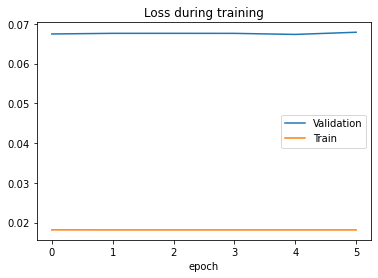

training model lstm[2] h=128,a=5,l=1
epoch 0 batch 200 loss=0.0176, MTL=0.0191, MVL=0.108				
epoch 0 batch 400 loss=0.0178, MTL=0.0184, MVL=0.108				
saving model MTL=0.018302143035202736, MVL=0.0642003798093952
*epoch 1 batch 600 loss=0.0153, MTL=0.0158, MVL=0.0642				
*epoch 1 batch 800 loss=0.0123, MTL=0.0151, MVL=0.0642				
saving model MTL=0.014937482184921897, MVL=0.06244927088989586
*epoch 2 batch 1000 loss=0.0133, MTL=0.0133, MVL=0.0624				
*epoch 2 batch 1200 loss=0.0109, MTL=0.0129, MVL=0.0624				
epoch 3 batch 1400 loss=0.0115, MTL=0.0116, MVL=0.0625				
epoch 3 batch 1600 loss=0.0103, MTL=0.0112, MVL=0.0625				
saving model MTL=0.011009944159769847, MVL=0.061534977044726984
*epoch 4 batch 1800 loss=0.0107, MTL=0.0102, MVL=0.0615				
*epoch 4 batch 2000 loss=0.00941, MTL=0.0101, MVL=0.0615				
saving model MTL=0.009920362553045188, MVL=0.057675361816511776
*epoch 5 batch 2200 loss=0.00959, MTL=0.00939, MVL=0.0577				
*epoch 5 batch 2400 loss=0.00903, MTL=0.00945, MVL=0.0577

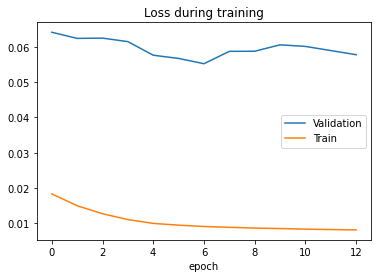

epoch 0 batch 200 loss=0.00776, MTL=0.0084, MVL=0.0554				
epoch 0 batch 400 loss=0.00845, MTL=0.00836, MVL=0.0554				
epoch 1 batch 600 loss=0.00803, MTL=0.00826, MVL=0.0596				
epoch 1 batch 800 loss=0.00827, MTL=0.00827, MVL=0.0596				
epoch 2 batch 1000 loss=0.00829, MTL=0.00818, MVL=0.0604				
epoch 2 batch 1200 loss=0.00823, MTL=0.00819, MVL=0.0604				
epoch 3 batch 1400 loss=0.00795, MTL=0.00813, MVL=0.0621				
epoch 3 batch 1600 loss=0.00756, MTL=0.00816, MVL=0.0621				
epoch 4 batch 1800 loss=0.00777, MTL=0.0081, MVL=0.063				
epoch 4 batch 2000 loss=0.00906, MTL=0.00812, MVL=0.063				
epoch 5 batch 2200 loss=0.0082, MTL=0.00806, MVL=0.0648				
epoch 5 batch 2400 loss=0.00802, MTL=0.00805, MVL=0.0648				


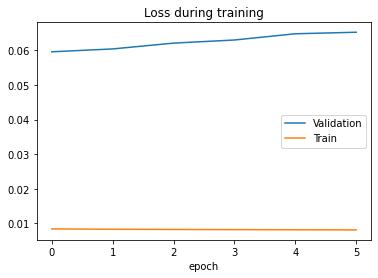

epoch 0 batch 200 loss=0.00879, MTL=0.0085, MVL=0.0553				
epoch 0 batch 400 loss=0.00814, MTL=0.00843, MVL=0.0553				
epoch 1 batch 600 loss=0.00786, MTL=0.00835, MVL=0.0576				
epoch 1 batch 800 loss=0.00823, MTL=0.00834, MVL=0.0576				
epoch 2 batch 1000 loss=0.00882, MTL=0.00829, MVL=0.058				
epoch 2 batch 1200 loss=0.00845, MTL=0.00831, MVL=0.058				
epoch 3 batch 1400 loss=0.00825, MTL=0.00827, MVL=0.0587				
epoch 3 batch 1600 loss=0.008, MTL=0.0083, MVL=0.0587				
epoch 4 batch 1800 loss=0.00884, MTL=0.00829, MVL=0.0589				
epoch 4 batch 2000 loss=0.00812, MTL=0.00827, MVL=0.0589				
epoch 5 batch 2200 loss=0.00834, MTL=0.00826, MVL=0.0595				
epoch 5 batch 2400 loss=0.00802, MTL=0.00823, MVL=0.0595				


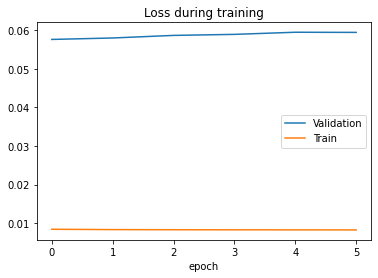

training model lstm[2] h=128,a=5,l=2
epoch 0 batch 200 loss=0.0209, MTL=0.0189, MVL=0.0809				
epoch 0 batch 400 loss=0.0165, MTL=0.0186, MVL=0.0809				
saving model MTL=0.01858135029097146, MVL=0.06872129867799946
*epoch 1 batch 600 loss=0.0182, MTL=0.0182, MVL=0.0687				
*epoch 1 batch 800 loss=0.0169, MTL=0.0177, MVL=0.0687				
saving model MTL=0.017532380568788454, MVL=0.06547604989810069
*epoch 2 batch 1000 loss=0.0169, MTL=0.0161, MVL=0.0655				
*epoch 2 batch 1200 loss=0.0156, MTL=0.0161, MVL=0.0655				
saving model MTL=0.016121566291322057, MVL=0.0654570967203281
*epoch 3 batch 1400 loss=0.0166, MTL=0.016, MVL=0.0655				
*epoch 3 batch 1600 loss=0.0172, MTL=0.016, MVL=0.0655				
epoch 4 batch 1800 loss=0.0169, MTL=0.016, MVL=0.0671				
epoch 4 batch 2000 loss=0.017, MTL=0.0159, MVL=0.0671				
saving model MTL=0.015809204377767394, MVL=0.06470350286022561
*epoch 5 batch 2200 loss=0.0147, MTL=0.0154, MVL=0.0647				
*epoch 5 batch 2400 loss=0.0158, MTL=0.0153, MVL=0.0647				
savin

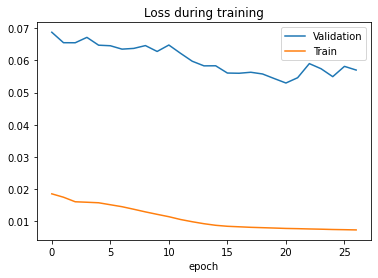

epoch 0 batch 200 loss=0.00728, MTL=0.00743, MVL=0.0529				
epoch 0 batch 400 loss=0.00759, MTL=0.00741, MVL=0.0529				
epoch 1 batch 600 loss=0.00713, MTL=0.00739, MVL=0.0553				
epoch 1 batch 800 loss=0.00722, MTL=0.00736, MVL=0.0553				
epoch 2 batch 1000 loss=0.00708, MTL=0.00731, MVL=0.0561				
epoch 2 batch 1200 loss=0.00683, MTL=0.00733, MVL=0.0561				
epoch 3 batch 1400 loss=0.00714, MTL=0.00734, MVL=0.0566				
epoch 3 batch 1600 loss=0.00772, MTL=0.0073, MVL=0.0566				
epoch 4 batch 1800 loss=0.00709, MTL=0.00726, MVL=0.056				
epoch 4 batch 2000 loss=0.0077, MTL=0.00731, MVL=0.056				
epoch 5 batch 2200 loss=0.00745, MTL=0.00732, MVL=0.0566				
epoch 5 batch 2400 loss=0.00784, MTL=0.00729, MVL=0.0566				


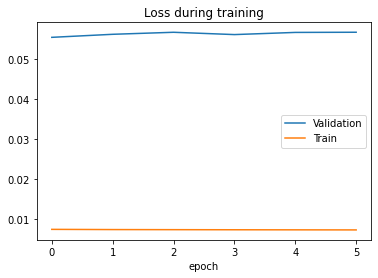

epoch 0 batch 200 loss=0.0071, MTL=0.00753, MVL=0.053				
epoch 0 batch 400 loss=0.007, MTL=0.00748, MVL=0.053				
epoch 1 batch 600 loss=0.00781, MTL=0.0074, MVL=0.054				
epoch 1 batch 800 loss=0.00721, MTL=0.00739, MVL=0.054				
epoch 2 batch 1000 loss=0.00721, MTL=0.00739, MVL=0.0545				
epoch 2 batch 1200 loss=0.00721, MTL=0.00738, MVL=0.0545				
epoch 3 batch 1400 loss=0.0075, MTL=0.00735, MVL=0.0547				
epoch 3 batch 1600 loss=0.00734, MTL=0.00737, MVL=0.0547				
epoch 4 batch 1800 loss=0.00733, MTL=0.00731, MVL=0.0549				
epoch 4 batch 2000 loss=0.00736, MTL=0.00736, MVL=0.0549				
epoch 5 batch 2200 loss=0.00749, MTL=0.00725, MVL=0.0551				
epoch 5 batch 2400 loss=0.00744, MTL=0.00732, MVL=0.0551				


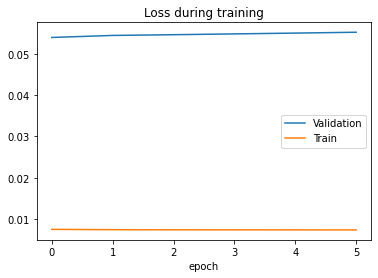

training model lstm[2] h=128,a=5,l=3
epoch 0 batch 200 loss=0.0196, MTL=0.019, MVL=0.101				
epoch 0 batch 400 loss=0.0183, MTL=0.0186, MVL=0.101				
saving model MTL=0.018632919869577085, MVL=0.06693963541603479
*epoch 1 batch 600 loss=0.0186, MTL=0.0183, MVL=0.0669				
*epoch 1 batch 800 loss=0.0188, MTL=0.0183, MVL=0.0669				
epoch 2 batch 1000 loss=0.019, MTL=0.0181, MVL=0.067				
epoch 2 batch 1200 loss=0.0176, MTL=0.0183, MVL=0.067				
epoch 3 batch 1400 loss=0.0165, MTL=0.0184, MVL=0.0681				
epoch 3 batch 1600 loss=0.0191, MTL=0.0182, MVL=0.0681				
epoch 4 batch 1800 loss=0.0187, MTL=0.0185, MVL=0.0687				
epoch 4 batch 2000 loss=0.0171, MTL=0.0182, MVL=0.0687				
epoch 5 batch 2200 loss=0.0175, MTL=0.0181, MVL=0.0671				
epoch 5 batch 2400 loss=0.0181, MTL=0.0183, MVL=0.0671				
epoch 6 batch 2600 loss=0.0194, MTL=0.0195, MVL=0.067				
epoch 6 batch 2800 loss=0.0183, MTL=0.0182, MVL=0.067				
epoch 6 batch 3000 loss=0.0171, MTL=0.0182, MVL=0.067				


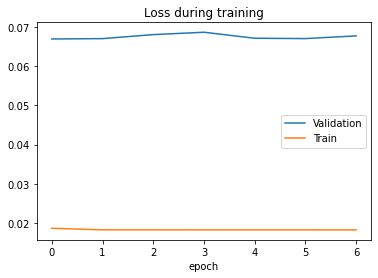

epoch 0 batch 200 loss=0.0176, MTL=0.0181, MVL=0.067				
epoch 0 batch 400 loss=0.0172, MTL=0.0182, MVL=0.067				
epoch 1 batch 600 loss=0.0205, MTL=0.0181, MVL=0.0673				
epoch 1 batch 800 loss=0.0175, MTL=0.0182, MVL=0.0673				
epoch 2 batch 1000 loss=0.017, MTL=0.0181, MVL=0.0675				
epoch 2 batch 1200 loss=0.0192, MTL=0.0181, MVL=0.0675				
epoch 3 batch 1400 loss=0.0186, MTL=0.0182, MVL=0.0681				
epoch 3 batch 1600 loss=0.0197, MTL=0.0183, MVL=0.0681				
epoch 4 batch 1800 loss=0.0188, MTL=0.0182, MVL=0.068				
epoch 4 batch 2000 loss=0.0178, MTL=0.0182, MVL=0.068				
epoch 5 batch 2200 loss=0.0183, MTL=0.0184, MVL=0.0675				
epoch 5 batch 2400 loss=0.0181, MTL=0.0182, MVL=0.0675				


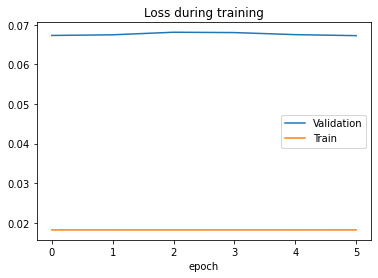

epoch 0 batch 200 loss=0.0161, MTL=0.0182, MVL=0.067				
epoch 0 batch 400 loss=0.018, MTL=0.0182, MVL=0.067				
epoch 1 batch 600 loss=0.0173, MTL=0.0181, MVL=0.0676				
epoch 1 batch 800 loss=0.0201, MTL=0.0181, MVL=0.0676				
epoch 2 batch 1000 loss=0.0184, MTL=0.0183, MVL=0.0676				
epoch 2 batch 1200 loss=0.0184, MTL=0.0182, MVL=0.0676				
epoch 3 batch 1400 loss=0.0182, MTL=0.0183, MVL=0.0677				
epoch 3 batch 1600 loss=0.0189, MTL=0.0181, MVL=0.0677				
epoch 4 batch 1800 loss=0.0169, MTL=0.0182, MVL=0.0677				
epoch 4 batch 2000 loss=0.0196, MTL=0.0182, MVL=0.0677				
epoch 5 batch 2200 loss=0.0171, MTL=0.0182, MVL=0.0675				
epoch 5 batch 2400 loss=0.0169, MTL=0.0182, MVL=0.0675				


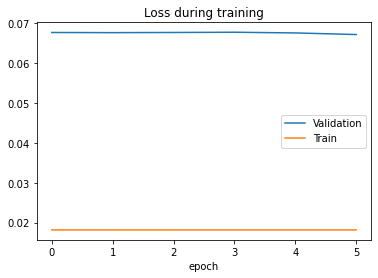

training model lstm[3] h=32,a=5,l=1
epoch 0 batch 200 loss=0.0175, MTL=0.0286, MVL=0.212				
epoch 0 batch 400 loss=0.0183, MTL=0.0234, MVL=0.212				
saving model MTL=0.023038650361722115, MVL=0.06728418507292623
*epoch 1 batch 600 loss=0.018, MTL=0.0182, MVL=0.0673				
*epoch 1 batch 800 loss=0.0196, MTL=0.018, MVL=0.0673				
saving model MTL=0.0179668941575922, MVL=0.06493505780569843
*epoch 2 batch 1000 loss=0.0162, MTL=0.0175, MVL=0.0649				
*epoch 2 batch 1200 loss=0.0182, MTL=0.0173, MVL=0.0649				
saving model MTL=0.017145216753211637, MVL=0.06298077399613428
*epoch 3 batch 1400 loss=0.0164, MTL=0.0163, MVL=0.063				
*epoch 3 batch 1600 loss=0.016, MTL=0.0159, MVL=0.063				
epoch 4 batch 1800 loss=0.0136, MTL=0.0153, MVL=0.0674				
epoch 4 batch 2000 loss=0.0144, MTL=0.0149, MVL=0.0674				
saving model MTL=0.014748135695608192, MVL=0.06261186771949784
*epoch 5 batch 2200 loss=0.0145, MTL=0.0144, MVL=0.0626				
*epoch 5 batch 2400 loss=0.0132, MTL=0.0142, MVL=0.0626				
epoch 6 b

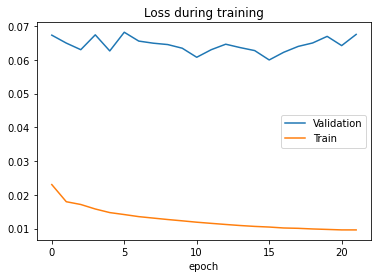

epoch 0 batch 200 loss=0.0105, MTL=0.01, MVL=0.0601				
epoch 0 batch 400 loss=0.00983, MTL=0.00993, MVL=0.0601				
epoch 1 batch 600 loss=0.00998, MTL=0.00988, MVL=0.065				
epoch 1 batch 800 loss=0.0104, MTL=0.00987, MVL=0.065				
epoch 2 batch 1000 loss=0.00916, MTL=0.00984, MVL=0.0662				
epoch 2 batch 1200 loss=0.00992, MTL=0.00981, MVL=0.0662				
epoch 3 batch 1400 loss=0.00989, MTL=0.00986, MVL=0.0653				
epoch 3 batch 1600 loss=0.0107, MTL=0.00978, MVL=0.0653				
epoch 4 batch 1800 loss=0.00975, MTL=0.00976, MVL=0.0657				
epoch 4 batch 2000 loss=0.00975, MTL=0.00976, MVL=0.0657				
epoch 5 batch 2200 loss=0.00984, MTL=0.00974, MVL=0.0678				
epoch 5 batch 2400 loss=0.00966, MTL=0.00976, MVL=0.0678				


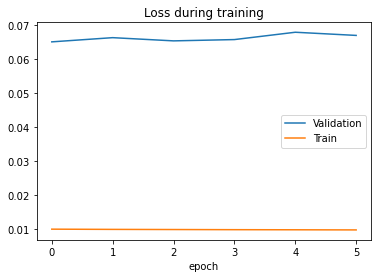

epoch 0 batch 200 loss=0.0099, MTL=0.01, MVL=0.06				
epoch 0 batch 400 loss=0.01, MTL=0.00998, MVL=0.06				
epoch 1 batch 600 loss=0.00946, MTL=0.00992, MVL=0.0634				
epoch 1 batch 800 loss=0.00936, MTL=0.00993, MVL=0.0634				
epoch 2 batch 1000 loss=0.0103, MTL=0.00989, MVL=0.0633				
epoch 2 batch 1200 loss=0.00873, MTL=0.00988, MVL=0.0633				
epoch 3 batch 1400 loss=0.0102, MTL=0.00987, MVL=0.0636				
epoch 3 batch 1600 loss=0.00981, MTL=0.00986, MVL=0.0636				
epoch 4 batch 1800 loss=0.00955, MTL=0.0099, MVL=0.0638				
epoch 4 batch 2000 loss=0.00998, MTL=0.0099, MVL=0.0638				
epoch 5 batch 2200 loss=0.00984, MTL=0.00994, MVL=0.0643				
epoch 5 batch 2400 loss=0.0102, MTL=0.00985, MVL=0.0643				


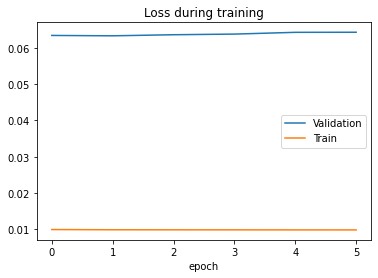

training model lstm[3] h=32,a=5,l=2
epoch 0 batch 200 loss=0.016, MTL=0.03, MVL=0.211				
epoch 0 batch 400 loss=0.0194, MTL=0.0241, MVL=0.211				
saving model MTL=0.023610847384838804, MVL=0.0678185449882609
*epoch 1 batch 600 loss=0.0197, MTL=0.0183, MVL=0.0678				
*epoch 1 batch 800 loss=0.0173, MTL=0.0182, MVL=0.0678				
saving model MTL=0.018222257645486684, MVL=0.06760157986742552
*epoch 2 batch 1000 loss=0.0184, MTL=0.0181, MVL=0.0676				
*epoch 2 batch 1200 loss=0.0172, MTL=0.0179, MVL=0.0676				
saving model MTL=0.017638200128291825, MVL=0.06524720372723751
*epoch 3 batch 1400 loss=0.0174, MTL=0.0165, MVL=0.0652				
*epoch 3 batch 1600 loss=0.0159, MTL=0.0163, MVL=0.0652				
epoch 4 batch 1800 loss=0.0143, MTL=0.0161, MVL=0.0672				
epoch 4 batch 2000 loss=0.0168, MTL=0.0161, MVL=0.0672				
saving model MTL=0.01607011812663794, MVL=0.06493828415137823
*epoch 5 batch 2200 loss=0.0169, MTL=0.0161, MVL=0.0649				
*epoch 5 batch 2400 loss=0.0155, MTL=0.016, MVL=0.0649				
epoch 6 

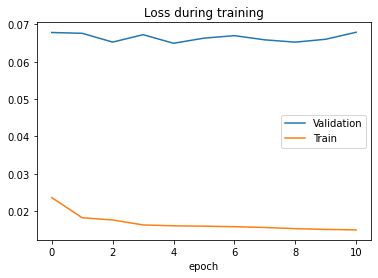

epoch 0 batch 200 loss=0.0165, MTL=0.0159, MVL=0.0649				
epoch 0 batch 400 loss=0.0165, MTL=0.0158, MVL=0.0649				
epoch 1 batch 600 loss=0.0158, MTL=0.0158, MVL=0.0665				
epoch 1 batch 800 loss=0.0168, MTL=0.0158, MVL=0.0665				
epoch 2 batch 1000 loss=0.0166, MTL=0.0158, MVL=0.0669				
epoch 2 batch 1200 loss=0.0167, MTL=0.0159, MVL=0.0669				
epoch 3 batch 1400 loss=0.0151, MTL=0.0157, MVL=0.0661				
epoch 3 batch 1600 loss=0.0154, MTL=0.0157, MVL=0.0661				
epoch 4 batch 1800 loss=0.0169, MTL=0.0158, MVL=0.0659				
epoch 4 batch 2000 loss=0.0151, MTL=0.0157, MVL=0.0659				
epoch 5 batch 2200 loss=0.0164, MTL=0.0159, MVL=0.0666				
epoch 5 batch 2400 loss=0.0153, MTL=0.0158, MVL=0.0666				


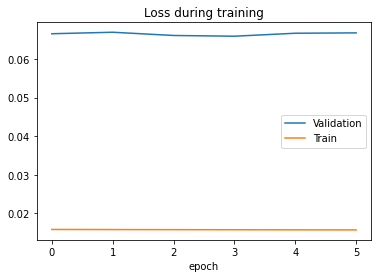

epoch 0 batch 200 loss=0.0161, MTL=0.0159, MVL=0.0651				
epoch 0 batch 400 loss=0.0161, MTL=0.0159, MVL=0.0651				
epoch 1 batch 600 loss=0.0168, MTL=0.0159, MVL=0.0659				
epoch 1 batch 800 loss=0.0163, MTL=0.0158, MVL=0.0659				
epoch 2 batch 1000 loss=0.0136, MTL=0.0158, MVL=0.0661				
epoch 2 batch 1200 loss=0.0151, MTL=0.0158, MVL=0.0661				
epoch 3 batch 1400 loss=0.0171, MTL=0.0159, MVL=0.0661				
epoch 3 batch 1600 loss=0.0143, MTL=0.0158, MVL=0.0661				
epoch 4 batch 1800 loss=0.0144, MTL=0.0158, MVL=0.066				
epoch 4 batch 2000 loss=0.0175, MTL=0.0158, MVL=0.066				
epoch 5 batch 2200 loss=0.0158, MTL=0.0159, MVL=0.0662				
epoch 5 batch 2400 loss=0.0153, MTL=0.0158, MVL=0.0662				


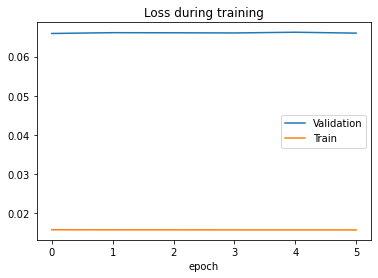

training model lstm[3] h=32,a=5,l=3
epoch 0 batch 200 loss=0.0181, MTL=0.0267, MVL=0.167				
epoch 0 batch 400 loss=0.0198, MTL=0.0224, MVL=0.167				
saving model MTL=0.022113738757908757, MVL=0.06743625459856674
*epoch 1 batch 600 loss=0.0199, MTL=0.0182, MVL=0.0674				
*epoch 1 batch 800 loss=0.0184, MTL=0.0182, MVL=0.0674				
epoch 2 batch 1000 loss=0.0172, MTL=0.0183, MVL=0.0676				
epoch 2 batch 1200 loss=0.0191, MTL=0.0182, MVL=0.0676				
epoch 3 batch 1400 loss=0.0185, MTL=0.0181, MVL=0.0682				
epoch 3 batch 1600 loss=0.0207, MTL=0.0183, MVL=0.0682				
epoch 4 batch 1800 loss=0.0182, MTL=0.0183, MVL=0.0676				
epoch 4 batch 2000 loss=0.0176, MTL=0.0182, MVL=0.0676				
saving model MTL=0.0182275897640451, MVL=0.06683778353646154
*epoch 5 batch 2200 loss=0.0167, MTL=0.0185, MVL=0.0668				
*epoch 5 batch 2400 loss=0.0171, MTL=0.0183, MVL=0.0668				
epoch 6 batch 2600 loss=0.0161, MTL=0.0172, MVL=0.0669				
epoch 6 batch 2800 loss=0.0168, MTL=0.0182, MVL=0.0669				
epoch 6 batch 30

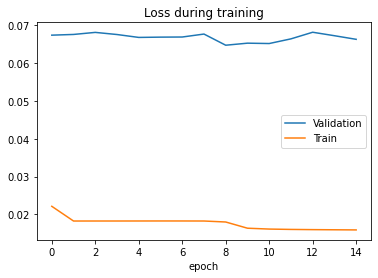

epoch 0 batch 200 loss=0.0162, MTL=0.0165, MVL=0.0644				
epoch 0 batch 400 loss=0.0152, MTL=0.0164, MVL=0.0644				
epoch 1 batch 600 loss=0.0173, MTL=0.0162, MVL=0.0664				
epoch 1 batch 800 loss=0.0165, MTL=0.0162, MVL=0.0664				
epoch 2 batch 1000 loss=0.0158, MTL=0.0161, MVL=0.066				
epoch 2 batch 1200 loss=0.0179, MTL=0.0161, MVL=0.066				
epoch 3 batch 1400 loss=0.0168, MTL=0.0161, MVL=0.0661				
epoch 3 batch 1600 loss=0.0157, MTL=0.0161, MVL=0.0661				
epoch 4 batch 1800 loss=0.0156, MTL=0.016, MVL=0.0664				
epoch 4 batch 2000 loss=0.015, MTL=0.016, MVL=0.0664				
epoch 5 batch 2200 loss=0.0157, MTL=0.0158, MVL=0.0665				
epoch 5 batch 2400 loss=0.015, MTL=0.016, MVL=0.0665				


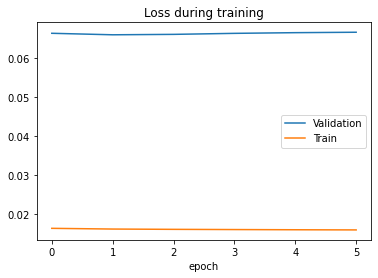

epoch 0 batch 200 loss=0.016, MTL=0.0168, MVL=0.0647				
epoch 0 batch 400 loss=0.0162, MTL=0.0167, MVL=0.0647				
epoch 1 batch 600 loss=0.016, MTL=0.0164, MVL=0.0661				
epoch 1 batch 800 loss=0.0158, MTL=0.0165, MVL=0.0661				
epoch 2 batch 1000 loss=0.0178, MTL=0.0165, MVL=0.0661				
epoch 2 batch 1200 loss=0.0167, MTL=0.0164, MVL=0.0661				
epoch 3 batch 1400 loss=0.0153, MTL=0.0162, MVL=0.0661				
epoch 3 batch 1600 loss=0.016, MTL=0.0163, MVL=0.0661				
epoch 4 batch 1800 loss=0.0162, MTL=0.0164, MVL=0.0668				
epoch 4 batch 2000 loss=0.0154, MTL=0.0164, MVL=0.0668				
epoch 5 batch 2200 loss=0.0161, MTL=0.0163, MVL=0.0664				
epoch 5 batch 2400 loss=0.0142, MTL=0.0163, MVL=0.0664				


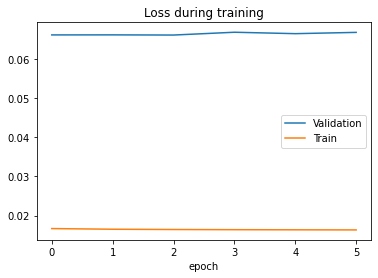

training model lstm[3] h=64,a=5,l=1
epoch 0 batch 200 loss=0.0194, MTL=0.0195, MVL=0.125				
epoch 0 batch 400 loss=0.0191, MTL=0.0187, MVL=0.125				
saving model MTL=0.018632703452149523, MVL=0.06489507628024602
*epoch 1 batch 600 loss=0.0186, MTL=0.0172, MVL=0.0649				
*epoch 1 batch 800 loss=0.0138, MTL=0.0166, MVL=0.0649				
saving model MTL=0.016379178609208615, MVL=0.06257083749429124
*epoch 2 batch 1000 loss=0.0154, MTL=0.0149, MVL=0.0626				
*epoch 2 batch 1200 loss=0.0145, MTL=0.0146, MVL=0.0626				
saving model MTL=0.014456514998255234, MVL=0.05896049371508301
*epoch 3 batch 1400 loss=0.0135, MTL=0.0137, MVL=0.059				
*epoch 3 batch 1600 loss=0.013, MTL=0.0135, MVL=0.059				
saving model MTL=0.013343643283097215, MVL=0.05845714574221705
*epoch 4 batch 1800 loss=0.0127, MTL=0.0129, MVL=0.0585				
*epoch 4 batch 2000 loss=0.0123, MTL=0.0124, MVL=0.0585				
epoch 5 batch 2200 loss=0.0103, MTL=0.0116, MVL=0.0649				
epoch 5 batch 2400 loss=0.0104, MTL=0.0114, MVL=0.0649				
epoch

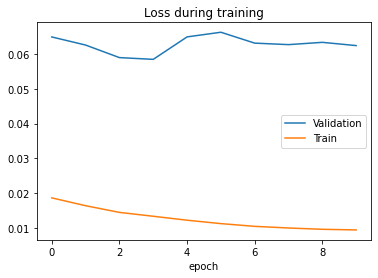

epoch 0 batch 200 loss=0.0121, MTL=0.0121, MVL=0.0584				
epoch 0 batch 400 loss=0.0113, MTL=0.0121, MVL=0.0584				
epoch 1 batch 600 loss=0.0106, MTL=0.0118, MVL=0.0639				
epoch 1 batch 800 loss=0.0121, MTL=0.0117, MVL=0.0639				
epoch 2 batch 1000 loss=0.0118, MTL=0.0116, MVL=0.0662				
epoch 2 batch 1200 loss=0.0113, MTL=0.0115, MVL=0.0662				
epoch 3 batch 1400 loss=0.0118, MTL=0.0114, MVL=0.067				
epoch 3 batch 1600 loss=0.0106, MTL=0.0113, MVL=0.067				
epoch 4 batch 1800 loss=0.0116, MTL=0.0111, MVL=0.0678				
epoch 4 batch 2000 loss=0.0107, MTL=0.0111, MVL=0.0678				
epoch 5 batch 2200 loss=0.0105, MTL=0.011, MVL=0.0668				
epoch 5 batch 2400 loss=0.0105, MTL=0.0109, MVL=0.0668				


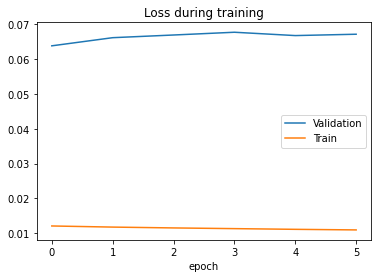

epoch 0 batch 200 loss=0.0128, MTL=0.0123, MVL=0.0584				
epoch 0 batch 400 loss=0.0108, MTL=0.0122, MVL=0.0584				
epoch 1 batch 600 loss=0.011, MTL=0.0121, MVL=0.0626				
epoch 1 batch 800 loss=0.0116, MTL=0.0121, MVL=0.0626				
epoch 2 batch 1000 loss=0.0122, MTL=0.0121, MVL=0.0628				
epoch 2 batch 1200 loss=0.0125, MTL=0.0121, MVL=0.0628				
epoch 3 batch 1400 loss=0.0126, MTL=0.012, MVL=0.063				
epoch 3 batch 1600 loss=0.0106, MTL=0.012, MVL=0.063				
epoch 4 batch 1800 loss=0.0117, MTL=0.012, MVL=0.0644				
epoch 4 batch 2000 loss=0.0118, MTL=0.012, MVL=0.0644				
epoch 5 batch 2200 loss=0.0121, MTL=0.0119, MVL=0.0641				
epoch 5 batch 2400 loss=0.0132, MTL=0.0119, MVL=0.0641				


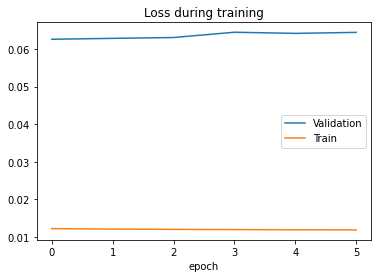

training model lstm[3] h=64,a=5,l=2
epoch 0 batch 200 loss=0.0171, MTL=0.02, MVL=0.113				
epoch 0 batch 400 loss=0.0176, MTL=0.0191, MVL=0.113				
saving model MTL=0.018990069705192816, MVL=0.0666992620977222
*epoch 1 batch 600 loss=0.0175, MTL=0.0183, MVL=0.0667				
*epoch 1 batch 800 loss=0.0186, MTL=0.0182, MVL=0.0667				
epoch 2 batch 1000 loss=0.0165, MTL=0.0172, MVL=0.0668				
epoch 2 batch 1200 loss=0.0169, MTL=0.0168, MVL=0.0668				
saving model MTL=0.016648107105070257, MVL=0.06576697552790407
*epoch 3 batch 1400 loss=0.0161, MTL=0.016, MVL=0.0658				
*epoch 3 batch 1600 loss=0.0169, MTL=0.0161, MVL=0.0658				
saving model MTL=0.016070377423619425, MVL=0.06443173810839653
*epoch 4 batch 1800 loss=0.0158, MTL=0.016, MVL=0.0644				
*epoch 4 batch 2000 loss=0.0175, MTL=0.0159, MVL=0.0644				
epoch 5 batch 2200 loss=0.0166, MTL=0.0156, MVL=0.0645				
epoch 5 batch 2400 loss=0.0152, MTL=0.0155, MVL=0.0645				
epoch 6 batch 2600 loss=0.0149, MTL=0.0152, MVL=0.0668				
epoch 6 batch

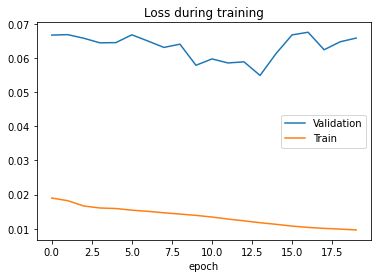

epoch 0 batch 200 loss=0.011, MTL=0.0111, MVL=0.0548				
epoch 0 batch 400 loss=0.0114, MTL=0.0111, MVL=0.0548				
epoch 1 batch 600 loss=0.0103, MTL=0.011, MVL=0.0605				
epoch 1 batch 800 loss=0.0116, MTL=0.011, MVL=0.0605				
epoch 2 batch 1000 loss=0.0117, MTL=0.0109, MVL=0.062				
epoch 2 batch 1200 loss=0.0104, MTL=0.0109, MVL=0.062				
epoch 3 batch 1400 loss=0.0113, MTL=0.0109, MVL=0.0614				
epoch 3 batch 1600 loss=0.0109, MTL=0.0109, MVL=0.0614				
epoch 4 batch 1800 loss=0.0103, MTL=0.0108, MVL=0.0617				
epoch 4 batch 2000 loss=0.0108, MTL=0.0108, MVL=0.0617				
epoch 5 batch 2200 loss=0.0106, MTL=0.0107, MVL=0.0626				
epoch 5 batch 2400 loss=0.0106, MTL=0.0107, MVL=0.0626				


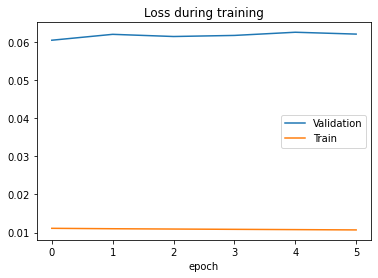

epoch 0 batch 200 loss=0.0113, MTL=0.0112, MVL=0.055				
epoch 0 batch 400 loss=0.011, MTL=0.0112, MVL=0.055				
epoch 1 batch 600 loss=0.01, MTL=0.0111, MVL=0.0589				
epoch 1 batch 800 loss=0.0111, MTL=0.0111, MVL=0.0589				
epoch 2 batch 1000 loss=0.0118, MTL=0.0111, MVL=0.0595				
epoch 2 batch 1200 loss=0.0121, MTL=0.0111, MVL=0.0595				
epoch 3 batch 1400 loss=0.01, MTL=0.011, MVL=0.0602				
epoch 3 batch 1600 loss=0.0111, MTL=0.0111, MVL=0.0602				
epoch 4 batch 1800 loss=0.0114, MTL=0.011, MVL=0.0607				
epoch 4 batch 2000 loss=0.0112, MTL=0.011, MVL=0.0607				
epoch 5 batch 2200 loss=0.0112, MTL=0.0111, MVL=0.0606				
epoch 5 batch 2400 loss=0.0116, MTL=0.0111, MVL=0.0606				


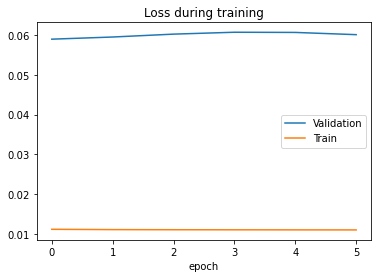

training model lstm[3] h=64,a=5,l=3
epoch 0 batch 200 loss=0.0188, MTL=0.0205, MVL=0.114				
epoch 0 batch 400 loss=0.0191, MTL=0.0194, MVL=0.114				
saving model MTL=0.01928537168193772, MVL=0.06792435898888306
*epoch 1 batch 600 loss=0.0178, MTL=0.0182, MVL=0.0679				
*epoch 1 batch 800 loss=0.0152, MTL=0.0182, MVL=0.0679				
epoch 2 batch 1000 loss=0.0157, MTL=0.0182, MVL=0.0684				
epoch 2 batch 1200 loss=0.0177, MTL=0.0182, MVL=0.0684				
saving model MTL=0.018236310509470124, MVL=0.06733582071104988
*epoch 3 batch 1400 loss=0.0172, MTL=0.0184, MVL=0.0673				
*epoch 3 batch 1600 loss=0.0174, MTL=0.0183, MVL=0.0673				
epoch 4 batch 1800 loss=0.0187, MTL=0.0183, MVL=0.0681				
epoch 4 batch 2000 loss=0.0194, MTL=0.0183, MVL=0.0681				
saving model MTL=0.01822534816954758, MVL=0.06720021018972162
*epoch 5 batch 2200 loss=0.018, MTL=0.0186, MVL=0.0672				
*epoch 5 batch 2400 loss=0.0177, MTL=0.0183, MVL=0.0672				
epoch 6 batch 2600 loss=0.0203, MTL=0.0194, MVL=0.0681				
epoch 6 bat

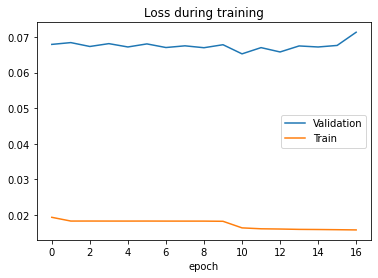

epoch 0 batch 200 loss=0.0159, MTL=0.016, MVL=0.0653				
epoch 0 batch 400 loss=0.0161, MTL=0.0159, MVL=0.0653				
epoch 1 batch 600 loss=0.0165, MTL=0.0159, MVL=0.0656				
epoch 1 batch 800 loss=0.0151, MTL=0.0159, MVL=0.0656				
epoch 2 batch 1000 loss=0.017, MTL=0.0158, MVL=0.0653				
epoch 2 batch 1200 loss=0.0145, MTL=0.0158, MVL=0.0653				
epoch 3 batch 1400 loss=0.0164, MTL=0.0159, MVL=0.0665				
epoch 3 batch 1600 loss=0.0133, MTL=0.0159, MVL=0.0665				
epoch 4 batch 1800 loss=0.0146, MTL=0.0158, MVL=0.0662				
epoch 4 batch 2000 loss=0.0161, MTL=0.0158, MVL=0.0662				
epoch 5 batch 2200 loss=0.0168, MTL=0.0159, MVL=0.0664				
epoch 5 batch 2400 loss=0.0159, MTL=0.0158, MVL=0.0664				


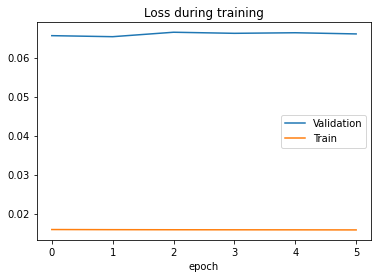

epoch 0 batch 200 loss=0.0153, MTL=0.016, MVL=0.0654				
epoch 0 batch 400 loss=0.0154, MTL=0.016, MVL=0.0654				
epoch 1 batch 600 loss=0.0159, MTL=0.0159, MVL=0.0662				
epoch 1 batch 800 loss=0.0139, MTL=0.0159, MVL=0.0662				
epoch 2 batch 1000 loss=0.0173, MTL=0.016, MVL=0.0655				
epoch 2 batch 1200 loss=0.0161, MTL=0.0159, MVL=0.0655				
epoch 3 batch 1400 loss=0.0158, MTL=0.016, MVL=0.0655				
epoch 3 batch 1600 loss=0.0165, MTL=0.0159, MVL=0.0655				
saving model MTL=0.015900296307497983, MVL=0.06521316794831244
*epoch 4 batch 1800 loss=0.0153, MTL=0.0159, MVL=0.0652				
*epoch 4 batch 2000 loss=0.0157, MTL=0.0159, MVL=0.0652				
epoch 5 batch 2200 loss=0.0164, MTL=0.0158, MVL=0.0656				
epoch 5 batch 2400 loss=0.0155, MTL=0.0159, MVL=0.0656				
epoch 6 batch 2600 loss=0.0161, MTL=0.0161, MVL=0.0657				
epoch 6 batch 2800 loss=0.0147, MTL=0.0159, MVL=0.0657				
epoch 6 batch 3000 loss=0.0162, MTL=0.0159, MVL=0.0657				
epoch 7 batch 3200 loss=0.0162, MTL=0.016, MVL=0.0659				


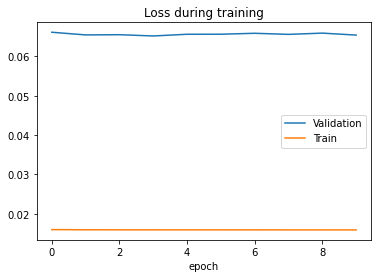

training model lstm[3] h=128,a=5,l=1
epoch 0 batch 200 loss=0.0165, MTL=0.0186, MVL=0.0829				
epoch 0 batch 400 loss=0.0166, MTL=0.0178, MVL=0.0829				
saving model MTL=0.017617238805936887, MVL=0.0629339198597142
*epoch 1 batch 600 loss=0.0163, MTL=0.0151, MVL=0.0629				
*epoch 1 batch 800 loss=0.0134, MTL=0.0145, MVL=0.0629				
saving model MTL=0.014344693262637626, MVL=0.05654029902376113
*epoch 2 batch 1000 loss=0.0122, MTL=0.0123, MVL=0.0565				
*epoch 2 batch 1200 loss=0.0112, MTL=0.0119, MVL=0.0565				
epoch 3 batch 1400 loss=0.0104, MTL=0.0105, MVL=0.0577				
epoch 3 batch 1600 loss=0.00978, MTL=0.0102, MVL=0.0577				
epoch 4 batch 1800 loss=0.0101, MTL=0.00951, MVL=0.0578				
epoch 4 batch 2000 loss=0.00925, MTL=0.0095, MVL=0.0578				
saving model MTL=0.009418343260505734, MVL=0.052918747433873474
*epoch 5 batch 2200 loss=0.00822, MTL=0.00898, MVL=0.0529				
*epoch 5 batch 2400 loss=0.01, MTL=0.00902, MVL=0.0529				
epoch 6 batch 2600 loss=0.00824, MTL=0.00834, MVL=0.0544				

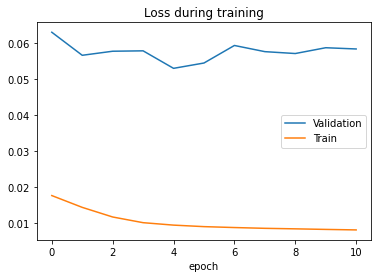

epoch 0 batch 200 loss=0.00856, MTL=0.00857, MVL=0.0527				
epoch 0 batch 400 loss=0.00863, MTL=0.00852, MVL=0.0527				
epoch 1 batch 600 loss=0.00832, MTL=0.00841, MVL=0.0573				
epoch 1 batch 800 loss=0.00792, MTL=0.0084, MVL=0.0573				
epoch 2 batch 1000 loss=0.00862, MTL=0.00836, MVL=0.0581				
epoch 2 batch 1200 loss=0.0084, MTL=0.00832, MVL=0.0581				
epoch 3 batch 1400 loss=0.0084, MTL=0.00823, MVL=0.0599				
epoch 3 batch 1600 loss=0.00834, MTL=0.00826, MVL=0.0599				
epoch 4 batch 1800 loss=0.0084, MTL=0.00817, MVL=0.0604				
epoch 4 batch 2000 loss=0.00839, MTL=0.00817, MVL=0.0604				
epoch 5 batch 2200 loss=0.00808, MTL=0.00805, MVL=0.0605				
epoch 5 batch 2400 loss=0.00869, MTL=0.00812, MVL=0.0605				


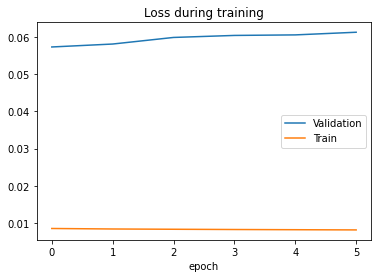

epoch 0 batch 200 loss=0.00895, MTL=0.00867, MVL=0.0527				
epoch 0 batch 400 loss=0.00823, MTL=0.00862, MVL=0.0527				
epoch 1 batch 600 loss=0.00864, MTL=0.00848, MVL=0.0553				
epoch 1 batch 800 loss=0.0086, MTL=0.00849, MVL=0.0553				
epoch 2 batch 1000 loss=0.00829, MTL=0.00847, MVL=0.0562				
epoch 2 batch 1200 loss=0.00872, MTL=0.00846, MVL=0.0562				
epoch 3 batch 1400 loss=0.00868, MTL=0.00847, MVL=0.0565				
epoch 3 batch 1600 loss=0.00882, MTL=0.00845, MVL=0.0565				
epoch 4 batch 1800 loss=0.00829, MTL=0.00845, MVL=0.0566				
epoch 4 batch 2000 loss=0.00833, MTL=0.00843, MVL=0.0566				
epoch 5 batch 2200 loss=0.00918, MTL=0.00845, MVL=0.057				
epoch 5 batch 2400 loss=0.00773, MTL=0.00838, MVL=0.057				


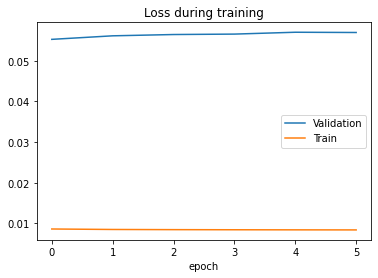

training model lstm[3] h=128,a=5,l=2
epoch 0 batch 200 loss=0.0174, MTL=0.0185, MVL=0.0861				
epoch 0 batch 400 loss=0.0193, MTL=0.0184, MVL=0.0861				
saving model MTL=0.01839403138554055, MVL=0.06822783725916362
*epoch 1 batch 600 loss=0.0177, MTL=0.0181, MVL=0.0682				
*epoch 1 batch 800 loss=0.0171, MTL=0.0174, MVL=0.0682				
saving model MTL=0.01721024130821641, MVL=0.0660635555376772
*epoch 2 batch 1000 loss=0.0163, MTL=0.0161, MVL=0.0661				
*epoch 2 batch 1200 loss=0.0162, MTL=0.0161, MVL=0.0661				
saving model MTL=0.01613251713059378, MVL=0.06481649427384627
*epoch 3 batch 1400 loss=0.0148, MTL=0.016, MVL=0.0648				
*epoch 3 batch 1600 loss=0.0154, MTL=0.016, MVL=0.0648				
epoch 4 batch 1800 loss=0.0153, MTL=0.0157, MVL=0.0681				
epoch 4 batch 2000 loss=0.0149, MTL=0.0155, MVL=0.0681				
saving model MTL=0.015313959499825369, MVL=0.06069936383454526
*epoch 5 batch 2200 loss=0.0138, MTL=0.0147, MVL=0.0607				
*epoch 5 batch 2400 loss=0.015, MTL=0.0146, MVL=0.0607				
epoch 

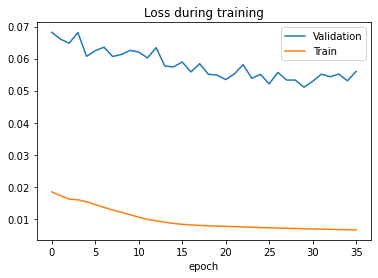

epoch 0 batch 200 loss=0.00647, MTL=0.00655, MVL=0.0508				
epoch 0 batch 400 loss=0.0072, MTL=0.00653, MVL=0.0508				
epoch 1 batch 600 loss=0.00594, MTL=0.00649, MVL=0.0558				
epoch 1 batch 800 loss=0.0058, MTL=0.00648, MVL=0.0558				
epoch 2 batch 1000 loss=0.00595, MTL=0.00645, MVL=0.0562				
epoch 2 batch 1200 loss=0.00644, MTL=0.00646, MVL=0.0562				
epoch 3 batch 1400 loss=0.00619, MTL=0.00644, MVL=0.0557				
epoch 3 batch 1600 loss=0.00645, MTL=0.00645, MVL=0.0557				
epoch 4 batch 1800 loss=0.00646, MTL=0.00642, MVL=0.0562				
epoch 4 batch 2000 loss=0.00661, MTL=0.00643, MVL=0.0562				
epoch 5 batch 2200 loss=0.00654, MTL=0.00643, MVL=0.0565				
epoch 5 batch 2400 loss=0.00623, MTL=0.00642, MVL=0.0565				


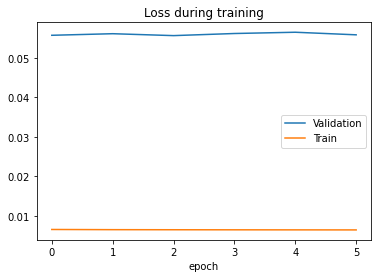

epoch 0 batch 200 loss=0.0067, MTL=0.00668, MVL=0.051				
epoch 0 batch 400 loss=0.00669, MTL=0.0066, MVL=0.051				
epoch 1 batch 600 loss=0.00625, MTL=0.00652, MVL=0.0541				
epoch 1 batch 800 loss=0.00685, MTL=0.00651, MVL=0.0541				
epoch 2 batch 1000 loss=0.00695, MTL=0.00646, MVL=0.055				
epoch 2 batch 1200 loss=0.00626, MTL=0.00649, MVL=0.055				
epoch 3 batch 1400 loss=0.00647, MTL=0.00643, MVL=0.0552				
epoch 3 batch 1600 loss=0.0068, MTL=0.00648, MVL=0.0552				
epoch 4 batch 1800 loss=0.00665, MTL=0.00643, MVL=0.0553				
epoch 4 batch 2000 loss=0.00692, MTL=0.00646, MVL=0.0553				
epoch 5 batch 2200 loss=0.00651, MTL=0.00647, MVL=0.0557				
epoch 5 batch 2400 loss=0.00617, MTL=0.00646, MVL=0.0557				


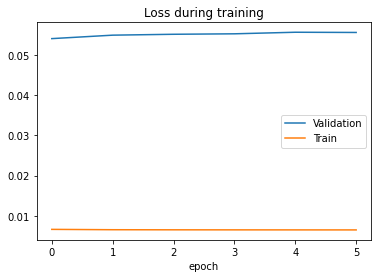

training model lstm[3] h=128,a=5,l=3
epoch 0 batch 200 loss=0.0199, MTL=0.0187, MVL=0.094				
epoch 0 batch 400 loss=0.0173, MTL=0.0184, MVL=0.094				
saving model MTL=0.018464036049282578, MVL=0.06838852148808416
*epoch 1 batch 600 loss=0.0172, MTL=0.0184, MVL=0.0684				
*epoch 1 batch 800 loss=0.0177, MTL=0.0183, MVL=0.0684				
saving model MTL=0.018263270347174815, MVL=0.06824984065577631
*epoch 2 batch 1000 loss=0.0183, MTL=0.0184, MVL=0.0682				
*epoch 2 batch 1200 loss=0.018, MTL=0.0183, MVL=0.0682				
epoch 3 batch 1400 loss=0.02, MTL=0.0185, MVL=0.0684				
epoch 3 batch 1600 loss=0.0169, MTL=0.0183, MVL=0.0684				
epoch 4 batch 1800 loss=0.0194, MTL=0.0182, MVL=0.0683				
epoch 4 batch 2000 loss=0.0177, MTL=0.0183, MVL=0.0683				
epoch 5 batch 2200 loss=0.0168, MTL=0.0179, MVL=0.0686				
epoch 5 batch 2400 loss=0.019, MTL=0.0181, MVL=0.0686				
saving model MTL=0.018215214364729632, MVL=0.06763573632132812
*epoch 6 batch 2600 loss=0.0189, MTL=0.0192, MVL=0.0676				
*epoch 6 bat

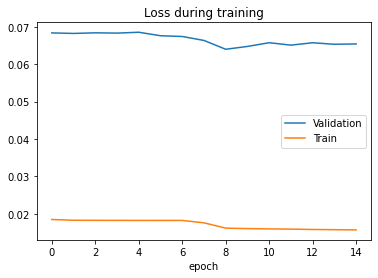

epoch 0 batch 200 loss=0.0158, MTL=0.0159, MVL=0.0641				
epoch 0 batch 400 loss=0.0159, MTL=0.0159, MVL=0.0641				
epoch 1 batch 600 loss=0.0155, MTL=0.0159, MVL=0.0659				
epoch 1 batch 800 loss=0.0148, MTL=0.0158, MVL=0.0659				
epoch 2 batch 1000 loss=0.0161, MTL=0.0159, MVL=0.0649				
epoch 2 batch 1200 loss=0.0158, MTL=0.0159, MVL=0.0649				
epoch 3 batch 1400 loss=0.0157, MTL=0.0159, MVL=0.0656				
epoch 3 batch 1600 loss=0.0167, MTL=0.0158, MVL=0.0656				
epoch 4 batch 1800 loss=0.0159, MTL=0.016, MVL=0.0657				
epoch 4 batch 2000 loss=0.0154, MTL=0.0158, MVL=0.0657				
epoch 5 batch 2200 loss=0.0148, MTL=0.0154, MVL=0.0655				
epoch 5 batch 2400 loss=0.0154, MTL=0.0157, MVL=0.0655				


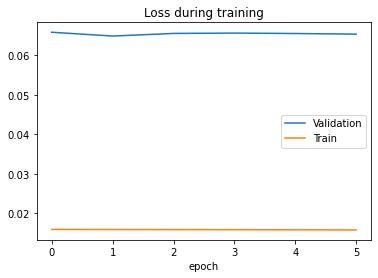

epoch 0 batch 200 loss=0.0146, MTL=0.0159, MVL=0.064				
epoch 0 batch 400 loss=0.0163, MTL=0.0159, MVL=0.064				
epoch 1 batch 600 loss=0.0158, MTL=0.016, MVL=0.065				
epoch 1 batch 800 loss=0.0146, MTL=0.0159, MVL=0.065				
epoch 2 batch 1000 loss=0.0178, MTL=0.0159, MVL=0.0653				
epoch 2 batch 1200 loss=0.0162, MTL=0.0159, MVL=0.0653				
epoch 3 batch 1400 loss=0.0151, MTL=0.0158, MVL=0.0653				
epoch 3 batch 1600 loss=0.0152, MTL=0.0159, MVL=0.0653				
epoch 4 batch 1800 loss=0.017, MTL=0.0158, MVL=0.0655				
epoch 4 batch 2000 loss=0.0172, MTL=0.0158, MVL=0.0655				
epoch 5 batch 2200 loss=0.0149, MTL=0.0158, MVL=0.0655				
epoch 5 batch 2400 loss=0.0166, MTL=0.0158, MVL=0.0655				


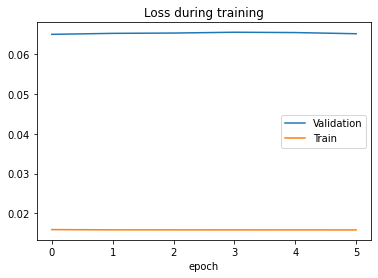

training model lstm[4] h=32,a=5,l=1
epoch 0 batch 200 loss=0.0176, MTL=0.0254, MVL=0.218				
epoch 0 batch 400 loss=0.018, MTL=0.0218, MVL=0.218				
saving model MTL=0.02153856677646312, MVL=0.06822635819677447
*epoch 1 batch 600 loss=0.0195, MTL=0.0181, MVL=0.0682				
*epoch 1 batch 800 loss=0.0199, MTL=0.018, MVL=0.0682				
saving model MTL=0.017975636452488068, MVL=0.06566670274392503
*epoch 2 batch 1000 loss=0.0162, MTL=0.0175, MVL=0.0657				
*epoch 2 batch 1200 loss=0.0188, MTL=0.0174, MVL=0.0657				
saving model MTL=0.017289538330056513, MVL=0.06341887082232804
*epoch 3 batch 1400 loss=0.0176, MTL=0.0165, MVL=0.0634				
*epoch 3 batch 1600 loss=0.0178, MTL=0.0163, MVL=0.0634				
epoch 4 batch 1800 loss=0.0154, MTL=0.0153, MVL=0.0642				
epoch 4 batch 2000 loss=0.0148, MTL=0.0153, MVL=0.0642				
saving model MTL=0.015040305019388573, MVL=0.06001694518767419
*epoch 5 batch 2200 loss=0.015, MTL=0.0147, MVL=0.06				
*epoch 5 batch 2400 loss=0.0142, MTL=0.0143, MVL=0.06				
saving mod

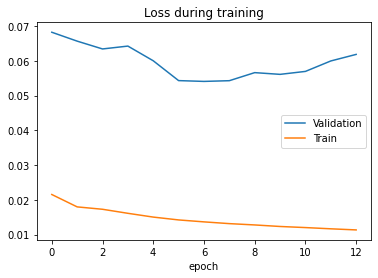

epoch 0 batch 200 loss=0.0135, MTL=0.013, MVL=0.054				
epoch 0 batch 400 loss=0.0136, MTL=0.013, MVL=0.054				
epoch 1 batch 600 loss=0.0132, MTL=0.0129, MVL=0.0554				
epoch 1 batch 800 loss=0.0131, MTL=0.0129, MVL=0.0554				
epoch 2 batch 1000 loss=0.0128, MTL=0.0129, MVL=0.055				
epoch 2 batch 1200 loss=0.0136, MTL=0.0128, MVL=0.055				
epoch 3 batch 1400 loss=0.0133, MTL=0.0128, MVL=0.0559				
epoch 3 batch 1600 loss=0.0128, MTL=0.0128, MVL=0.0559				
epoch 4 batch 1800 loss=0.0122, MTL=0.0127, MVL=0.0557				
epoch 4 batch 2000 loss=0.0136, MTL=0.0126, MVL=0.0557				
epoch 5 batch 2200 loss=0.0113, MTL=0.0125, MVL=0.0562				
epoch 5 batch 2400 loss=0.0126, MTL=0.0126, MVL=0.0562				


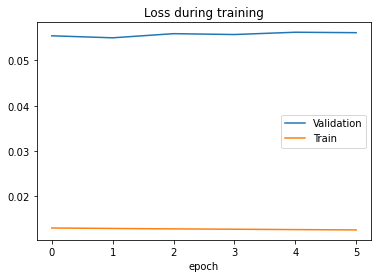

epoch 0 batch 200 loss=0.0139, MTL=0.013, MVL=0.0539				
epoch 0 batch 400 loss=0.0124, MTL=0.013, MVL=0.0539				
epoch 1 batch 600 loss=0.0125, MTL=0.013, MVL=0.0553				
epoch 1 batch 800 loss=0.0135, MTL=0.013, MVL=0.0553				
epoch 2 batch 1000 loss=0.0135, MTL=0.013, MVL=0.0553				
epoch 2 batch 1200 loss=0.0147, MTL=0.013, MVL=0.0553				
epoch 3 batch 1400 loss=0.0126, MTL=0.013, MVL=0.0553				
epoch 3 batch 1600 loss=0.0126, MTL=0.013, MVL=0.0553				
epoch 4 batch 1800 loss=0.0129, MTL=0.013, MVL=0.0547				
epoch 4 batch 2000 loss=0.013, MTL=0.013, MVL=0.0547				
epoch 5 batch 2200 loss=0.0138, MTL=0.0129, MVL=0.0549				
epoch 5 batch 2400 loss=0.0128, MTL=0.013, MVL=0.0549				


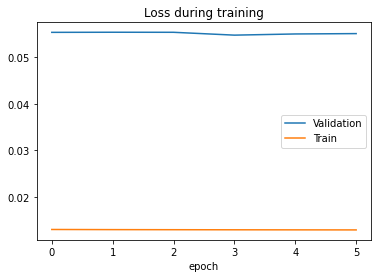

training model lstm[4] h=32,a=5,l=2
epoch 0 batch 200 loss=0.0169, MTL=0.0255, MVL=0.191				
epoch 0 batch 400 loss=0.0186, MTL=0.0219, MVL=0.191				
saving model MTL=0.021619884600523026, MVL=0.06822237897603238
*epoch 1 batch 600 loss=0.0181, MTL=0.018, MVL=0.0682				
*epoch 1 batch 800 loss=0.0185, MTL=0.0182, MVL=0.0682				
saving model MTL=0.01823000330477953, MVL=0.0676004979454103
*epoch 2 batch 1000 loss=0.0175, MTL=0.0182, MVL=0.0676				
*epoch 2 batch 1200 loss=0.0165, MTL=0.0182, MVL=0.0676				
saving model MTL=0.01819304863795397, MVL=0.06636905737343382
*epoch 3 batch 1400 loss=0.0187, MTL=0.0176, MVL=0.0664				
*epoch 3 batch 1600 loss=0.0172, MTL=0.0173, MVL=0.0664				
epoch 4 batch 1800 loss=0.016, MTL=0.0164, MVL=0.0668				
epoch 4 batch 2000 loss=0.0159, MTL=0.0162, MVL=0.0668				
saving model MTL=0.01619146989688587, MVL=0.06486496274344257
*epoch 5 batch 2200 loss=0.0156, MTL=0.0161, MVL=0.0649				
*epoch 5 batch 2400 loss=0.0162, MTL=0.016, MVL=0.0649				
epoch 6 b

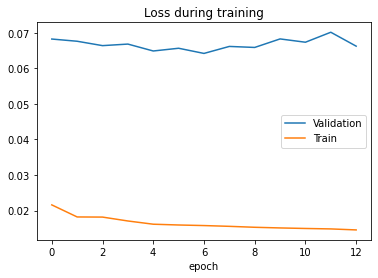

epoch 0 batch 200 loss=0.0171, MTL=0.0155, MVL=0.0643				
epoch 0 batch 400 loss=0.0155, MTL=0.0155, MVL=0.0643				
saving model MTL=0.015507174888088025, MVL=0.0628363448576849
*epoch 1 batch 600 loss=0.0139, MTL=0.0155, MVL=0.0628				
*epoch 1 batch 800 loss=0.0137, MTL=0.0154, MVL=0.0628				
epoch 2 batch 1000 loss=0.0151, MTL=0.0154, MVL=0.063				
epoch 2 batch 1200 loss=0.0159, MTL=0.0154, MVL=0.063				
epoch 3 batch 1400 loss=0.0152, MTL=0.0153, MVL=0.0644				
epoch 3 batch 1600 loss=0.0162, MTL=0.0153, MVL=0.0644				
epoch 4 batch 1800 loss=0.0156, MTL=0.0153, MVL=0.0632				
epoch 4 batch 2000 loss=0.015, MTL=0.0153, MVL=0.0632				
epoch 5 batch 2200 loss=0.0148, MTL=0.0152, MVL=0.064				
epoch 5 batch 2400 loss=0.0157, MTL=0.0153, MVL=0.064				
epoch 6 batch 2600 loss=0.0146, MTL=0.0149, MVL=0.0646				
epoch 6 batch 2800 loss=0.0153, MTL=0.0152, MVL=0.0646				
epoch 6 batch 3000 loss=0.0154, MTL=0.0152, MVL=0.0646				


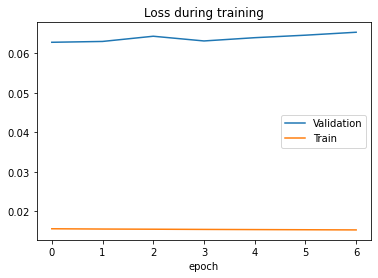

epoch 0 batch 200 loss=0.0161, MTL=0.0154, MVL=0.0633				
epoch 0 batch 400 loss=0.0154, MTL=0.0154, MVL=0.0633				
epoch 1 batch 600 loss=0.0156, MTL=0.0154, MVL=0.0638				
epoch 1 batch 800 loss=0.0152, MTL=0.0154, MVL=0.0638				
epoch 2 batch 1000 loss=0.0161, MTL=0.0154, MVL=0.0638				
epoch 2 batch 1200 loss=0.0165, MTL=0.0154, MVL=0.0638				
epoch 3 batch 1400 loss=0.0172, MTL=0.0154, MVL=0.064				
epoch 3 batch 1600 loss=0.0161, MTL=0.0154, MVL=0.064				
epoch 4 batch 1800 loss=0.0144, MTL=0.0154, MVL=0.0641				
epoch 4 batch 2000 loss=0.0162, MTL=0.0154, MVL=0.0641				
epoch 5 batch 2200 loss=0.0147, MTL=0.0154, MVL=0.0639				
epoch 5 batch 2400 loss=0.0161, MTL=0.0154, MVL=0.0639				


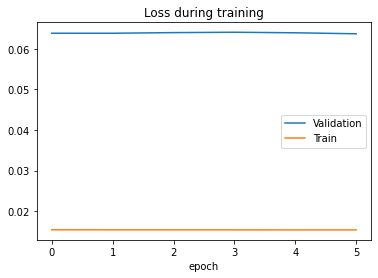

training model lstm[4] h=32,a=5,l=3
epoch 0 batch 200 loss=0.0187, MTL=0.0292, MVL=0.202				
epoch 0 batch 400 loss=0.0175, MTL=0.0236, MVL=0.202				
saving model MTL=0.023205721481997888, MVL=0.06849711260101835
*epoch 1 batch 600 loss=0.019, MTL=0.0182, MVL=0.0685				
*epoch 1 batch 800 loss=0.0148, MTL=0.0182, MVL=0.0685				
saving model MTL=0.0182270212593654, MVL=0.06702419834547356
*epoch 2 batch 1000 loss=0.0167, MTL=0.0183, MVL=0.067				
*epoch 2 batch 1200 loss=0.0184, MTL=0.0182, MVL=0.067				
epoch 3 batch 1400 loss=0.0182, MTL=0.0184, MVL=0.0674				
epoch 3 batch 1600 loss=0.0198, MTL=0.0183, MVL=0.0674				
saving model MTL=0.018226612208725124, MVL=0.06652092292416291
*epoch 4 batch 1800 loss=0.0176, MTL=0.0181, MVL=0.0665				
*epoch 4 batch 2000 loss=0.0173, MTL=0.0183, MVL=0.0665				
epoch 5 batch 2200 loss=0.0191, MTL=0.0187, MVL=0.0669				
epoch 5 batch 2400 loss=0.018, MTL=0.0183, MVL=0.0669				
epoch 6 batch 2600 loss=0.0189, MTL=0.0194, MVL=0.0669				
epoch 6 batch 

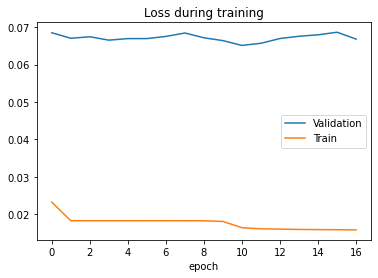

epoch 0 batch 200 loss=0.015, MTL=0.016, MVL=0.0653				
epoch 0 batch 400 loss=0.0167, MTL=0.016, MVL=0.0653				
epoch 1 batch 600 loss=0.0158, MTL=0.0159, MVL=0.0659				
epoch 1 batch 800 loss=0.0177, MTL=0.016, MVL=0.0659				
epoch 2 batch 1000 loss=0.0153, MTL=0.0159, MVL=0.0653				
epoch 2 batch 1200 loss=0.0153, MTL=0.0159, MVL=0.0653				
epoch 3 batch 1400 loss=0.0153, MTL=0.0159, MVL=0.0655				
epoch 3 batch 1600 loss=0.0171, MTL=0.0159, MVL=0.0655				
epoch 4 batch 1800 loss=0.015, MTL=0.0159, MVL=0.0656				
epoch 4 batch 2000 loss=0.0193, MTL=0.0159, MVL=0.0656				
epoch 5 batch 2200 loss=0.0162, MTL=0.0157, MVL=0.0656				
epoch 5 batch 2400 loss=0.0187, MTL=0.0158, MVL=0.0656				


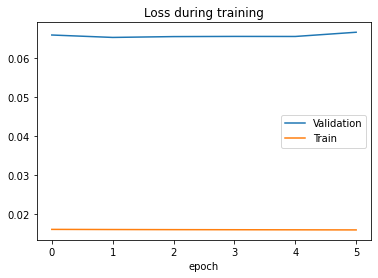

epoch 0 batch 200 loss=0.0151, MTL=0.0161, MVL=0.0655				
epoch 0 batch 400 loss=0.016, MTL=0.016, MVL=0.0655				
epoch 1 batch 600 loss=0.0171, MTL=0.016, MVL=0.0654				
epoch 1 batch 800 loss=0.016, MTL=0.016, MVL=0.0654				
saving model MTL=0.015979363193722576, MVL=0.06508340588847145
*epoch 2 batch 1000 loss=0.0143, MTL=0.0161, MVL=0.0651				
*epoch 2 batch 1200 loss=0.0158, MTL=0.016, MVL=0.0651				
epoch 3 batch 1400 loss=0.0161, MTL=0.016, MVL=0.0655				
epoch 3 batch 1600 loss=0.0147, MTL=0.016, MVL=0.0655				
epoch 4 batch 1800 loss=0.0156, MTL=0.0159, MVL=0.0653				
epoch 4 batch 2000 loss=0.0151, MTL=0.0159, MVL=0.0653				
epoch 5 batch 2200 loss=0.0135, MTL=0.0161, MVL=0.0656				
epoch 5 batch 2400 loss=0.0172, MTL=0.016, MVL=0.0656				
saving model MTL=0.015949985352248022, MVL=0.06506716637093513
*epoch 6 batch 2600 loss=0.0177, MTL=0.0169, MVL=0.0651				
*epoch 6 batch 2800 loss=0.0168, MTL=0.0159, MVL=0.0651				
*epoch 6 batch 3000 loss=0.0153, MTL=0.0159, MVL=0.0651		

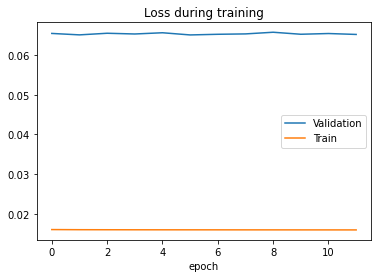

training model lstm[4] h=64,a=5,l=1
epoch 0 batch 200 loss=0.0195, MTL=0.0194, MVL=0.106				
epoch 0 batch 400 loss=0.0181, MTL=0.0187, MVL=0.106				
saving model MTL=0.018618069455784682, MVL=0.06504975931077707
*epoch 1 batch 600 loss=0.017, MTL=0.0172, MVL=0.065				
*epoch 1 batch 800 loss=0.0146, MTL=0.0169, MVL=0.065				
saving model MTL=0.016719376481209147, MVL=0.061662557183719074
*epoch 2 batch 1000 loss=0.0149, MTL=0.0152, MVL=0.0617				
*epoch 2 batch 1200 loss=0.0149, MTL=0.015, MVL=0.0617				
saving model MTL=0.014813681776198724, MVL=0.05783658767821359
*epoch 3 batch 1400 loss=0.0139, MTL=0.014, MVL=0.0578				
*epoch 3 batch 1600 loss=0.0132, MTL=0.0138, MVL=0.0578				
saving model MTL=0.013640623225660578, MVL=0.05615347904748604
*epoch 4 batch 1800 loss=0.0131, MTL=0.0131, MVL=0.0562				
*epoch 4 batch 2000 loss=0.0132, MTL=0.0128, MVL=0.0562				
epoch 5 batch 2200 loss=0.0121, MTL=0.0121, MVL=0.058				
epoch 5 batch 2400 loss=0.0113, MTL=0.012, MVL=0.058				
saving mo

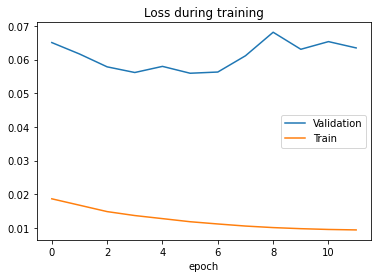

epoch 0 batch 200 loss=0.00985, MTL=0.0108, MVL=0.0559				
epoch 0 batch 400 loss=0.011, MTL=0.0108, MVL=0.0559				
epoch 1 batch 600 loss=0.0107, MTL=0.0106, MVL=0.0589				
epoch 1 batch 800 loss=0.0103, MTL=0.0106, MVL=0.0589				
epoch 2 batch 1000 loss=0.00991, MTL=0.0105, MVL=0.0613				
epoch 2 batch 1200 loss=0.0104, MTL=0.0105, MVL=0.0613				
epoch 3 batch 1400 loss=0.0103, MTL=0.0103, MVL=0.0626				
epoch 3 batch 1600 loss=0.00949, MTL=0.0103, MVL=0.0626				
epoch 4 batch 1800 loss=0.0108, MTL=0.0102, MVL=0.0626				
epoch 4 batch 2000 loss=0.0105, MTL=0.0102, MVL=0.0626				
epoch 5 batch 2200 loss=0.00994, MTL=0.01, MVL=0.0625				
epoch 5 batch 2400 loss=0.0104, MTL=0.0101, MVL=0.0625				


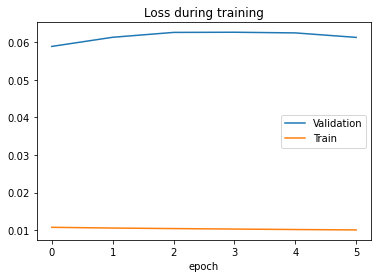

epoch 0 batch 200 loss=0.0103, MTL=0.0109, MVL=0.0556				
epoch 0 batch 400 loss=0.0105, MTL=0.0108, MVL=0.0556				
epoch 1 batch 600 loss=0.0107, MTL=0.0108, MVL=0.0566				
epoch 1 batch 800 loss=0.0102, MTL=0.0108, MVL=0.0566				
epoch 2 batch 1000 loss=0.0102, MTL=0.0108, MVL=0.057				
epoch 2 batch 1200 loss=0.0109, MTL=0.0107, MVL=0.057				
epoch 3 batch 1400 loss=0.011, MTL=0.0108, MVL=0.0576				
epoch 3 batch 1600 loss=0.0101, MTL=0.0107, MVL=0.0576				
epoch 4 batch 1800 loss=0.0108, MTL=0.0107, MVL=0.0581				
epoch 4 batch 2000 loss=0.0108, MTL=0.0107, MVL=0.0581				
epoch 5 batch 2200 loss=0.0115, MTL=0.0107, MVL=0.0584				
epoch 5 batch 2400 loss=0.0106, MTL=0.0107, MVL=0.0584				


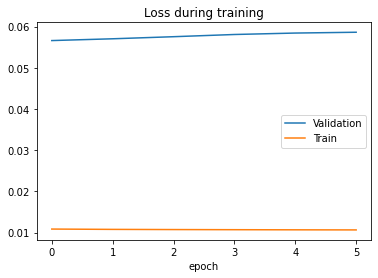

training model lstm[4] h=64,a=5,l=2
epoch 0 batch 200 loss=0.0186, MTL=0.0199, MVL=0.131				
epoch 0 batch 400 loss=0.0186, MTL=0.019, MVL=0.131				
saving model MTL=0.018988211841406366, MVL=0.0675310123650754
*epoch 1 batch 600 loss=0.0201, MTL=0.0184, MVL=0.0675				
*epoch 1 batch 800 loss=0.0165, MTL=0.0182, MVL=0.0675				
saving model MTL=0.018214689434331778, MVL=0.06566609326200407
*epoch 2 batch 1000 loss=0.017, MTL=0.0173, MVL=0.0657				
*epoch 2 batch 1200 loss=0.016, MTL=0.0168, MVL=0.0657				
saving model MTL=0.016645972836358304, MVL=0.06360409390486654
*epoch 3 batch 1400 loss=0.0164, MTL=0.0161, MVL=0.0636				
*epoch 3 batch 1600 loss=0.016, MTL=0.0159, MVL=0.0636				
epoch 4 batch 1800 loss=0.0152, MTL=0.0154, MVL=0.0638				
epoch 4 batch 2000 loss=0.0155, MTL=0.0154, MVL=0.0638				
saving model MTL=0.015253778661044173, MVL=0.06032575233305087
*epoch 5 batch 2200 loss=0.0147, MTL=0.0148, MVL=0.0603				
*epoch 5 batch 2400 loss=0.0149, MTL=0.0147, MVL=0.0603				
saving 

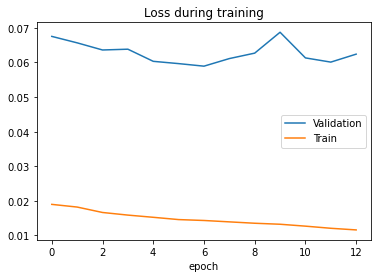

epoch 0 batch 200 loss=0.0132, MTL=0.0139, MVL=0.0589				
epoch 0 batch 400 loss=0.0132, MTL=0.0139, MVL=0.0589				
epoch 1 batch 600 loss=0.0143, MTL=0.0137, MVL=0.062				
epoch 1 batch 800 loss=0.0149, MTL=0.0138, MVL=0.062				
epoch 2 batch 1000 loss=0.0134, MTL=0.0137, MVL=0.0636				
epoch 2 batch 1200 loss=0.0136, MTL=0.0137, MVL=0.0636				
epoch 3 batch 1400 loss=0.013, MTL=0.0135, MVL=0.0638				
epoch 3 batch 1600 loss=0.0138, MTL=0.0136, MVL=0.0638				
epoch 4 batch 1800 loss=0.0143, MTL=0.0134, MVL=0.0637				
epoch 4 batch 2000 loss=0.0141, MTL=0.0135, MVL=0.0637				
epoch 5 batch 2200 loss=0.0122, MTL=0.0134, MVL=0.0637				
epoch 5 batch 2400 loss=0.0128, MTL=0.0134, MVL=0.0637				


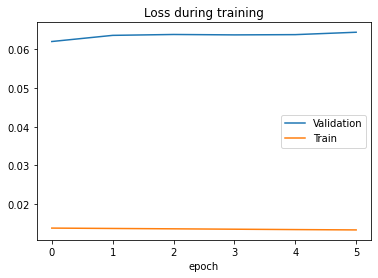

epoch 0 batch 200 loss=0.014, MTL=0.0139, MVL=0.0591				
epoch 0 batch 400 loss=0.012, MTL=0.0139, MVL=0.0591				
epoch 1 batch 600 loss=0.014, MTL=0.0139, MVL=0.0613				
epoch 1 batch 800 loss=0.0123, MTL=0.0139, MVL=0.0613				
epoch 2 batch 1000 loss=0.0132, MTL=0.0139, MVL=0.0614				
epoch 2 batch 1200 loss=0.0144, MTL=0.0138, MVL=0.0614				
epoch 3 batch 1400 loss=0.0134, MTL=0.0138, MVL=0.0618				
epoch 3 batch 1600 loss=0.0145, MTL=0.0139, MVL=0.0618				
epoch 4 batch 1800 loss=0.0137, MTL=0.0138, MVL=0.062				
epoch 4 batch 2000 loss=0.0132, MTL=0.0138, MVL=0.062				
epoch 5 batch 2200 loss=0.0137, MTL=0.0137, MVL=0.0623				
epoch 5 batch 2400 loss=0.0149, MTL=0.0138, MVL=0.0623				


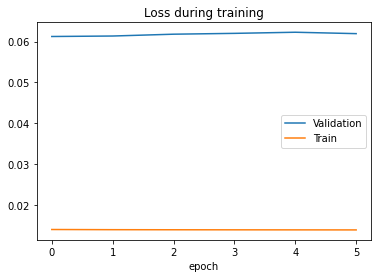

training model lstm[4] h=64,a=5,l=3
epoch 0 batch 200 loss=0.0192, MTL=0.0202, MVL=0.13				
epoch 0 batch 400 loss=0.0178, MTL=0.0192, MVL=0.13				
saving model MTL=0.019184319100258806, MVL=0.0678273585365444
*epoch 1 batch 600 loss=0.0183, MTL=0.0182, MVL=0.0678				
*epoch 1 batch 800 loss=0.0167, MTL=0.0182, MVL=0.0678				
saving model MTL=0.018240053871298085, MVL=0.0676572393687045
*epoch 2 batch 1000 loss=0.0184, MTL=0.0183, MVL=0.0677				
*epoch 2 batch 1200 loss=0.0181, MTL=0.0183, MVL=0.0677				
epoch 3 batch 1400 loss=0.0195, MTL=0.0181, MVL=0.0683				
epoch 3 batch 1600 loss=0.0188, MTL=0.0182, MVL=0.0683				
saving model MTL=0.01823827687341195, MVL=0.06716246896835625
*epoch 4 batch 1800 loss=0.0182, MTL=0.0183, MVL=0.0672				
*epoch 4 batch 2000 loss=0.0187, MTL=0.0182, MVL=0.0672				
epoch 5 batch 2200 loss=0.0179, MTL=0.0184, MVL=0.0677				
epoch 5 batch 2400 loss=0.0206, MTL=0.0183, MVL=0.0677				
saving model MTL=0.018248162967933655, MVL=0.06695724498541629
*epoch 6 

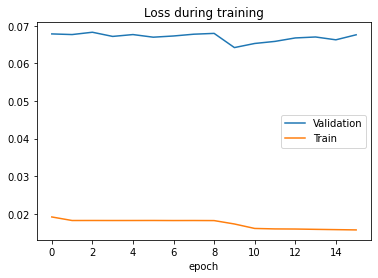

epoch 0 batch 200 loss=0.0153, MTL=0.016, MVL=0.0642				
epoch 0 batch 400 loss=0.0162, MTL=0.016, MVL=0.0642				
epoch 1 batch 600 loss=0.0163, MTL=0.0159, MVL=0.0656				
epoch 1 batch 800 loss=0.0152, MTL=0.016, MVL=0.0656				
epoch 2 batch 1000 loss=0.0168, MTL=0.016, MVL=0.0663				
epoch 2 batch 1200 loss=0.0152, MTL=0.0159, MVL=0.0663				
epoch 3 batch 1400 loss=0.0169, MTL=0.0158, MVL=0.0659				
epoch 3 batch 1600 loss=0.0176, MTL=0.016, MVL=0.0659				
epoch 4 batch 1800 loss=0.0159, MTL=0.0159, MVL=0.0655				
epoch 4 batch 2000 loss=0.0159, MTL=0.0159, MVL=0.0655				
epoch 5 batch 2200 loss=0.0173, MTL=0.016, MVL=0.0657				
epoch 5 batch 2400 loss=0.017, MTL=0.0159, MVL=0.0657				


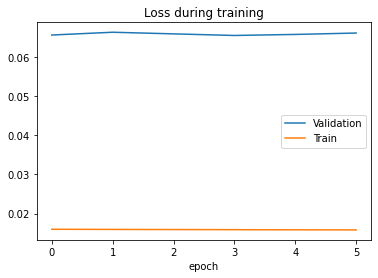

epoch 0 batch 200 loss=0.0155, MTL=0.0161, MVL=0.0641				
epoch 0 batch 400 loss=0.0148, MTL=0.016, MVL=0.0641				
epoch 1 batch 600 loss=0.0156, MTL=0.016, MVL=0.0656				
epoch 1 batch 800 loss=0.0171, MTL=0.0159, MVL=0.0656				
epoch 2 batch 1000 loss=0.0169, MTL=0.0161, MVL=0.0656				
epoch 2 batch 1200 loss=0.0164, MTL=0.016, MVL=0.0656				
epoch 3 batch 1400 loss=0.0167, MTL=0.0161, MVL=0.0658				
epoch 3 batch 1600 loss=0.0175, MTL=0.016, MVL=0.0658				
epoch 4 batch 1800 loss=0.0152, MTL=0.0161, MVL=0.0656				
epoch 4 batch 2000 loss=0.0162, MTL=0.016, MVL=0.0656				
epoch 5 batch 2200 loss=0.0157, MTL=0.016, MVL=0.0656				
epoch 5 batch 2400 loss=0.0154, MTL=0.016, MVL=0.0656				


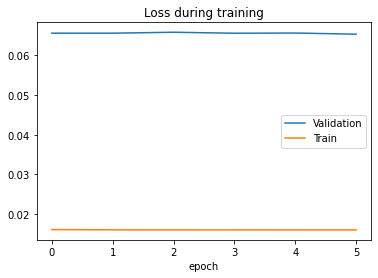

training model lstm[4] h=128,a=5,l=1
epoch 0 batch 200 loss=0.0185, MTL=0.0186, MVL=0.11				
epoch 0 batch 400 loss=0.0174, MTL=0.018, MVL=0.11				
saving model MTL=0.017890114623270326, MVL=0.06612202457961489
*epoch 1 batch 600 loss=0.0163, MTL=0.0153, MVL=0.0661				
*epoch 1 batch 800 loss=0.0127, MTL=0.0147, MVL=0.0661				
saving model MTL=0.014533485240769717, MVL=0.0573131547721683
*epoch 2 batch 1000 loss=0.0123, MTL=0.0128, MVL=0.0573				
*epoch 2 batch 1200 loss=0.0122, MTL=0.0123, MVL=0.0573				
epoch 3 batch 1400 loss=0.00966, MTL=0.0108, MVL=0.0588				
epoch 3 batch 1600 loss=0.0101, MTL=0.0106, MVL=0.0588				
epoch 4 batch 1800 loss=0.0106, MTL=0.00985, MVL=0.0574				
epoch 4 batch 2000 loss=0.00942, MTL=0.0097, MVL=0.0574				
epoch 5 batch 2200 loss=0.0096, MTL=0.00923, MVL=0.0604				
epoch 5 batch 2400 loss=0.00917, MTL=0.00923, MVL=0.0604				
epoch 6 batch 2600 loss=0.00861, MTL=0.0086, MVL=0.0618				
epoch 6 batch 2800 loss=0.00867, MTL=0.00892, MVL=0.0618				
epoch 6 

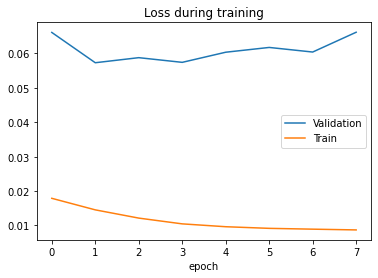

epoch 0 batch 200 loss=0.0127, MTL=0.0125, MVL=0.0571				
epoch 0 batch 400 loss=0.0129, MTL=0.0122, MVL=0.0571				
epoch 1 batch 600 loss=0.0117, MTL=0.0117, MVL=0.063				
epoch 1 batch 800 loss=0.0117, MTL=0.0116, MVL=0.063				
epoch 2 batch 1000 loss=0.0113, MTL=0.0112, MVL=0.0634				
epoch 2 batch 1200 loss=0.0122, MTL=0.0112, MVL=0.0634				
epoch 3 batch 1400 loss=0.0105, MTL=0.0109, MVL=0.0648				
epoch 3 batch 1600 loss=0.00987, MTL=0.0107, MVL=0.0648				
epoch 4 batch 1800 loss=0.0104, MTL=0.0104, MVL=0.0656				
epoch 4 batch 2000 loss=0.0108, MTL=0.0104, MVL=0.0656				
epoch 5 batch 2200 loss=0.011, MTL=0.0103, MVL=0.0647				
epoch 5 batch 2400 loss=0.00994, MTL=0.0102, MVL=0.0647				


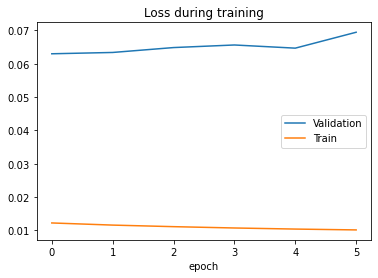

epoch 0 batch 200 loss=0.0131, MTL=0.0127, MVL=0.0572				
epoch 0 batch 400 loss=0.013, MTL=0.0126, MVL=0.0572				
epoch 1 batch 600 loss=0.0112, MTL=0.0125, MVL=0.0621				
epoch 1 batch 800 loss=0.0122, MTL=0.0124, MVL=0.0621				
epoch 2 batch 1000 loss=0.0121, MTL=0.0123, MVL=0.0623				
epoch 2 batch 1200 loss=0.0125, MTL=0.0123, MVL=0.0623				
epoch 3 batch 1400 loss=0.0125, MTL=0.0122, MVL=0.0623				
epoch 3 batch 1600 loss=0.0121, MTL=0.0122, MVL=0.0623				
epoch 4 batch 1800 loss=0.0111, MTL=0.0121, MVL=0.0626				
epoch 4 batch 2000 loss=0.0124, MTL=0.0121, MVL=0.0626				
epoch 5 batch 2200 loss=0.0128, MTL=0.0122, MVL=0.0624				
epoch 5 batch 2400 loss=0.0114, MTL=0.0121, MVL=0.0624				


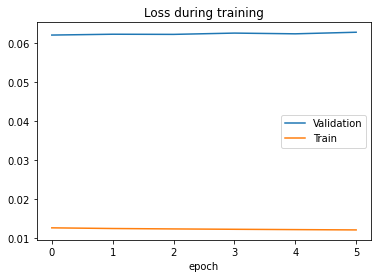

training model lstm[4] h=128,a=5,l=2
epoch 0 batch 200 loss=0.0173, MTL=0.0188, MVL=0.0859				
epoch 0 batch 400 loss=0.0183, MTL=0.0185, MVL=0.0859				
saving model MTL=0.018494087462818925, MVL=0.06659772106614269
*epoch 1 batch 600 loss=0.0181, MTL=0.0182, MVL=0.0666				
*epoch 1 batch 800 loss=0.0163, MTL=0.0182, MVL=0.0666				
epoch 2 batch 1000 loss=0.0172, MTL=0.0164, MVL=0.0691				
epoch 2 batch 1200 loss=0.0174, MTL=0.0162, MVL=0.0691				
saving model MTL=0.016226555730536683, MVL=0.06466193625428637
*epoch 3 batch 1400 loss=0.0172, MTL=0.0161, MVL=0.0647				
*epoch 3 batch 1600 loss=0.0154, MTL=0.016, MVL=0.0647				
epoch 4 batch 1800 loss=0.0164, MTL=0.016, MVL=0.0655				
epoch 4 batch 2000 loss=0.0168, MTL=0.0159, MVL=0.0655				
epoch 5 batch 2200 loss=0.0169, MTL=0.0157, MVL=0.0647				
epoch 5 batch 2400 loss=0.0151, MTL=0.0157, MVL=0.0647				
epoch 6 batch 2600 loss=0.0151, MTL=0.0163, MVL=0.0652				
epoch 6 batch 2800 loss=0.0149, MTL=0.0151, MVL=0.0652				
epoch 6 batch

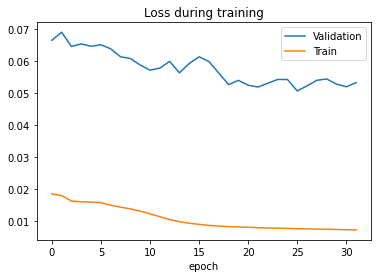

epoch 0 batch 200 loss=0.00672, MTL=0.0072, MVL=0.0508				
epoch 0 batch 400 loss=0.00746, MTL=0.0072, MVL=0.0508				
epoch 1 batch 600 loss=0.00716, MTL=0.00716, MVL=0.0549				
epoch 1 batch 800 loss=0.00679, MTL=0.00715, MVL=0.0549				
epoch 2 batch 1000 loss=0.00732, MTL=0.0071, MVL=0.0551				
epoch 2 batch 1200 loss=0.00695, MTL=0.00712, MVL=0.0551				
epoch 3 batch 1400 loss=0.00718, MTL=0.00711, MVL=0.0553				
epoch 3 batch 1600 loss=0.00739, MTL=0.0071, MVL=0.0553				
epoch 4 batch 1800 loss=0.00666, MTL=0.00702, MVL=0.0555				
epoch 4 batch 2000 loss=0.00692, MTL=0.00707, MVL=0.0555				
epoch 5 batch 2200 loss=0.0068, MTL=0.00702, MVL=0.0554				
epoch 5 batch 2400 loss=0.00709, MTL=0.00705, MVL=0.0554				


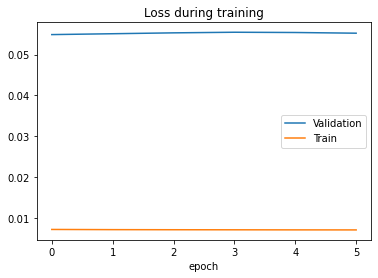

epoch 0 batch 200 loss=0.00763, MTL=0.00728, MVL=0.0509				
epoch 0 batch 400 loss=0.00704, MTL=0.00725, MVL=0.0509				
epoch 1 batch 600 loss=0.00662, MTL=0.00715, MVL=0.053				
epoch 1 batch 800 loss=0.00711, MTL=0.00718, MVL=0.053				
epoch 2 batch 1000 loss=0.00706, MTL=0.00717, MVL=0.0538				
epoch 2 batch 1200 loss=0.00716, MTL=0.00716, MVL=0.0538				
epoch 3 batch 1400 loss=0.0072, MTL=0.00713, MVL=0.054				
epoch 3 batch 1600 loss=0.00729, MTL=0.00714, MVL=0.054				
epoch 4 batch 1800 loss=0.00705, MTL=0.00708, MVL=0.0539				
epoch 4 batch 2000 loss=0.00763, MTL=0.00711, MVL=0.0539				
epoch 5 batch 2200 loss=0.00746, MTL=0.00715, MVL=0.0539				
epoch 5 batch 2400 loss=0.00764, MTL=0.00715, MVL=0.0539				


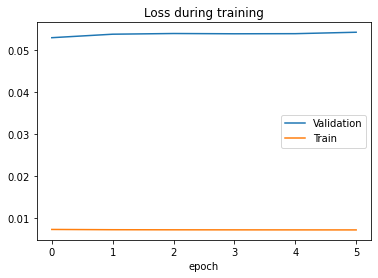

training model lstm[4] h=128,a=5,l=3
epoch 0 batch 200 loss=0.0171, MTL=0.0195, MVL=0.116				
epoch 0 batch 400 loss=0.0186, MTL=0.0188, MVL=0.116				
saving model MTL=0.01879265963145065, MVL=0.06645674356183068
*epoch 1 batch 600 loss=0.0187, MTL=0.0181, MVL=0.0665				
*epoch 1 batch 800 loss=0.0156, MTL=0.0182, MVL=0.0665				
epoch 2 batch 1000 loss=0.0186, MTL=0.0182, MVL=0.0679				
epoch 2 batch 1200 loss=0.0208, MTL=0.0182, MVL=0.0679				
epoch 3 batch 1400 loss=0.0182, MTL=0.0181, MVL=0.0671				
epoch 3 batch 1600 loss=0.0212, MTL=0.0182, MVL=0.0671				
epoch 4 batch 1800 loss=0.0163, MTL=0.0182, MVL=0.0671				
epoch 4 batch 2000 loss=0.0184, MTL=0.0183, MVL=0.0671				
epoch 5 batch 2200 loss=0.0179, MTL=0.0182, MVL=0.0667				
epoch 5 batch 2400 loss=0.0185, MTL=0.0182, MVL=0.0667				
epoch 6 batch 2600 loss=0.0171, MTL=0.017, MVL=0.0672				
epoch 6 batch 2800 loss=0.0162, MTL=0.0181, MVL=0.0672				
epoch 6 batch 3000 loss=0.0191, MTL=0.0182, MVL=0.0672				


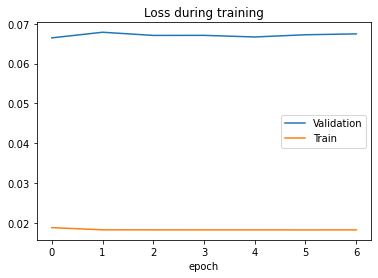

epoch 0 batch 200 loss=0.019, MTL=0.0183, MVL=0.0666				
epoch 0 batch 400 loss=0.0179, MTL=0.0182, MVL=0.0666				
epoch 1 batch 600 loss=0.0199, MTL=0.0181, MVL=0.0673				
epoch 1 batch 800 loss=0.0184, MTL=0.0182, MVL=0.0673				
epoch 2 batch 1000 loss=0.0169, MTL=0.0181, MVL=0.0679				
epoch 2 batch 1200 loss=0.0204, MTL=0.0182, MVL=0.0679				
epoch 3 batch 1400 loss=0.0177, MTL=0.0182, MVL=0.068				
epoch 3 batch 1600 loss=0.0191, MTL=0.0182, MVL=0.068				
epoch 4 batch 1800 loss=0.017, MTL=0.0183, MVL=0.0673				
epoch 4 batch 2000 loss=0.0206, MTL=0.0181, MVL=0.0673				
epoch 5 batch 2200 loss=0.0171, MTL=0.0181, MVL=0.068				
epoch 5 batch 2400 loss=0.0184, MTL=0.0181, MVL=0.068				


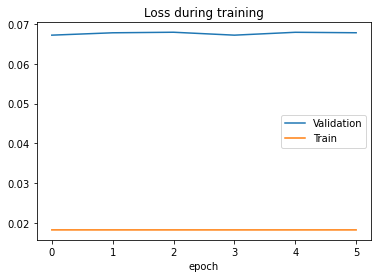

epoch 0 batch 200 loss=0.0168, MTL=0.0182, MVL=0.0666				
epoch 0 batch 400 loss=0.017, MTL=0.0182, MVL=0.0666				
epoch 1 batch 600 loss=0.0199, MTL=0.0181, MVL=0.0676				
epoch 1 batch 800 loss=0.0186, MTL=0.0181, MVL=0.0676				
epoch 2 batch 1000 loss=0.0185, MTL=0.0181, MVL=0.0675				
epoch 2 batch 1200 loss=0.0158, MTL=0.0181, MVL=0.0675				
epoch 3 batch 1400 loss=0.0184, MTL=0.0182, MVL=0.0675				
epoch 3 batch 1600 loss=0.0181, MTL=0.0182, MVL=0.0675				
epoch 4 batch 1800 loss=0.0159, MTL=0.0182, MVL=0.0675				
epoch 4 batch 2000 loss=0.0219, MTL=0.0182, MVL=0.0675				
epoch 5 batch 2200 loss=0.0208, MTL=0.0179, MVL=0.0674				
epoch 5 batch 2400 loss=0.016, MTL=0.0181, MVL=0.0674				


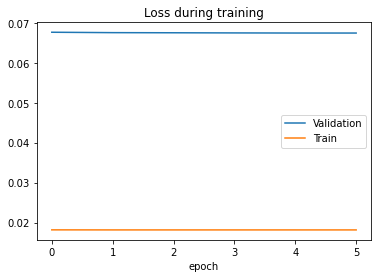

In [416]:
wg_tmp.reverse_train = True
train.train_window_models(models_b, wg_tmp, patience=5, validate=True, criterion=custom_criterion)

In [104]:
wg_tmp.debug_output = True
out = next(wg_tmp.train)

torch.Size([5, 1400, 2, 204]) torch.Size([5, 1400, 2, 1])
torch.Size([5, 1400, 12])


In [106]:
out[0][1].shape

torch.Size([32, 10, 11])

In [425]:
for k, model in enumerate(models_a):
      train.ModelHandler(model, f'model_a_{k}').save(mtype='best')
        
for k, model in enumerate(models_b):
      train.ModelHandler(model, f'model_b_{k}').save(mtype='best')

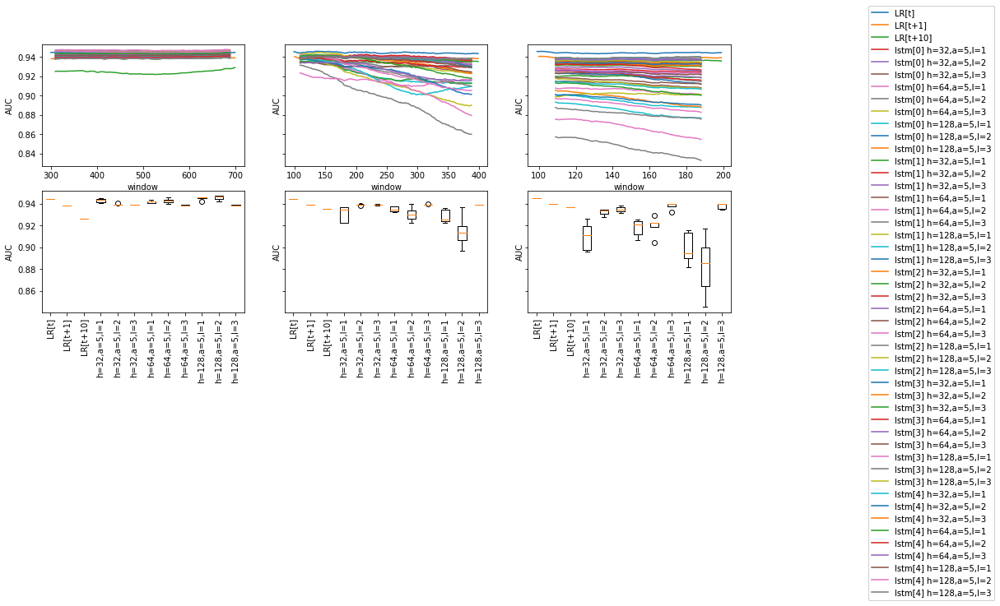

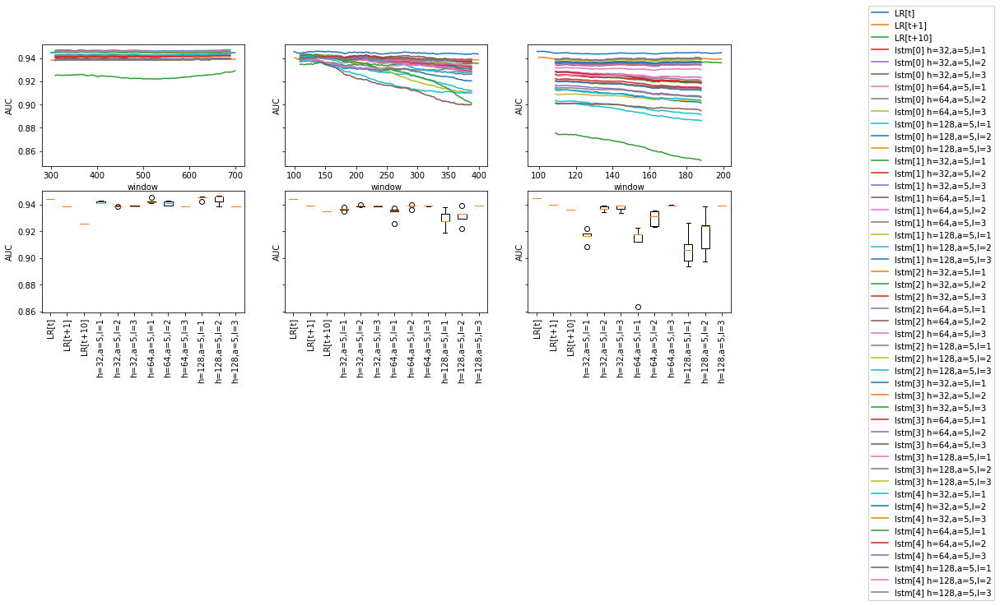

In [423]:
wg_tmp.output_sequence_length = 1
def plot_only(models, wg, ylim=None):
    for model in models:
        model.window_config.output_sequence_length = 1
        
    _, axs = plt.subplots(ncols=3, nrows=2, sharey='row', figsize=(15,6))
    plot('train', models, wg, axs=[axs[0][0], axs[1][0]], ylim=ylim)
    plot('val',   models, wg, axs=[axs[0][1], axs[1][1]], ylim=ylim)
    plot('test',  models, wg, axs=[axs[0][2], axs[1][2]], ylim=ylim)

plot_only(models_b, wg_tmp)
plot_only(models_a, wg_tmp)

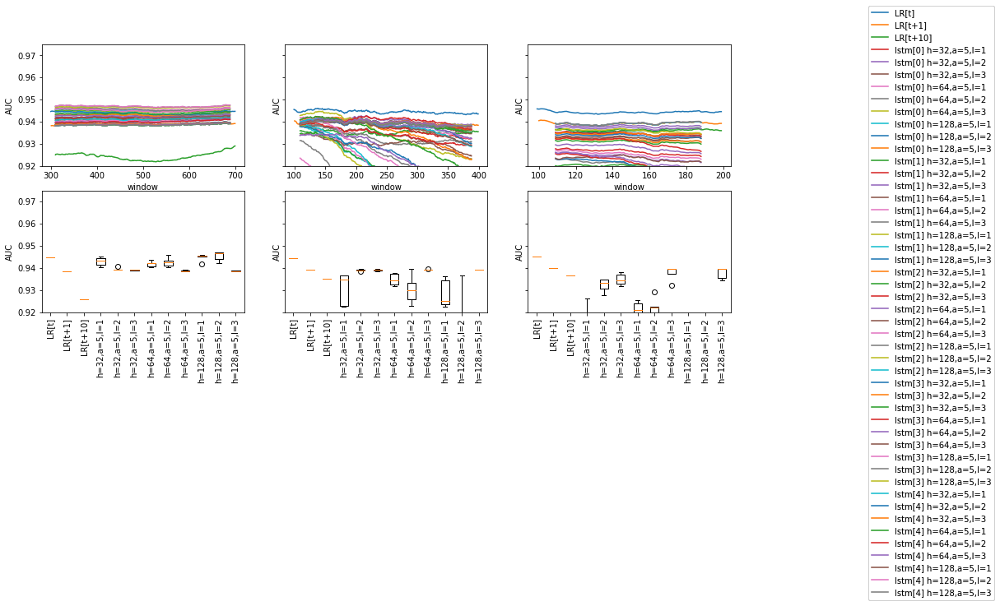

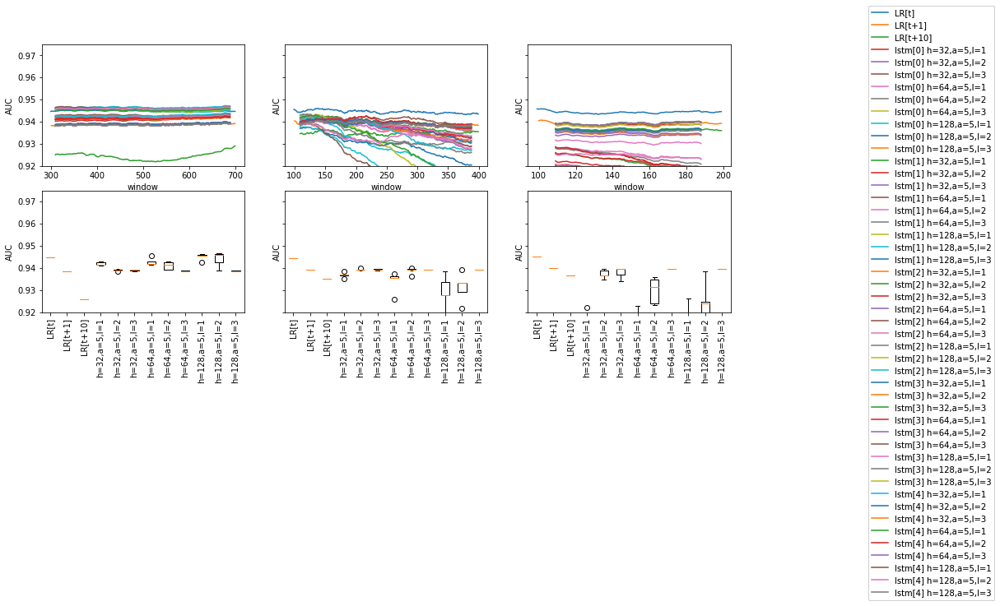

In [426]:
wg_tmp.output_sequence_length = 1
def plot_only(models, wg, ylim=None):
    for model in models:
        model.window_config.output_sequence_length = 1
        
    _, axs = plt.subplots(ncols=3, nrows=2, sharey='row', figsize=(15,6))
    plot('train', models, wg, axs=[axs[0][0], axs[1][0]], ylim=ylim)
    plot('val',   models, wg, axs=[axs[0][1], axs[1][1]], ylim=ylim)
    plot('test',  models, wg, axs=[axs[0][2], axs[1][2]], ylim=ylim)

plot_only(models_b, wg_tmp, ylim=(0.92, 0.95))
plot_only(models_a, wg_tmp, ylim=(0.92, 0.95))

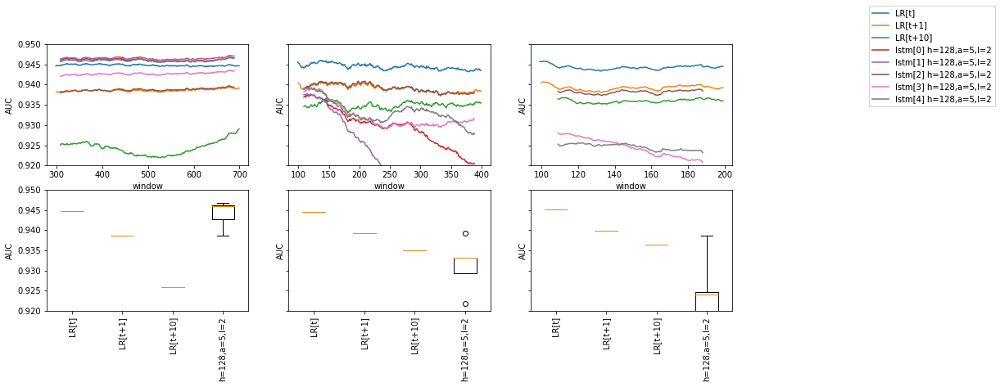

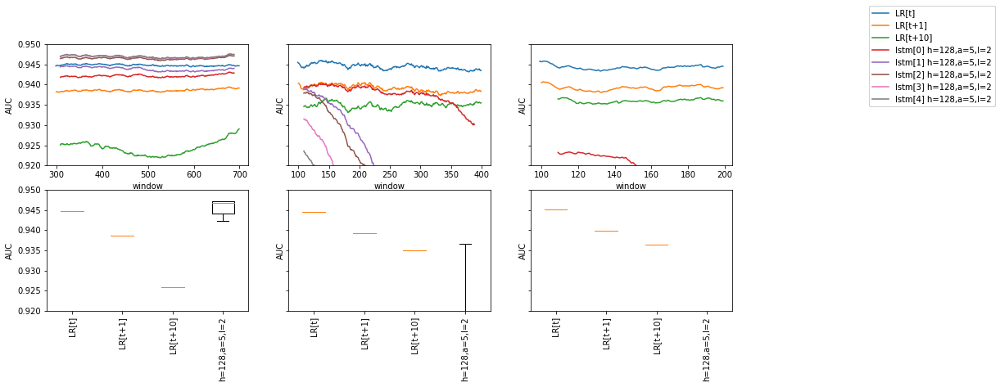

In [430]:
plot_only([m for m in models_a if 'h=128,a=5,l=2' in m.name], wg_tmp, ylim=(0.92, 0.95))
plot_only([m for m in models_b if 'h=128,a=5,l=2' in m.name], wg_tmp, ylim=(0.92, 0.95))

In [ ]:
wg.output_sequence_length = 1
model.autoregs = 1
def plot_only(models, wg, ylim=None):
    _, axs = plt.subplots(ncols=3, nrows=2, sharey='row', figsize=(15,6))
    plot('train', models, wg, axs=[axs[0][0], axs[1][0]], ylim=ylim)
    plot('val',   models, wg, axs=[axs[0][1], axs[1][1]], ylim=ylim)
    plot('test',  models, wg, axs=[axs[0][2], axs[1][2]], ylim=ylim)

plot_only(models_b, wg_tmp)

In [ ]:
wg_tmp.output_sequence_length = 1
# model = m_agg.LstmLr(feat_agg_dim*bins, 10+1, num_layers=2)
model = m_agg.AutoregLstmLr(feat_agg_dim*bins, 10+1, num_layers=2)
model.autoregs = 10
wg_tmp.output_sequence_length = model.autoregs
wg_tmp.label_stride = model.autoregs
wg_tmp.reverse_train = True
model.conv_width = 10

model.label_stride = 1
model.name=f'lstm[x] h={h},mlp={mlp},d={density}'
train_models([model], wg_tmp, patience=4, validate=True, criterion=custom_criterion)
model.autoregs = 1
def plot_only(models, wg, ylim=None):
    _, axs = plt.subplots(ncols=3, nrows=2, sharey='row', figsize=(15,6))
    plot('train', models, wg, axs=[axs[0][0], axs[1][0]], ylim=ylim)
    plot('val',   models, wg, axs=[axs[0][1], axs[1][1]], ylim=ylim)
    plot('test',  models, wg, axs=[axs[0][2], axs[1][2]], ylim=ylim)
plot_only([model], wg_tmp)

training model old[0] h=8,mlp=2,d=True
using train data set to validate
epoch 0 batch 200 loss=0.0127, MTL=0.0144, MVL=0.0151				
saving model MTL=0.014412705895465311, MVL=0.014129372230312283
*epoch 1 batch 400 loss=0.0154, MTL=0.0142, MVL=0.0141				
epoch 2 batch 600 loss=0.0144, MTL=0.0139, MVL=0.0142				
saving model MTL=0.013811460066022813, MVL=0.013565823008571195
*epoch 3 batch 800 loss=0.0133, MTL=0.0132, MVL=0.0136				
saving model MTL=0.013161365113673953, MVL=0.01240318898889108
*epoch 4 batch 1000 loss=0.0119, MTL=0.0127, MVL=0.0124				
saving model MTL=0.012617300452510699, MVL=0.01214736960016601
*epoch 5 batch 1200 loss=0.0129, MTL=0.0122, MVL=0.0121				
epoch 6 batch 1400 loss=0.0126, MTL=0.0123, MVL=0.0137				
saving model MTL=0.012000261130956334, MVL=0.011777311307164508
*epoch 7 batch 1600 loss=0.0136, MTL=0.0114, MVL=0.0118				
epoch 8 batch 1800 loss=0.0114, MTL=0.0115, MVL=0.0125				
epoch 9 batch 2000 loss=0.0109, MTL=0.0117, MVL=0.0128				
epoch 10 batch 2200

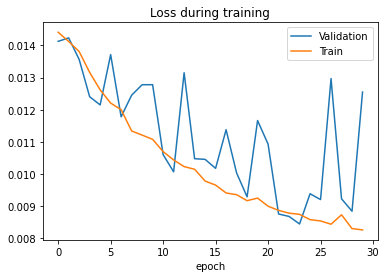

using train data set to validate
epoch 0 batch 200 loss=0.00766, MTL=0.00805, MVL=0.00842				
saving model MTL=0.00800333764946618, MVL=0.007929413970303507
*epoch 1 batch 400 loss=0.00836, MTL=0.00796, MVL=0.00793				
epoch 2 batch 600 loss=0.00707, MTL=0.00792, MVL=0.00794				
saving model MTL=0.007953264312647762, MVL=0.007871874168070905
*epoch 3 batch 800 loss=0.00807, MTL=0.00788, MVL=0.00787				
saving model MTL=0.00791089148089768, MVL=0.007817198033230978
*epoch 4 batch 1000 loss=0.00775, MTL=0.00785, MVL=0.00782				
saving model MTL=0.007864987943321466, MVL=0.007797655786191105
*epoch 5 batch 1200 loss=0.00779, MTL=0.00787, MVL=0.0078				
epoch 6 batch 1400 loss=0.00729, MTL=0.00793, MVL=0.00801				
epoch 7 batch 1600 loss=0.00735, MTL=0.00783, MVL=0.00783				
epoch 8 batch 1800 loss=0.00774, MTL=0.0078, MVL=0.00802				
saving model MTL=0.007800818777668777, MVL=0.007725636427794848
*epoch 9 batch 2000 loss=0.00838, MTL=0.00774, MVL=0.00773				
epoch 10 batch 2200 loss=0.007

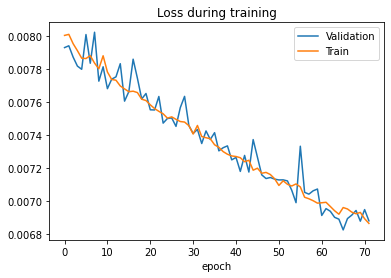

using train data set to validate
epoch 0 batch 200 loss=0.00572, MTL=0.00682, MVL=0.00682				
saving model MTL=0.006804742372953632, MVL=0.006809789774973595
*epoch 1 batch 400 loss=0.00596, MTL=0.00684, MVL=0.00681				
epoch 2 batch 600 loss=0.00641, MTL=0.00679, MVL=0.00683				
epoch 3 batch 800 loss=0.00738, MTL=0.00682, MVL=0.00682				
saving model MTL=0.006813821158534206, MVL=0.006802421483988745
*epoch 4 batch 1000 loss=0.00564, MTL=0.0068, MVL=0.0068				
epoch 5 batch 1200 loss=0.00693, MTL=0.00675, MVL=0.00682				
epoch 6 batch 1400 loss=0.0068, MTL=0.00674, MVL=0.00684				
saving model MTL=0.006855746551732951, MVL=0.006797221269236382
*epoch 7 batch 1600 loss=0.00749, MTL=0.0068, MVL=0.0068				
epoch 8 batch 1800 loss=0.00649, MTL=0.00686, MVL=0.00682				
epoch 9 batch 2000 loss=0.00698, MTL=0.00683, MVL=0.00681				
saving model MTL=0.006812249795200491, MVL=0.006783982162116045
*epoch 10 batch 2200 loss=0.00566, MTL=0.0069, MVL=0.00678				
epoch 11 batch 2400 loss=0.00704, 

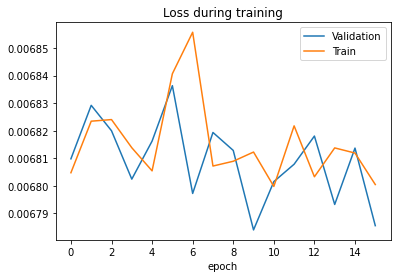

using train data set to validate
epoch 0 batch 200 loss=0.00616, MTL=0.00682, MVL=0.00679				
epoch 1 batch 400 loss=0.00641, MTL=0.0068, MVL=0.00679				
epoch 2 batch 600 loss=0.0066, MTL=0.00683, MVL=0.00679				
epoch 3 batch 800 loss=0.00743, MTL=0.00674, MVL=0.00679				
epoch 4 batch 1000 loss=0.00676, MTL=0.00682, MVL=0.00679				
epoch 5 batch 1200 loss=0.00684, MTL=0.00682, MVL=0.00679				


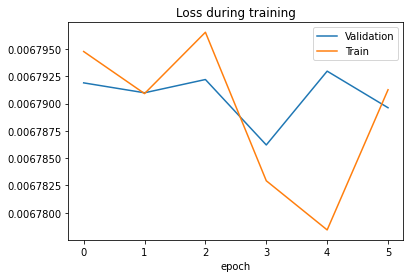

using train data set to validate
epoch 0 batch 200 loss=0.00681, MTL=0.00682, MVL=0.0068				
epoch 1 batch 400 loss=0.00643, MTL=0.00682, MVL=0.00678				
saving model MTL=0.006807786406128915, MVL=0.006783590671273136
*epoch 2 batch 600 loss=0.00648, MTL=0.00677, MVL=0.00678				
epoch 3 batch 800 loss=0.00652, MTL=0.00682, MVL=0.00679				
epoch 4 batch 1000 loss=0.00702, MTL=0.00675, MVL=0.0068				
saving model MTL=0.006794918518633061, MVL=0.006778160901526587
*epoch 5 batch 1200 loss=0.00702, MTL=0.00676, MVL=0.00678				
epoch 6 batch 1400 loss=0.00686, MTL=0.00678, MVL=0.0068				
epoch 7 batch 1600 loss=0.00732, MTL=0.00679, MVL=0.0068				
epoch 8 batch 1800 loss=0.00678, MTL=0.00684, MVL=0.00679				
epoch 9 batch 2000 loss=0.00639, MTL=0.00674, MVL=0.0068				
epoch 10 batch 2200 loss=0.00601, MTL=0.00658, MVL=0.0068				


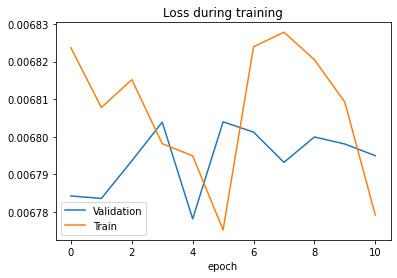

training model old[0] h=8,mlp=2,d=True
epoch 0 batch 200 loss=0.00726, MTL=0.00825, MVL=0.17				
saving model MTL=0.00828635734036018, MVL=0.199386433988321
*epoch 1 batch 400 loss=0.00594, MTL=0.00784, MVL=0.199				
saving model MTL=0.007791382630159139, MVL=0.1529595974038859
*epoch 2 batch 600 loss=0.00728, MTL=0.00754, MVL=0.153				
epoch 3 batch 800 loss=0.00716, MTL=0.00757, MVL=0.166				
epoch 4 batch 1000 loss=0.00776, MTL=0.00735, MVL=0.172				
epoch 5 batch 1200 loss=0.00743, MTL=0.00742, MVL=0.168				
epoch 6 batch 1400 loss=0.0065, MTL=0.00782, MVL=0.162				
epoch 7 batch 1600 loss=0.00799, MTL=0.00733, MVL=0.182				
saving model MTL=0.007338121046371963, MVL=0.15086440522162642
*epoch 8 batch 1800 loss=0.00842, MTL=0.00777, MVL=0.151				
epoch 9 batch 2000 loss=0.00661, MTL=0.00752, MVL=0.171				
epoch 10 batch 2200 loss=0.00559, MTL=0.00764, MVL=0.179				
epoch 11 batch 2400 loss=0.00968, MTL=0.00931, MVL=0.173				
epoch 11 batch 2600 loss=0.00757, MTL=0.00718, MVL=0.173	

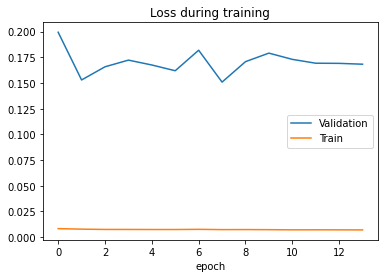

epoch 0 batch 200 loss=0.00565, MTL=0.00669, MVL=0.151				
epoch 1 batch 400 loss=0.00759, MTL=0.00663, MVL=0.168				
epoch 2 batch 600 loss=0.00688, MTL=0.00664, MVL=0.175				
epoch 3 batch 800 loss=0.00729, MTL=0.00658, MVL=0.171				
epoch 4 batch 1000 loss=0.00751, MTL=0.00658, MVL=0.174				
epoch 5 batch 1200 loss=0.0061, MTL=0.00652, MVL=0.175				


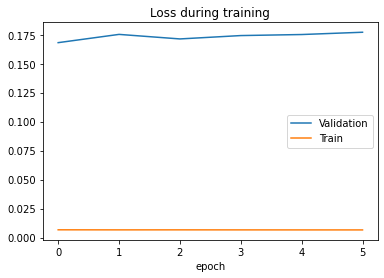

epoch 0 batch 200 loss=0.00614, MTL=0.00679, MVL=0.151				
epoch 1 batch 400 loss=0.00784, MTL=0.00657, MVL=0.167				
epoch 2 batch 600 loss=0.00645, MTL=0.0066, MVL=0.167				
epoch 3 batch 800 loss=0.00765, MTL=0.00662, MVL=0.168				
epoch 4 batch 1000 loss=0.00585, MTL=0.00658, MVL=0.168				
epoch 5 batch 1200 loss=0.00575, MTL=0.00652, MVL=0.167				


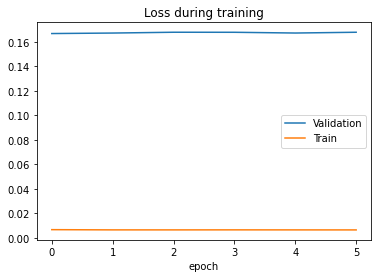

epoch 0 batch 200 loss=0.00771, MTL=0.008, MVL=0.151				
epoch 1 batch 400 loss=0.00716, MTL=0.00689, MVL=0.158				
epoch 2 batch 600 loss=0.00692, MTL=0.00667, MVL=0.164				
epoch 3 batch 800 loss=0.00693, MTL=0.0066, MVL=0.167				
epoch 4 batch 1000 loss=0.00636, MTL=0.00662, MVL=0.167				
epoch 5 batch 1200 loss=0.00663, MTL=0.00665, MVL=0.168				


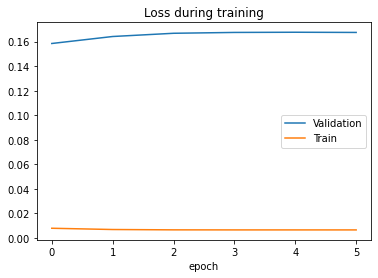

epoch 0 batch 200 loss=0.00825, MTL=0.00897, MVL=0.151				
epoch 1 batch 400 loss=0.00855, MTL=0.00874, MVL=0.152				
epoch 2 batch 600 loss=0.00759, MTL=0.00845, MVL=0.152				
epoch 3 batch 800 loss=0.00804, MTL=0.00826, MVL=0.153				
epoch 4 batch 1000 loss=0.00735, MTL=0.00803, MVL=0.154				
epoch 5 batch 1200 loss=0.00773, MTL=0.00777, MVL=0.154				


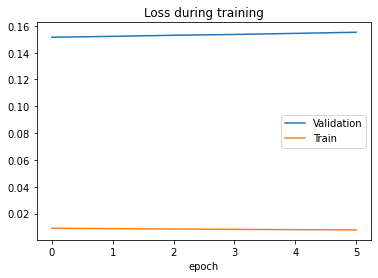

In [272]:
train_models(models_5[:1], wg_tmp, patience=5, criterion=custom_criterion, validate=False)
# train_models(models_5[:1], wg_tmp, patience=5, criterion=custom_criterion, validate=True)

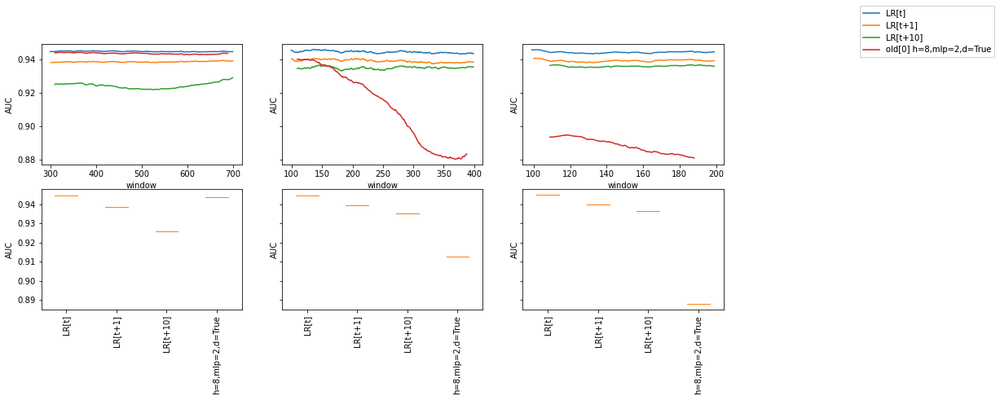

In [273]:
def plot_only(models, wg, ylim=None):
    _, axs = plt.subplots(ncols=3, nrows=2, sharey='row', figsize=(15,6))
    plot('train', models, wg, axs=[axs[0][0], axs[1][0]], ylim=ylim)
    plot('val',   models, wg, axs=[axs[0][1], axs[1][1]], ylim=ylim)
    plot('test',  models, wg, axs=[axs[0][2], axs[1][2]], ylim=ylim)
plot_only(models_5[:1], wg_tmp)

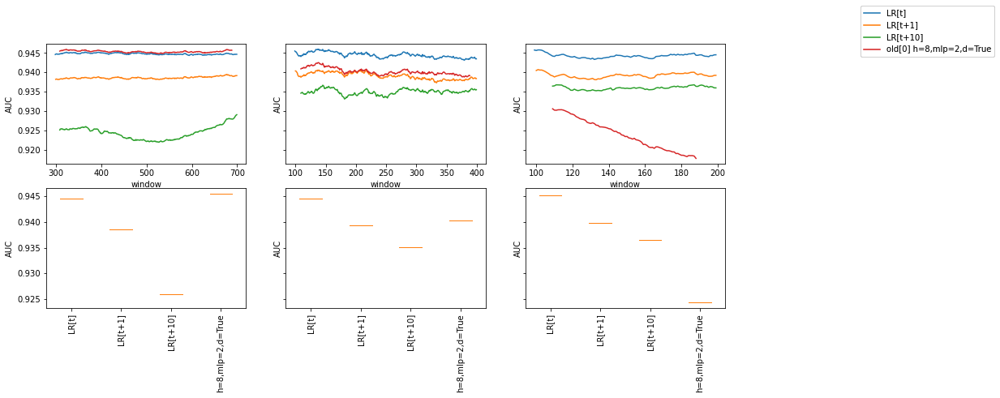

In [268]:
def plot_only(models, wg, ylim=None):
    _, axs = plt.subplots(ncols=3, nrows=2, sharey='row', figsize=(15,6))
    plot('train', models, wg, axs=[axs[0][0], axs[1][0]], ylim=ylim)
    plot('val',   models, wg, axs=[axs[0][1], axs[1][1]], ylim=ylim)
    plot('test',  models, wg, axs=[axs[0][2], axs[1][2]], ylim=ylim)
plot_only(models_5[:1], wg_tmp)

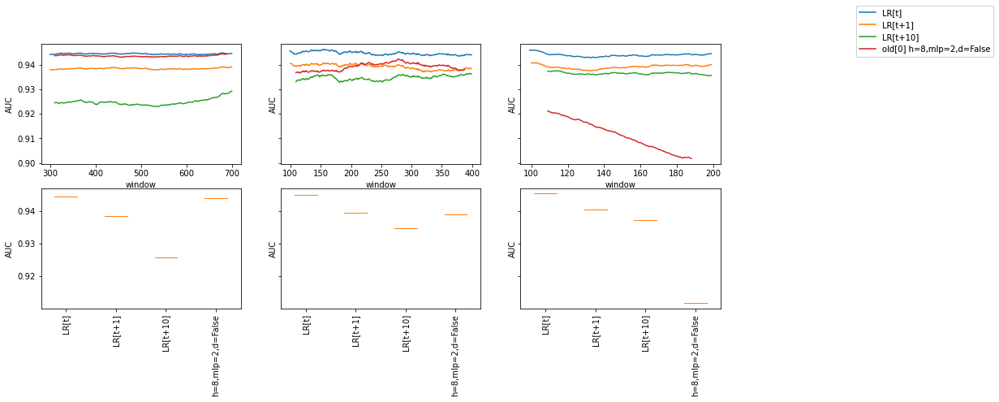

In [255]:
def plot_only(models, wg, ylim=None):
    _, axs = plt.subplots(ncols=3, nrows=2, sharey='row', figsize=(15,6))
    plot('train', models, wg, axs=[axs[0][0], axs[1][0]], ylim=ylim)
    plot('val',   models, wg, axs=[axs[0][1], axs[1][1]], ylim=ylim)
    plot('test',  models, wg, axs=[axs[0][2], axs[1][2]], ylim=ylim)
plot_only(models_5[:1], wg_tmp)

In [233]:
next(wg_tmp.test)[0][1].shape

torch.Size([32, 10, 11])

torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])


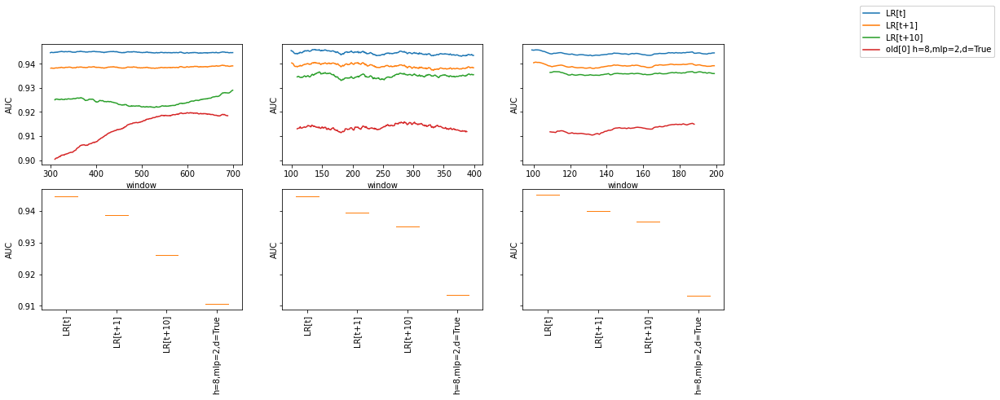

In [197]:
def plot_only(models, wg, ylim=None):
    _, axs = plt.subplots(ncols=3, nrows=2, sharey='row', figsize=(15,6))
    plot('train', models, wg, axs=[axs[0][0], axs[1][0]], ylim=ylim)
    plot('val',   models, wg, axs=[axs[0][1], axs[1][1]], ylim=ylim)
    plot('test',  models, wg, axs=[axs[0][2], axs[1][2]], ylim=ylim)
plot_only(models_5[:1], wg_tmp)

training model old[0] h=8,mlp=2,d=True
epoch 0 batch 200 loss=0.11, MTL=0.169, MVL=35.4				
saving model MTL=0.16307770797487245, MVL=0.1469156888664746
*epoch 1 batch 400 loss=0.0384, MTL=0.0582, MVL=0.147				
epoch 2 batch 600 loss=0.0769, MTL=0.116, MVL=14.2				
epoch 3 batch 800 loss=0.0339, MTL=0.0488, MVL=3.23				
epoch 4 batch 1000 loss=0.0336, MTL=0.0839, MVL=13.4				
epoch 5 batch 1200 loss=0.0383, MTL=0.0408, MVL=23.8				
epoch 6 batch 1400 loss=0.0391, MTL=0.0401, MVL=24.8				
epoch 7 batch 1600 loss=0.0426, MTL=0.0393, MVL=25.6				
epoch 8 batch 1800 loss=0.0346, MTL=0.0386, MVL=26.7				
epoch 9 batch 2000 loss=0.0356, MTL=0.0387, MVL=27.9				
epoch 10 batch 2200 loss=0.045, MTL=0.0386, MVL=29.5				
epoch 11 batch 2400 loss=0.0389, MTL=0.0367, MVL=31.2				
epoch 11 batch 2600 loss=0.04, MTL=0.0362, MVL=31.2				
epoch 12 batch 2800 loss=0.0362, MTL=0.0351, MVL=33.6				
epoch 13 batch 3000 loss=0.0376, MTL=0.0645, MVL=36.2				
epoch 14 batch 3200 loss=0.0433, MTL=0.0465, MVL=

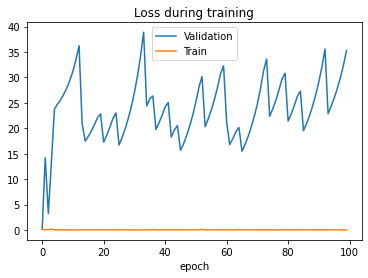

epoch 0 batch 200 loss=0.0384, MTL=0.0572, MVL=0.158				
epoch 1 batch 400 loss=0.039, MTL=0.0376, MVL=16.3				
epoch 2 batch 600 loss=0.0505, MTL=0.043, MVL=16.3				
epoch 3 batch 800 loss=0.0421, MTL=0.0458, MVL=8.51				
epoch 4 batch 1000 loss=0.0417, MTL=0.0429, MVL=10.3				
epoch 5 batch 1200 loss=0.0405, MTL=0.0401, MVL=12.3				
epoch 6 batch 1400 loss=0.0363, MTL=0.0378, MVL=14.3				
epoch 7 batch 1600 loss=0.0622, MTL=0.0587, MVL=4.68				
epoch 8 batch 1800 loss=0.0564, MTL=0.0519, MVL=6.01				
epoch 9 batch 2000 loss=0.0516, MTL=0.0464, MVL=8.44				
epoch 10 batch 2200 loss=0.0438, MTL=0.0423, MVL=10.8				
epoch 11 batch 2400 loss=0.0399, MTL=0.0396, MVL=13.0				
epoch 11 batch 2600 loss=0.0369, MTL=0.0385, MVL=13.0				
epoch 12 batch 2800 loss=0.0594, MTL=0.0452, MVL=14.9				
epoch 13 batch 3000 loss=0.0484, MTL=0.0507, MVL=8.2				
epoch 14 batch 3200 loss=0.0453, MTL=0.044, MVL=12.4				
epoch 15 batch 3400 loss=0.0579, MTL=0.0773, MVL=16.7				
epoch 16 batch 3600 loss=0.0548

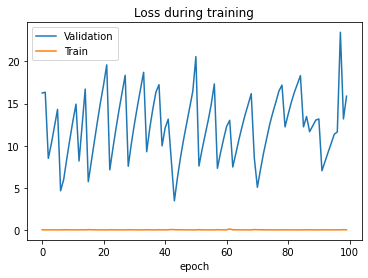

epoch 0 batch 200 loss=0.0629, MTL=0.0723, MVL=0.182				
epoch 1 batch 400 loss=0.0422, MTL=0.0489, MVL=6.48				
epoch 2 batch 600 loss=0.0407, MTL=0.0386, MVL=13.7				
epoch 3 batch 800 loss=0.039, MTL=0.0358, MVL=18.7				
epoch 4 batch 1000 loss=0.0336, MTL=0.0356, MVL=18.3				
epoch 5 batch 1200 loss=0.0317, MTL=0.0364, MVL=17.6				
epoch 6 batch 1400 loss=0.0383, MTL=0.0363, MVL=17.7				
epoch 7 batch 1600 loss=0.0372, MTL=0.0361, MVL=17.8				
epoch 8 batch 1800 loss=0.0347, MTL=0.036, MVL=17.9				
epoch 9 batch 2000 loss=0.0338, MTL=0.0369, MVL=18.0				
epoch 10 batch 2200 loss=0.035, MTL=0.0375, MVL=17.3				
epoch 11 batch 2400 loss=0.0359, MTL=0.0359, MVL=17.3				
epoch 11 batch 2600 loss=0.0392, MTL=0.0369, MVL=17.3				
epoch 12 batch 2800 loss=0.0377, MTL=0.0366, MVL=17.3				
epoch 13 batch 3000 loss=0.0422, MTL=0.0365, MVL=17.3				
epoch 14 batch 3200 loss=0.0379, MTL=0.0408, MVL=17.3				
epoch 15 batch 3400 loss=0.0373, MTL=0.0374, MVL=16.4				
epoch 16 batch 3600 loss=0.035

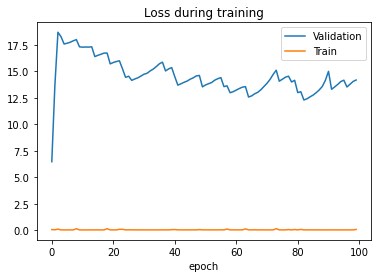

epoch 0 batch 200 loss=0.0902, MTL=0.0883, MVL=0.158				
epoch 1 batch 400 loss=0.0832, MTL=0.0837, MVL=0.203				
epoch 2 batch 600 loss=0.0776, MTL=0.0796, MVL=0.493				
epoch 3 batch 800 loss=0.077, MTL=0.0762, MVL=0.952				
epoch 4 batch 1000 loss=0.0742, MTL=0.072, MVL=1.59				
epoch 5 batch 1200 loss=0.0642, MTL=0.0685, MVL=2.33				
epoch 6 batch 1400 loss=0.0662, MTL=0.0657, MVL=3.17				
epoch 7 batch 1600 loss=0.0705, MTL=0.063, MVL=4.06				
epoch 8 batch 1800 loss=0.0585, MTL=0.0609, MVL=4.83				
epoch 9 batch 2000 loss=0.0638, MTL=0.0613, MVL=4.8				
epoch 10 batch 2200 loss=0.0573, MTL=0.0598, MVL=4.92				
epoch 11 batch 2400 loss=0.0615, MTL=0.0632, MVL=4.97				
epoch 11 batch 2600 loss=0.0591, MTL=0.0605, MVL=4.97				
epoch 12 batch 2800 loss=0.0665, MTL=0.0601, MVL=5.09				
epoch 13 batch 3000 loss=0.0543, MTL=0.0597, MVL=5.22				
epoch 14 batch 3200 loss=0.0611, MTL=0.0596, MVL=5.3				
epoch 15 batch 3400 loss=0.0654, MTL=0.059, MVL=5.42				
epoch 16 batch 3600 loss=0.064

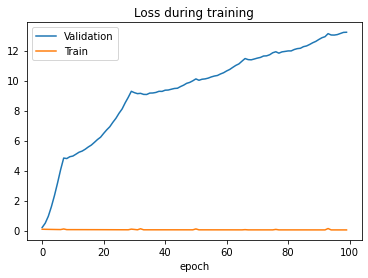

epoch 0 batch 200 loss=0.096, MTL=0.0902, MVL=0.167				
epoch 1 batch 400 loss=0.0915, MTL=0.0897, MVL=0.184				
epoch 2 batch 600 loss=0.0945, MTL=0.0893, MVL=0.164				
epoch 3 batch 800 loss=0.0926, MTL=0.089, MVL=0.17				
epoch 4 batch 1000 loss=0.0817, MTL=0.0885, MVL=0.189				
epoch 5 batch 1200 loss=0.0902, MTL=0.0879, MVL=0.211				
epoch 6 batch 1400 loss=0.0833, MTL=0.0879, MVL=0.189				
epoch 7 batch 1600 loss=0.0884, MTL=0.0877, MVL=0.186				
epoch 8 batch 1800 loss=0.0912, MTL=0.0871, MVL=0.214				
epoch 9 batch 2000 loss=0.0827, MTL=0.0859, MVL=0.207				
epoch 10 batch 2200 loss=0.0797, MTL=0.0833, MVL=0.197				
epoch 11 batch 2400 loss=0.0833, MTL=0.0866, MVL=0.237				
epoch 11 batch 2600 loss=0.0835, MTL=0.0849, MVL=0.237				
epoch 12 batch 2800 loss=0.0811, MTL=0.0845, MVL=0.282				
epoch 13 batch 3000 loss=0.079, MTL=0.084, MVL=0.27				
epoch 14 batch 3200 loss=0.0869, MTL=0.0839, MVL=0.276				
epoch 15 batch 3400 loss=0.0798, MTL=0.0832, MVL=0.347				
epoch 16 batch 36

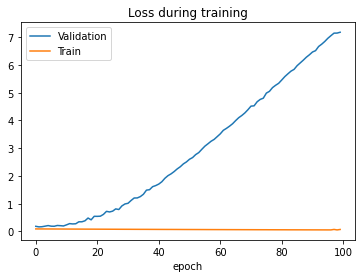

training model old[0] h=8,mlp=4,d=True
epoch 0 batch 200 loss=0.0462, MTL=0.256, MVL=79.4				
saving model MTL=0.2445078752251393, MVL=0.18536293531050446
*epoch 1 batch 400 loss=0.223, MTL=0.235, MVL=0.185				
epoch 2 batch 600 loss=0.157, MTL=0.201, MVL=0.215				
saving model MTL=0.1878829907386675, MVL=0.17123688635278922
*epoch 3 batch 800 loss=0.0759, MTL=0.0978, MVL=0.171				
epoch 4 batch 1000 loss=0.0487, MTL=0.0552, MVL=6.45				
epoch 5 batch 1200 loss=0.0363, MTL=0.0389, MVL=23.5				
epoch 6 batch 1400 loss=0.12, MTL=0.186, MVL=0.339				
epoch 7 batch 1600 loss=0.0601, MTL=0.0665, MVL=2.32				
epoch 8 batch 1800 loss=0.0414, MTL=0.0432, MVL=19.0				
epoch 9 batch 2000 loss=0.347, MTL=0.12, MVL=38.8				
saving model MTL=0.23347657797601792, MVL=0.16601169891044742
*epoch 10 batch 2200 loss=0.0914, MTL=0.0982, MVL=0.166				
epoch 11 batch 2400 loss=0.0504, MTL=0.0529, MVL=12.2				
epoch 11 batch 2600 loss=0.0392, MTL=0.0449, MVL=12.2				
epoch 12 batch 2800 loss=0.282, MTL=0.13

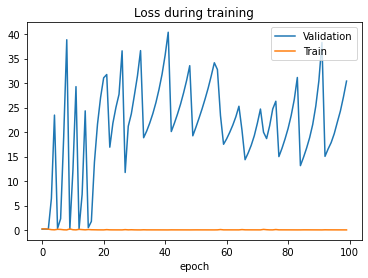

epoch 0 batch 200 loss=0.039, MTL=0.0468, MVL=0.166				
epoch 1 batch 400 loss=0.036, MTL=0.0371, MVL=29.5				
epoch 2 batch 600 loss=0.0417, MTL=0.0616, MVL=32.2				
epoch 3 batch 800 loss=0.0444, MTL=0.0452, MVL=17.6				
epoch 4 batch 1000 loss=0.0428, MTL=0.0431, MVL=20.6				
epoch 5 batch 1200 loss=0.0419, MTL=0.0408, MVL=23.6				
epoch 6 batch 1400 loss=0.0398, MTL=0.0391, MVL=26.9				
epoch 7 batch 1600 loss=0.0386, MTL=0.0372, MVL=30.6				
epoch 8 batch 1800 loss=0.037, MTL=0.0358, MVL=34.8				
epoch 9 batch 2000 loss=0.0477, MTL=0.0496, MVL=14.3				
epoch 10 batch 2200 loss=0.0479, MTL=0.0462, MVL=17.8				
epoch 11 batch 2400 loss=0.041, MTL=0.0403, MVL=19.8				
epoch 11 batch 2600 loss=0.0552, MTL=0.0566, MVL=19.8				
epoch 12 batch 2800 loss=0.0531, MTL=0.0522, MVL=11.4				
epoch 13 batch 3000 loss=0.0449, MTL=0.0479, MVL=15.1				
epoch 14 batch 3200 loss=0.0465, MTL=0.0441, MVL=19.2				
epoch 15 batch 3400 loss=0.042, MTL=0.0408, MVL=23.6				
epoch 16 batch 3600 loss=0.0383,

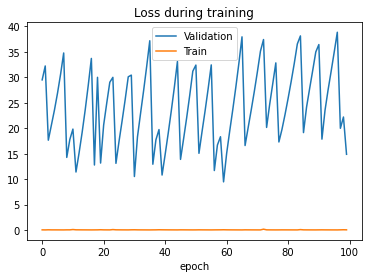

epoch 0 batch 200 loss=0.0764, MTL=0.0858, MVL=0.166				
epoch 1 batch 400 loss=0.054, MTL=0.0607, MVL=4.1				
epoch 2 batch 600 loss=0.0432, MTL=0.0468, MVL=13.4				
epoch 3 batch 800 loss=0.0336, MTL=0.0386, MVL=24.5				
epoch 4 batch 1000 loss=0.031, MTL=0.043, MVL=37.4				
epoch 5 batch 1200 loss=0.0346, MTL=0.0362, MVL=33.1				
epoch 6 batch 1400 loss=0.0395, MTL=0.0359, MVL=33.2				
epoch 7 batch 1600 loss=0.0364, MTL=0.0361, MVL=33.5				
epoch 8 batch 1800 loss=0.0399, MTL=0.0368, MVL=33.7				
epoch 9 batch 2000 loss=0.0368, MTL=0.0372, MVL=31.8				
epoch 10 batch 2200 loss=0.038, MTL=0.0367, MVL=29.6				
epoch 11 batch 2400 loss=0.0383, MTL=0.0363, MVL=30.0				
epoch 11 batch 2600 loss=0.0384, MTL=0.0376, MVL=30.0				
epoch 12 batch 2800 loss=0.0391, MTL=0.0375, MVL=30.3				
epoch 13 batch 3000 loss=0.0359, MTL=0.0371, MVL=30.6				
epoch 14 batch 3200 loss=0.0398, MTL=0.0383, MVL=30.8				
epoch 15 batch 3400 loss=0.0405, MTL=0.0379, MVL=28.9				
epoch 16 batch 3600 loss=0.0372,

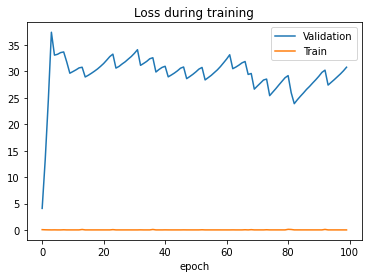

epoch 0 batch 200 loss=0.1, MTL=0.102, MVL=0.166				
saving model MTL=0.10164818434266869, MVL=0.16132296695083867
*epoch 1 batch 400 loss=0.0937, MTL=0.0974, MVL=0.161				
epoch 2 batch 600 loss=0.0865, MTL=0.0935, MVL=0.188				
epoch 3 batch 800 loss=0.0939, MTL=0.0892, MVL=0.177				
epoch 4 batch 1000 loss=0.0884, MTL=0.0865, MVL=0.35				
epoch 5 batch 1200 loss=0.0847, MTL=0.0832, MVL=0.692				
epoch 6 batch 1400 loss=0.0793, MTL=0.0796, MVL=1.13				
epoch 7 batch 1600 loss=0.0691, MTL=0.0762, MVL=1.74				
epoch 8 batch 1800 loss=0.0721, MTL=0.0736, MVL=2.46				
epoch 9 batch 2000 loss=0.0697, MTL=0.0712, MVL=3.26				
epoch 10 batch 2200 loss=0.0747, MTL=0.0686, MVL=4.16				
epoch 11 batch 2400 loss=0.0688, MTL=0.0651, MVL=5.04				
epoch 11 batch 2600 loss=0.0677, MTL=0.0654, MVL=5.04				
epoch 12 batch 2800 loss=0.0611, MTL=0.0632, MVL=6.01				
epoch 13 batch 3000 loss=0.0628, MTL=0.0612, MVL=6.95				
epoch 14 batch 3200 loss=0.0646, MTL=0.0591, MVL=7.89				
epoch 15 batch 3400 lo

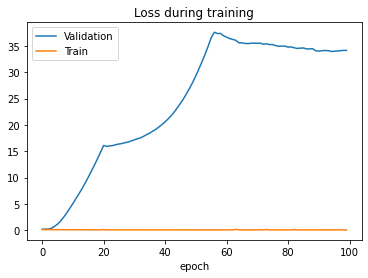

epoch 0 batch 200 loss=0.0999, MTL=0.0991, MVL=0.161				
saving model MTL=0.0990676174470044, MVL=0.16080272246579655
*epoch 1 batch 400 loss=0.103, MTL=0.0987, MVL=0.161				
saving model MTL=0.09851730020221221, MVL=0.16037644421468017
*epoch 2 batch 600 loss=0.102, MTL=0.0984, MVL=0.16				
saving model MTL=0.0980532057583332, MVL=0.15989856568516278
*epoch 3 batch 800 loss=0.103, MTL=0.0981, MVL=0.16				
saving model MTL=0.09764008001860129, MVL=0.15953179680910268
*epoch 4 batch 1000 loss=0.0963, MTL=0.0974, MVL=0.16				
epoch 5 batch 1200 loss=0.0975, MTL=0.0968, MVL=0.172				
epoch 6 batch 1400 loss=0.104, MTL=0.0961, MVL=0.17				
epoch 7 batch 1600 loss=0.0961, MTL=0.0955, MVL=0.16				
epoch 8 batch 1800 loss=0.101, MTL=0.0962, MVL=0.163				
epoch 9 batch 2000 loss=0.0971, MTL=0.0954, MVL=0.161				
epoch 10 batch 2200 loss=0.0946, MTL=0.0944, MVL=0.166				
epoch 11 batch 2400 loss=0.0924, MTL=0.0938, MVL=0.187				
epoch 11 batch 2600 loss=0.101, MTL=0.0943, MVL=0.187				
saving m

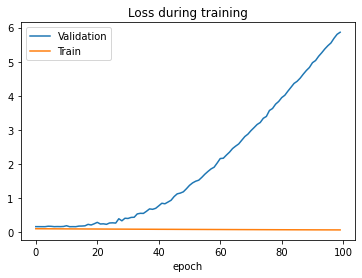

training model old[1] h=8,mlp=2,d=True
epoch 0 batch 200 loss=0.0853, MTL=0.132, MVL=46.0				
saving model MTL=0.12689130707139815, MVL=3.9470386202218104
*epoch 1 batch 400 loss=0.344, MTL=0.215, MVL=3.95				
saving model MTL=0.21905145877886803, MVL=0.19853680055649553
*epoch 2 batch 600 loss=0.058, MTL=0.0977, MVL=0.199				
epoch 3 batch 800 loss=0.0326, MTL=0.0434, MVL=12.5				
epoch 4 batch 1000 loss=0.103, MTL=0.142, MVL=0.232				
epoch 5 batch 1200 loss=0.0496, MTL=0.0605, MVL=3.1				
epoch 6 batch 1400 loss=0.135, MTL=0.198, MVL=0.359				
epoch 7 batch 1600 loss=0.0718, MTL=0.0727, MVL=1.82				
epoch 8 batch 1800 loss=0.0518, MTL=0.0467, MVL=18.6				
epoch 9 batch 2000 loss=0.0347, MTL=0.0352, MVL=43.8				
epoch 10 batch 2200 loss=0.0677, MTL=0.0705, MVL=3.39				
epoch 11 batch 2400 loss=0.045, MTL=0.0441, MVL=20.6				
epoch 11 batch 2600 loss=0.0328, MTL=0.0399, MVL=20.6				
epoch 12 batch 2800 loss=0.0868, MTL=0.127, MVL=21.8				
epoch 13 batch 3000 loss=0.0607, MTL=0.0666, M

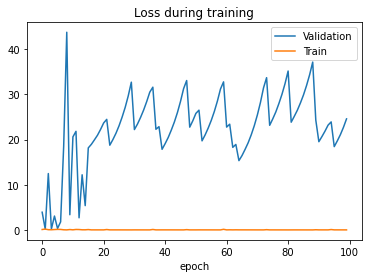

epoch 0 batch 200 loss=0.0372, MTL=0.0743, MVL=0.198				
epoch 1 batch 400 loss=0.0373, MTL=0.0375, MVL=28.7				
epoch 2 batch 600 loss=0.0436, MTL=0.0447, MVL=34.2				
epoch 3 batch 800 loss=0.0448, MTL=0.0432, MVL=19.0				
epoch 4 batch 1000 loss=0.0405, MTL=0.041, MVL=23.6				
epoch 5 batch 1200 loss=0.0405, MTL=0.0395, MVL=26.9				
epoch 6 batch 1400 loss=0.0405, MTL=0.0377, MVL=30.0				
epoch 7 batch 1600 loss=0.0434, MTL=0.0368, MVL=33.6				
epoch 8 batch 1800 loss=0.0484, MTL=0.0484, MVL=34.3				
epoch 9 batch 2000 loss=0.0495, MTL=0.0457, MVL=19.2				
epoch 10 batch 2200 loss=0.0447, MTL=0.0417, MVL=25.7				
epoch 11 batch 2400 loss=0.0404, MTL=0.041, MVL=28.0				
epoch 11 batch 2600 loss=0.0557, MTL=0.0626, MVL=28.0				
epoch 12 batch 2800 loss=0.0594, MTL=0.0591, MVL=6.84				
epoch 13 batch 3000 loss=0.0533, MTL=0.0547, MVL=9.52				
epoch 14 batch 3200 loss=0.0317, MTL=0.0413, MVL=16.3				
epoch 15 batch 3400 loss=0.0566, MTL=0.0579, MVL=7.88				
epoch 16 batch 3600 loss=0.04

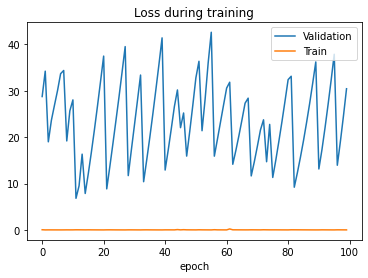

epoch 0 batch 200 loss=0.112, MTL=0.137, MVL=0.199				
saving model MTL=0.13507730045586552, MVL=0.14217627353844095
*epoch 1 batch 400 loss=0.0783, MTL=0.0949, MVL=0.142				
epoch 2 batch 600 loss=0.0643, MTL=0.0724, MVL=0.891				
epoch 3 batch 800 loss=0.0564, MTL=0.0588, MVL=6.14				
epoch 4 batch 1000 loss=0.0482, MTL=0.0504, MVL=12.3				
epoch 5 batch 1200 loss=0.0432, MTL=0.0442, MVL=19.3				
epoch 6 batch 1400 loss=0.0388, MTL=0.0416, MVL=27.8				
epoch 7 batch 1600 loss=0.0417, MTL=0.0419, MVL=29.2				
epoch 8 batch 1800 loss=0.043, MTL=0.0412, MVL=29.2				
epoch 9 batch 2000 loss=0.041, MTL=0.0411, MVL=29.4				
epoch 10 batch 2200 loss=0.0444, MTL=0.0409, MVL=29.7				
epoch 11 batch 2400 loss=0.038, MTL=0.0383, MVL=29.7				
epoch 11 batch 2600 loss=0.0401, MTL=0.0408, MVL=29.7				
epoch 12 batch 2800 loss=0.0424, MTL=0.0406, MVL=26.3				
epoch 13 batch 3000 loss=0.0385, MTL=0.0403, MVL=26.8				
epoch 14 batch 3200 loss=0.0365, MTL=0.0399, MVL=27.3				
epoch 15 batch 3400 loss=

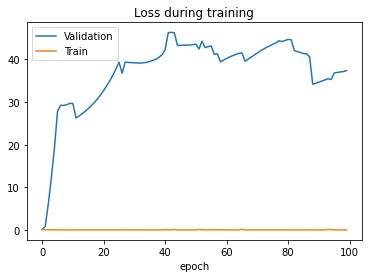

epoch 0 batch 200 loss=0.105, MTL=0.107, MVL=0.142				
saving model MTL=0.10645332847029791, MVL=0.13876150450745567
*epoch 1 batch 400 loss=0.103, MTL=0.102, MVL=0.139				
saving model MTL=0.10197014296683696, MVL=0.13568197593825762
*epoch 2 batch 600 loss=0.098, MTL=0.0983, MVL=0.136				
saving model MTL=0.09799078940798384, MVL=0.13272628298059838
*epoch 3 batch 800 loss=0.0956, MTL=0.0951, MVL=0.133				
epoch 4 batch 1000 loss=0.0873, MTL=0.0917, MVL=0.142				
epoch 5 batch 1200 loss=0.0919, MTL=0.0886, MVL=0.193				
epoch 6 batch 1400 loss=0.0875, MTL=0.0853, MVL=0.341				
epoch 7 batch 1600 loss=0.0807, MTL=0.083, MVL=0.438				
epoch 8 batch 1800 loss=0.0812, MTL=0.0805, MVL=0.772				
epoch 9 batch 2000 loss=0.0829, MTL=0.0777, MVL=1.23				
epoch 10 batch 2200 loss=0.0802, MTL=0.0759, MVL=1.77				
epoch 11 batch 2400 loss=0.0819, MTL=0.0778, MVL=2.41				
epoch 11 batch 2600 loss=0.0805, MTL=0.0723, MVL=2.41				
epoch 12 batch 2800 loss=0.0722, MTL=0.0701, MVL=3.09				
epoch 13 b

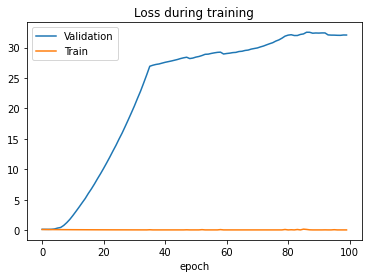

epoch 0 batch 200 loss=0.0922, MTL=0.0959, MVL=0.137				
epoch 1 batch 400 loss=0.0969, MTL=0.0956, MVL=0.134				
saving model MTL=0.09549552998548254, MVL=0.13210205477280695
*epoch 2 batch 600 loss=0.0994, MTL=0.0952, MVL=0.132				
epoch 3 batch 800 loss=0.0951, MTL=0.0951, MVL=0.132				
saving model MTL=0.09464952400928243, MVL=0.13150330779493832
*epoch 4 batch 1000 loss=0.0942, MTL=0.0946, MVL=0.132				
saving model MTL=0.09451578714705389, MVL=0.13129447571566846
*epoch 5 batch 1200 loss=0.0936, MTL=0.094, MVL=0.131				
epoch 6 batch 1400 loss=0.0897, MTL=0.0936, MVL=0.15				
epoch 7 batch 1600 loss=0.0902, MTL=0.0936, MVL=0.16				
epoch 8 batch 1800 loss=0.0877, MTL=0.0927, MVL=0.164				
saving model MTL=0.0930323364947914, MVL=0.13017413117846505
*epoch 9 batch 2000 loss=0.0892, MTL=0.093, MVL=0.13				
epoch 10 batch 2200 loss=0.0946, MTL=0.0936, MVL=0.159				
epoch 11 batch 2400 loss=0.0886, MTL=0.0882, MVL=0.14				
epoch 11 batch 2600 loss=0.0981, MTL=0.0918, MVL=0.14				
epo

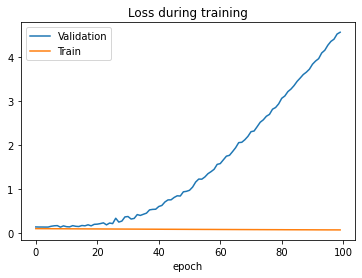

training model old[1] h=8,mlp=4,d=True
epoch 0 batch 200 loss=0.042, MTL=0.126, MVL=10.2				
saving model MTL=0.1337154240202193, MVL=18.086081082703636
*epoch 1 batch 400 loss=0.038, MTL=0.0405, MVL=18.1				
epoch 2 batch 600 loss=0.0363, MTL=0.0369, MVL=29.9				
epoch 3 batch 800 loss=0.0415, MTL=0.0374, MVL=34.6				
saving model MTL=0.03998782767683541, MVL=16.542872256919985
*epoch 4 batch 1000 loss=0.056, MTL=0.0529, MVL=16.5				
epoch 5 batch 1200 loss=0.0429, MTL=0.042, MVL=21.3				
epoch 6 batch 1400 loss=0.0383, MTL=0.0393, MVL=25.8				
epoch 7 batch 1600 loss=0.0408, MTL=0.0372, MVL=29.9				
epoch 8 batch 1800 loss=0.0361, MTL=0.0363, MVL=31.5				
epoch 9 batch 2000 loss=0.0652, MTL=0.156, MVL=26.3				
epoch 10 batch 2200 loss=0.0416, MTL=0.0462, MVL=17.9				
epoch 11 batch 2400 loss=0.0446, MTL=0.0437, MVL=21.2				
epoch 11 batch 2600 loss=0.0395, MTL=0.0416, MVL=21.2				
epoch 12 batch 2800 loss=0.0422, MTL=0.0476, MVL=23.0				
epoch 13 batch 3000 loss=0.0431, MTL=0.0412, M

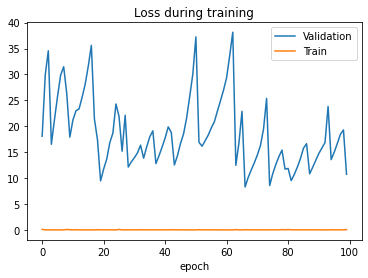

epoch 0 batch 200 loss=0.0317, MTL=0.046, MVL=8.32				
epoch 1 batch 400 loss=0.0376, MTL=0.0603, MVL=25.1				
epoch 2 batch 600 loss=0.0297, MTL=0.0349, MVL=26.3				
epoch 3 batch 800 loss=0.0393, MTL=0.0348, MVL=26.5				
epoch 4 batch 1000 loss=0.033, MTL=0.0346, MVL=26.6				
epoch 5 batch 1200 loss=0.0349, MTL=0.0347, MVL=26.8				
epoch 6 batch 1400 loss=0.0369, MTL=0.0364, MVL=23.8				
epoch 7 batch 1600 loss=0.0396, MTL=0.0368, MVL=22.1				
epoch 8 batch 1800 loss=0.0359, MTL=0.0371, MVL=22.3				
epoch 9 batch 2000 loss=0.0354, MTL=0.0373, MVL=22.3				
epoch 10 batch 2200 loss=0.04, MTL=0.0373, MVL=22.0				
epoch 11 batch 2400 loss=0.0376, MTL=0.0382, MVL=22.1				
epoch 11 batch 2600 loss=0.0387, MTL=0.0368, MVL=22.1				
epoch 12 batch 2800 loss=0.0315, MTL=0.0363, MVL=22.3				
epoch 13 batch 3000 loss=0.033, MTL=0.0359, MVL=22.6				
epoch 14 batch 3200 loss=0.0335, MTL=0.0353, MVL=23.1				
epoch 15 batch 3400 loss=0.0367, MTL=0.0342, MVL=23.6				
epoch 16 batch 3600 loss=0.0367, 

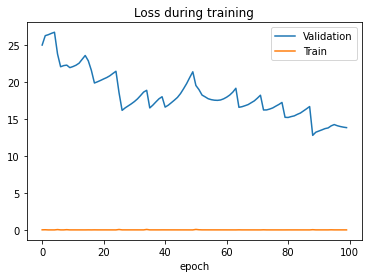

epoch 0 batch 200 loss=0.0533, MTL=0.0532, MVL=8.33				
epoch 1 batch 400 loss=0.053, MTL=0.0514, MVL=9.57				
epoch 2 batch 600 loss=0.0494, MTL=0.0498, MVL=10.8				
epoch 3 batch 800 loss=0.0553, MTL=0.0483, MVL=12.1				
epoch 4 batch 1000 loss=0.0501, MTL=0.0463, MVL=13.4				
epoch 5 batch 1200 loss=0.0416, MTL=0.0447, MVL=14.8				
epoch 6 batch 1400 loss=0.0428, MTL=0.0436, MVL=16.4				
epoch 7 batch 1600 loss=0.0451, MTL=0.041, MVL=18.2				
epoch 8 batch 1800 loss=0.0368, MTL=0.0396, MVL=20.2				
epoch 9 batch 2000 loss=0.0401, MTL=0.0379, MVL=22.6				
epoch 10 batch 2200 loss=0.0334, MTL=0.0367, MVL=25.2				
epoch 11 batch 2400 loss=0.0341, MTL=0.037, MVL=26.8				
epoch 11 batch 2600 loss=0.0327, MTL=0.0348, MVL=26.8				
epoch 12 batch 2800 loss=0.0357, MTL=0.0348, MVL=26.9				
epoch 13 batch 3000 loss=0.0341, MTL=0.035, MVL=27.0				
epoch 14 batch 3200 loss=0.0328, MTL=0.0349, MVL=26.9				
epoch 15 batch 3400 loss=0.0344, MTL=0.0424, MVL=26.6				
epoch 16 batch 3600 loss=0.0344,

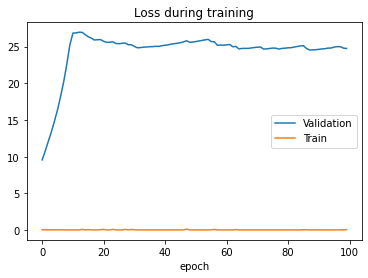

epoch 0 batch 200 loss=0.0512, MTL=0.0539, MVL=8.29				
epoch 1 batch 400 loss=0.0591, MTL=0.0539, MVL=8.47				
epoch 2 batch 600 loss=0.0479, MTL=0.0539, MVL=8.45				
epoch 3 batch 800 loss=0.0516, MTL=0.0537, MVL=8.49				
epoch 4 batch 1000 loss=0.0596, MTL=0.0538, MVL=8.5				
epoch 5 batch 1200 loss=0.0524, MTL=0.0537, MVL=8.5				
epoch 6 batch 1400 loss=0.0551, MTL=0.0538, MVL=8.5				
epoch 7 batch 1600 loss=0.0552, MTL=0.0543, MVL=8.57				
epoch 8 batch 1800 loss=0.0477, MTL=0.053, MVL=8.51				
epoch 9 batch 2000 loss=0.0526, MTL=0.0533, MVL=8.59				
epoch 10 batch 2200 loss=0.0593, MTL=0.054, MVL=8.62				
epoch 11 batch 2400 loss=0.0563, MTL=0.0546, MVL=8.6				
epoch 11 batch 2600 loss=0.0561, MTL=0.0535, MVL=8.6				
epoch 12 batch 2800 loss=0.0587, MTL=0.0537, MVL=8.68				
epoch 13 batch 3000 loss=0.0568, MTL=0.0536, MVL=8.67				
epoch 14 batch 3200 loss=0.0518, MTL=0.0536, MVL=8.7				
epoch 15 batch 3400 loss=0.0492, MTL=0.0536, MVL=8.66				
epoch 16 batch 3600 loss=0.0517, MTL

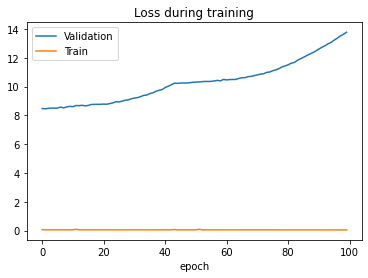

epoch 0 batch 200 loss=0.0608, MTL=0.0539, MVL=8.34				
saving model MTL=0.05408308884009309, MVL=8.259655452165447
*epoch 1 batch 400 loss=0.0559, MTL=0.0539, MVL=8.26				
epoch 2 batch 600 loss=0.0529, MTL=0.0539, MVL=8.37				
epoch 3 batch 800 loss=0.0495, MTL=0.0537, MVL=8.37				
epoch 4 batch 1000 loss=0.0498, MTL=0.0539, MVL=8.38				
epoch 5 batch 1200 loss=0.0524, MTL=0.0535, MVL=8.39				
epoch 6 batch 1400 loss=0.0468, MTL=0.0538, MVL=8.42				
epoch 7 batch 1600 loss=0.0542, MTL=0.0538, MVL=8.41				
epoch 8 batch 1800 loss=0.0479, MTL=0.0539, MVL=8.43				
epoch 9 batch 2000 loss=0.0584, MTL=0.0545, MVL=8.43				
epoch 10 batch 2200 loss=0.0542, MTL=0.0528, MVL=8.46				
epoch 11 batch 2400 loss=0.0529, MTL=0.0536, MVL=8.47				
epoch 11 batch 2600 loss=0.0565, MTL=0.0539, MVL=8.47				
epoch 12 batch 2800 loss=0.0521, MTL=0.0537, MVL=8.47				
epoch 13 batch 3000 loss=0.0566, MTL=0.0538, MVL=8.45				
epoch 14 batch 3200 loss=0.0544, MTL=0.054, MVL=8.45				
epoch 15 batch 3400 loss=0

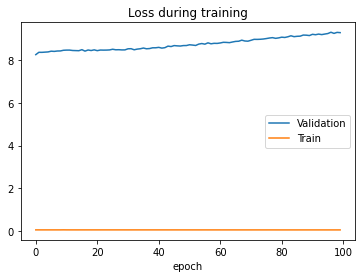

training model old[2] h=8,mlp=2,d=True
epoch 0 batch 200 loss=0.0845, MTL=0.257, MVL=21.0				
saving model MTL=0.2423241966480919, MVL=8.936862265477416
*epoch 1 batch 400 loss=0.124, MTL=0.11, MVL=8.94				
saving model MTL=0.11016929517030169, MVL=0.7499166278809798
*epoch 2 batch 600 loss=0.0622, MTL=0.0768, MVL=0.75				
epoch 3 batch 800 loss=0.0415, MTL=0.0514, MVL=18.6				
epoch 4 batch 1000 loss=0.863, MTL=0.253, MVL=28.9				
epoch 5 batch 1200 loss=0.0737, MTL=0.0824, MVL=2.43				
epoch 6 batch 1400 loss=0.053, MTL=0.0586, MVL=29.0				
epoch 7 batch 1600 loss=0.0424, MTL=0.0488, MVL=43.2				
epoch 8 batch 1800 loss=0.0383, MTL=0.0419, MVL=53.7				
epoch 9 batch 2000 loss=0.0366, MTL=0.0358, MVL=60.8				
saving model MTL=0.058778731024251615, MVL=0.2897481503056698
*epoch 10 batch 2200 loss=0.0705, MTL=0.128, MVL=0.29				
epoch 11 batch 2400 loss=0.0501, MTL=0.0484, MVL=18.4				
epoch 11 batch 2600 loss=0.18, MTL=0.0721, MVL=18.4				
saving model MTL=0.07850935293036863, MVL=0.20

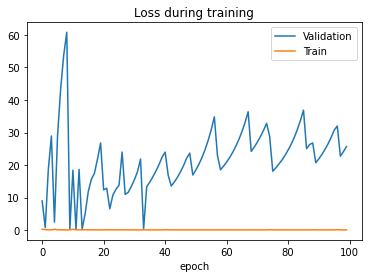

epoch 0 batch 200 loss=0.0402, MTL=0.0624, MVL=0.202				
epoch 1 batch 400 loss=0.0489, MTL=0.0783, MVL=44.1				
epoch 2 batch 600 loss=0.0389, MTL=0.0437, MVL=19.3				
epoch 3 batch 800 loss=0.039, MTL=0.0396, MVL=28.9				
epoch 4 batch 1000 loss=0.0362, MTL=0.0378, MVL=34.6				
epoch 5 batch 1200 loss=0.0364, MTL=0.0367, MVL=37.2				
epoch 6 batch 1400 loss=0.035, MTL=0.0361, MVL=39.0				
epoch 7 batch 1600 loss=0.0352, MTL=0.0352, MVL=40.4				
epoch 8 batch 1800 loss=0.0455, MTL=0.048, MVL=9.06				
epoch 9 batch 2000 loss=0.0505, MTL=0.0589, MVL=5.71				
epoch 10 batch 2200 loss=0.0933, MTL=0.096, MVL=1.57				
epoch 11 batch 2400 loss=0.047, MTL=0.0476, MVL=6.04				
epoch 11 batch 2600 loss=0.033, MTL=0.0459, MVL=6.04				
epoch 12 batch 2800 loss=0.0497, MTL=0.0565, MVL=13.4				
epoch 13 batch 3000 loss=0.0474, MTL=0.0467, MVL=12.5				
epoch 14 batch 3200 loss=0.0362, MTL=0.0401, MVL=17.4				
epoch 15 batch 3400 loss=0.074, MTL=0.0455, MVL=21.4				
epoch 16 batch 3600 loss=0.0607, M

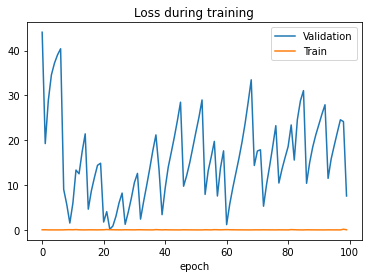

epoch 0 batch 200 loss=0.0472, MTL=0.0577, MVL=0.156				
epoch 1 batch 400 loss=0.0381, MTL=0.0542, MVL=9.48				
epoch 2 batch 600 loss=0.0383, MTL=0.0353, MVL=19.0				
epoch 3 batch 800 loss=0.0345, MTL=0.0352, MVL=19.4				
epoch 4 batch 1000 loss=0.0363, MTL=0.056, MVL=19.7				
epoch 5 batch 1200 loss=0.0332, MTL=0.0362, MVL=19.0				
epoch 6 batch 1400 loss=0.0363, MTL=0.0361, MVL=19.2				
epoch 7 batch 1600 loss=0.0376, MTL=0.0371, MVL=19.3				
epoch 8 batch 1800 loss=0.037, MTL=0.0367, MVL=17.4				
epoch 9 batch 2000 loss=0.0395, MTL=0.0369, MVL=17.6				
epoch 10 batch 2200 loss=0.0388, MTL=0.0367, MVL=17.8				
epoch 11 batch 2400 loss=0.038, MTL=0.0359, MVL=18.1				
epoch 11 batch 2600 loss=0.0402, MTL=0.0365, MVL=18.1				
epoch 12 batch 2800 loss=0.0354, MTL=0.0382, MVL=18.2				
epoch 13 batch 3000 loss=0.0384, MTL=0.0382, MVL=15.9				
epoch 14 batch 3200 loss=0.0381, MTL=0.0395, MVL=16.3				
epoch 15 batch 3400 loss=0.0389, MTL=0.0394, MVL=16.6				
epoch 16 batch 3600 loss=0.038

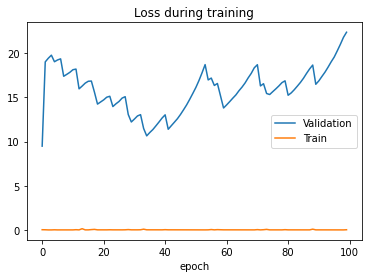

epoch 0 batch 200 loss=0.0666, MTL=0.072, MVL=0.164				
epoch 1 batch 400 loss=0.0672, MTL=0.068, MVL=0.257				
epoch 2 batch 600 loss=0.0632, MTL=0.0641, MVL=0.498				
epoch 3 batch 800 loss=0.061, MTL=0.0607, MVL=1.1				
epoch 4 batch 1000 loss=0.0601, MTL=0.0572, MVL=2.04				
epoch 5 batch 1200 loss=0.057, MTL=0.0551, MVL=3.1				
epoch 6 batch 1400 loss=0.0495, MTL=0.0521, MVL=4.3				
epoch 7 batch 1600 loss=0.0527, MTL=0.0503, MVL=5.52				
epoch 8 batch 1800 loss=0.0419, MTL=0.0475, MVL=6.79				
epoch 9 batch 2000 loss=0.0428, MTL=0.0464, MVL=8.15				
epoch 10 batch 2200 loss=0.0432, MTL=0.0451, MVL=9.55				
epoch 11 batch 2400 loss=0.0453, MTL=0.045, MVL=9.55				
epoch 11 batch 2600 loss=0.0452, MTL=0.0439, MVL=9.55				
epoch 12 batch 2800 loss=0.0382, MTL=0.0439, MVL=9.76				
epoch 13 batch 3000 loss=0.0431, MTL=0.0436, MVL=9.93				
epoch 14 batch 3200 loss=0.0451, MTL=0.0435, MVL=10.2				
epoch 15 batch 3400 loss=0.0456, MTL=0.0433, MVL=10.4				
epoch 16 batch 3600 loss=0.0375, 

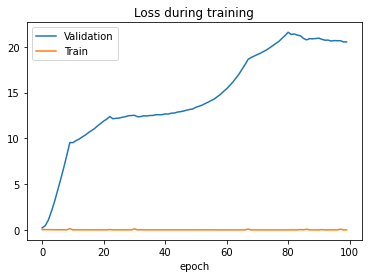

epoch 0 batch 200 loss=0.077, MTL=0.0742, MVL=0.183				
saving model MTL=0.07375183738255446, MVL=0.1616153404360912
*epoch 1 batch 400 loss=0.0768, MTL=0.0736, MVL=0.162				
epoch 2 batch 600 loss=0.0703, MTL=0.0729, MVL=0.166				
epoch 3 batch 800 loss=0.0714, MTL=0.0721, MVL=0.197				
epoch 4 batch 1000 loss=0.0726, MTL=0.0719, MVL=0.174				
epoch 5 batch 1200 loss=0.0694, MTL=0.0716, MVL=0.201				
epoch 6 batch 1400 loss=0.0685, MTL=0.0712, MVL=0.176				
epoch 7 batch 1600 loss=0.068, MTL=0.0712, MVL=0.183				
epoch 8 batch 1800 loss=0.0741, MTL=0.0707, MVL=0.259				
epoch 9 batch 2000 loss=0.068, MTL=0.0705, MVL=0.19				
epoch 10 batch 2200 loss=0.0634, MTL=0.0693, MVL=0.224				
epoch 11 batch 2400 loss=0.067, MTL=0.0691, MVL=0.238				
epoch 11 batch 2600 loss=0.0748, MTL=0.0689, MVL=0.238				
epoch 12 batch 2800 loss=0.0743, MTL=0.0685, MVL=0.298				
epoch 13 batch 3000 loss=0.0656, MTL=0.0681, MVL=0.261				
epoch 14 batch 3200 loss=0.0681, MTL=0.0678, MVL=0.272				
epoch 15 batc

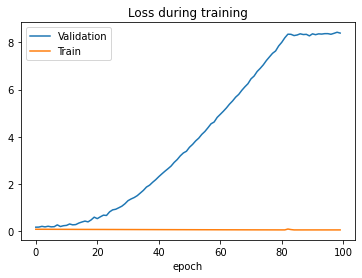

training model old[2] h=8,mlp=4,d=True
epoch 0 batch 200 loss=0.0479, MTL=0.198, MVL=44.1				
saving model MTL=0.184847744805482, MVL=34.29967273649622
*epoch 1 batch 400 loss=0.0395, MTL=0.0673, MVL=34.3				
saving model MTL=0.142498480890869, MVL=30.982979008408844
*epoch 2 batch 600 loss=0.0433, MTL=0.0513, MVL=31.0				
saving model MTL=0.04851542286779902, MVL=30.433546504036325
*epoch 3 batch 800 loss=0.0414, MTL=0.0482, MVL=30.4				
saving model MTL=0.04621962335712593, MVL=21.276419623953398
*epoch 4 batch 1000 loss=0.0356, MTL=0.0418, MVL=21.3				
epoch 5 batch 1200 loss=0.0437, MTL=0.0404, MVL=23.5				
epoch 6 batch 1400 loss=0.0423, MTL=0.0396, MVL=25.6				
epoch 7 batch 1600 loss=0.0351, MTL=0.0382, MVL=27.8				
epoch 8 batch 1800 loss=0.0354, MTL=0.0375, MVL=30.1				
epoch 9 batch 2000 loss=0.0377, MTL=0.0355, MVL=32.7				
saving model MTL=0.04219020536562445, MVL=15.811912083234944
*epoch 10 batch 2200 loss=0.0487, MTL=0.0468, MVL=15.8				
epoch 11 batch 2400 loss=0.0399, 

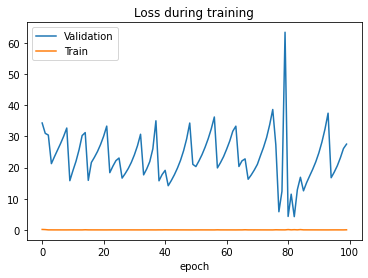

epoch 0 batch 200 loss=0.0377, MTL=0.0472, MVL=4.22				
epoch 1 batch 400 loss=0.0341, MTL=0.0395, MVL=34.3				
epoch 2 batch 600 loss=0.0337, MTL=0.0346, MVL=30.3				
epoch 3 batch 800 loss=0.0309, MTL=0.0341, MVL=30.7				
epoch 4 batch 1000 loss=0.0364, MTL=0.0463, MVL=32.0				
epoch 5 batch 1200 loss=0.0342, MTL=0.0354, MVL=28.3				
epoch 6 batch 1400 loss=0.0426, MTL=0.0375, MVL=28.3				
epoch 7 batch 1600 loss=0.0354, MTL=0.037, MVL=24.7				
epoch 8 batch 1800 loss=0.0364, MTL=0.0369, MVL=25.1				
epoch 9 batch 2000 loss=0.0341, MTL=0.0368, MVL=25.7				
epoch 10 batch 2200 loss=0.0385, MTL=0.0362, MVL=26.2				
epoch 11 batch 2400 loss=0.0406, MTL=0.0384, MVL=26.9				
epoch 11 batch 2600 loss=0.0332, MTL=0.053, MVL=26.9				
epoch 12 batch 2800 loss=0.0384, MTL=0.0355, MVL=25.0				
epoch 13 batch 3000 loss=0.0367, MTL=0.0354, MVL=25.6				
epoch 14 batch 3200 loss=0.0364, MTL=0.0348, MVL=26.4				
epoch 15 batch 3400 loss=0.0401, MTL=0.07, MVL=27.2				
epoch 16 batch 3600 loss=0.0433,

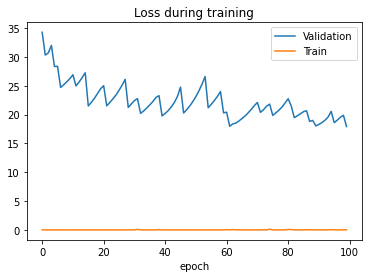

epoch 0 batch 200 loss=0.0618, MTL=0.0632, MVL=4.27				
epoch 1 batch 400 loss=0.0543, MTL=0.0579, MVL=6.88				
epoch 2 batch 600 loss=0.0488, MTL=0.0536, MVL=9.59				
epoch 3 batch 800 loss=0.0489, MTL=0.0501, MVL=12.2				
epoch 4 batch 1000 loss=0.0538, MTL=0.0473, MVL=14.8				
epoch 5 batch 1200 loss=0.0449, MTL=0.0441, MVL=17.3				
epoch 6 batch 1400 loss=0.0391, MTL=0.0417, MVL=19.8				
epoch 7 batch 1600 loss=0.0404, MTL=0.039, MVL=22.3				
epoch 8 batch 1800 loss=0.0391, MTL=0.0368, MVL=25.6				
epoch 9 batch 2000 loss=0.0341, MTL=0.0345, MVL=29.8				
epoch 10 batch 2200 loss=0.0315, MTL=0.035, MVL=29.3				
epoch 11 batch 2400 loss=0.0312, MTL=0.0336, MVL=29.3				
epoch 11 batch 2600 loss=0.0348, MTL=0.0441, MVL=29.3				
epoch 12 batch 2800 loss=0.0388, MTL=0.0355, MVL=28.4				
epoch 13 batch 3000 loss=0.0331, MTL=0.0355, MVL=28.4				
epoch 14 batch 3200 loss=0.0321, MTL=0.0353, MVL=28.4				
epoch 15 batch 3400 loss=0.0352, MTL=0.0486, MVL=28.5				
epoch 16 batch 3600 loss=0.037

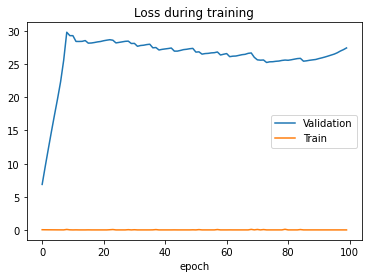

epoch 0 batch 200 loss=0.0694, MTL=0.0658, MVL=4.27				
epoch 1 batch 400 loss=0.0612, MTL=0.065, MVL=4.55				
epoch 2 batch 600 loss=0.0629, MTL=0.0645, MVL=4.78				
epoch 3 batch 800 loss=0.0591, MTL=0.0642, MVL=5.07				
epoch 4 batch 1000 loss=0.0622, MTL=0.0633, MVL=5.31				
epoch 5 batch 1200 loss=0.0635, MTL=0.0625, MVL=5.6				
epoch 6 batch 1400 loss=0.0606, MTL=0.062, MVL=5.83				
epoch 7 batch 1600 loss=0.0603, MTL=0.0621, MVL=6.11				
epoch 8 batch 1800 loss=0.0634, MTL=0.0611, MVL=6.36				
epoch 9 batch 2000 loss=0.0671, MTL=0.0617, MVL=6.68				
epoch 10 batch 2200 loss=0.0512, MTL=0.0611, MVL=6.93				
epoch 11 batch 2400 loss=0.0572, MTL=0.0598, MVL=7.18				
epoch 11 batch 2600 loss=0.0549, MTL=0.0593, MVL=7.18				
epoch 12 batch 2800 loss=0.0553, MTL=0.0588, MVL=7.47				
epoch 13 batch 3000 loss=0.0568, MTL=0.0583, MVL=7.74				
epoch 14 batch 3200 loss=0.0636, MTL=0.0582, MVL=8.02				
epoch 15 batch 3400 loss=0.0504, MTL=0.0573, MVL=8.29				
epoch 16 batch 3600 loss=0.0587

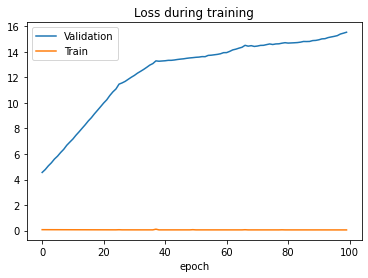

epoch 0 batch 200 loss=0.0721, MTL=0.066, MVL=4.29				
saving model MTL=0.06610829478830373, MVL=4.28589240840224
*epoch 1 batch 400 loss=0.059, MTL=0.0661, MVL=4.29				
epoch 2 batch 600 loss=0.0687, MTL=0.0657, MVL=4.32				
epoch 3 batch 800 loss=0.0646, MTL=0.066, MVL=4.32				
epoch 4 batch 1000 loss=0.0665, MTL=0.0657, MVL=4.36				
epoch 5 batch 1200 loss=0.0606, MTL=0.066, MVL=4.42				
epoch 6 batch 1400 loss=0.0742, MTL=0.0657, MVL=4.44				
epoch 7 batch 1600 loss=0.0631, MTL=0.0659, MVL=4.38				
epoch 8 batch 1800 loss=0.0665, MTL=0.0646, MVL=4.47				
epoch 9 batch 2000 loss=0.0701, MTL=0.0666, MVL=4.53				
epoch 10 batch 2200 loss=0.0709, MTL=0.0634, MVL=4.51				
epoch 11 batch 2400 loss=0.0603, MTL=0.0588, MVL=4.56				
epoch 11 batch 2600 loss=0.073, MTL=0.0653, MVL=4.56				
epoch 12 batch 2800 loss=0.0673, MTL=0.0651, MVL=4.58				
epoch 13 batch 3000 loss=0.063, MTL=0.0654, MVL=4.61				
epoch 14 batch 3200 loss=0.0603, MTL=0.0651, MVL=4.63				
epoch 15 batch 3400 loss=0.068, 

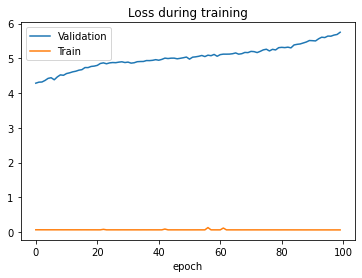

training model old[3] h=8,mlp=2,d=True
epoch 0 batch 200 loss=0.0695, MTL=0.123, MVL=18.6				
saving model MTL=0.11842357531326626, MVL=8.60467987373227
*epoch 1 batch 400 loss=0.034, MTL=0.0455, MVL=8.6				
epoch 2 batch 600 loss=0.122, MTL=0.172, MVL=38.0				
saving model MTL=0.1551804230676605, MVL=0.40436125009274876
*epoch 3 batch 800 loss=0.0616, MTL=0.0727, MVL=0.404				
epoch 4 batch 1000 loss=0.0432, MTL=0.0471, MVL=14.0				
epoch 5 batch 1200 loss=0.0366, MTL=0.0377, MVL=26.0				
epoch 6 batch 1400 loss=0.0389, MTL=0.0709, MVL=5.59				
epoch 7 batch 1600 loss=0.0384, MTL=0.0374, MVL=29.5				
epoch 8 batch 1800 loss=0.0357, MTL=0.0367, MVL=30.9				
epoch 9 batch 2000 loss=0.0365, MTL=0.0356, MVL=32.6				
epoch 10 batch 2200 loss=0.038, MTL=0.0394, MVL=31.5				
epoch 11 batch 2400 loss=0.0462, MTL=0.0419, MVL=22.8				
epoch 11 batch 2600 loss=0.0458, MTL=0.045, MVL=22.8				
epoch 12 batch 2800 loss=0.0428, MTL=0.0441, MVL=19.5				
epoch 13 batch 3000 loss=0.0424, MTL=0.0426, MV

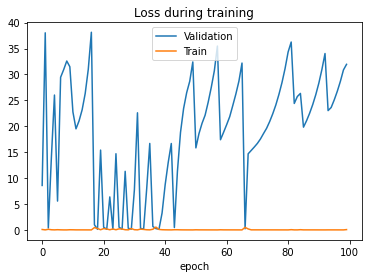

epoch 0 batch 200 loss=0.0427, MTL=0.0977, MVL=0.153				
epoch 1 batch 400 loss=0.0399, MTL=0.0405, MVL=18.5				
epoch 2 batch 600 loss=0.0392, MTL=0.039, MVL=20.9				
epoch 3 batch 800 loss=0.0371, MTL=0.0377, MVL=23.0				
epoch 4 batch 1000 loss=0.0355, MTL=0.0364, MVL=25.3				
epoch 5 batch 1200 loss=0.0332, MTL=0.0346, MVL=28.1				
epoch 6 batch 1400 loss=0.0568, MTL=0.0665, MVL=31.4				
epoch 7 batch 1600 loss=0.055, MTL=0.0514, MVL=9.64				
epoch 8 batch 1800 loss=0.0498, MTL=0.048, MVL=12.1				
epoch 9 batch 2000 loss=0.0468, MTL=0.0448, MVL=14.9				
epoch 10 batch 2200 loss=0.0462, MTL=0.0415, MVL=18.3				
epoch 11 batch 2400 loss=0.0377, MTL=0.0387, MVL=22.1				
epoch 11 batch 2600 loss=0.0349, MTL=0.0371, MVL=22.1				
epoch 12 batch 2800 loss=0.0683, MTL=0.0426, MVL=26.6				
epoch 13 batch 3000 loss=0.0604, MTL=0.0588, MVL=6.19				
epoch 14 batch 3200 loss=0.0528, MTL=0.0531, MVL=8.1				
epoch 15 batch 3400 loss=0.0427, MTL=0.0483, MVL=11.0				
epoch 16 batch 3600 loss=0.0434

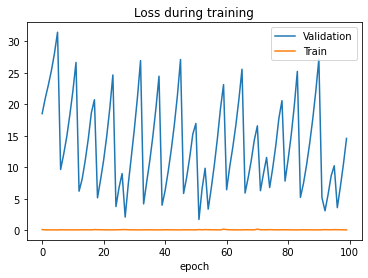

epoch 0 batch 200 loss=0.0608, MTL=0.0831, MVL=0.153				
epoch 1 batch 400 loss=0.045, MTL=0.0534, MVL=4.5				
epoch 2 batch 600 loss=0.0334, MTL=0.0412, MVL=17.5				
epoch 3 batch 800 loss=0.0359, MTL=0.0359, MVL=26.3				
epoch 4 batch 1000 loss=0.0364, MTL=0.0356, MVL=26.8				
epoch 5 batch 1200 loss=0.0359, MTL=0.0371, MVL=23.7				
epoch 6 batch 1400 loss=0.0392, MTL=0.037, MVL=24.1				
epoch 7 batch 1600 loss=0.0383, MTL=0.0367, MVL=24.6				
epoch 8 batch 1800 loss=0.0364, MTL=0.0357, MVL=25.1				
epoch 9 batch 2000 loss=0.0357, MTL=0.0363, MVL=25.6				
epoch 10 batch 2200 loss=0.0339, MTL=0.0354, MVL=26.2				
epoch 11 batch 2400 loss=0.0345, MTL=0.0339, MVL=26.8				
epoch 11 batch 2600 loss=0.0368, MTL=0.0355, MVL=26.8				
epoch 12 batch 2800 loss=0.0396, MTL=0.0373, MVL=26.8				
epoch 13 batch 3000 loss=0.0356, MTL=0.037, MVL=24.2				
epoch 14 batch 3200 loss=0.0349, MTL=0.0369, MVL=24.6				
epoch 15 batch 3400 loss=0.0374, MTL=0.0365, MVL=25.0				
epoch 16 batch 3600 loss=0.0379

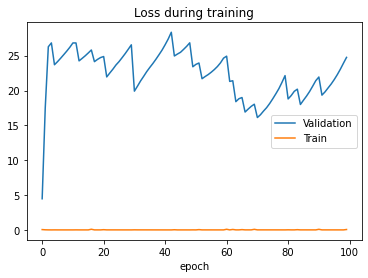

epoch 0 batch 200 loss=0.106, MTL=0.102, MVL=0.153				
saving model MTL=0.10169096496127067, MVL=0.14801442745279092
*epoch 1 batch 400 loss=0.0926, MTL=0.0968, MVL=0.148				
saving model MTL=0.09642495953161782, MVL=0.14294025387431755
*epoch 2 batch 600 loss=0.0906, MTL=0.0921, MVL=0.143				
epoch 3 batch 800 loss=0.0887, MTL=0.0874, MVL=0.176				
epoch 4 batch 1000 loss=0.0846, MTL=0.0837, MVL=0.266				
epoch 5 batch 1200 loss=0.0783, MTL=0.0793, MVL=0.437				
epoch 6 batch 1400 loss=0.074, MTL=0.0758, MVL=0.883				
epoch 7 batch 1600 loss=0.0795, MTL=0.0727, MVL=1.61				
epoch 8 batch 1800 loss=0.0683, MTL=0.0691, MVL=2.48				
epoch 9 batch 2000 loss=0.0635, MTL=0.066, MVL=3.48				
epoch 10 batch 2200 loss=0.0617, MTL=0.0627, MVL=4.59				
epoch 11 batch 2400 loss=0.0573, MTL=0.0585, MVL=5.71				
epoch 11 batch 2600 loss=0.0567, MTL=0.0591, MVL=5.71				
epoch 12 batch 2800 loss=0.0546, MTL=0.0564, MVL=6.92				
epoch 13 batch 3000 loss=0.0476, MTL=0.0542, MVL=8.18				
epoch 14 batch 

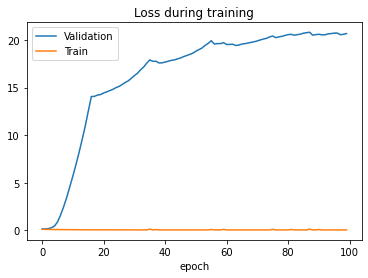

epoch 0 batch 200 loss=0.0901, MTL=0.0938, MVL=0.16				
epoch 1 batch 400 loss=0.0967, MTL=0.0932, MVL=0.147				
saving model MTL=0.09313981002623882, MVL=0.14197161744852535
*epoch 2 batch 600 loss=0.0918, MTL=0.0925, MVL=0.142				
saving model MTL=0.09260585620452505, MVL=0.14149515049867942
*epoch 3 batch 800 loss=0.0928, MTL=0.092, MVL=0.141				
epoch 4 batch 1000 loss=0.0905, MTL=0.0918, MVL=0.174				
saving model MTL=0.09159098907348213, MVL=0.1414228946459098
*epoch 5 batch 1200 loss=0.0894, MTL=0.0908, MVL=0.141				
saving model MTL=0.0910188831867428, MVL=0.140646187863389
*epoch 6 batch 1400 loss=0.0894, MTL=0.0903, MVL=0.141				
epoch 7 batch 1600 loss=0.0884, MTL=0.0901, MVL=0.183				
epoch 8 batch 1800 loss=0.0889, MTL=0.0902, MVL=0.169				
epoch 9 batch 2000 loss=0.0953, MTL=0.0898, MVL=0.153				
epoch 10 batch 2200 loss=0.0949, MTL=0.0911, MVL=0.156				
epoch 11 batch 2400 loss=0.0941, MTL=0.0919, MVL=0.152				
epoch 11 batch 2600 loss=0.0922, MTL=0.0883, MVL=0.152				
e

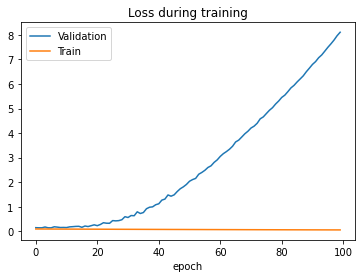

training model old[3] h=8,mlp=4,d=True
epoch 0 batch 200 loss=0.0372, MTL=0.0762, MVL=33.8				
saving model MTL=0.07309827417425743, MVL=24.3394498043373
*epoch 1 batch 400 loss=0.0674, MTL=0.0556, MVL=24.3				
epoch 2 batch 600 loss=0.054, MTL=0.0726, MVL=41.5				
saving model MTL=0.06611105936382888, MVL=17.619430244946088
*epoch 3 batch 800 loss=0.0461, MTL=0.0551, MVL=17.6				
saving model MTL=0.052417819294224094, MVL=16.886560596403527
*epoch 4 batch 1000 loss=0.0482, MTL=0.0455, MVL=16.9				
epoch 5 batch 1200 loss=0.371, MTL=0.0885, MVL=20.3				
saving model MTL=0.15090922476433286, MVL=0.1629143125209652
*epoch 6 batch 1400 loss=0.0555, MTL=0.0713, MVL=0.163				
epoch 7 batch 1600 loss=0.0364, MTL=0.0387, MVL=22.8				
saving model MTL=0.08972085045155036, MVL=0.14633447200548452
*epoch 8 batch 1800 loss=0.0755, MTL=0.0894, MVL=0.146				
saving model MTL=0.2000761923269121, MVL=0.1436013081034676
*epoch 9 batch 2000 loss=0.0604, MTL=0.0814, MVL=0.144				
epoch 10 batch 2200 los

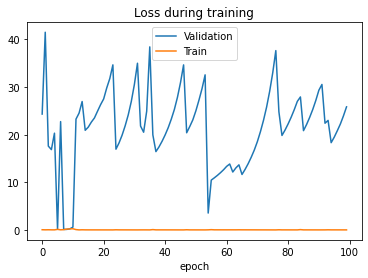

epoch 0 batch 200 loss=0.0433, MTL=0.0703, MVL=0.144				
epoch 1 batch 400 loss=0.0431, MTL=0.0426, MVL=29.8				
epoch 2 batch 600 loss=0.039, MTL=0.0416, MVL=22.9				
epoch 3 batch 800 loss=0.0461, MTL=0.0489, MVL=23.9				
epoch 4 batch 1000 loss=0.0455, MTL=0.0449, MVL=18.0				
epoch 5 batch 1200 loss=0.0425, MTL=0.0411, MVL=22.6				
epoch 6 batch 1400 loss=0.0379, MTL=0.0373, MVL=28.4				
epoch 7 batch 1600 loss=0.0377, MTL=0.0339, MVL=36.4				
epoch 8 batch 1800 loss=0.0464, MTL=0.045, MVL=18.0				
epoch 9 batch 2000 loss=0.0414, MTL=0.0434, MVL=20.9				
epoch 10 batch 2200 loss=0.041, MTL=0.0406, MVL=23.9				
epoch 11 batch 2400 loss=0.0361, MTL=0.0376, MVL=27.1				
epoch 11 batch 2600 loss=0.0337, MTL=0.0383, MVL=27.1				
epoch 12 batch 2800 loss=0.0349, MTL=0.0366, MVL=30.6				
epoch 13 batch 3000 loss=0.0384, MTL=0.035, MVL=34.4				
epoch 14 batch 3200 loss=0.044, MTL=0.0433, MVL=38.7				
epoch 15 batch 3400 loss=0.0412, MTL=0.0456, MVL=17.1				
epoch 16 batch 3600 loss=0.0434,

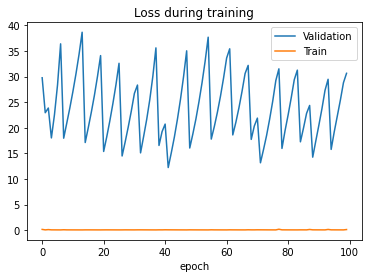

epoch 0 batch 200 loss=0.0811, MTL=0.091, MVL=0.144				
epoch 1 batch 400 loss=0.0581, MTL=0.067, MVL=2.0				
epoch 2 batch 600 loss=0.048, MTL=0.0519, MVL=9.4				
epoch 3 batch 800 loss=0.0397, MTL=0.0418, MVL=19.2				
epoch 4 batch 1000 loss=0.0336, MTL=0.0348, MVL=31.8				
epoch 5 batch 1200 loss=0.0327, MTL=0.0348, MVL=39.4				
epoch 6 batch 1400 loss=0.0328, MTL=0.0349, MVL=37.1				
epoch 7 batch 1600 loss=0.0404, MTL=0.0857, MVL=37.4				
epoch 8 batch 1800 loss=0.0371, MTL=0.0362, MVL=33.5				
epoch 9 batch 2000 loss=0.0385, MTL=0.0369, MVL=33.7				
epoch 10 batch 2200 loss=0.0359, MTL=0.0372, MVL=33.9				
epoch 11 batch 2400 loss=0.0316, MTL=0.0335, MVL=34.1				
epoch 11 batch 2600 loss=0.0347, MTL=0.0358, MVL=34.1				
epoch 12 batch 2800 loss=0.0375, MTL=0.051, MVL=34.4				
epoch 13 batch 3000 loss=0.0379, MTL=0.0375, MVL=32.0				
epoch 14 batch 3200 loss=0.0418, MTL=0.0382, MVL=30.3				
epoch 15 batch 3400 loss=0.0371, MTL=0.0381, MVL=28.8				
epoch 16 batch 3600 loss=0.0372, 

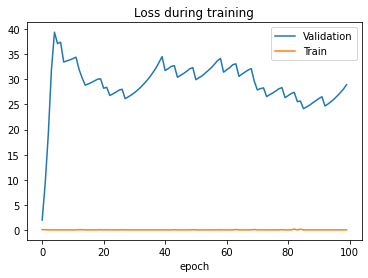

epoch 0 batch 200 loss=0.115, MTL=0.105, MVL=0.144				
saving model MTL=0.10468158641949706, MVL=0.1400622525176064
*epoch 1 batch 400 loss=0.105, MTL=0.101, MVL=0.14				
saving model MTL=0.10105476412204427, MVL=0.1368189313616909
*epoch 2 batch 600 loss=0.0935, MTL=0.0974, MVL=0.137				
epoch 3 batch 800 loss=0.0993, MTL=0.0946, MVL=0.148				
epoch 4 batch 1000 loss=0.0912, MTL=0.0916, MVL=0.152				
epoch 5 batch 1200 loss=0.0852, MTL=0.0882, MVL=0.264				
epoch 6 batch 1400 loss=0.0919, MTL=0.085, MVL=0.349				
epoch 7 batch 1600 loss=0.0818, MTL=0.0828, MVL=0.59				
epoch 8 batch 1800 loss=0.0842, MTL=0.0801, MVL=1.0				
epoch 9 batch 2000 loss=0.079, MTL=0.0775, MVL=1.46				
epoch 10 batch 2200 loss=0.0696, MTL=0.0745, MVL=2.06				
epoch 11 batch 2400 loss=0.0721, MTL=0.0708, MVL=2.72				
epoch 11 batch 2600 loss=0.0749, MTL=0.0719, MVL=2.72				
epoch 12 batch 2800 loss=0.0651, MTL=0.0697, MVL=3.4				
epoch 13 batch 3000 loss=0.0689, MTL=0.0676, MVL=4.1				
epoch 14 batch 3200 los

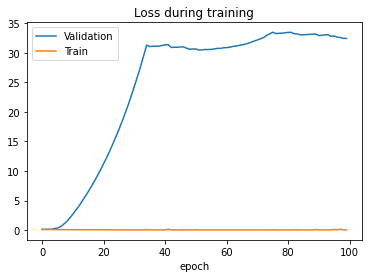

epoch 0 batch 200 loss=0.101, MTL=0.0989, MVL=0.137				
epoch 1 batch 400 loss=0.0975, MTL=0.0984, MVL=0.151				
saving model MTL=0.09852210257988457, MVL=0.1362881401523215
*epoch 2 batch 600 loss=0.0924, MTL=0.0982, MVL=0.136				
epoch 3 batch 800 loss=0.0979, MTL=0.0977, MVL=0.161				
saving model MTL=0.09770184854438546, MVL=0.13611520961171292
*epoch 4 batch 1000 loss=0.105, MTL=0.0975, MVL=0.136				
epoch 5 batch 1200 loss=0.0956, MTL=0.0972, MVL=0.14				
epoch 6 batch 1400 loss=0.0965, MTL=0.097, MVL=0.149				
epoch 7 batch 1600 loss=0.0945, MTL=0.0962, MVL=0.148				
saving model MTL=0.0964426446125048, MVL=0.13417974334271227
*epoch 8 batch 1800 loss=0.0988, MTL=0.0963, MVL=0.134				
saving model MTL=0.09590864403668893, MVL=0.1339082405215404
*epoch 9 batch 2000 loss=0.0938, MTL=0.0955, MVL=0.134				
epoch 10 batch 2200 loss=0.0981, MTL=0.0935, MVL=0.153				
epoch 11 batch 2400 loss=0.0946, MTL=0.0944, MVL=0.143				
epoch 11 batch 2600 loss=0.093, MTL=0.095, MVL=0.143				
epoc

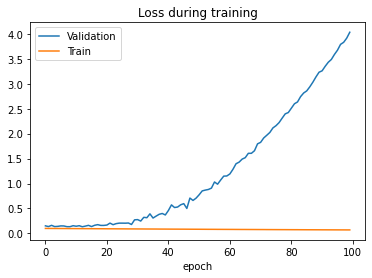

training model old[4] h=8,mlp=2,d=True
epoch 0 batch 200 loss=0.052, MTL=0.13, MVL=13.4				
saving model MTL=0.12359661975482461, MVL=13.998677769645315
*epoch 1 batch 400 loss=0.0438, MTL=0.0448, MVL=14.0				
saving model MTL=0.04423945597073901, MVL=13.66747832689129
*epoch 2 batch 600 loss=0.0406, MTL=0.0413, MVL=13.7				
saving model MTL=0.12978290091482325, MVL=10.924375659129659
*epoch 3 batch 800 loss=0.533, MTL=0.567, MVL=10.9				
saving model MTL=0.4787973456529029, MVL=0.24389528348797657
*epoch 4 batch 1000 loss=0.112, MTL=0.145, MVL=0.244				
saving model MTL=0.12752152022418625, MVL=0.15715326381022812
*epoch 5 batch 1200 loss=0.0788, MTL=0.0835, MVL=0.157				
epoch 6 batch 1400 loss=0.0619, MTL=0.0619, MVL=4.81				
epoch 7 batch 1600 loss=0.0535, MTL=0.0511, MVL=11.0				
epoch 8 batch 1800 loss=0.0426, MTL=0.0443, MVL=16.4				
epoch 9 batch 2000 loss=0.0832, MTL=0.0993, MVL=10.3				
epoch 10 batch 2200 loss=0.0582, MTL=0.056, MVL=2.7				
epoch 11 batch 2400 loss=0.057, MT

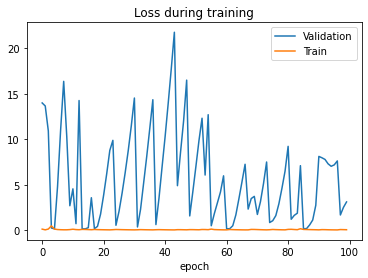

epoch 0 batch 200 loss=0.047, MTL=0.0605, MVL=0.15				
epoch 1 batch 400 loss=0.0312, MTL=0.0829, MVL=5.62				
epoch 2 batch 600 loss=0.0388, MTL=0.0363, MVL=8.49				
epoch 3 batch 800 loss=0.0376, MTL=0.036, MVL=8.5				
epoch 4 batch 1000 loss=0.0385, MTL=0.0361, MVL=8.59				
epoch 5 batch 1200 loss=0.0412, MTL=0.0372, MVL=8.6				
epoch 6 batch 1400 loss=0.0409, MTL=0.038, MVL=7.97				
epoch 7 batch 1600 loss=0.039, MTL=0.0381, MVL=7.67				
epoch 8 batch 1800 loss=0.0399, MTL=0.0376, MVL=7.74				
epoch 9 batch 2000 loss=0.0383, MTL=0.0385, MVL=7.89				
epoch 10 batch 2200 loss=0.0355, MTL=0.0378, MVL=7.98				
epoch 11 batch 2400 loss=0.0428, MTL=0.0378, MVL=8.13				
epoch 11 batch 2600 loss=0.035, MTL=0.037, MVL=8.13				
epoch 12 batch 2800 loss=0.0348, MTL=0.0368, MVL=8.27				
epoch 13 batch 3000 loss=0.0412, MTL=0.038, MVL=8.43				
epoch 14 batch 3200 loss=0.0442, MTL=0.0376, MVL=8.34				
epoch 15 batch 3400 loss=0.0348, MTL=0.0373, MVL=8.56				
epoch 16 batch 3600 loss=0.0414, MTL=

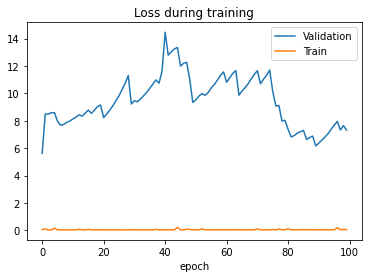

epoch 0 batch 200 loss=0.079, MTL=0.0764, MVL=0.152				
epoch 1 batch 400 loss=0.0701, MTL=0.0715, MVL=0.171				
epoch 2 batch 600 loss=0.0687, MTL=0.0676, MVL=0.27				
epoch 3 batch 800 loss=0.0563, MTL=0.0637, MVL=0.491				
epoch 4 batch 1000 loss=0.0544, MTL=0.0606, MVL=0.924				
epoch 5 batch 1200 loss=0.0563, MTL=0.057, MVL=1.56				
epoch 6 batch 1400 loss=0.0529, MTL=0.0543, MVL=2.36				
epoch 7 batch 1600 loss=0.0538, MTL=0.0513, MVL=3.16				
epoch 8 batch 1800 loss=0.0489, MTL=0.0493, MVL=3.99				
epoch 9 batch 2000 loss=0.0483, MTL=0.0471, MVL=4.9				
epoch 10 batch 2200 loss=0.0452, MTL=0.0446, MVL=5.79				
epoch 11 batch 2400 loss=0.0458, MTL=0.0446, MVL=6.76				
epoch 11 batch 2600 loss=0.0427, MTL=0.0416, MVL=6.76				
epoch 12 batch 2800 loss=0.0427, MTL=0.0408, MVL=7.68				
epoch 13 batch 3000 loss=0.0391, MTL=0.0404, MVL=7.55				
epoch 14 batch 3200 loss=0.045, MTL=0.0405, MVL=7.64				
epoch 15 batch 3400 loss=0.0416, MTL=0.0404, MVL=7.72				
epoch 16 batch 3600 loss=0.0

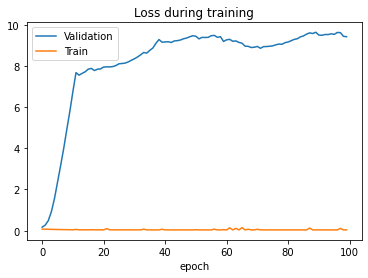

epoch 0 batch 200 loss=0.075, MTL=0.0783, MVL=0.15				
saving model MTL=0.07829945047445801, MVL=0.14955342292297083
*epoch 1 batch 400 loss=0.0733, MTL=0.078, MVL=0.15				
epoch 2 batch 600 loss=0.0728, MTL=0.0776, MVL=0.151				
saving model MTL=0.07738428163008952, MVL=0.14865428478014273
*epoch 3 batch 800 loss=0.0782, MTL=0.0774, MVL=0.149				
epoch 4 batch 1000 loss=0.0736, MTL=0.0766, MVL=0.175				
saving model MTL=0.07622855365139629, MVL=0.14776400806473905
*epoch 5 batch 1200 loss=0.0759, MTL=0.0757, MVL=0.148				
saving model MTL=0.07565917551449132, MVL=0.14734230141659252
*epoch 6 batch 1400 loss=0.0726, MTL=0.0757, MVL=0.147				
epoch 7 batch 1600 loss=0.0734, MTL=0.0746, MVL=0.162				
epoch 8 batch 1800 loss=0.0739, MTL=0.074, MVL=0.151				
epoch 9 batch 2000 loss=0.0773, MTL=0.0734, MVL=0.157				
epoch 10 batch 2200 loss=0.0826, MTL=0.0728, MVL=0.197				
saving model MTL=0.07332354018447595, MVL=0.14601365977623423
*epoch 11 batch 2400 loss=0.0731, MTL=0.0701, MVL=0.146	

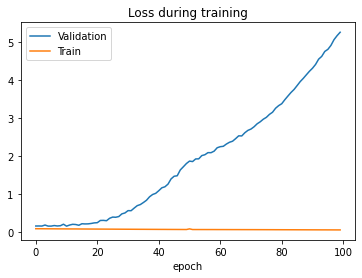

epoch 0 batch 200 loss=0.0728, MTL=0.0731, MVL=0.171				
epoch 1 batch 400 loss=0.0783, MTL=0.073, MVL=0.162				
epoch 2 batch 600 loss=0.0759, MTL=0.0731, MVL=0.155				
epoch 3 batch 800 loss=0.0828, MTL=0.0729, MVL=0.153				
epoch 4 batch 1000 loss=0.0711, MTL=0.073, MVL=0.155				
epoch 5 batch 1200 loss=0.0747, MTL=0.0732, MVL=0.16				
epoch 6 batch 1400 loss=0.0709, MTL=0.073, MVL=0.161				
epoch 7 batch 1600 loss=0.0692, MTL=0.0721, MVL=0.166				
epoch 8 batch 1800 loss=0.0666, MTL=0.0716, MVL=0.178				
epoch 9 batch 2000 loss=0.0671, MTL=0.0714, MVL=0.198				
epoch 10 batch 2200 loss=0.073, MTL=0.0739, MVL=0.181				
epoch 11 batch 2400 loss=0.0731, MTL=0.0747, MVL=0.173				
epoch 11 batch 2600 loss=0.0726, MTL=0.0725, MVL=0.173				
epoch 12 batch 2800 loss=0.0762, MTL=0.0725, MVL=0.15				
epoch 13 batch 3000 loss=0.0685, MTL=0.0725, MVL=0.176				
epoch 14 batch 3200 loss=0.0677, MTL=0.0725, MVL=0.171				
epoch 15 batch 3400 loss=0.0716, MTL=0.0722, MVL=0.151				
epoch 16 batch 36

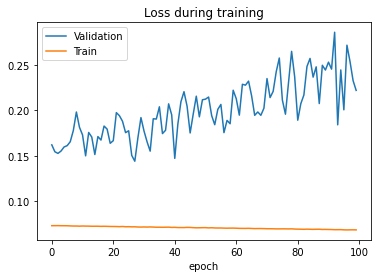

training model old[4] h=8,mlp=4,d=True
epoch 0 batch 200 loss=0.0448, MTL=0.162, MVL=45.8				
saving model MTL=0.1695036393154515, MVL=8.347606236817407
*epoch 1 batch 400 loss=0.0758, MTL=0.0905, MVL=8.35				
saving model MTL=0.08835881004332129, MVL=2.242625186677839
*epoch 2 batch 600 loss=0.0507, MTL=0.0595, MVL=2.24				
epoch 3 batch 800 loss=0.0377, MTL=0.0425, MVL=16.8				
epoch 4 batch 1000 loss=0.0345, MTL=0.0356, MVL=30.2				
saving model MTL=0.07424871647439965, MVL=0.20004569824601784
*epoch 5 batch 1200 loss=0.074, MTL=0.102, MVL=0.2				
epoch 6 batch 1400 loss=0.0494, MTL=0.0542, MVL=7.77				
epoch 7 batch 1600 loss=0.106, MTL=0.133, MVL=14.3				
epoch 8 batch 1800 loss=0.0591, MTL=0.0589, MVL=6.02				
epoch 9 batch 2000 loss=0.0437, MTL=0.0447, MVL=17.6				
epoch 10 batch 2200 loss=0.0386, MTL=0.0384, MVL=26.7				
epoch 11 batch 2400 loss=0.0358, MTL=0.0356, MVL=34.5				
epoch 11 batch 2600 loss=0.0854, MTL=0.0688, MVL=34.5				
epoch 12 batch 2800 loss=0.0519, MTL=0.0613

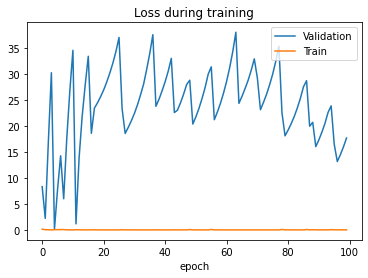

epoch 0 batch 200 loss=0.0318, MTL=0.059, MVL=0.2				
epoch 1 batch 400 loss=0.039, MTL=0.0366, MVL=32.5				
epoch 2 batch 600 loss=0.0345, MTL=0.0359, MVL=31.4				
epoch 3 batch 800 loss=0.0402, MTL=0.0416, MVL=33.0				
epoch 4 batch 1000 loss=0.04, MTL=0.0411, MVL=22.5				
epoch 5 batch 1200 loss=0.0421, MTL=0.0395, MVL=24.3				
epoch 6 batch 1400 loss=0.0408, MTL=0.0385, MVL=26.4				
epoch 7 batch 1600 loss=0.0381, MTL=0.0376, MVL=28.6				
epoch 8 batch 1800 loss=0.0358, MTL=0.0366, MVL=31.0				
epoch 9 batch 2000 loss=0.0405, MTL=0.0358, MVL=33.5				
epoch 10 batch 2200 loss=0.0412, MTL=0.0435, MVL=20.0				
epoch 11 batch 2400 loss=0.0443, MTL=0.0433, MVL=22.2				
epoch 11 batch 2600 loss=0.0393, MTL=0.0406, MVL=22.2				
epoch 12 batch 2800 loss=0.0387, MTL=0.0393, MVL=24.6				
epoch 13 batch 3000 loss=0.0373, MTL=0.0379, MVL=27.1				
epoch 14 batch 3200 loss=0.0342, MTL=0.0368, MVL=29.7				
epoch 15 batch 3400 loss=0.0344, MTL=0.0355, MVL=32.4				
epoch 16 batch 3600 loss=0.036, M

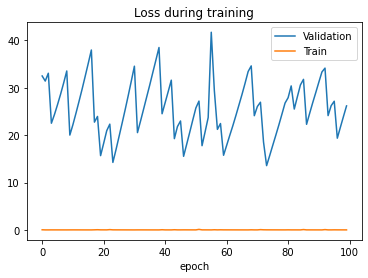

epoch 0 batch 200 loss=0.107, MTL=0.123, MVL=0.2				
saving model MTL=0.12138948647664227, MVL=0.15903511447984664
*epoch 1 batch 400 loss=0.0846, MTL=0.0912, MVL=0.159				
epoch 2 batch 600 loss=0.0646, MTL=0.0723, MVL=0.846				
epoch 3 batch 800 loss=0.0571, MTL=0.0601, MVL=5.27				
epoch 4 batch 1000 loss=0.0534, MTL=0.0517, MVL=10.4				
epoch 5 batch 1200 loss=0.0411, MTL=0.0452, MVL=15.8				
epoch 6 batch 1400 loss=0.044, MTL=0.043, MVL=21.3				
epoch 7 batch 1600 loss=0.046, MTL=0.0431, MVL=20.1				
epoch 8 batch 1800 loss=0.0388, MTL=0.0426, MVL=20.5				
epoch 9 batch 2000 loss=0.0453, MTL=0.0425, MVL=20.9				
epoch 10 batch 2200 loss=0.0406, MTL=0.0418, MVL=21.4				
epoch 11 batch 2400 loss=0.042, MTL=0.0413, MVL=21.9				
epoch 11 batch 2600 loss=0.0398, MTL=0.0415, MVL=21.9				
epoch 12 batch 2800 loss=0.0412, MTL=0.0409, MVL=22.4				
epoch 13 batch 3000 loss=0.0451, MTL=0.0407, MVL=23.0				
epoch 14 batch 3200 loss=0.0409, MTL=0.0404, MVL=23.7				
epoch 15 batch 3400 loss=0.0

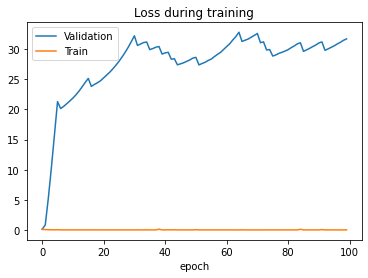

epoch 0 batch 200 loss=0.106, MTL=0.101, MVL=0.159				
saving model MTL=0.10072901954344653, MVL=0.1555874381886154
*epoch 1 batch 400 loss=0.0975, MTL=0.0973, MVL=0.156				
saving model MTL=0.09740765170629966, MVL=0.15225695195745248
*epoch 2 batch 600 loss=0.0952, MTL=0.0943, MVL=0.152				
epoch 3 batch 800 loss=0.0854, MTL=0.0916, MVL=0.167				
epoch 4 batch 1000 loss=0.0854, MTL=0.0888, MVL=0.162				
epoch 5 batch 1200 loss=0.0786, MTL=0.0861, MVL=0.22				
epoch 6 batch 1400 loss=0.0846, MTL=0.0836, MVL=0.403				
epoch 7 batch 1600 loss=0.0806, MTL=0.0811, MVL=0.487				
epoch 8 batch 1800 loss=0.0792, MTL=0.0798, MVL=0.84				
epoch 9 batch 2000 loss=0.0749, MTL=0.0769, MVL=1.22				
epoch 10 batch 2200 loss=0.0709, MTL=0.0734, MVL=1.65				
epoch 11 batch 2400 loss=0.072, MTL=0.0731, MVL=2.19				
epoch 11 batch 2600 loss=0.076, MTL=0.0716, MVL=2.19				
epoch 12 batch 2800 loss=0.0663, MTL=0.0699, MVL=2.72				
epoch 13 batch 3000 loss=0.0649, MTL=0.0683, MVL=3.35				
epoch 14 batch 3

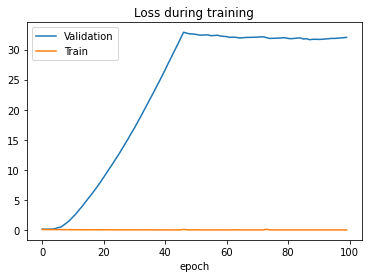

epoch 0 batch 200 loss=0.0937, MTL=0.0954, MVL=0.152				
saving model MTL=0.09542808842358239, MVL=0.1520310010089249
*epoch 1 batch 400 loss=0.0972, MTL=0.095, MVL=0.152				
saving model MTL=0.09499001899443635, MVL=0.15164563548369486
*epoch 2 batch 600 loss=0.0832, MTL=0.0948, MVL=0.152				
epoch 3 batch 800 loss=0.0951, MTL=0.0945, MVL=0.153				
epoch 4 batch 1000 loss=0.0889, MTL=0.0943, MVL=0.161				
epoch 5 batch 1200 loss=0.0938, MTL=0.0938, MVL=0.155				
saving model MTL=0.09373783022848838, MVL=0.15042911176798773
*epoch 6 batch 1400 loss=0.0942, MTL=0.0937, MVL=0.15				
saving model MTL=0.09336465795379166, MVL=0.15008342583648493
*epoch 7 batch 1600 loss=0.0935, MTL=0.0932, MVL=0.15				
epoch 8 batch 1800 loss=0.097, MTL=0.0929, MVL=0.155				
epoch 9 batch 2000 loss=0.0898, MTL=0.0924, MVL=0.173				
saving model MTL=0.09249677133122715, MVL=0.14912565907493966
*epoch 10 batch 2200 loss=0.0866, MTL=0.0931, MVL=0.149				
saving model MTL=0.09218103766714761, MVL=0.14883678052

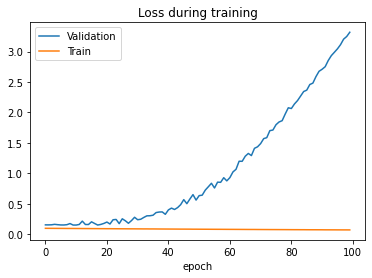

In [172]:
train_models(models_3, wg_tmp, patience=500, criterion=custom_criterion)

torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])


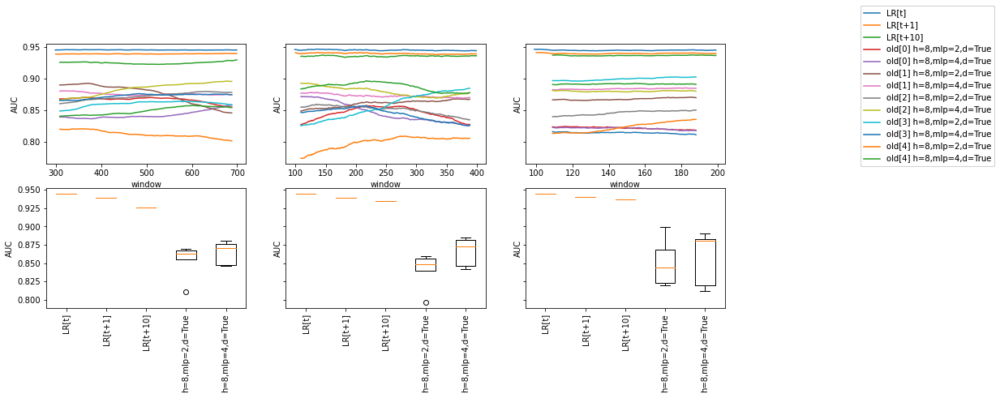

In [181]:
def plot_only(models, wg, ylim=None):
    _, axs = plt.subplots(ncols=3, nrows=2, sharey='row', figsize=(15,6))
    plot('train', models, wg, axs=[axs[0][0], axs[1][0]], ylim=ylim)
    plot('val',   models, wg, axs=[axs[0][1], axs[1][1]], ylim=ylim)
    plot('test',  models, wg, axs=[axs[0][2], axs[1][2]], ylim=ylim)
plot_only(models_4, wg_tmp)

torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])


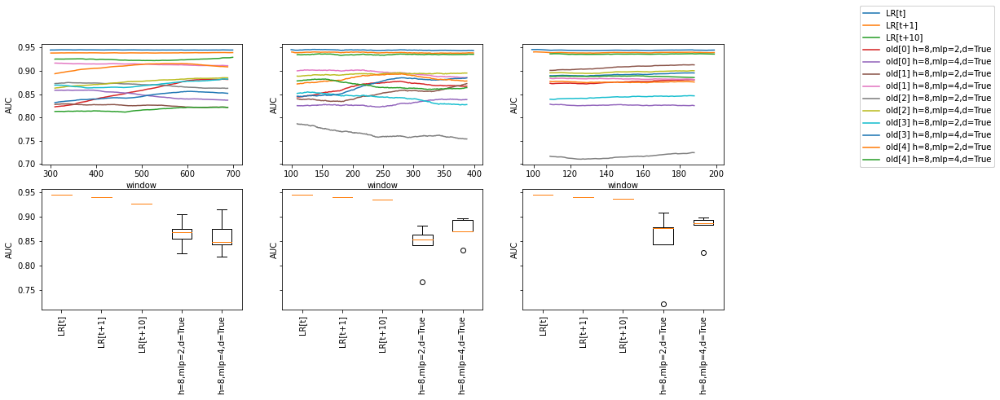

In [173]:
def plot_only(models, wg, ylim=None):
    _, axs = plt.subplots(ncols=3, nrows=2, sharey='row', figsize=(15,6))
    plot('train', models, wg, axs=[axs[0][0], axs[1][0]], ylim=ylim)
    plot('val',   models, wg, axs=[axs[0][1], axs[1][1]], ylim=ylim)
    plot('test',  models, wg, axs=[axs[0][2], axs[1][2]], ylim=ylim)
plot_only(models_3, wg_tmp)

torch.Size([1, 10, 408])
torch.Size([1, 10, 408])
torch.Size([1, 10, 408])


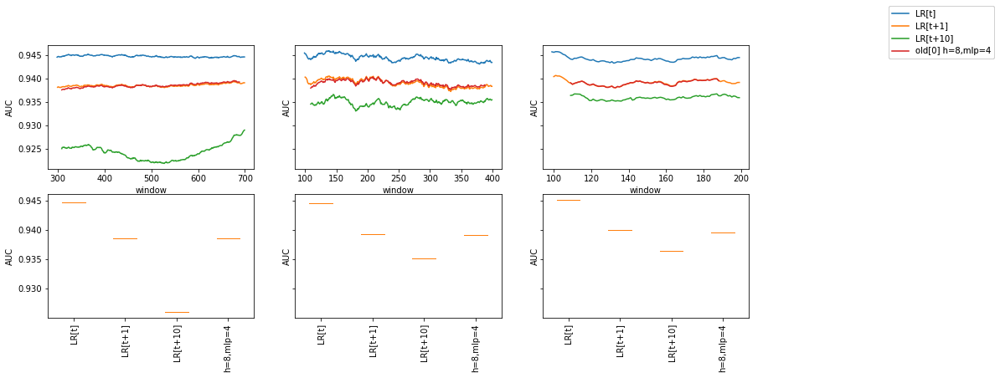

In [104]:
def plot_only(models, wg, ylim=None):
    _, axs = plt.subplots(ncols=3, nrows=2, sharey='row', figsize=(15,6))
    plot('train', models, wg, axs=[axs[0][0], axs[1][0]], ylim=ylim)
    plot('val',   models, wg, axs=[axs[0][1], axs[1][1]], ylim=ylim)
    plot('test',  models, wg, axs=[axs[0][2], axs[1][2]], ylim=ylim)
plot_only(models_3[1:2], wg_tmp)

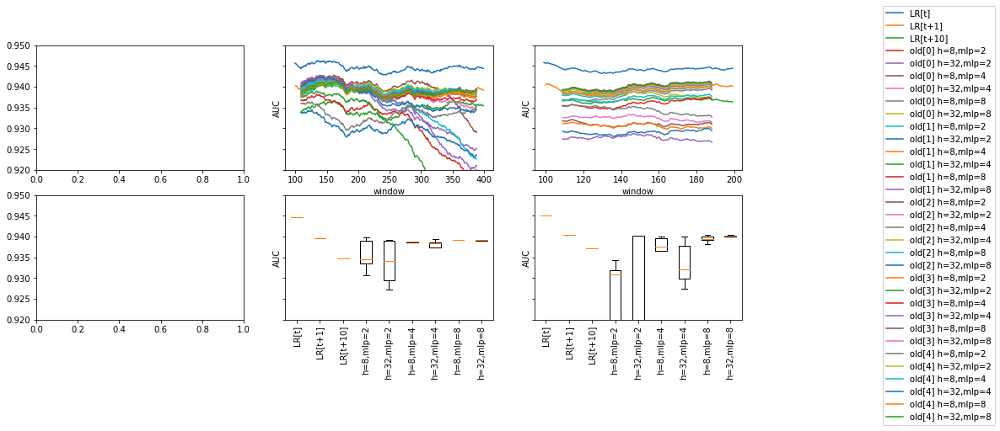

In [436]:
def plot_only(models, wg, ylim=None):
    _, axs = plt.subplots(ncols=3, nrows=2, sharey='row', figsize=(15,6))
    plot('train', models, wg, axs=[axs[0][0], axs[1][0]], ylim=ylim)
    plot('val',   models, wg, axs=[axs[0][1], axs[1][1]], ylim=ylim)
    plot('test',  models, wg, axs=[axs[0][2], axs[1][2]], ylim=ylim)
plot_only(models_3, wg_tmp, ylim=(0.92, 0.95)) 

In [372]:
wg_tmp.reverse_train = False
wg_tmp.shuffle_input = False
wg_tmp.shuffle_output = False
wg_tmp.double_target = True
m = m_agg.DummyNet()
m.label_stride = 1
m.name = "DUMMY"
wg_tmp.input_sequence_length = 32
m=m_agg.LrConvOld(conv_features=agg_dim*bins, conv_width=10, lr_features=10+1, 
                                conv_hidden=8, mlp_layers=4)
m.label_stride = 1
m.name=f'old[{k}] h={h},mlp={mlp}'
wg_tmp.input_sequence_length = 10

wg_tmp.input_sequence_length = 28
m = m_agg.LrNConv(ts_features=agg_dim*bins, lr_features=10+1,
                  conv_layers=3, conv_width=8,
                  ts_conv_pool_width=3, ts_conv_pool_stride=1,
                  lr_conv_pool_width=3, lr_conv_pool_stride=1,
                  ts_conv_fc_layers=1, lr_conv_fc_layers=1,
                  ts_conv_out_feature_div=2, lr_conv_out_feature_div=2,
                  mlp_width=16, mlp_layers=3,
                  out_features=1)
m.label_stride = 1
m.name=f'old[{k}] h={h},mlp={mlp}'

train_models([m], wg_tmp, criterion=modified_criterion, patience=15)
wg_tmp.input_sequence_length = 10


training model old[4] h=32,mlp=8
torch.Size([32, 1, 11])
torch.Size([32, 1, 11])
torch.Size([32, 1, 11])
torch.Size([32, 1, 11])
torch.Size([32, 1, 11])
torch.Size([32, 1, 11])
torch.Size([32, 1, 11])
torch.Size([32, 1, 11])
torch.Size([32, 1, 11])
torch.Size([32, 1, 11])
torch.Size([32, 1, 11])
torch.Size([32, 1, 11])
torch.Size([32, 1, 11])
torch.Size([32, 1, 11])
torch.Size([32, 1, 11])
torch.Size([32, 1, 11])
torch.Size([32, 1, 11])
torch.Size([32, 1, 11])
torch.Size([32, 1, 11])
torch.Size([32, 1, 11])
torch.Size([32, 1, 11])
torch.Size([32, 1, 11])
torch.Size([32, 1, 11])
torch.Size([32, 1, 11])
torch.Size([32, 1, 11])
torch.Size([32, 1, 11])
torch.Size([32, 1, 11])
torch.Size([32, 1, 11])
torch.Size([32, 1, 11])
torch.Size([32, 1, 11])
torch.Size([32, 1, 11])
torch.Size([32, 1, 11])
torch.Size([32, 1, 11])
torch.Size([32, 1, 11])
torch.Size([32, 1, 11])
torch.Size([32, 1, 11])
torch.Size([32, 1, 11])
torch.Size([32, 1, 11])
torch.Size([32, 1, 11])
torch.Size([32, 1, 11])
torch.S

KeyboardInterrupt: 

<Figure size 432x288 with 0 Axes>

torch.Size([1, 8, 408])


RuntimeError: Given groups=1, weight of size [102, 204, 8], expected input[1, 408, 8] to have 204 channels, but got 408 channels instead

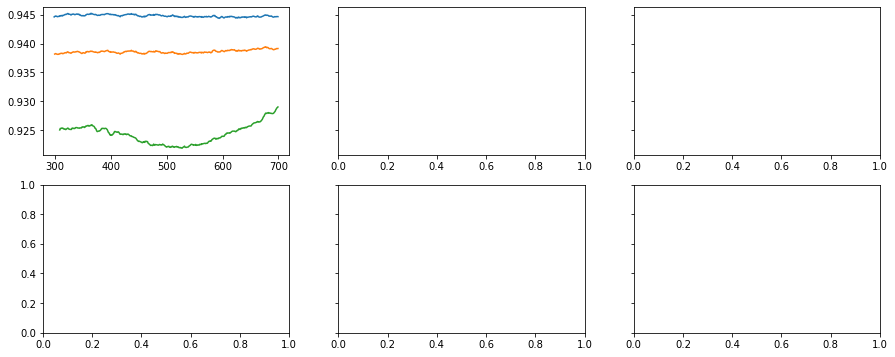

In [477]:
     ((8, 2),  'old'),def plot_only(models, wg, ylim=None):
    _, axs = plt.subplots(ncols=3, nrows=2, sharey='row', figsize=(15,6))
    plot('train', models, wg, axs=[axs[0][0], axs[1][0]], ylim=ylim)
    plot('val',   models, wg, axs=[axs[0][1], axs[1][1]], ylim=ylim)
    plot('test',  models, wg, axs=[axs[0][2], axs[1][2]], ylim=ylim)
plot_only([m], wg_tmp)#, ylim=(0.92, 0.95))

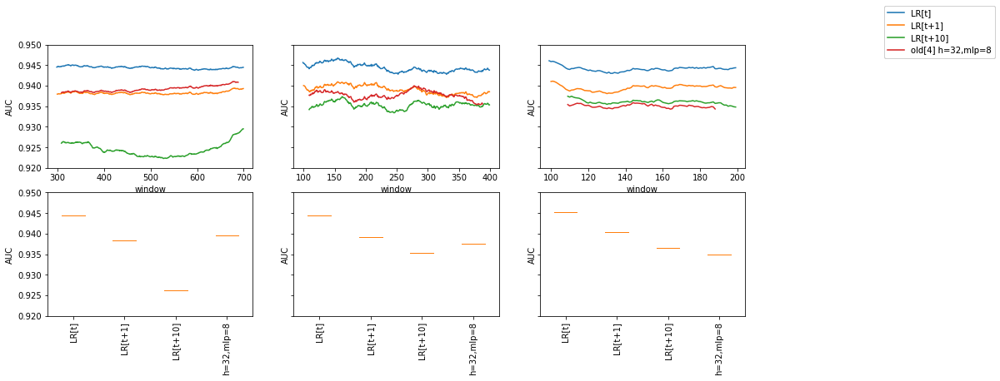

In [341]:
def plot_only(models, wg, ylim=None):
    _, axs = plt.subplots(ncols=3, nrows=2, sharey='row', figsize=(15,6))
    plot('train', models, wg, axs=[axs[0][0], axs[1][0]], ylim=ylim)
    plot('val',   models, wg, axs=[axs[0][1], axs[1][1]], ylim=ylim)
    plot('test',  models, wg, axs=[axs[0][2], axs[1][2]], ylim=ylim)
plot_only([m], wg_tmp, ylim=(0.92, 0.95)) 

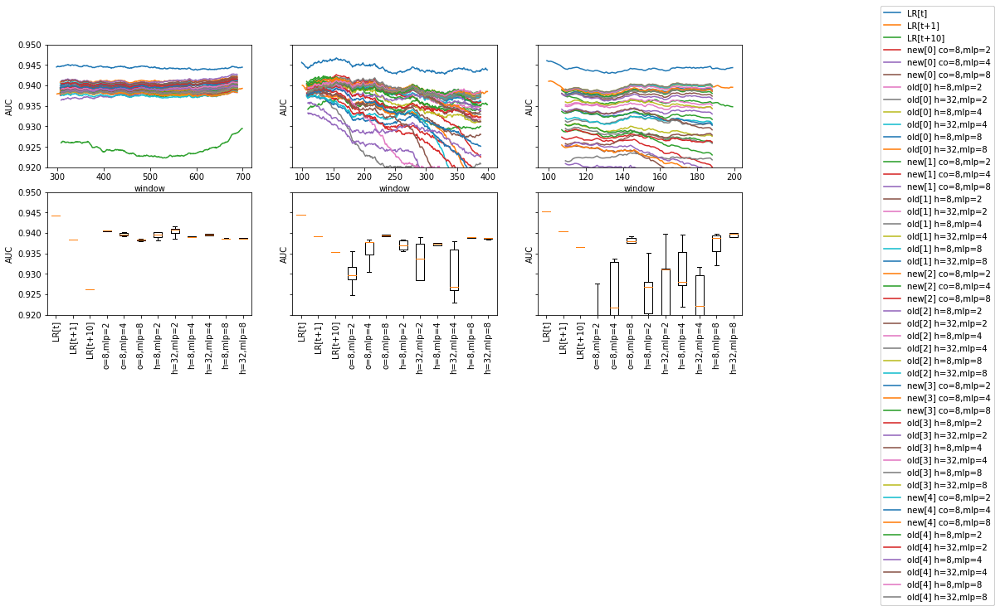

In [283]:
def plot_only(models, wg, ylim=None):
    _, axs = plt.subplots(ncols=3, nrows=2, sharey='row', figsize=(15,6))
    plot('train', models, wg, axs=[axs[0][0], axs[1][0]], ylim=ylim)
    plot('val',   models, wg, axs=[axs[0][1], axs[1][1]], ylim=ylim)
    plot('test',  models, wg, axs=[axs[0][2], axs[1][2]], ylim=ylim)
plot_only(models_2, wg_tmp, ylim=(0.92, 0.95)) 

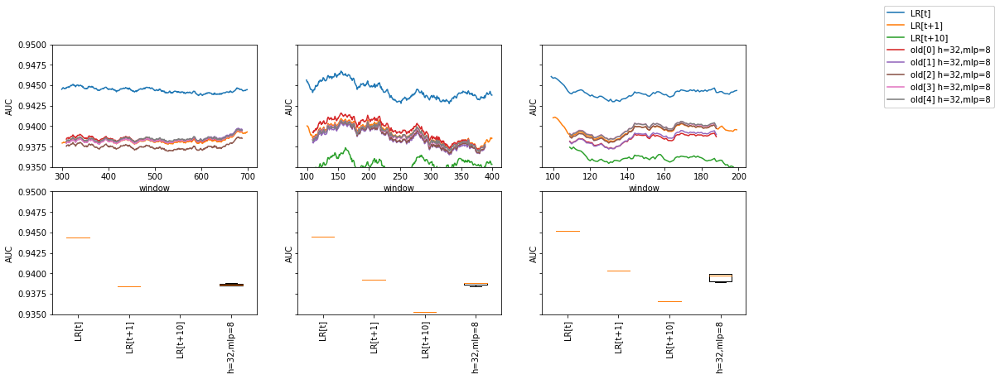

In [301]:
plot_only([m for m in models_2 if 'h=32,mlp=8' in m.name], wg_tmp, ylim=(0.935, 0.95)) 

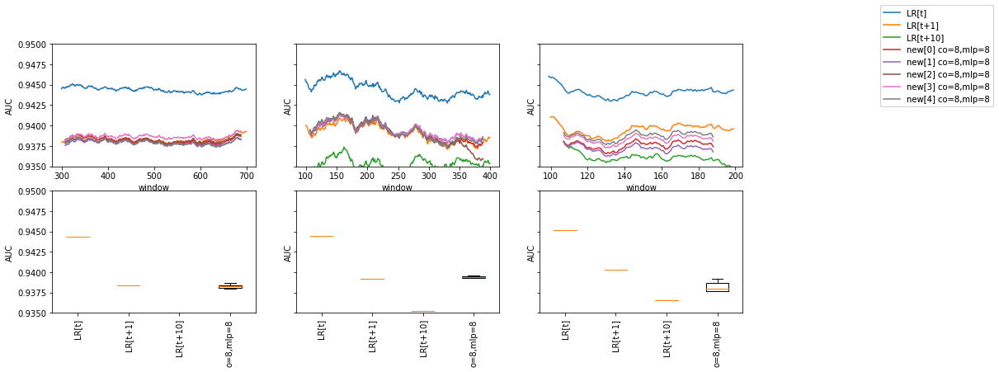

In [302]:
plot_only([m for m in models_2 if 'o=8,mlp=8' in m.name], wg_tmp, ylim=(0.935, 0.95)) 

In [172]:
m = m_agg.TransformerModel(ninp=256, nhead=2, nhid=2, nlayers=2, nout=11)


m.label_stride = 1
m.name=f'enc[x] h=0'
# models_2.append(m)

training model enc[x] h=0
epoch 0 batch 200 loss=0.0198, MTL=0.048, MVL=1.67				
*epoch 1 batch 400 loss=0.0507, MTL=0.111, MVL=0.335				
*epoch 2 batch 600 loss=0.0337, MTL=0.0397, MVL=0.295				
epoch 3 batch 800 loss=0.0281, MTL=0.0316, MVL=0.334				
epoch 4 batch 1000 loss=0.0266, MTL=0.0278, MVL=0.381				
epoch 5 batch 1200 loss=0.024, MTL=0.0254, MVL=0.425				
epoch 6 batch 1400 loss=0.0232, MTL=0.0239, MVL=0.466				
epoch 7 batch 1600 loss=0.0214, MTL=0.0228, MVL=0.551				


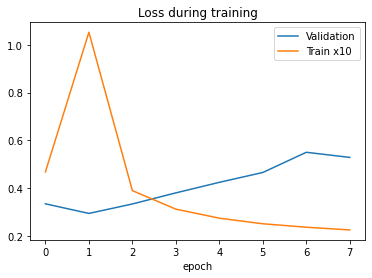

epoch 0 batch 200 loss=0.0179, MTL=0.0208, MVL=0.295				
epoch 1 batch 400 loss=0.037, MTL=0.0426, MVL=0.326				
epoch 2 batch 600 loss=0.0347, MTL=0.0353, MVL=0.354				
epoch 3 batch 800 loss=0.0304, MTL=0.0313, MVL=0.384				
epoch 4 batch 1000 loss=0.0273, MTL=0.0287, MVL=0.408				
epoch 5 batch 1200 loss=0.0261, MTL=0.0268, MVL=0.438				


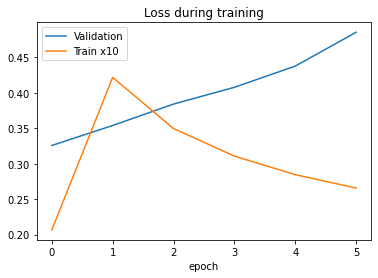

In [173]:
m.label_stride = 9
train_models([m], wg_tmp)

KeyboardInterrupt: 

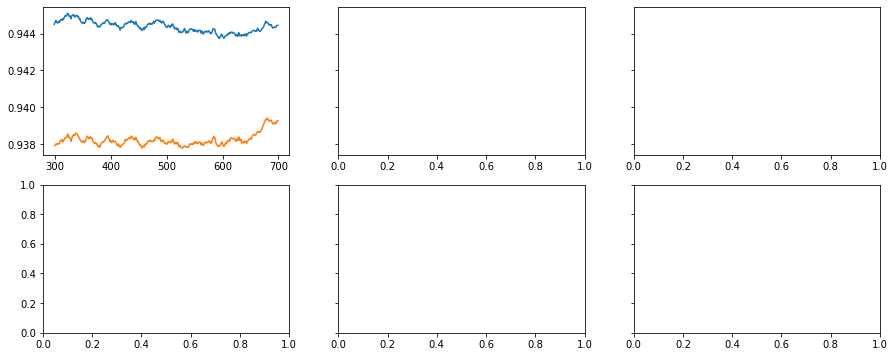

In [318]:
def plot_only(models, wg):
    _, axs = plt.subplots(ncols=3, nrows=2, sharey='row', figsize=(15,6))
    plot('train', models, wg, axs=[axs[0][0], axs[1][0]])
    plot('val',   models, wg, axs=[axs[0][1], axs[1][1]])
    plot('test',  models, wg, axs=[axs[0][2], axs[1][2]])
plot_only(m, wg_tmp)

In [444]:
def train_lr_decay(model, window, handler=None, criterion=None, patience=5):
    handler = None
    for lr in [0.01, 0.001, 0.0001]:#, 0.000001, 0.0000005]:
        if handler:
            handler.best()
        plt.figure()
        if criterion is None:
            handler = train.train_window_model(model, window, log_every=200, max_epochs=100, 
                                           patience=patience,
                                               lr=lr, model_handler=handler, optimize=model.name!='DUMMY')
        else:
            handler = train.train_window_model(model, window, log_every=200, max_epochs=100, criterion=criterion,
                                           patience=patience,
                                               lr=lr, model_handler=handler, optimize=model.name!='DUMMY')
        
        plt.show()
        
    return handler        

def train_models(models, wg, criterion=None, patience=5):
    for model in models:
        print(f'training model {model.name}')
        handler = train_lr_decay(model, wg, criterion=criterion, patience=patience)
        handler.best()
# wg_tmp.reverse_train=False
# wg_tmp.shuffle_input=False
# wg_tmp.shuffle_output=False
# train_models([models_2[-1]], wg_tmp)

In [129]:
models_2

[LrConvOld(
   (conv): Sequential(
     (0): Sequential(
       (0): Sequential(
         (0): SwapDims()
         (1): Conv1d(204, 16, kernel_size=(10,), stride=(1,))
         (2): SwapDims()
       )
       (1): Linear(in_features=16, out_features=16, bias=True)
     )
     (1): ReLU()
   )
   (mlp): Sequential(
     (0): Linear(in_features=27, out_features=27, bias=True)
     (1): ReLU()
     (2): Linear(in_features=27, out_features=27, bias=True)
     (3): ReLU()
     (4): Linear(in_features=27, out_features=27, bias=True)
     (5): ReLU()
     (6): Linear(in_features=27, out_features=27, bias=True)
     (7): ReLU()
     (8): Linear(in_features=27, out_features=27, bias=True)
     (9): ReLU()
     (10): Linear(in_features=27, out_features=27, bias=True)
     (11): ReLU()
     (12): Linear(in_features=27, out_features=27, bias=True)
     (13): ReLU()
     (14): Linear(in_features=27, out_features=27, bias=True)
     (15): ReLU()
     (16): Linear(in_features=27, out_features=27, bia

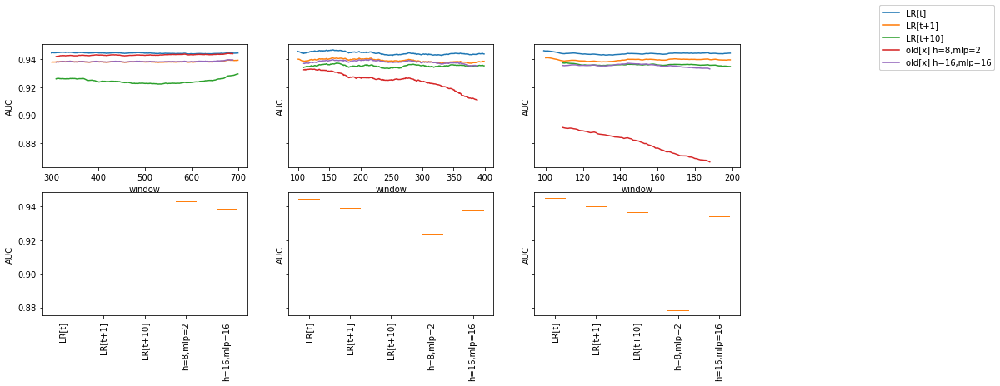

In [135]:
def plot_only(models, wg):
    _, axs = plt.subplots(ncols=3, nrows=2, sharey='row', figsize=(15,6))
    plot('train', models, wg, axs=[axs[0][0], axs[1][0]])
    plot('val',   models, wg, axs=[axs[0][1], axs[1][1]])
    plot('test',  models, wg, axs=[axs[0][2], axs[1][2]])
plot_only(models_2[-2:], wg_tmp)

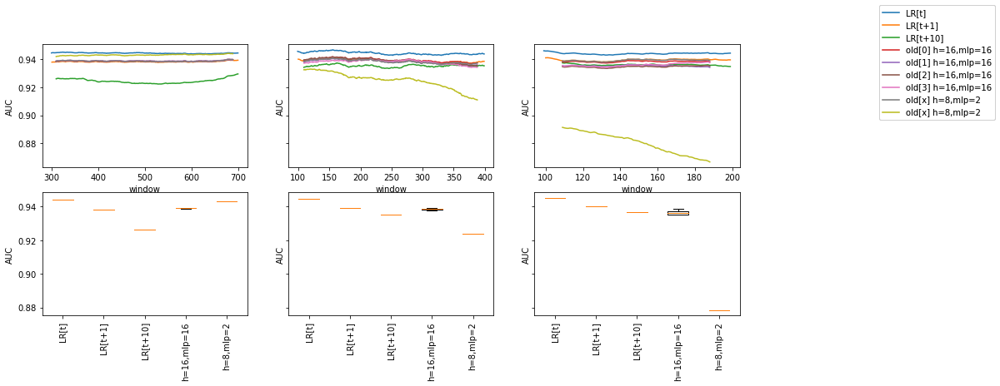

In [128]:
def plot_only(models, wg):
    _, axs = plt.subplots(ncols=3, nrows=2, sharey='row', figsize=(15,6))
    plot('train', models, wg, axs=[axs[0][0], axs[1][0]])
    plot('val',   models, wg, axs=[axs[0][1], axs[1][1]])
    plot('test',  models, wg, axs=[axs[0][2], axs[1][2]])
plot_only(models_2, wg_tmp)

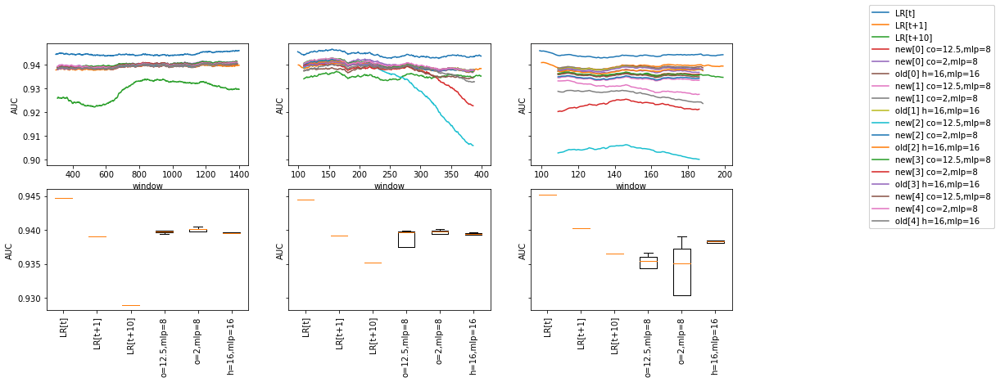

In [104]:
def plot_only(models, wg):
    _, axs = plt.subplots(ncols=3, nrows=2, sharey='row', figsize=(15,6))
    plot('train', models, wg, axs=[axs[0][0], axs[1][0]])
    plot('val',   models, wg, axs=[axs[0][1], axs[1][1]])
    plot('test',  models, wg, axs=[axs[0][2], axs[1][2]])
plot_only(models_2, wg_tmp)

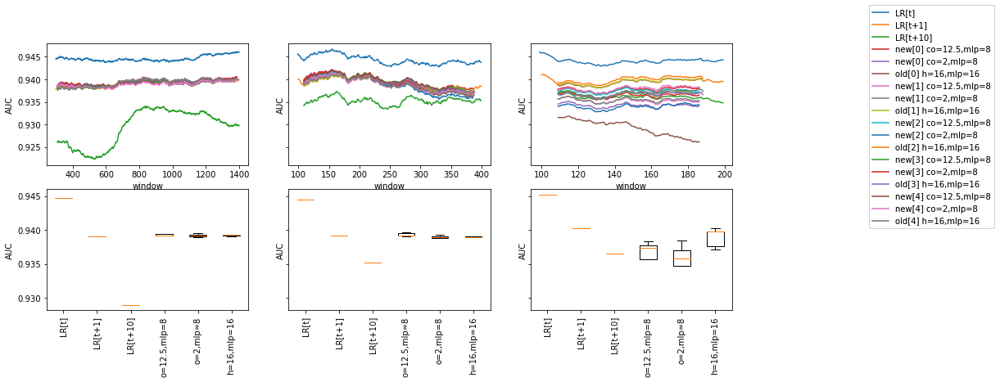

In [96]:
def plot_only(models, wg):
    _, axs = plt.subplots(ncols=3, nrows=2, sharey='row', figsize=(15,6))
    plot('train', models, wg, axs=[axs[0][0], axs[1][0]])
    plot('val',   models, wg, axs=[axs[0][1], axs[1][1]])
    plot('test',  models, wg, axs=[axs[0][2], axs[1][2]])
plot_only(models_2, wg_tmp)

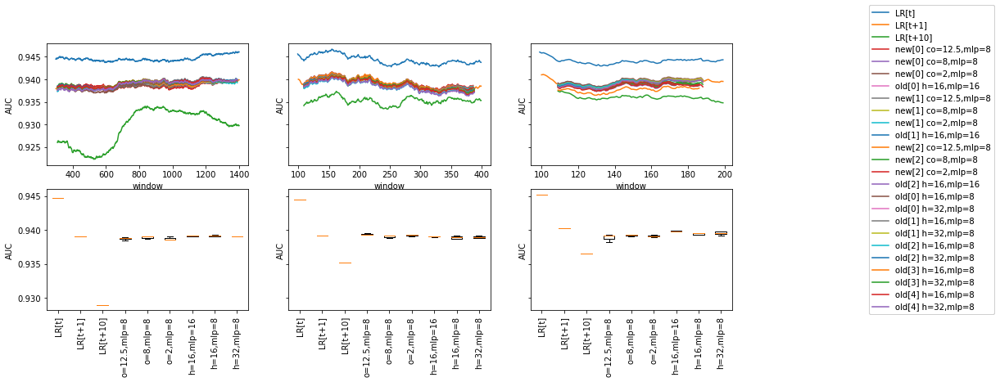

In [89]:
def plot_only(models, wg):
    _, axs = plt.subplots(ncols=3, nrows=2, sharey='row', figsize=(15,6))
    plot('train', models, wg, axs=[axs[0][0], axs[1][0]])
    plot('val',   models, wg, axs=[axs[0][1], axs[1][1]])
    plot('test',  models, wg, axs=[axs[0][2], axs[1][2]])
plot_only(models_2[:12] + models, wg_tmp)

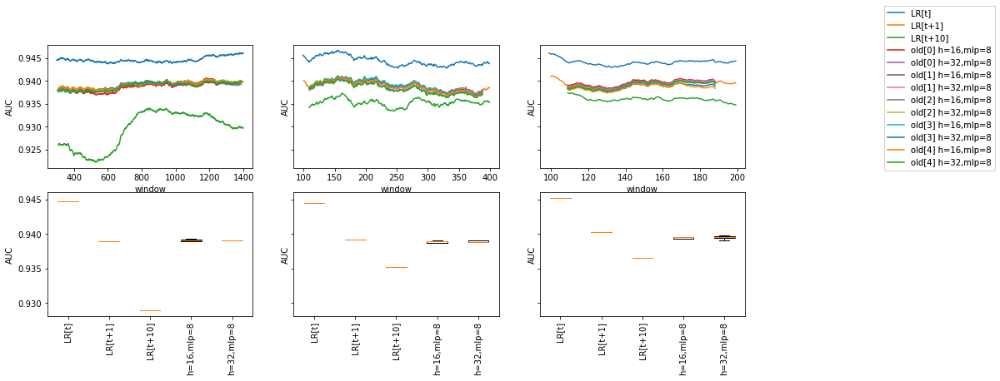

In [88]:
def plot_only(models, wg):
    _, axs = plt.subplots(ncols=3, nrows=2, sharey='row', figsize=(15,6))
    plot('train', models, wg, axs=[axs[0][0], axs[1][0]])
    plot('val',   models, wg, axs=[axs[0][1], axs[1][1]])
    plot('test',  models, wg, axs=[axs[0][2], axs[1][2]])
plot_only(models, wg_tmp)

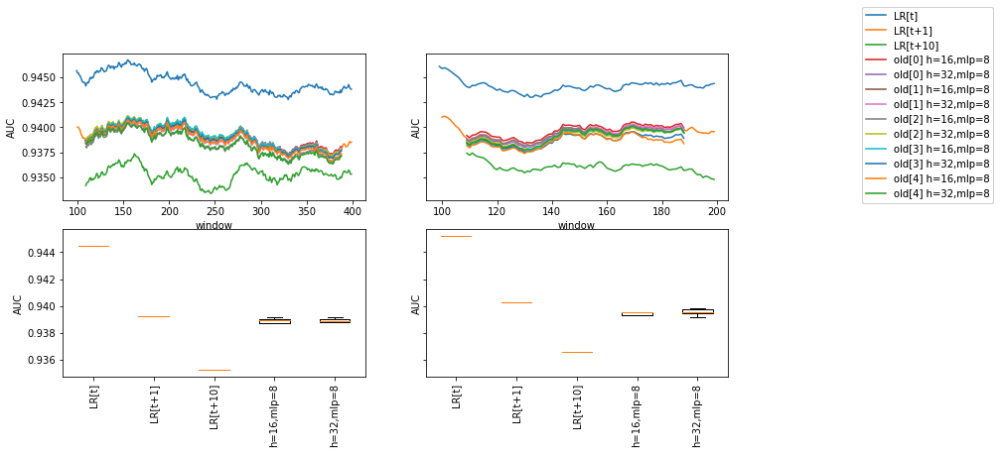

In [77]:
def plot_only(models, wg):
    _, axs = plt.subplots(ncols=2, nrows=2, sharey='row', figsize=(12,6))
    
    plot('val',   models, wg, axs=[axs[0][0], axs[1][0]])
    plot('test',  models, wg, axs=[axs[0][1], axs[1][1]])
plot_only(models, wg_tmp)

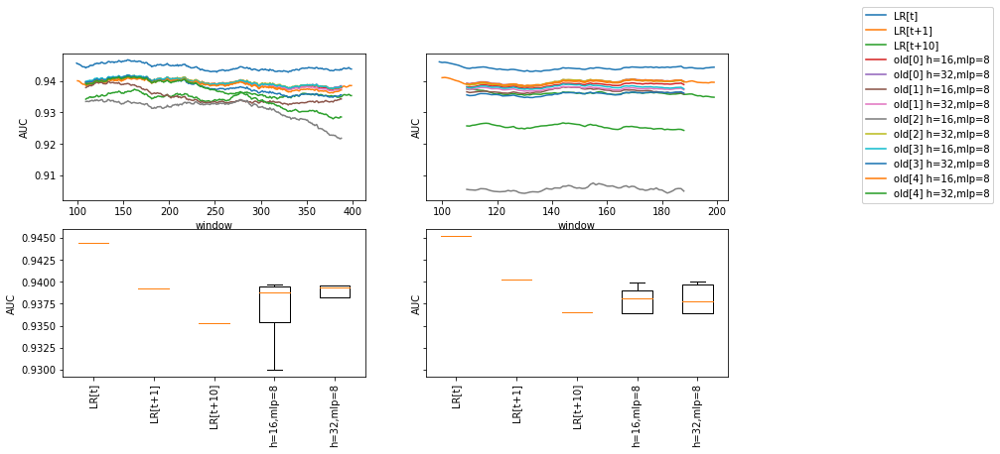

In [73]:
def plot_only(models, wg):
    _, axs = plt.subplots(ncols=2, nrows=2, sharey='row', figsize=(12,6))
    plot('val',   models, wg, axs=[axs[0][0], axs[1][0]])
    plot('test',  models, wg, axs=[axs[0][1], axs[1][1]])
plot_only(models, wg_tmp)

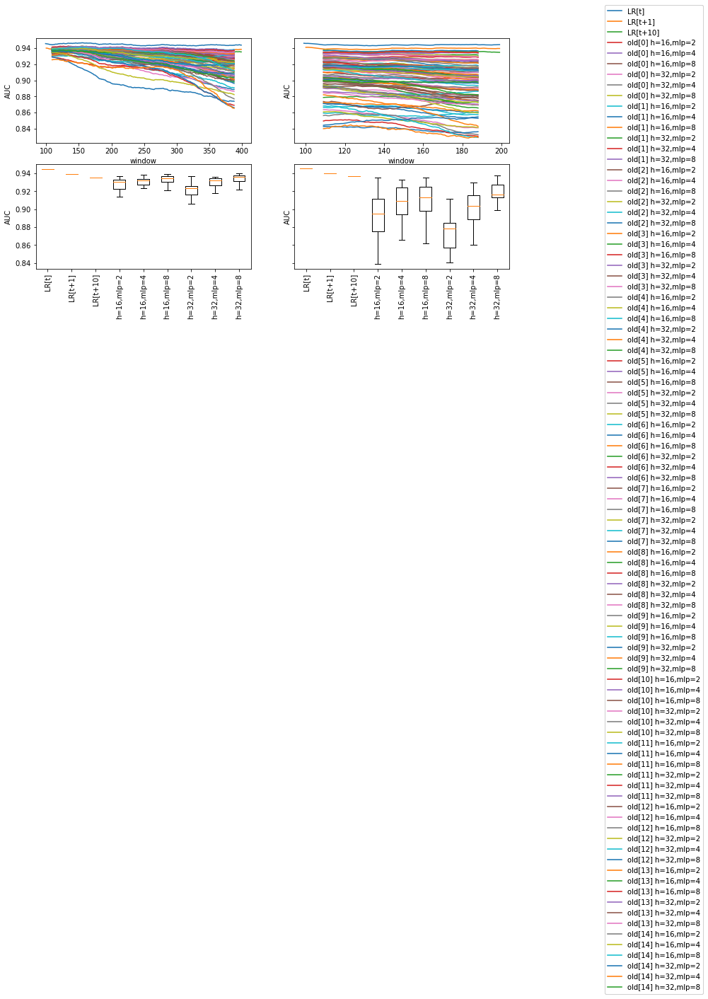

In [82]:
def plot_only(models, wg):
    _, axs = plt.subplots(ncols=2, nrows=2, sharey='row', figsize=(12,6))
    plot('val',   models, wg, axs=[axs[0][0], axs[1][0]])
    plot('test',  models, wg, axs=[axs[0][1], axs[1][1]])
plot_only(models, wg_tmp)

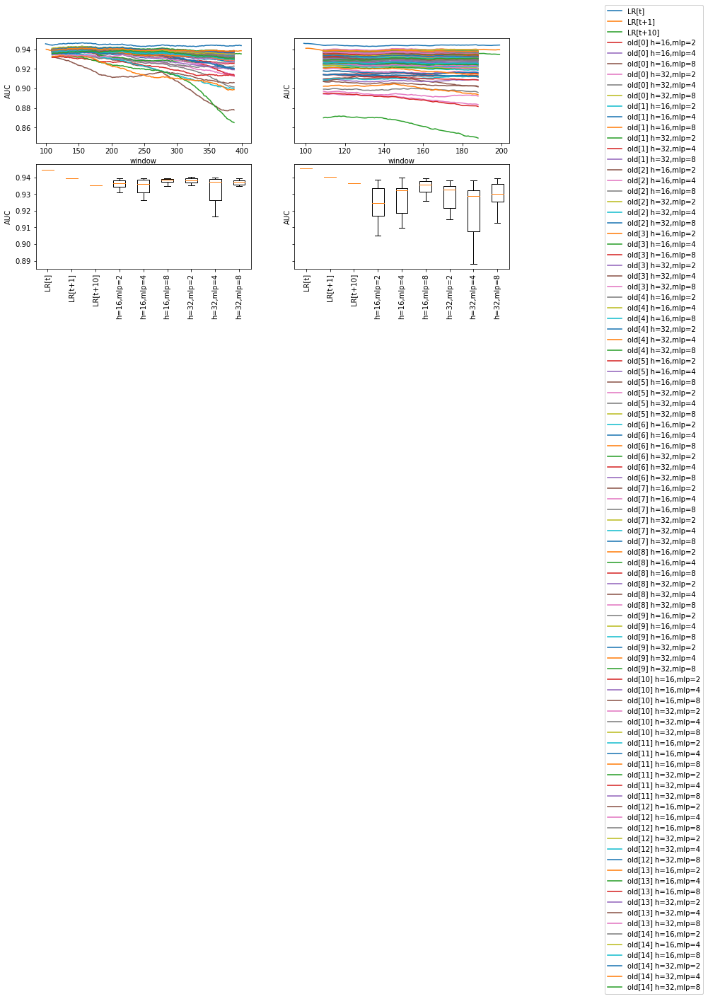

In [79]:
def plot_only(models, wg):
    _, axs = plt.subplots(ncols=2, nrows=2, sharey='row', figsize=(12,6))
    plot('val',   models, wg, axs=[axs[0][0], axs[1][0]])
    plot('test',  models, wg, axs=[axs[0][1], axs[1][1]])
plot_only(models, wg_tmp)

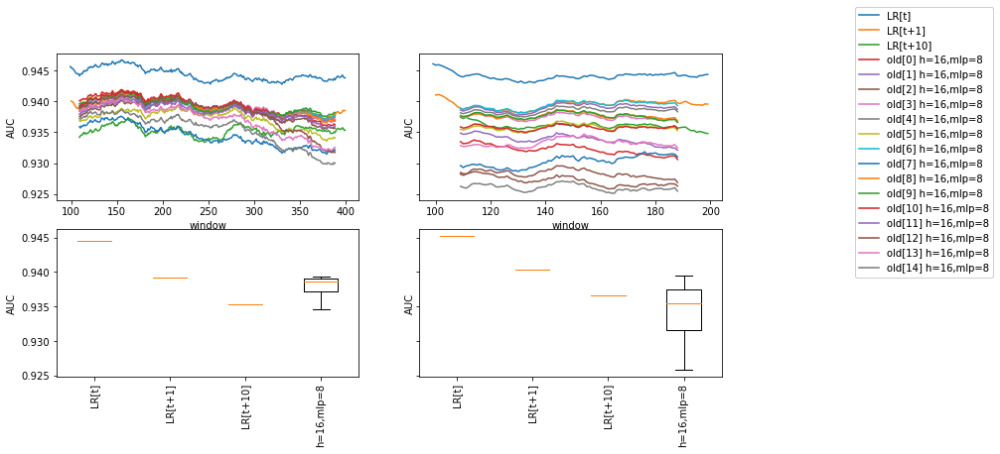

In [74]:
plot_only([model for model in models if 'h=16,mlp=8' in model.name], wg_tmp)

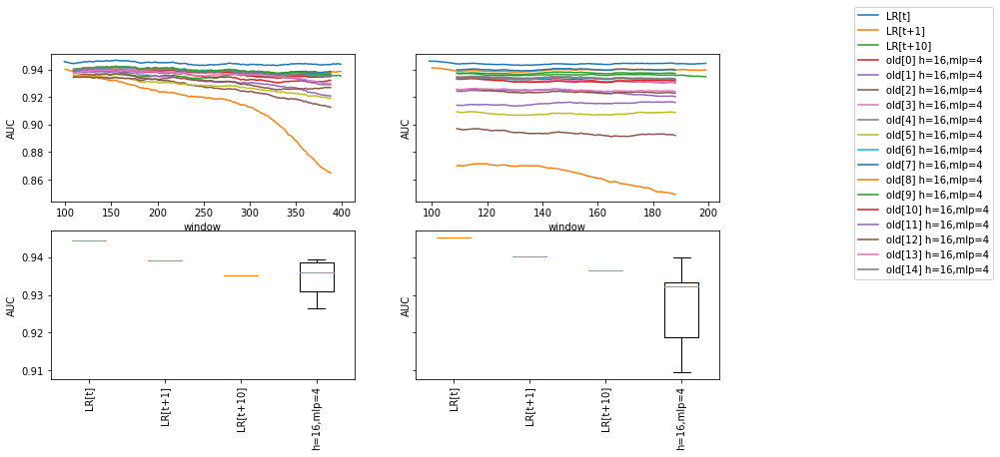

In [75]:
plot_only([model for model in models if 'h=16,mlp=4' in model.name], wg_tmp)

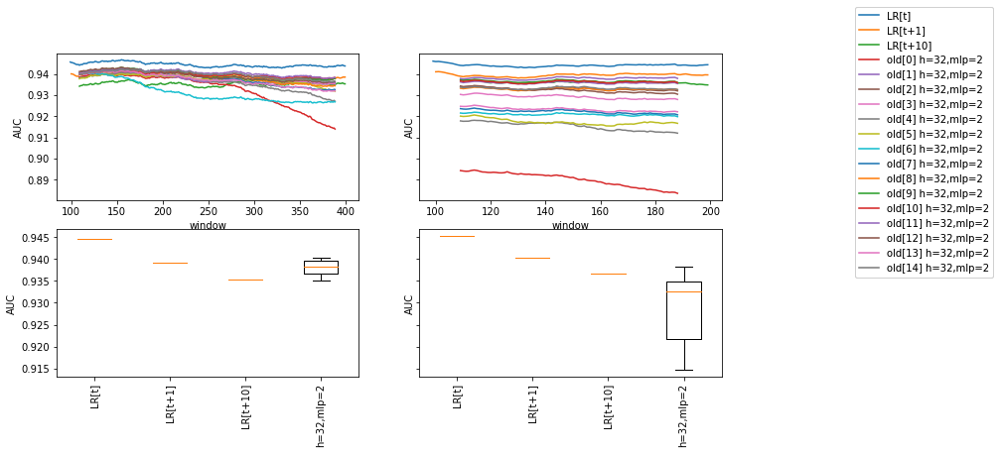

In [78]:
plot_only([model for model in models if 'h=32,mlp=2' in model.name], wg_tmp)

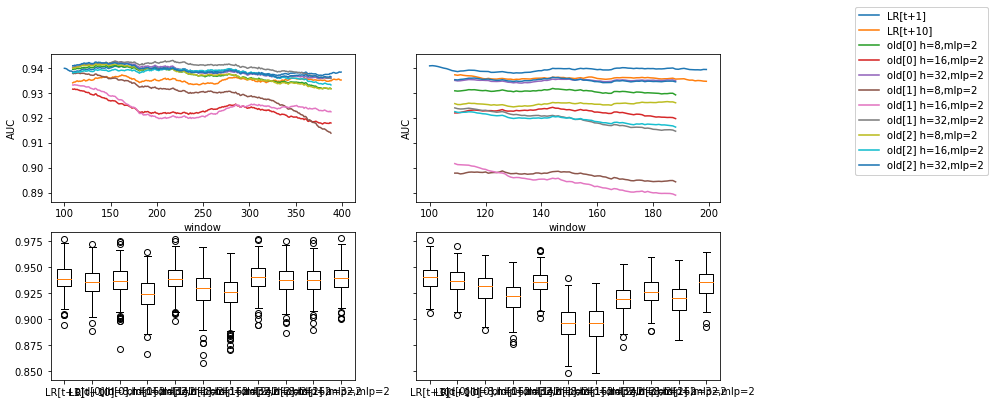

In [440]:
def plot_only(models, wg):
    _, axs = plt.subplots(ncols=2, nrows=2, sharey='row', figsize=(12,6))
    plot('val',   models, wg,axs=[axs[0][0], axs[1][0]])
    plot('test',  models, wg,axs=[axs[0][1], axs[1][1]])
plot_only(models, wg_tmp)

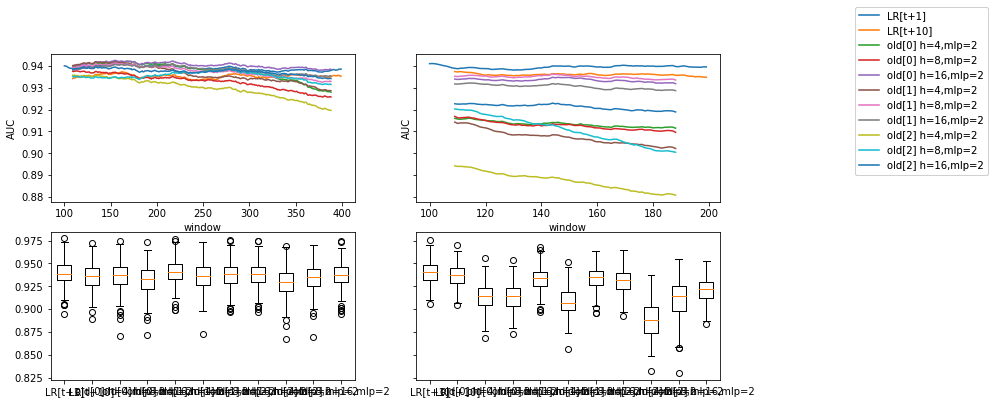

In [437]:
def plot_only(models, wg):
    _, axs = plt.subplots(ncols=2, nrows=2, sharey='row', figsize=(12,6))
    plot('val',   models, wg,axs=[axs[0][0], axs[1][0]])
    plot('test',  models, wg,axs=[axs[0][1], axs[1][1]])
plot_only(models, wg_tmp)

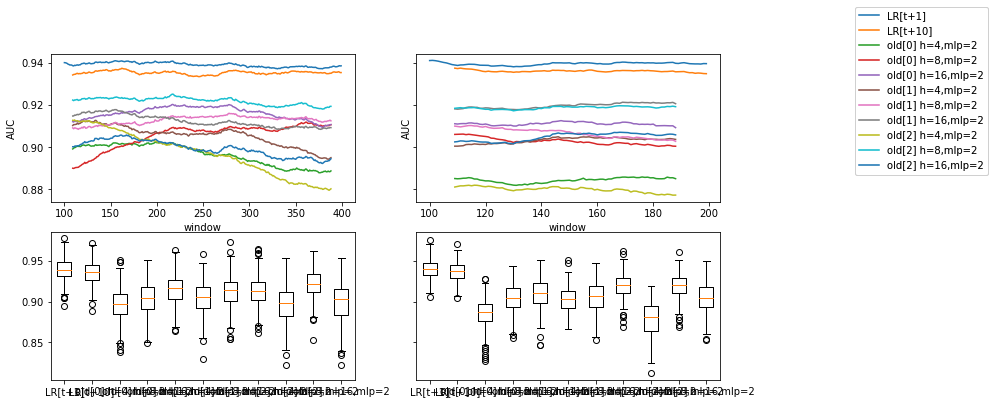

In [433]:
def plot_only(models, wg):
    _, axs = plt.subplots(ncols=2, nrows=2, sharey='row', figsize=(12,6))
    plot('val',   models, wg,axs=[axs[0][0], axs[1][0]])
    plot('test',  models, wg,axs=[axs[0][1], axs[1][1]])
plot_only(models, wg_tmp)

In [386]:
import aggets.model.aggregate as m_agg
import aggets.train as train
# +1 is for BIAS
bins=1
model_a0a = m_agg.LrConvOld(conv_features=agg_dim*bins, conv_width=10, lr_features=10+1, 
                            conv_hidden=8, mlp_layers=2)
model_a0a.label_stride = 9
model_a0a.name='a0a'

model_a0b = m_agg.LrConvOld(conv_features=agg_dim*bins, conv_width=10, lr_features=10+1, 
                           conv_hidden=16, mlp_layers=2)
model_a0b.label_stride = 9
model_a0b.name='a0b'

model_a1 = m_agg.LrConv(conv_features=agg_dim*bins, conv_width=10, lr_features=10+1, 
                       conv_out=8, conv_layers=1, mlp_layers=2, resid=True,
                       conv_arg_map={'batch_norm': False, 'dropout':False, 'fc_layers': 1, 
                                     'pool_stride': 2, 'pool_width': 3,
                                     'conv_out_feature_div': 12.5*2},
                       mlp_arg_map={'batch_norm': False, 'dropout':False})
model_a1.label_stride = 38
model_a1.name='a1'

model_a2 = m_agg.LrConv(conv_features=agg_dim*bins, conv_width=10, lr_features=10+1, 
                       conv_out=8, conv_layers=1, mlp_layers=2, resid=True,
                       conv_arg_map={'batch_norm': False, 'dropout':False, 'fc_layers': 1, 
                                     'pool_stride': 2, 'pool_width': 3,
                                     'conv_out_feature_div': 12.5},
                       mlp_arg_map={'batch_norm': False, 'dropout':False})
model_a2.name='a2'
model_a2.label_stride = 38
model_a3 = m_agg.LrConv(conv_features=agg_dim*bins, conv_width=10, lr_features=10+1, 
                       conv_out=8, conv_layers=1, mlp_layers=2, resid=True,
                       conv_arg_map={'batch_norm': False, 'dropout':False, 'fc_layers': 1, 
                                     'pool_stride': 2, 'pool_width': 3,
                                     'conv_out_feature_div': 8},
                       mlp_arg_map={'batch_norm': False, 'dropout':False})
model_a3.name='a3'
model_a3.label_stride = 38
model_a4 = m_agg.LrConv(conv_features=agg_dim*bins, conv_width=10, lr_features=10+1, 
                       conv_out=8, conv_layers=1, mlp_layers=2, resid=True,
                       conv_arg_map={'batch_norm': False, 'dropout':False, 'fc_layers': 1, 
                                     'pool_stride': 2, 'pool_width': 3,
                                     'conv_out_feature_div': 2},
                       mlp_arg_map={'batch_norm': False, 'dropout':False})
model_a4.label_stride = 38
model_a4.name='a4'
model_a5 = m_agg.LrConv(conv_features=agg_dim*bins, conv_width=10, lr_features=10+1, 
                       conv_out=8, conv_layers=1, mlp_layers=2, resid=True,
                       conv_arg_map={'batch_norm': False, 'dropout':False, 'fc_layers': 1, 
                                     'pool_stride': 2, 'pool_width': 3,
                                     'conv_out_feature_div': 1.2},
                       mlp_arg_map={'batch_norm': False, 'dropout':False})
model_a5.label_stride = 38
model_a5.name='a5'
model_a6 = m_agg.LrConv(conv_features=agg_dim*bins, conv_width=10, lr_features=10+1, 
                       conv_out=8, conv_layers=2, mlp_layers=2, resid=True,
                       conv_arg_map={'batch_norm': False, 'dropout':False, 'fc_layers': 1, 
                                     'pool_stride': 2, 'pool_width': 3,
                                     'conv_out_feature_div': 2},
                       mlp_arg_map={'batch_norm': False, 'dropout':False})
model_a6.label_stride = 53
model_a6.name='a6'

models = [model_a0a, model_a1, model_a2, model_a3, model_a4, model_a5, model_a6]
# model_b = m_agg.LrNConv(ts_features=agg_dim*bins, lr_features=10+1, conv_width=10,
#                         conv_layers=2,
#                         ts_conv_pool_stride=2, ts_conv_pool_width=3, 
#                         lr_conv_pool_stride=2, lr_conv_pool_width=3,
#                         mlp_width=16, mlp_layers=3, lr_conv_out_feature_div=1.1,
#                         out_features=10+1)

# model_c = m_agg.CombinedLrNConv(ts_features=agg_dim*bins, lr_features=10+1, 
#                                 conv_width=10, conv_layers=1,
#                                 conv_pool_stride=2, conv_pool_width=3, 
#                                 conv_fc_layers=5, conv_out_feature_div=2,
#                                 out_features=10+1, 
#                                 arg_map={'batch_norm': False, 'dropout':False})

# model_d = m_agg.CombinedLrNConvWithRawLr(
#                                         ts_features=agg_dim*bins, lr_features=10+1, 
#                                         conv_width=4, conv_layers=2,
#                                         conv_pool_stride=2, conv_pool_width=3, 
#                                         conv_out_feature_div=2,
#                                         conv_out_features=28, mlp_layers=4,
#                                         conv_arg_map={'batch_norm': False, 'dropout':True},
#                                         mlp_arg_map={'batch_norm': False, 'dropout':True})
print(model_a0)
print(model_a1)
print('---')
# print(model_b)
print('---')
# print(model_d)

LrConvOld(
  (conv): Sequential(
    (0): Sequential(
      (0): Sequential(
        (0): SwapDims()
        (1): Conv1d(204, 8, kernel_size=(10,), stride=(1,))
        (2): SwapDims()
      )
      (1): Linear(in_features=8, out_features=8, bias=True)
    )
    (1): ReLU()
  )
  (mlp): Sequential(
    (0): Linear(in_features=19, out_features=19, bias=True)
    (1): ReLU()
    (2): Linear(in_features=19, out_features=11, bias=True)
  )
)
LrConv(
  (conv): Sequential(
    (0): SwapDims()
    (1): Sequential(
      (0): Conv1d(204, 8, kernel_size=(10,), stride=(1,))
      (1): MaxPool1d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
      (2): ReLU()
    )
    (2): SwapDims()
    (3): Sequential(
      (0): Linear(in_features=8, out_features=8, bias=True)
    )
  )
  (mlp): Sequential(
    (0): Linear(in_features=19, out_features=19, bias=True)
    (1): ReLU()
    (2): Linear(in_features=19, out_features=11, bias=True)
  )
)
---
---


In [387]:
def train_lr_decay(model, window, handler=None):
    handler = None
    for lr in [0.001, 0.0001]:#, 0.00001, 0.000001, #0.000001, 0.0000005]:
        if handler:
            handler.best()
        plt.figure()
        handler = train.train_window_model(model, window, log_every=200, max_epochs=100, 
                                           patience=10, lr=lr, model_handler=handler)
        plt.show()
        
    return handler

# wg_tmp.label_stride = 55
# wg_tmp.label_stride = 37
# handler_c = train_lr_decay(model_c, wg_tmp)
# wg_tmp.label_stride = 9
# wg_tmp.label_stride = 38
# handler_a1 = train_lr_decay(model_a1, wg_tmp)
# wg_tmp.label_stride = 55
# wg_tmp.label_stride = 52
# print(' --- model d ---')
# handler_d = train_lr_decay(model_d, wg_tmp)

In [429]:
def plot(set_type, model, axs):
    rolling = 300 if set_type == 'train' else 100
    wg_tmp.plot(model=model, model_data_fn=None, last_train=False, lr0=False, lr_t0=set_type=='train',
                set_type=set_type, no_lr=False, model_resid=False, rolling=rolling, axs=axs,
                plot_box_auc=True, lr_tn=10)

In [ ]:
def experiment(models, wg):
#     for model in models:
#         wg.label_stride = model.label_stride
#         handler = train_lr_decay(model, wg)
#         handler.best()
    _, axs = plt.subplots(ncols=3, nrows=2, sharey='row', figsize=(15,6))
#     plot('train', models, axs=[axs[0][0], axs[1][0], axs[2][0]])
    plot('val',   models, axs=[axs[0][1], axs[1][1]])
    plot('test',  models, axs=[axs[0][2], axs[1][2]])

model_a0a.label_stride = model_a0b.label_stride = 9
for model in models:
    model.label_stride = 38
model_a6.label_stride = 53
experiment([model_a0a, model_a0b] + models[:-1], wg_tmp)

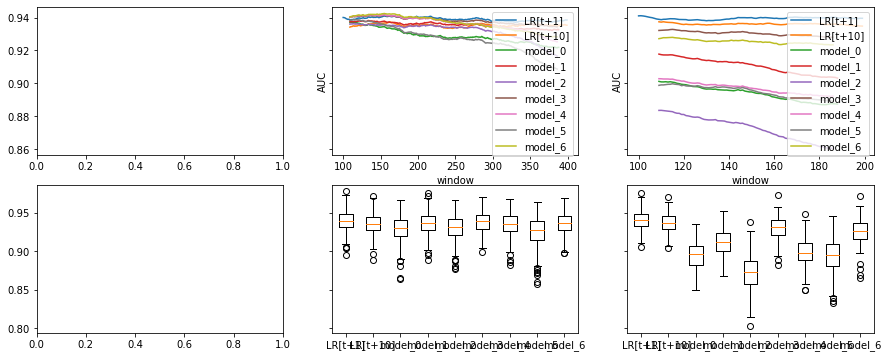

In [396]:
def experiment(models, wg):
#     for model in models:
#         wg.label_stride = model.label_stride
#         handler = train_lr_decay(model, wg)
#         handler.best()
    _, axs = plt.subplots(ncols=3, nrows=2, sharey='row', figsize=(15,6))
#     plot('train', models, axs=[axs[0][0], axs[1][0], axs[2][0]])
    plot('val',   models, axs=[axs[0][1], axs[1][1]])
    plot('test',  models, axs=[axs[0][2], axs[1][2]])

model_a0a.label_stride = model_a0b.label_stride = 9
for model in models:
    model.label_stride = 38
model_a6.label_stride = 53
experiment([model_a0a, model_a0b] + models[:-1], wg_tmp)

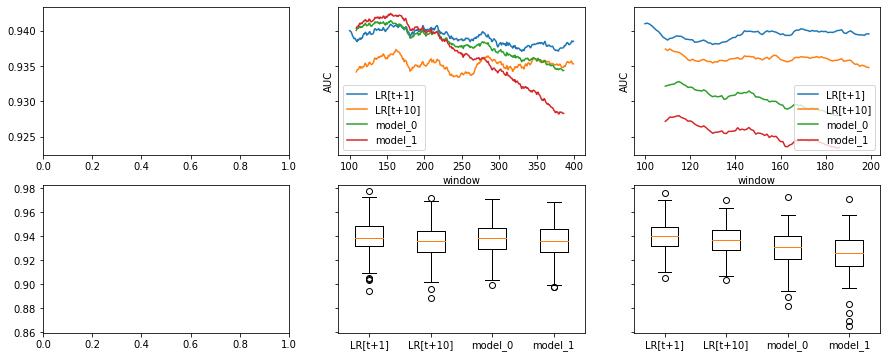

In [398]:
modelz = [model_a0a, model_a0b] + models[:-1]
experiment([modelz[3], modelz[6]], wg_tmp)

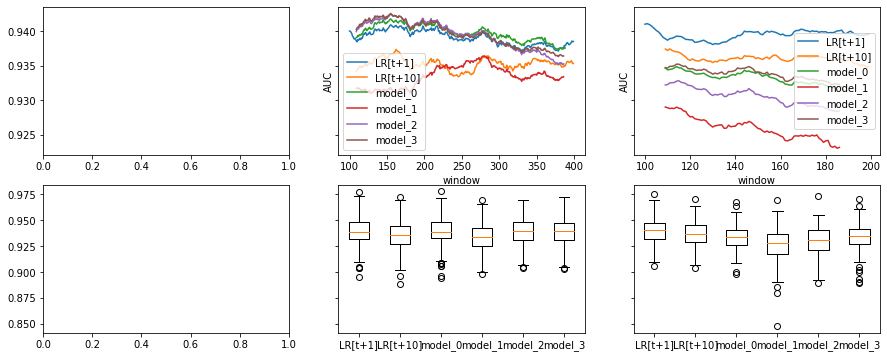

In [379]:
modelz = [model_a0a, model_a0b] + models[:-1]
experiment([modelz[0], ], wg_tmp)

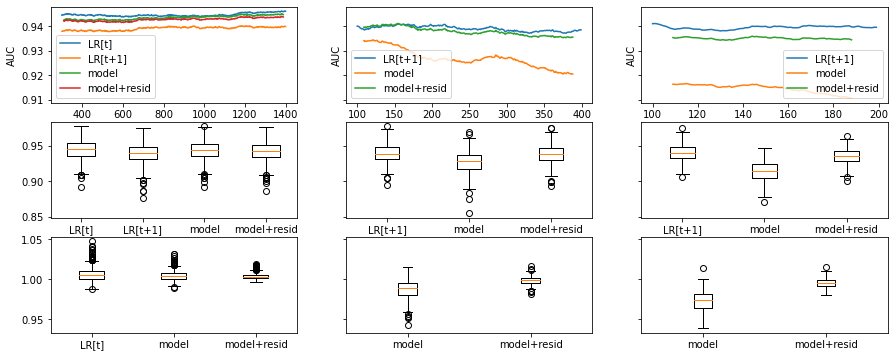

In [344]:
def plot(set_type, model, axs):
    rolling = 300 if set_type == 'train' else 100
    wg_tmp.plot(model=model, model_data_fn=None, last_train=False, lr0=False, lr_t0=set_type=='train',
                set_type=set_type, no_lr=False, model_resid=True, rolling=rolling, axs=axs,
                box_mean_dist_from='LR[t+1]', plot_box_auc=True)
# state_a.last()
# wg_tmp.plot(model=model_a, model_data_fn=None, last_train=False, lr0=False, set_type='val', no_lr=True)
# handler_a1.best()
# model_a1 = m_agg.LrConv(conv_features=agg_dim*bins, conv_width=10, lr_features=10+1, 
#                        conv_out=8, conv_layers=1, mlp_layers=2, resid=True,
#                        conv_arg_map={'batch_norm': False, 'dropout':False, 'fc_layers': 1, 
#                                      'pool_stride': 2, 'pool_width': 1,
#                                      'conv_out_feature_div': 12.5*2},
#                        mlp_arg_map={'batch_norm': False, 'dropout':False})

# print(model_a1.forward((torch.rand(1, 10, 204), torch.rand(1, 10, 11))))

_, axs = plt.subplots(ncols=3, nrows=3, sharey='row', figsize=(15,6))
plot('train', model_a0a, axs=[axs[0][0], axs[1][0], axs[2][0]])
plot('val',   model_a0a, axs=[axs[0][1], axs[1][1], axs[2][1]])
plot('test',  model_a0a, axs=[axs[0][2], axs[1][2], axs[2][2]])



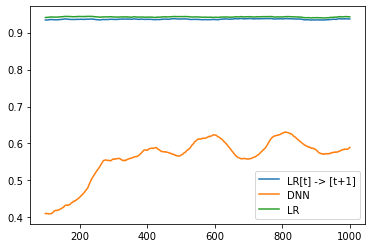

In [17]:
from sklearn import linear_model
import sklearn.metrics as metrics 
import matplotlib.pyplot as plt
import pandas as pd

def split_chunks(df, wg):
    chunks = df.shape[0] // wg.chunk_size
    result = []
    for chunk_id in range(chunks):
        result.append(df[chunk_id * wg.chunk_size:(chunk_id + 1) * wg.chunk_size])
        
    return result

train_df = split_chunks(wg_tmp.train_df, wg_tmp)
lr = linear_model.LogisticRegression()
lr.fit(train_df[1][wg_tmp.value_columns], train_df[1][wg_tmp.label_columns])
    
def measure_lr(lr, dat, rolling=100, weights=None):
    lr_aucs = []
    for lrp, df in dat:
        if weights != None:
            lr.coef_ = weights[:-1].reshape(1, -1).detach().numpy()
            lr.intercept_ = weights[-1].detach().numpy()
        else:
            lr.coef_ = lrp[:-1].reshape(1, -1).detach().numpy()
            lr.intercept_ = lrp[-1].detach().numpy()
        yhat = lr.predict_proba(df[wg_tmp.value_columns])
        lr_aucs.append(metrics.roc_auc_score(df[wg_tmp.label_columns], yhat[:, 1]))
    return pd.DataFrame(data=lr_aucs).rolling(rolling).mean()

def measure_model(model, dat, lr, rolling=100):
    model.eval()
    with torch.no_grad():
        model_aucs = []
        for (x, target), df in dat:
#             lrhat = model.forward(x).detach().numpy().reshape(-1) + target.detach().numpy().reshape(-1)
#             lrhat = target.detach().numpy().reshape(-1)
            lrhat = model.forward(x).detach().numpy().reshape(-1)
            lr.coef_ = lrhat[:-1].reshape(1, -1)
            lr.intercept_ = lrhat[-1]
            
            yhat = lr.predict_proba(df[wg_tmp.value_columns])
            
            model_aucs.append(metrics.roc_auc_score(df[wg_tmp.label_columns], yhat[:, 1]))
        return pd.DataFrame(data=model_aucs).rolling(rolling).mean()
    
sample_len = 1000
    
dat = list(zip(wg_tmp.train_lr[:-1, 0, :], train_df[1:]))
plt.plot(measure_lr(lr, dat[:sample_len]), label='LR[t] -> [t+1]')

def prepare_model_input(wg, model):
    ts_chunks = []
    lr_pred = []
    x = []
    for k in range(len(wg.train_agges) - (model.conv_width + 1)):
        agg = wg.train_agges[k:k + model.conv_width, 0, :]
        lr_v  = wg.train_lr[k:k + model.conv_width, 0, :]
        target  = wg.train_lr[k + model.conv_width, 0, :]
        x.append(((agg.reshape(1, *agg.shape), lr_v.reshape(1, *lr_v.shape)), target))
        
    return x

x = prepare_model_input(wg_tmp, model_a)

dat = list(zip(x[:-1], train_df[1:]))
plt.plot(measure_model(model_a, dat[:sample_len], lr), label='DNN')

# dat = list(zip(wg_tmp.train_lr[:-1, 0, :], train_df[:-1]))
# plt.plot(measure_lr(lr, dat[:sample_len], weights=wg_tmp.train_lr[0, 0, :]), label='first LR')

dat = list(zip(wg_tmp.train_lr[:-1, 0, :], train_df[:-1]))
plt.plot(measure_lr(lr, dat[:sample_len]), label='LR')

plt.legend()

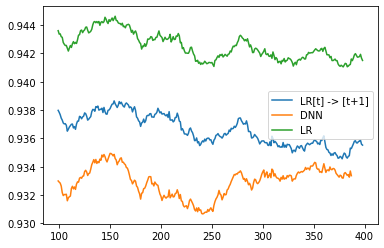

In [25]:
from sklearn import linear_model
import sklearn.metrics as metrics 
import matplotlib.pyplot as plt
import pandas as pd

def split_chunks(df, wg):
    chunks = df.shape[0] // wg.chunk_size
    result = []
    for chunk_id in range(chunks):
        result.append(df[chunk_id * wg.chunk_size:(chunk_id + 1) * wg.chunk_size])
        
    return result

val_df = split_chunks(wg_tmp.val_df, wg_tmp)
lr = linear_model.LogisticRegression()
lr.fit(val_df[1][wg_tmp.value_columns], val_df[1][wg_tmp.label_columns])
    
def measure_lr(lr, dat, rolling=100, weights=None):
    lr_aucs = []
    for lrp, df in dat:
        if weights != None:
            lr.coef_ = weights[:-1].reshape(1, -1).detach().numpy()
            lr.intercept_ = weights[-1].detach().numpy()
        else:
            lr.coef_ = lrp[:-1].reshape(1, -1).detach().numpy()
            lr.intercept_ = lrp[-1].detach().numpy()
        yhat = lr.predict_proba(df[wg_tmp.value_columns])
        lr_aucs.append(metrics.roc_auc_score(df[wg_tmp.label_columns], yhat[:, 1]))
    return pd.DataFrame(data=lr_aucs).rolling(rolling).mean()

def measure_model(model, dat, lr, rolling=100):
    model.eval()
    with torch.no_grad():
        model_aucs = []
        for (x, target), df in dat:
#             lrhat = model.forward(x).detach().numpy().reshape(-1) + target.detach().numpy().reshape(-1)
            lrhat = target.detach().numpy().reshape(-1)

            lr.coef_ = lrhat[:-1].reshape(1, -1)
            lr.intercept_ = lrhat[-1]
            
            yhat = lr.predict_proba(df[wg_tmp.value_columns])
            
            model_aucs.append(metrics.roc_auc_score(df[wg_tmp.label_columns], yhat[:, 1]))
        return pd.DataFrame(data=model_aucs).rolling(rolling).mean()
    
sample_len = 5000
    
dat = list(zip(wg_tmp.val_lr[:-1, 0, :], val_df[1:]))
plt.plot(measure_lr(lr, dat[:sample_len]), label='LR[t] -> [t+1]')

def prepare_model_input(wg, model):
    ts_chunks = []
    lr_pred = []
    x = []
    for k in range(len(wg.val_agges) - (model.conv_width + 1)):
        agg = wg.val_agges[k:k + model.conv_width, 0, :]
        lr_v  = wg.val_lr[k:k + model.conv_width, 0, :]
        target  = wg.val_lr[k + model.conv_width, 0, :]
        x.append(((agg.reshape(1, *agg.shape), lr_v.reshape(1, *lr_v.shape)), target))
        
    return x

x = prepare_model_input(wg_tmp, model)

dat = list(zip(x[:-1], val_df[1:]))
plt.plot(measure_model(model, dat[:sample_len], lr), label='DNN')

# dat = list(zip(wg_tmp.val_lr[:-1, 0, :], val_df[:-1]))
# plt.plot(measure_lr(lr, dat[:sample_len], weights=wg_tmp.val_lr[2, 0, :]), label='first val LR')

dat = list(zip(wg_tmp.val_lr[:-1, 0, :], val_df[:-1]))
plt.plot(measure_lr(lr, dat[:sample_len]), label='LR')


# dat = list(zip(wg_tmp.val_lr[:-1, 0, :], val_df[:-1]))
# plt.plot(measure_lr(lr, dat[:sample_len], weights=wg_tmp.train_lr[-1, 0, :]), label='last train LR')

plt.legend()

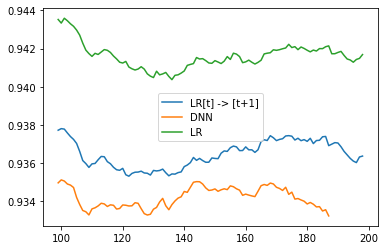

In [26]:
from sklearn import linear_model
import sklearn.metrics as metrics 
import matplotlib.pyplot as plt
import pandas as pd

def split_chunks(df, wg):
    chunks = df.shape[0] // wg.chunk_size
    result = []
    for chunk_id in range(chunks):
        result.append(df[chunk_id * wg.chunk_size:(chunk_id + 1) * wg.chunk_size])
        
    return result

test_df = split_chunks(wg_tmp.test_df, wg_tmp)
lr = linear_model.LogisticRegression()
lr.fit(test_df[1][wg_tmp.value_columns], test_df[1][wg_tmp.label_columns])
    
def measure_lr(lr, dat, rolling=100, weights=None):
    lr_aucs = []
    for lrp, df in dat:
        if weights != None:
            lr.coef_ = weights[:-1].reshape(1, -1).detach().numpy()
            lr.intercept_ = weights[-1].detach().numpy()
        else:
            lr.coef_ = lrp[:-1].reshape(1, -1).detach().numpy()
            lr.intercept_ = lrp[-1].detach().numpy()
        yhat = lr.predict_proba(df[wg_tmp.value_columns])
        lr_aucs.append(metrics.roc_auc_score(df[wg_tmp.label_columns], yhat[:, 1]))
    return pd.DataFrame(data=lr_aucs).rolling(rolling).mean()

def measure_model(model, dat, lr, rolling=100):
    model.eval()
    with torch.no_grad():
        model_aucs = []
        for (x, target), df in dat:
#             lrhat = model.forward(x).detach().numpy().reshape(-1) + target.detach().numpy().reshape(-1)
            lrhat = target.detach().numpy().reshape(-1)
    
            lr.coef_ = lrhat[:-1].reshape(1, -1)
            lr.intercept_ = lrhat[-1]
            
            yhat = lr.predict_proba(df[wg_tmp.value_columns])
            
            model_aucs.append(metrics.roc_auc_score(df[wg_tmp.label_columns], yhat[:, 1]))
        return pd.DataFrame(data=model_aucs).rolling(rolling).mean()
    
sample_len = 5000
    
dat = list(zip(wg_tmp.test_lr[:-1, 0, :], test_df[1:]))
plt.plot(measure_lr(lr, dat[:sample_len]), label='LR[t] -> [t+1]')

def prepare_model_input(wg, model):
    ts_chunks = []
    lr_pred = []
    x = []
    for k in range(len(wg.test_agges) - (model.conv_width + 1)):
        agg = wg.test_agges[k:k + model.conv_width, 0, :]
        lr_v  = wg.test_lr[k:k + model.conv_width, 0, :]
        target  = wg.test_lr[k + model.conv_width, 0, :]
        x.append(((agg.reshape(1, *agg.shape), lr_v.reshape(1, *lr_v.shape)), target))
        
    return x

x = prepare_model_input(wg_tmp, model)

dat = list(zip(x[:-1], test_df[1:]))
plt.plot(measure_model(model, dat[:sample_len], lr), label='DNN')

# dat = list(zip(wg_tmp.test_lr[:-1, 0, :], test_df[:-1]))
# plt.plot(measure_lr(lr, dat[:sample_len], weights=wg_tmp.test_lr[2, 0, :]), label='first test LR')

dat = list(zip(wg_tmp.test_lr[:-1, 0, :], test_df[:-1]))
plt.plot(measure_lr(lr, dat[:sample_len]), label='LR')


# dat = list(zip(wg_tmp.test_lr[:-1, 0, :], test_df[:-1]))
# plt.plot(measure_lr(lr, dat[:sample_len], weights=wg_tmp.train_lr[-1, 0, :]), label='last train LR')

plt.legend()

tensor([-0.0849, -0.0510, -0.0341, -0.0052, -0.0332, -0.0625,  0.0060,  0.0942,
         0.0362, -0.0078,  1.1280])

/home/rwiatr/anaconda3/envs/env-phd/lib/python3.8/site-packages/torch/autograd/__init__.py:130: UserWarning: CUDA initialization: Found no NVIDIA driver on your system. Please check that you have an NVIDIA GPU and installed a driver from http://www.nvidia.com/Download/index.aspx (Triggered internally at  /opt/conda/conda-bld/pytorch_1607370117127/work/c10/cuda/CUDAFunctions.cpp:100.)
  Variable._execution_engine.run_backward(


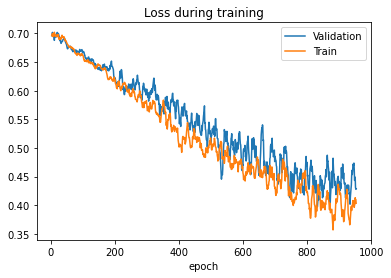

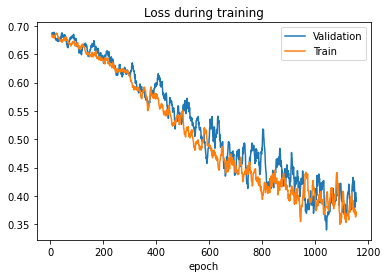

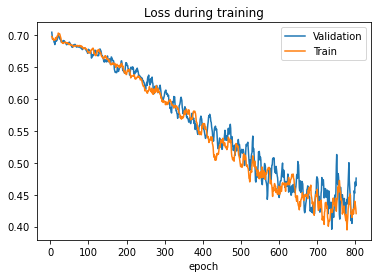

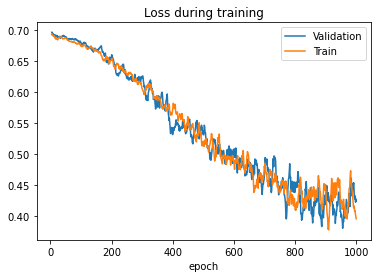

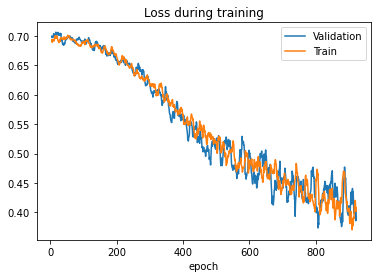

...

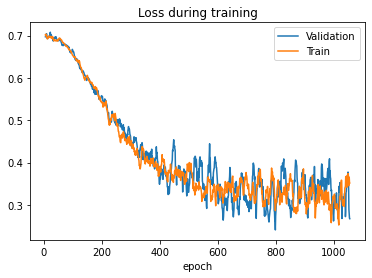

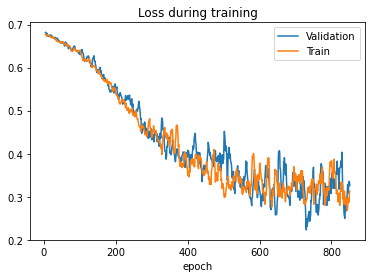

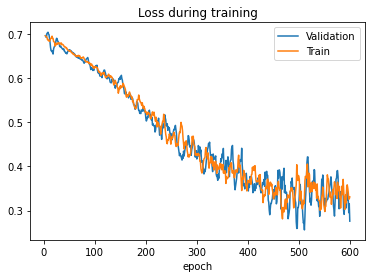

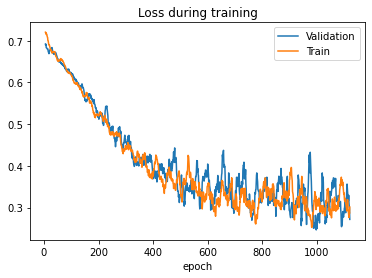

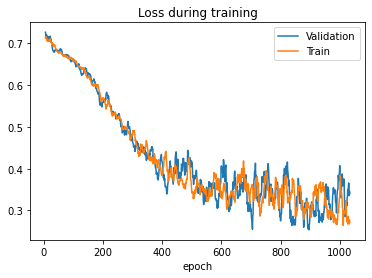

In [3]:
import aggets.model.simple as simple
import aggets.train as train


models = []
for w in wg.windows:
    model = simple.mlp(features=10, num_layers=2, hidden=10)
    bce = nn.BCEWithLogitsLoss()
    crit = lambda yhat, y: bce(yhat.view(-1), y.view(-1))
    train.train_model(model, w, log_every=4000, max_epochs=4000, criterion=crit, patience=120)
    plt.show()
    models.append(model)


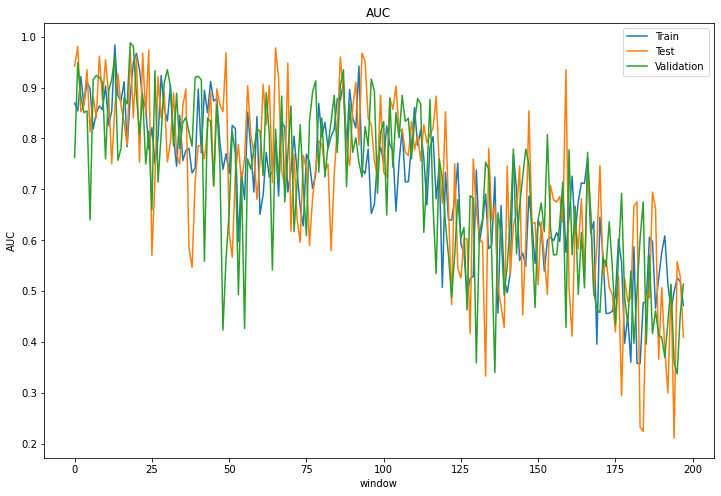

In [4]:
wg.plot(simple.classify(models[0]))

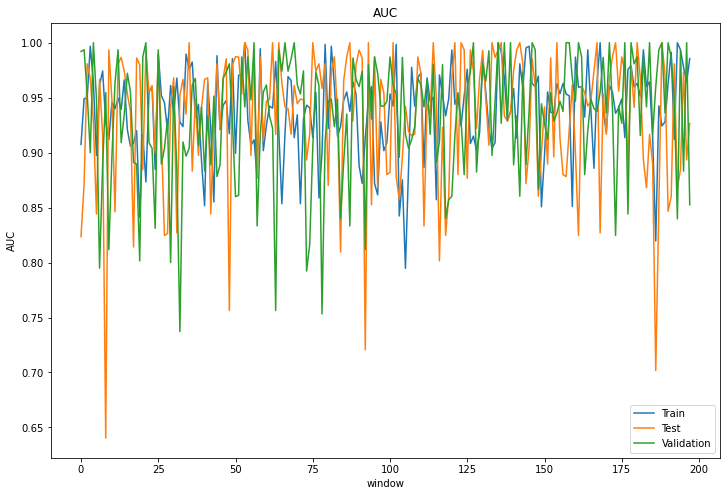

In [5]:
wg.plots([simple.classify(model) for model in models])

In [13]:
import aggets.agge as agge
enc = agge.AggregateEncoder()
df = data['df'][:1000]
array = enc.fit_transform(df.drop(columns=['class']), df['class'])

../aggets/agge.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  feature_column['y'] = y
../aggets/agge.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  feature_column['y'] = y
../aggets/agge.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  feature_column['

In [20]:
import numpy as np
for feature in array:
    print(np.unique(feature))

[0.  0.5 1. ]
[0.  0.5 1. ]
[0.  0.5 1. ]
[0.  0.5 1. ]
[0.  0.5 1. ]
[0.         0.5        0.66666667 1.        ]
[0.  0.5 1. ]
[0.  0.5 1. ]
[0.  0.5 1. ]
[0.  0.5 1. ]


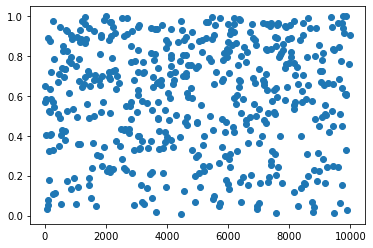

In [45]:
# df['att1'].scatter()

import matplotlib.pyplot as plt
tmp = df.sample(frac=0.1)#[1000:1100]
plt.scatter(tmp[tmp['class'] == 1].index, tmp[tmp['class'] == 1]['att7'])
# plt.scatter(tmp[tmp['class'] == 0].index, tmp[tmp['class'] == 0]['att2'])
plt.show()

In [53]:
from sklearn import linear_model
lr = linear_model.LogisticRegression()
lr.fit(df[:100][['att1']], df[:100]['class'])
lr.predict_proba(df[:100][['att1']])[:, 1]

array([0.46097479, 0.43026533, 0.41984764, 0.43099096, 0.4252512 ,
       0.39684461, 0.57547351, 0.50179116, 0.47461888, 0.58249936,
       0.45292423, 0.4407755 , 0.52216096, 0.61013314, 0.53321798,
       0.40088177, 0.5615848 , 0.48926738, 0.37772553, 0.54248462,
       0.46978692, 0.42848635, 0.37948378, 0.45462247, 0.37903943,
       0.59449024, 0.47996429, 0.46260986, 0.37873324, 0.45182714,
       0.41256508, 0.45059819, 0.6081276 , 0.49876524, 0.45639021,
       0.55089039, 0.52264382, 0.52575685, 0.54712675, 0.4353789 ,
       0.57957921, 0.540417  , 0.54649454, 0.42041313, 0.41534727,
       0.45405913, 0.43558638, 0.50799351, 0.53954757, 0.50286137,
       0.48610672, 0.5640482 , 0.58330726, 0.37030902, 0.53148134,
       0.51067159, 0.38618048, 0.36744901, 0.60290951, 0.55225367,
       0.37321435, 0.58342208, 0.4402822 , 0.58665902, 0.41057933,
       0.60710549, 0.60635561, 0.51512998, 0.39683242, 0.4037915 ,
       0.3937861 , 0.5589043 , 0.37460404, 0.43681345, 0.41084

In [7]:
import aggets.agge as agge
import aggets.ds.hyper_f_load as hyper_f_load

data = hyper_f_load.load_discrete_df()
df = data['df']

enc = agge.AggregateEncoder()
enc.fit(df.drop(columns=['class']), df['class'], bin_count=3)
# encoded = np.concatenate(array, axis=1)

../aggets/agge.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  feature_column['y'] = y
../aggets/agge.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  feature_column['y'] = y
../aggets/agge.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  feature_column['y'] = y
../aggets/agge.py:17: SettingWithCopyWarnin

In [24]:
import numpy as np
np.concatenate((enc.models['att1'].to_numpy().reshape(30), enc.models['att1'].to_numpy().reshape(-1)))

array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.15100305,
       0.        , 0.        , 0.        , 0.        , 0.50485436,
       0.46603436, 0.        , 0.        , 0.        , 0.8138911 ,
       0.        , 0.        , 1.        , 0.        , 0.        ,
       0.        , 1.        , 1.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.15100305,
       0.        , 0.        , 0.        , 0.        , 0.50485436,
       0.46603436, 0.        , 0.        , 0.        , 0.8138911 ,
       0.        , 0.        , 1.        , 0.        , 0.        ,
       0.        , 1.        , 1.        , 0.        , 0.        ])

In [36]:
np.pad(enc.models['att1'].to_numpy().reshape(30), 35, mode='constant', constant_values=0)

array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.15100305,
       0.        , 0.        , 0.        , 0.        , 0.50485436,
       0.46603436, 0.        , 0.        , 0.        , 0.8138911 ,
       0.        , 0.        , 1.        , 0.        , 0.        ,
       0.        , 1.        , 1.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.     

In [50]:
import pandas as pd

total_size = encoded.shape[0]
encoded = pd.DataFrame(data=encoded, columns=[f'c_{i}' for i in range(10)])
train = encoded[0:total_size//2]
test = encoded[total_size//2:total_size//2 + total_size//4]
val = encoded[total_size//2 + total_size//4:]

In [51]:
CONV_WIDTH = 10
LABEL_WIDTH = 24
INPUT_WIDTH = LABEL_WIDTH + (CONV_WIDTH - 1)

conv_window = window.WindowGenerator(
    train_df = train,
    val_df = test,
    test_df = val,
    input_width=INPUT_WIDTH,
    label_width=LABEL_WIDTH,
    shift=1
)
conv_window

Total window size: 34
Input indices: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32]
Label indices: [10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33]
Label column name(s): None

epoch 0 batch 1000 loss=0.0683, MTL=0.0789, MVL=nan				
epoch 0 batch 2000 loss=0.0676, MTL=0.0738, MVL=nan				
epoch 0 batch 3000 loss=0.0679, MTL=0.0722, MVL=nan				
epoch 0 batch 4000 loss=0.0685, MTL=0.0713, MVL=nan				
epoch 0 batch 5000 loss=0.0678, MTL=0.0708, MVL=nan				
epoch 0 batch 6000 loss=0.0678, MTL=0.0704, MVL=nan				
epoch 0 batch 7000 loss=0.0679, MTL=0.0702, MVL=nan				
epoch 0 batch 8000 loss=0.0677, MTL=0.07, MVL=nan				
epoch 0 batch 9000 loss=0.0685, MTL=0.0699, MVL=nan				
epoch 0 batch 10000 loss=0.0682, MTL=0.0698, MVL=nan				
epoch 0 batch 11000 loss=0.0679, MTL=0.0697, MVL=nan				
epoch 0 batch 12000 loss=0.0677, MTL=0.0696, MVL=nan				
epoch 0 batch 13000 loss=0.068, MTL=0.0695, MVL=nan				
epoch 0 batch 14000 loss=0.0689, MTL=0.0695, MVL=nan				
epoch 0 batch 15000 loss=0.068, MTL=0.0694, MVL=nan				
epoch 1 batch 16000 loss=0.0682, MTL=0.0687, MVL=0.0687				
epoch 1 batch 17000 loss=0.069, MTL=0.0687, MVL=0.0687				
epoch 1 batch 18000 loss=0.0692, MTL=0.

epoch 8 batch 139000 loss=0.0686, MTL=0.0687, MVL=0.0687				
epoch 8 batch 140000 loss=0.0683, MTL=0.0687, MVL=0.0687				
epoch 9 batch 141000 loss=0.0672, MTL=0.0687, MVL=0.0687				
epoch 9 batch 142000 loss=0.0681, MTL=0.0687, MVL=0.0687				
epoch 9 batch 143000 loss=0.0681, MTL=0.0687, MVL=0.0687				
epoch 9 batch 144000 loss=0.0687, MTL=0.0687, MVL=0.0687				
epoch 9 batch 145000 loss=0.0695, MTL=0.0687, MVL=0.0687				
epoch 9 batch 146000 loss=0.0686, MTL=0.0687, MVL=0.0687				
epoch 9 batch 147000 loss=0.0694, MTL=0.0687, MVL=0.0687				
epoch 9 batch 148000 loss=0.0689, MTL=0.0687, MVL=0.0687				
epoch 9 batch 149000 loss=0.0685, MTL=0.0687, MVL=0.0687				
epoch 9 batch 150000 loss=0.0697, MTL=0.0687, MVL=0.0687				
epoch 9 batch 151000 loss=0.0677, MTL=0.0687, MVL=0.0687				
epoch 9 batch 152000 loss=0.068, MTL=0.0687, MVL=0.0687				
epoch 9 batch 153000 loss=0.0692, MTL=0.0687, MVL=0.0687				
epoch 9 batch 154000 loss=0.0686, MTL=0.0687, MVL=0.0687				
epoch 9 batch 155000 loss

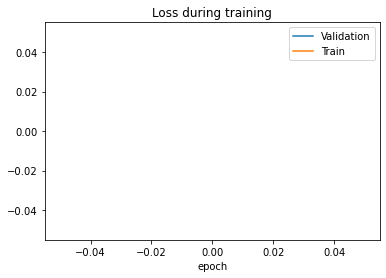

In [52]:
import aggets.train as train
import aggets.model.simple as simple

model = simple.conv_1d(CONV_WIDTH, features=10, hidden=10, out_features=10)
train.train_window_model(model, conv_window, max_epochs=100, patience=5)

In [54]:
# select window [      train  ]
# divide window [     [T][T+1]]
# aggregate [:T+1]
# 

In [76]:
(torch.rand(32, 10) ** 2).sum(dim=1).shape

torch.Size([32])